In [3]:
import sys

import numpy as np
import matplotlib.pyplot as plt
import math
import random
import csv
import pandas as pd

In [12]:
# define functions


def cartesian_to_spherical(x, y, z):
    r = np.sqrt(x**2 + y**2 + z**2)
    phi = np.arctan2(y, x)
    theta = np.arccos(z / r)
    return r, phi, theta

def convert_points_to_spherical(points):
    points_set_polars = []
    for point in points:
        x = point[0]
        y = point[1]
        z = point[2]
        r, phi, theta = cartesian_to_spherical(x, y, z)
        points_set_polars.append((r, phi, theta))
    return np.array(points_set_polars)

def spherical_to_cartesian(r, phi, theta):
    x = r * np.cos(phi) * np.sin(theta)
    y = r * np.sin(phi) * np.sin(theta)
    z = r * np.cos(theta)
    return x, y, z

def convert_points_to_cartesian(points):
    points_set_cartesians = []
    for point in points:
        r = point[0]
        phi = point[1]
        theta = point[2]
        x, y, z = spherical_to_cartesian(r, phi, theta)
        points_set_cartesians.append((x, y, z))
    return np.array(points_set_cartesians)

#function that computes the angle between two vectors

def angle_between_vectors(v1, v2):
    dot_product = np.dot(v1, v2)
    magnitude_v1 = np.linalg.norm(v1)
    magnitude_v2 = np.linalg.norm(v2)
    cosine_angle = dot_product / (magnitude_v1 * magnitude_v2)
    angle_rad = np.arccos(np.clip(cosine_angle, -1.0, 1.0))
    return angle_rad


def peak_value(N, alpha):
    # computes expected mean based on cap area
    return N * (1 - np.cos(alpha)) / 2

# Function to save indices to .txt file

def save_indices_to_file(indices, pmt_set_num):
    filename = f"random_indices_PMTSet{pmt_set_num}.txt"
    np.savetxt(filename, indices, fmt='%d')
    print(f"Saved random indices for PMTSet {pmt_set_num} to {filename}\n")


def get_active_positions(indices_file, all_pos_cart, all_pos_sph):
    indices = np.loadtxt(indices_file, dtype=int)
    print(indices.shape)
    print(all_pos_cart.shape)
    print(all_pos_sph.shape)
    active_positions_cart = all_pos_cart[indices]
    active_positions_sph = all_pos_sph[indices]
    return active_positions_cart, active_positions_sph

def get_active_positions_runs(run_number):
    active_pos_sph = np.genfromtxt(f'{run_number}_phi_theta.csv', delimiter=',', skip_header=1)
    active_pos_cart = convert_points_to_cartesian(active_pos_sph)
    print(f'Active positions for run {run_number}: {active_pos_sph}')
    print(f'Position of first PMT in sphericals is : {active_pos_sph[0]}')
    print(f'Position of first PMT in cartesians is : {active_pos_cart[0]}')

    return active_pos_cart, active_pos_sph


def plot_pmt_map(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, set_name):
    plt.scatter(active_pos_sph[:, 1], active_pos_sph[:, 2], s=0.5, color='blue')  # Original points
    plt.scatter(nodes_pos_sph[:, 1], nodes_pos_sph[:, 2], s=3, color='red', label='Cap Nodes')  # Clicked points in red

    plt.xlabel('Phi')
    plt.ylabel('Theta')
    plt.title('PMTs and Nodes')

    vector_sum = np.sum(active_pos_cart, axis=0)
    vector_sum_length = np.linalg.norm(vector_sum)

    # Add a text box with the value of vectorial_sum and its length
    # text = f'Vectorial Sum: {vector_sum}\nLength: {vector_length:.2f}'
    # plt.text(0.05, 0.95, text, transform=plt.gca().transAxes, va='top', bbox=dict(facecolor='white', alpha=0.5))

    plt.gca().set_aspect('equal', adjustable='box')
    plt.grid(True)
    plt.legend()

    plt.savefig(f'{set_name}_map.pdf', format='pdf')
    plt.show()

In [5]:
# define the actually important function

def compute_config_stats(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, set_name):
    plot_pmt_map(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, set_name)

    vector_sum = np.sum(active_pos_cart, axis=0)
    vector_sum_length = np.linalg.norm(vector_sum)

    pi_over_values = [3, 4, 6, 8, 10]

    stats_df = pd.DataFrame()
    stats_df['Metric'] = ['vector sum x','vector sum y','vector sum z',
                          'vector sum norm','total N', 'mean', 'median',
                          'variance', 'stdev', 'normalized stdev']

    print("Now looping over alpha values")

    for pi_over in pi_over_values:
        alpha = np.pi / pi_over
        points_in_cap_count = np.zeros(len(nodes_pos_cart), dtype=int)

        print("for alpha = pi / " + str(pi_over))
        print("Computing cap counts for alpha = pi / " + str(pi_over))

        for i in range(len(nodes_pos_cart)):
            cap_center = nodes_pos_cart[i]
            cap_center_polars = nodes_pos_sph[i]
            points_in_cap_set = []

            for j in range(len(active_pos_cart)):
                angle = angle_between_vectors(cap_center, active_pos_cart[j])
                if angle < alpha:
                    points_in_cap_set.append(active_pos_cart[j])

            points_in_cap_set = np.array(points_in_cap_set)
            points_in_cap_count[i] += len(points_in_cap_set)  # Accumulate count within each iteration

        print("Cap counts computed; now generating histogram and calculating stats ... ")

        N = len(active_pos_cart) # total number of on PMTs
        expected_mean = peak_value(N, alpha)

        # Compute histogram
        hist_values, bin_edges = np.histogram(points_in_cap_count, bins=np.arange(points_in_cap_count.max() + 2))

        # Plot histogram
        plt.bar(bin_edges[:-1], hist_values, width=0.5, align='center')

        # Set larger font sizes
        font_size = 16
        plt.xlabel('Number of points in cap', fontsize=font_size)
        plt.ylabel('Number of directions', fontsize=font_size)
        plt.title('Histogram of points in cap per direction', fontsize=font_size)
        plt.xticks(fontsize=font_size)
        plt.yticks(fontsize=font_size)

        # Find the first non-zero bin edge
        non_zero_index = np.nonzero(hist_values)[0][0]

        # Automatically adjust x-axis limits
        xmin = bin_edges[non_zero_index] - 20
        xmax = max(bin_edges) + 20
        plt.xlim(xmin, xmax)

        plt.grid(True)

        plt.axvline(x=expected_mean, color='red', linestyle='--', label='Exp Mean: {}'.format(expected_mean))

        alpha_str = f'alpha = pi/{pi_over}'

        # Compute the relevant statistics

        total_N = N
        mean_value = np.mean(points_in_cap_count)
        median_value = np.median(points_in_cap_count)
        variance_value = np.var(points_in_cap_count)
        stdev_value = np.sqrt(variance_value)
        normalized_stdev = stdev_value / mean_value


        # Plot mean, median, and variance as vertical lines
        plt.axvline(x=mean_value, color='green', linestyle='--', label='Mean: {:.2f}'.format(mean_value))
        plt.axvline(x=median_value, color='purple', linestyle='--', label='Median: {:.2f}'.format(median_value))

        # Add variance and normalized standard deviation to legend

        # Add legend with larger font size
        plt.legend(fontsize=font_size)
        plt.title("Stats, alpha = pi / " + str(pi_over), fontsize=font_size)

        # Save the plot with a larger font size
        plt.savefig(f'Stats_{set_name}_PiOver{pi_over}.pdf', format='pdf')
        plt.show()

        # Add the statistics to the DataFrame
        stats_df[alpha_str] = [
            vector_sum[0],
            vector_sum[1],
            vector_sum[2],
            vector_sum_length,
            total_N,
            mean_value,
            median_value,
            variance_value,
            stdev_value,
            normalized_stdev
        ]

        # %%
        # Save the DataFrame to CSV
        output_path = f'{set_name}_stats.csv'
        print(f"Saving CSV to: {output_path}")
        print(stats_df)
        stats_df.to_csv(output_path, index=False)
        print("CSV saved successfully.")

In [6]:
# Import PMT positions and normalize; check values

all_pos_cart = np.genfromtxt('pmt_positions.csv', delimiter=',', skip_header=1)
# PMT positions rescaled to have length 1; converted to spherical AFTER rescaling
all_pos_cart = all_pos_cart / np.linalg.norm(all_pos_cart, axis=1)[:, np.newaxis]
all_pos_sph = convert_points_to_spherical(all_pos_cart)

# Import nodes positions

nodes_pos_sph = np.genfromtxt('More_Nodes_Grid.csv', delimiter=',', skip_header=1)
nodes_pos_cart = convert_points_to_cartesian(nodes_pos_sph)

# TO DO - this is hard coded, maybe fix?
set_numbers = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]


Now working on PMT set 1
(9389,)
(9389, 3)
(9389, 3)


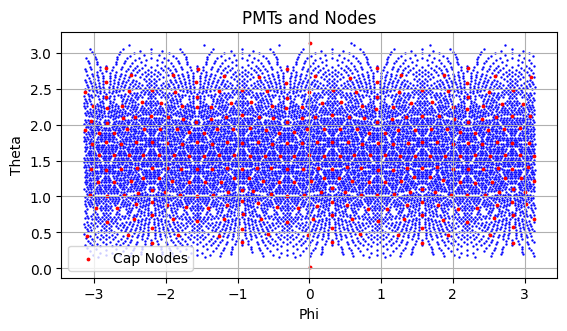

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


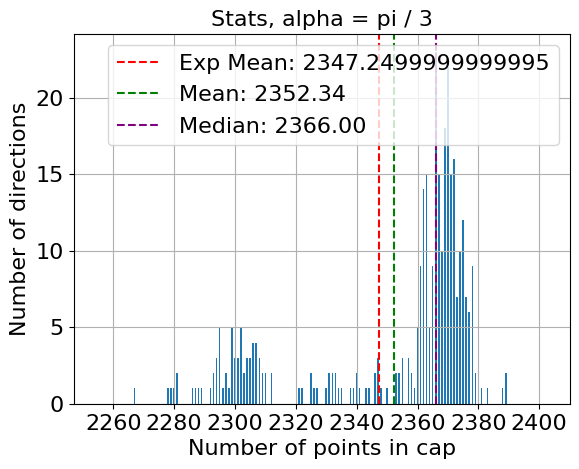

Saving CSV to: PMTSet1_stats.csv
             Metric  alpha = pi/3
0      vector sum x      0.828681
1      vector sum y     -1.474539
2      vector sum z    -66.459168
3   vector sum norm     66.480689
4           total N   9389.000000
5              mean   2352.339181
6            median   2366.000000
7          variance    814.241681
8             stdev     28.534920
9  normalized stdev      0.012130
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


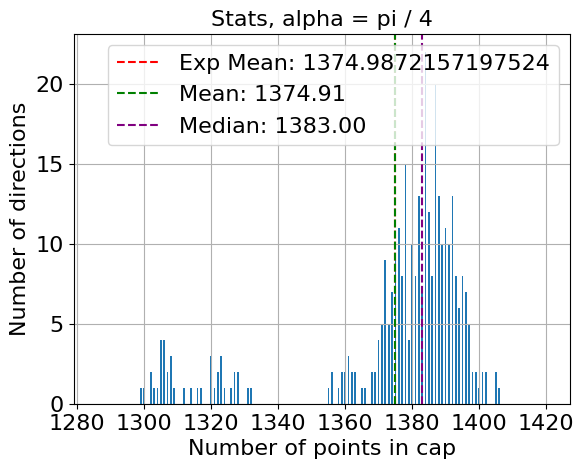

Saving CSV to: PMTSet1_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x      0.828681      0.828681
1      vector sum y     -1.474539     -1.474539
2      vector sum z    -66.459168    -66.459168
3   vector sum norm     66.480689     66.480689
4           total N   9389.000000   9389.000000
5              mean   2352.339181   1374.909357
6            median   2366.000000   1383.000000
7          variance    814.241681    595.924532
8             stdev     28.534920     24.411566
9  normalized stdev      0.012130      0.017755
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


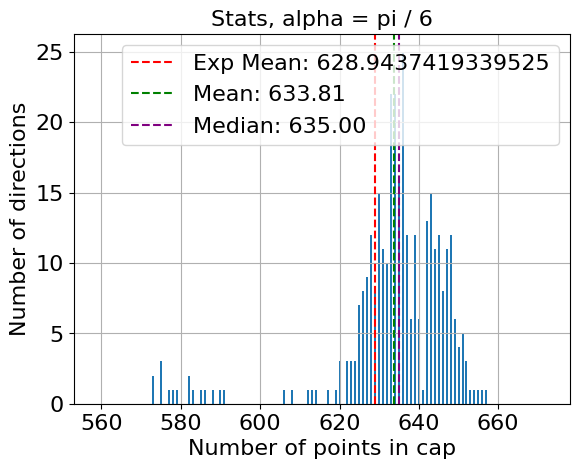

Saving CSV to: PMTSet1_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x      0.828681      0.828681      0.828681
1      vector sum y     -1.474539     -1.474539     -1.474539
2      vector sum z    -66.459168    -66.459168    -66.459168
3   vector sum norm     66.480689     66.480689     66.480689
4           total N   9389.000000   9389.000000   9389.000000
5              mean   2352.339181   1374.909357    633.812865
6            median   2366.000000   1383.000000    635.000000
7          variance    814.241681    595.924532    208.438665
8             stdev     28.534920     24.411566     14.437405
9  normalized stdev      0.012130      0.017755      0.022779
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


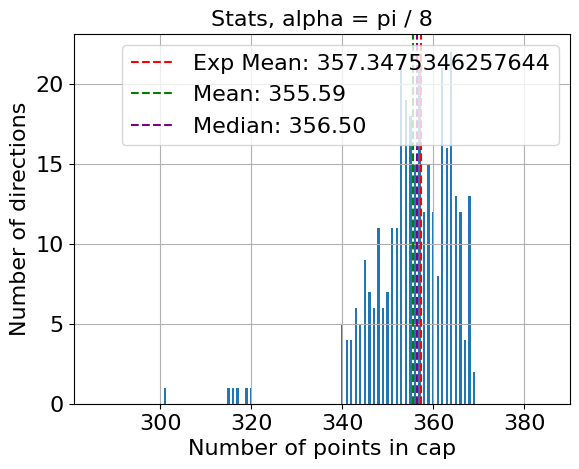

Saving CSV to: PMTSet1_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x      0.828681      0.828681      0.828681      0.828681
1      vector sum y     -1.474539     -1.474539     -1.474539     -1.474539
2      vector sum z    -66.459168    -66.459168    -66.459168    -66.459168
3   vector sum norm     66.480689     66.480689     66.480689     66.480689
4           total N   9389.000000   9389.000000   9389.000000   9389.000000
5              mean   2352.339181   1374.909357    633.812865    355.590643
6            median   2366.000000   1383.000000    635.000000    356.500000
7          variance    814.241681    595.924532    208.438665     81.528334
8             stdev     28.534920     24.411566     14.437405      9.029304
9  normalized stdev      0.012130      0.017755      0.022779      0.025392
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram 

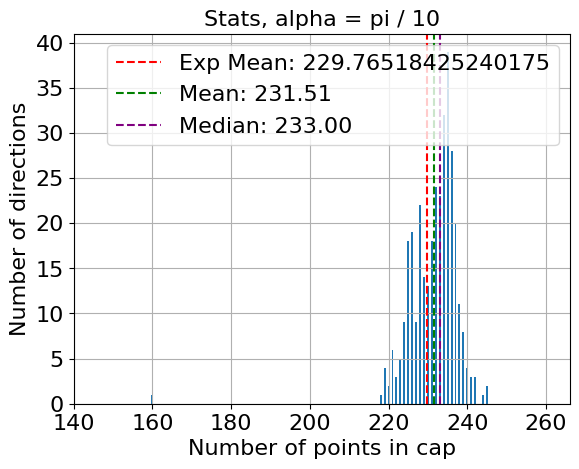

Saving CSV to: PMTSet1_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x      0.828681      0.828681      0.828681      0.828681   
1      vector sum y     -1.474539     -1.474539     -1.474539     -1.474539   
2      vector sum z    -66.459168    -66.459168    -66.459168    -66.459168   
3   vector sum norm     66.480689     66.480689     66.480689     66.480689   
4           total N   9389.000000   9389.000000   9389.000000   9389.000000   
5              mean   2352.339181   1374.909357    633.812865    355.590643   
6            median   2366.000000   1383.000000    635.000000    356.500000   
7          variance    814.241681    595.924532    208.438665     81.528334   
8             stdev     28.534920     24.411566     14.437405      9.029304   
9  normalized stdev      0.012130      0.017755      0.022779      0.025392   

   alpha = pi/10  
0       0.828681  
1      -1.474539  
2     -66.459168  
3      66.480689  
4 

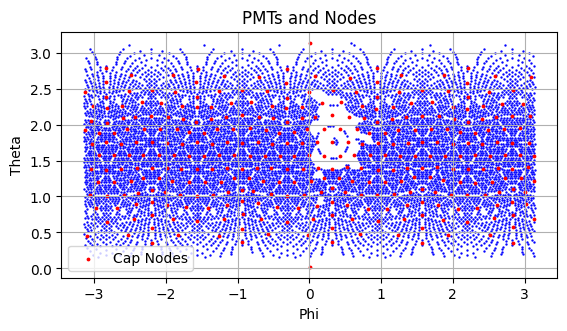

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


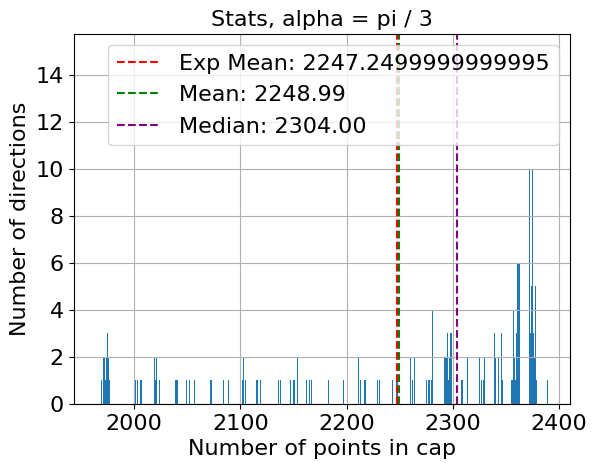

Saving CSV to: PMTSet2_stats.csv
             Metric  alpha = pi/3
0      vector sum x   -339.876107
1      vector sum y   -129.669151
2      vector sum z     25.062025
3   vector sum norm    364.634011
4           total N   8989.000000
5              mean   2248.985380
6            median   2304.000000
7          variance  20185.885751
8             stdev    142.077042
9  normalized stdev      0.063174
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


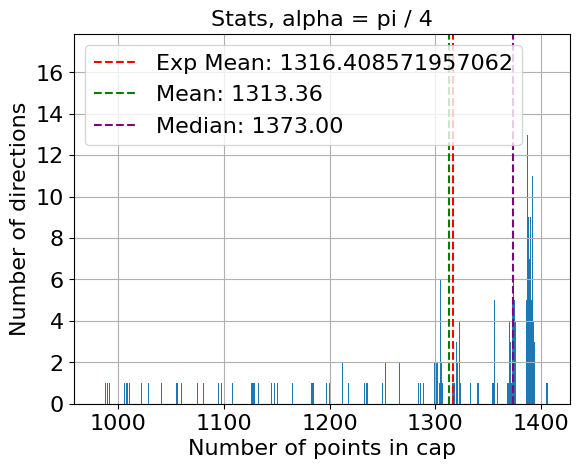

Saving CSV to: PMTSet2_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x   -339.876107   -339.876107
1      vector sum y   -129.669151   -129.669151
2      vector sum z     25.062025     25.062025
3   vector sum norm    364.634011    364.634011
4           total N   8989.000000   8989.000000
5              mean   2248.985380   1313.356725
6            median   2304.000000   1373.000000
7          variance  20185.885751  12231.323040
8             stdev    142.077042    110.595312
9  normalized stdev      0.063174      0.084208
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


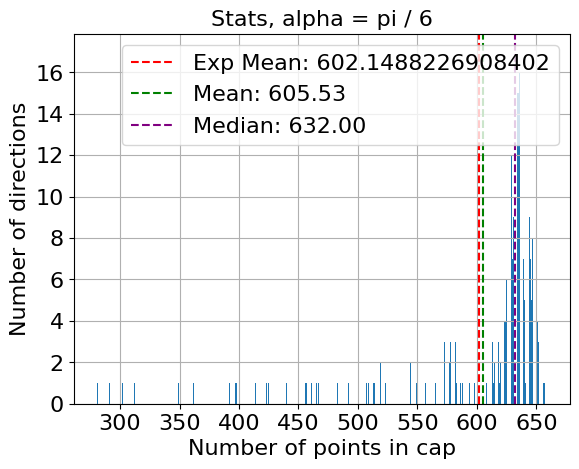

Saving CSV to: PMTSet2_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x   -339.876107   -339.876107   -339.876107
1      vector sum y   -129.669151   -129.669151   -129.669151
2      vector sum z     25.062025     25.062025     25.062025
3   vector sum norm    364.634011    364.634011    364.634011
4           total N   8989.000000   8989.000000   8989.000000
5              mean   2248.985380   1313.356725    605.529240
6            median   2304.000000   1373.000000    632.000000
7          variance  20185.885751  12231.323040   4812.009379
8             stdev    142.077042    110.595312     69.368648
9  normalized stdev      0.063174      0.084208      0.114559
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


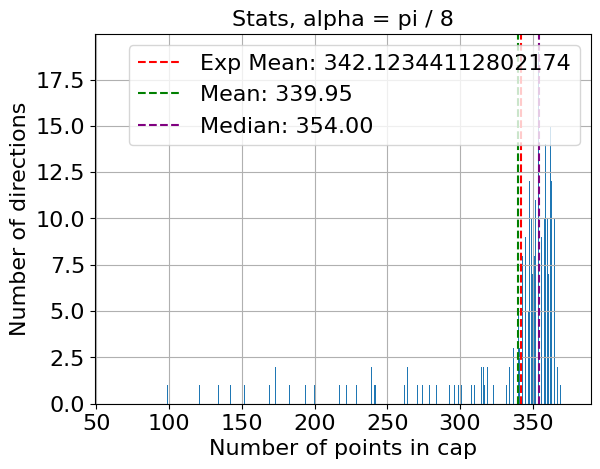

Saving CSV to: PMTSet2_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -339.876107   -339.876107   -339.876107   -339.876107
1      vector sum y   -129.669151   -129.669151   -129.669151   -129.669151
2      vector sum z     25.062025     25.062025     25.062025     25.062025
3   vector sum norm    364.634011    364.634011    364.634011    364.634011
4           total N   8989.000000   8989.000000   8989.000000   8989.000000
5              mean   2248.985380   1313.356725    605.529240    339.950292
6            median   2304.000000   1373.000000    632.000000    354.000000
7          variance  20185.885751  12231.323040   4812.009379   2049.105716
8             stdev    142.077042    110.595312     69.368648     45.267049
9  normalized stdev      0.063174      0.084208      0.114559      0.133158
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram 

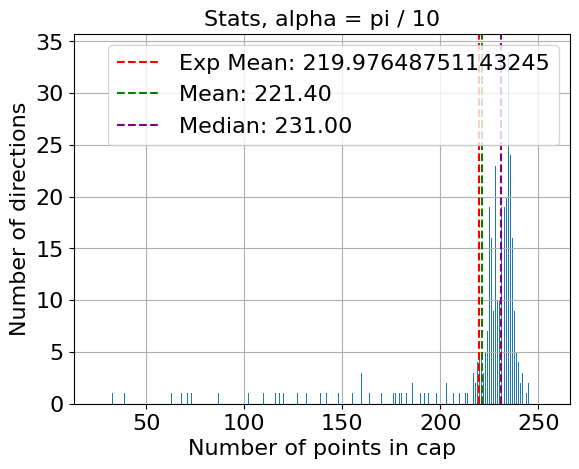

Saving CSV to: PMTSet2_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -339.876107   -339.876107   -339.876107   -339.876107   
1      vector sum y   -129.669151   -129.669151   -129.669151   -129.669151   
2      vector sum z     25.062025     25.062025     25.062025     25.062025   
3   vector sum norm    364.634011    364.634011    364.634011    364.634011   
4           total N   8989.000000   8989.000000   8989.000000   8989.000000   
5              mean   2248.985380   1313.356725    605.529240    339.950292   
6            median   2304.000000   1373.000000    632.000000    354.000000   
7          variance  20185.885751  12231.323040   4812.009379   2049.105716   
8             stdev    142.077042    110.595312     69.368648     45.267049   
9  normalized stdev      0.063174      0.084208      0.114559      0.133158   

   alpha = pi/10  
0    -339.876107  
1    -129.669151  
2      25.062025  
3     364.634011  
4 

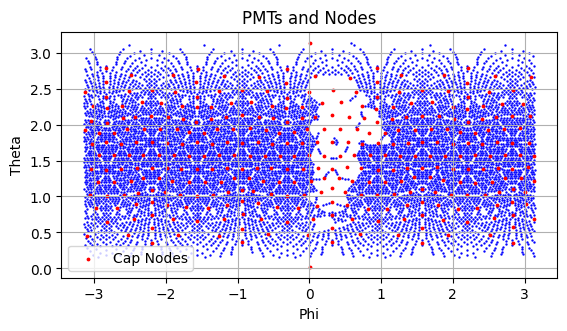

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


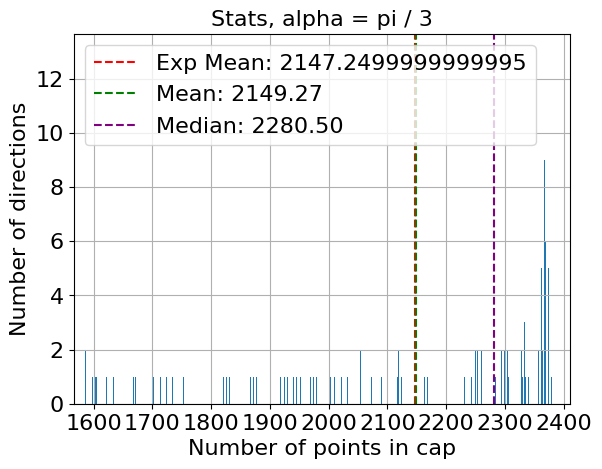

Saving CSV to: PMTSet3_stats.csv
             Metric  alpha = pi/3
0      vector sum x   -614.538217
1      vector sum y   -277.841261
2      vector sum z     52.890584
3   vector sum norm    676.498633
4           total N   8589.000000
5              mean   2149.274854
6            median   2280.500000
7          variance  63541.982935
8             stdev    252.075352
9  normalized stdev      0.117284
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


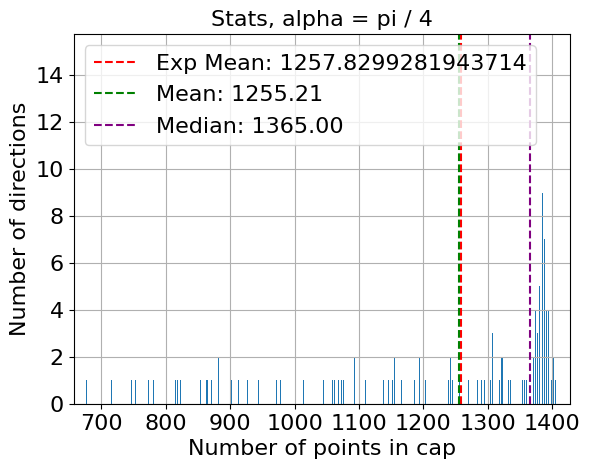

Saving CSV to: PMTSet3_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x   -614.538217   -614.538217
1      vector sum y   -277.841261   -277.841261
2      vector sum z     52.890584     52.890584
3   vector sum norm    676.498633    676.498633
4           total N   8589.000000   8589.000000
5              mean   2149.274854   1255.210526
6            median   2280.500000   1365.000000
7          variance  63541.982935  35367.265620
8             stdev    252.075352    188.061866
9  normalized stdev      0.117284      0.149825
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


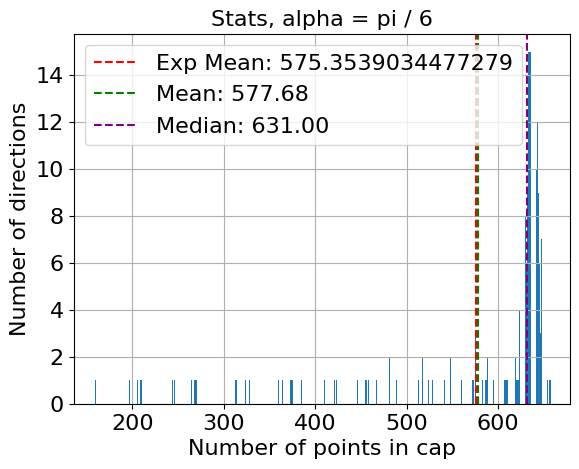

Saving CSV to: PMTSet3_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x   -614.538217   -614.538217   -614.538217
1      vector sum y   -277.841261   -277.841261   -277.841261
2      vector sum z     52.890584     52.890584     52.890584
3   vector sum norm    676.498633    676.498633    676.498633
4           total N   8589.000000   8589.000000   8589.000000
5              mean   2149.274854   1255.210526    577.681287
6            median   2280.500000   1365.000000    631.000000
7          variance  63541.982935  35367.265620  12341.521229
8             stdev    252.075352    188.061866    111.092400
9  normalized stdev      0.117284      0.149825      0.192307
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


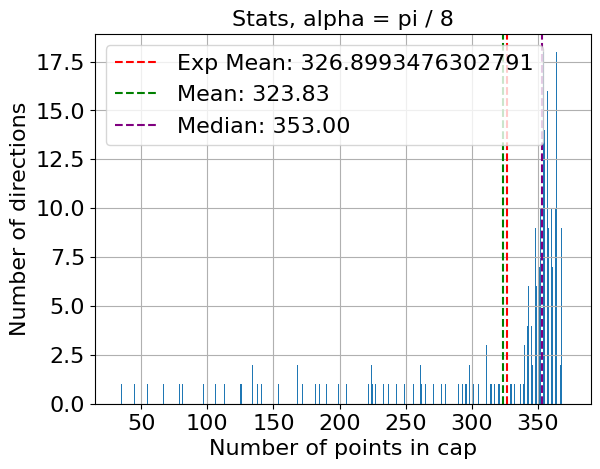

Saving CSV to: PMTSet3_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -614.538217   -614.538217   -614.538217   -614.538217
1      vector sum y   -277.841261   -277.841261   -277.841261   -277.841261
2      vector sum z     52.890584     52.890584     52.890584     52.890584
3   vector sum norm    676.498633    676.498633    676.498633    676.498633
4           total N   8589.000000   8589.000000   8589.000000   8589.000000
5              mean   2149.274854   1255.210526    577.681287    323.830409
6            median   2280.500000   1365.000000    631.000000    353.000000
7          variance  63541.982935  35367.265620  12341.521229   4994.105742
8             stdev    252.075352    188.061866    111.092400     70.668987
9  normalized stdev      0.117284      0.149825      0.192307      0.218228
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram 

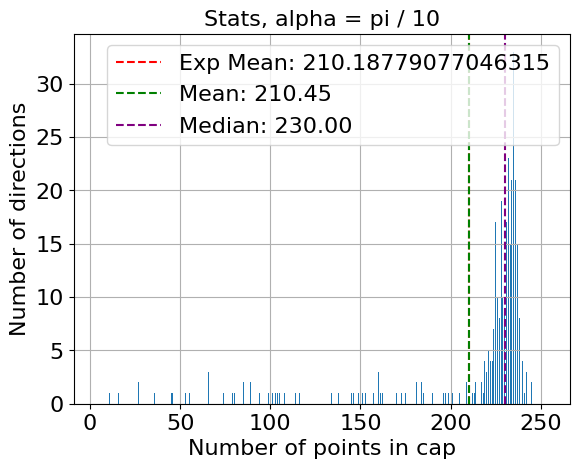

Saving CSV to: PMTSet3_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -614.538217   -614.538217   -614.538217   -614.538217   
1      vector sum y   -277.841261   -277.841261   -277.841261   -277.841261   
2      vector sum z     52.890584     52.890584     52.890584     52.890584   
3   vector sum norm    676.498633    676.498633    676.498633    676.498633   
4           total N   8589.000000   8589.000000   8589.000000   8589.000000   
5              mean   2149.274854   1255.210526    577.681287    323.830409   
6            median   2280.500000   1365.000000    631.000000    353.000000   
7          variance  63541.982935  35367.265620  12341.521229   4994.105742   
8             stdev    252.075352    188.061866    111.092400     70.668987   
9  normalized stdev      0.117284      0.149825      0.192307      0.218228   

   alpha = pi/10  
0    -614.538217  
1    -277.841261  
2      52.890584  
3     676.498633  
4 

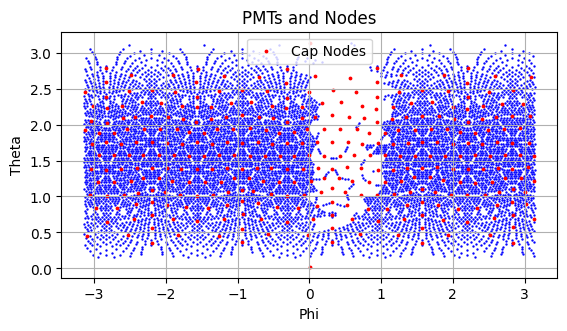

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


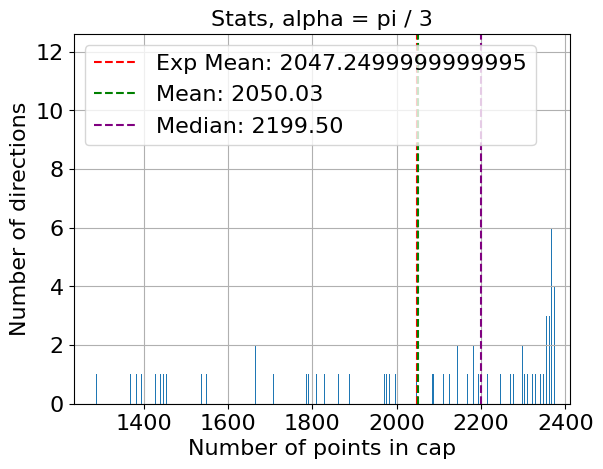

Saving CSV to: PMTSet4_stats.csv
             Metric   alpha = pi/3
0      vector sum x    -817.177911
1      vector sum y    -478.882319
2      vector sum z     137.232057
3   vector sum norm     957.047883
4           total N    8189.000000
5              mean    2050.029240
6            median    2199.500000
7          variance  122407.589788
8             stdev     349.867961
9  normalized stdev       0.170665
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


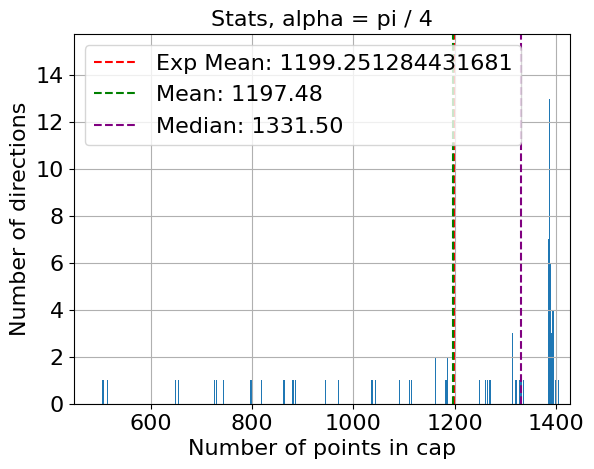

Saving CSV to: PMTSet4_stats.csv
             Metric   alpha = pi/3  alpha = pi/4
0      vector sum x    -817.177911   -817.177911
1      vector sum y    -478.882319   -478.882319
2      vector sum z     137.232057    137.232057
3   vector sum norm     957.047883    957.047883
4           total N    8189.000000   8189.000000
5              mean    2050.029240   1197.482456
6            median    2199.500000   1331.500000
7          variance  122407.589788  65895.740920
8             stdev     349.867961    256.701657
9  normalized stdev       0.170665      0.214368
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


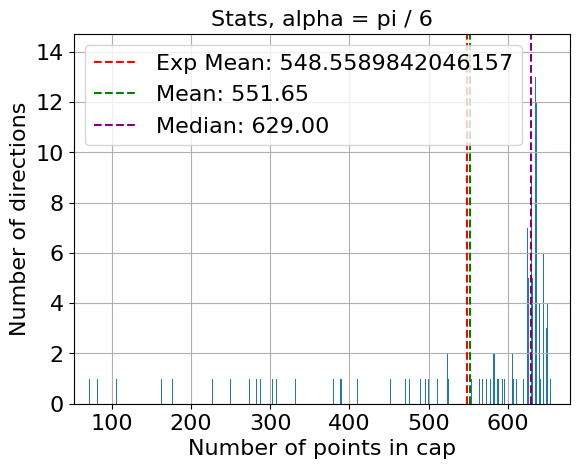

Saving CSV to: PMTSet4_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -817.177911   -817.177911   -817.177911
1      vector sum y    -478.882319   -478.882319   -478.882319
2      vector sum z     137.232057    137.232057    137.232057
3   vector sum norm     957.047883    957.047883    957.047883
4           total N    8189.000000   8189.000000   8189.000000
5              mean    2050.029240   1197.482456    551.646199
6            median    2199.500000   1331.500000    629.000000
7          variance  122407.589788  65895.740920  21688.550263
8             stdev     349.867961    256.701657    147.270331
9  normalized stdev       0.170665      0.214368      0.266965
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


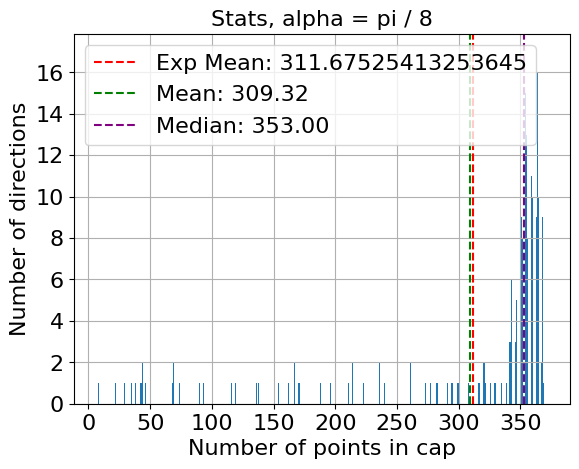

Saving CSV to: PMTSet4_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -817.177911   -817.177911   -817.177911   -817.177911
1      vector sum y    -478.882319   -478.882319   -478.882319   -478.882319
2      vector sum z     137.232057    137.232057    137.232057    137.232057
3   vector sum norm     957.047883    957.047883    957.047883    957.047883
4           total N    8189.000000   8189.000000   8189.000000   8189.000000
5              mean    2050.029240   1197.482456    551.646199    309.321637
6            median    2199.500000   1331.500000    629.000000    353.000000
7          variance  122407.589788  65895.740920  21688.550263   8395.036900
8             stdev     349.867961    256.701657    147.270331     91.624434
9  normalized stdev       0.170665      0.214368      0.266965      0.296211
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

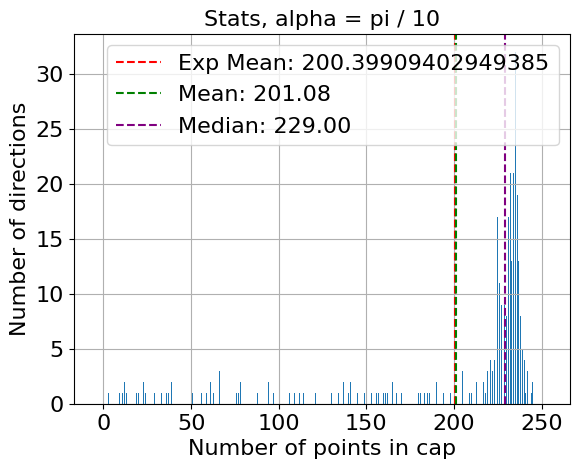

Saving CSV to: PMTSet4_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -817.177911   -817.177911   -817.177911   -817.177911   
1      vector sum y    -478.882319   -478.882319   -478.882319   -478.882319   
2      vector sum z     137.232057    137.232057    137.232057    137.232057   
3   vector sum norm     957.047883    957.047883    957.047883    957.047883   
4           total N    8189.000000   8189.000000   8189.000000   8189.000000   
5              mean    2050.029240   1197.482456    551.646199    309.321637   
6            median    2199.500000   1331.500000    629.000000    353.000000   
7          variance  122407.589788  65895.740920  21688.550263   8395.036900   
8             stdev     349.867961    256.701657    147.270331     91.624434   
9  normalized stdev       0.170665      0.214368      0.266965      0.296211   

   alpha = pi/10  
0    -817.177911  
1    -478.882319  
2     137.232057  
3     957.

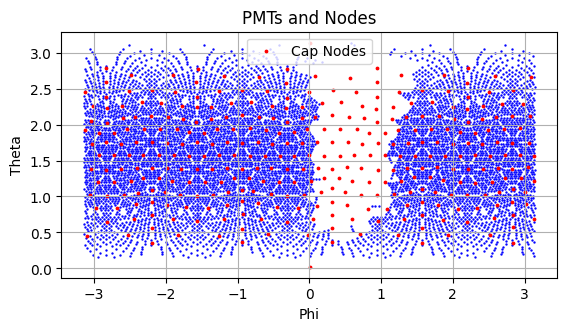

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


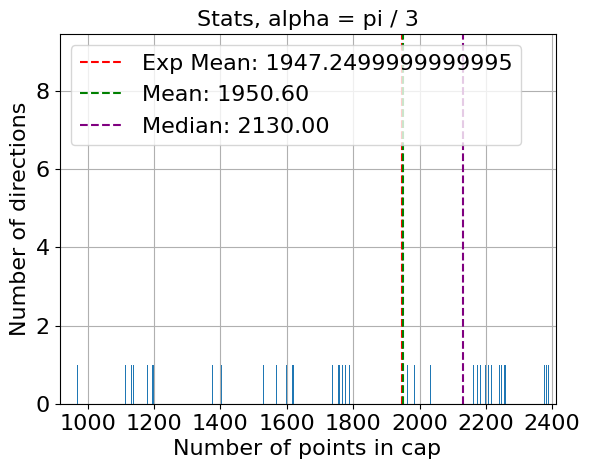

Saving CSV to: PMTSet5_stats.csv
             Metric   alpha = pi/3
0      vector sum x    -993.845914
1      vector sum y    -707.522027
2      vector sum z     130.544455
3   vector sum norm    1226.930713
4           total N    7789.000000
5              mean    1950.599415
6            median    2130.000000
7          variance  195822.918479
8             stdev     442.518834
9  normalized stdev       0.226863
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


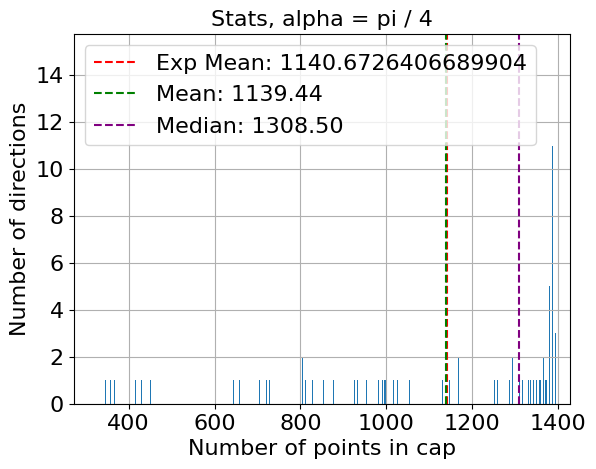

Saving CSV to: PMTSet5_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x    -993.845914    -993.845914
1      vector sum y    -707.522027    -707.522027
2      vector sum z     130.544455     130.544455
3   vector sum norm    1226.930713    1226.930713
4           total N    7789.000000    7789.000000
5              mean    1950.599415    1139.435673
6            median    2130.000000    1308.500000
7          variance  195822.918479  102549.620131
8             stdev     442.518834     320.233696
9  normalized stdev       0.226863       0.281046
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


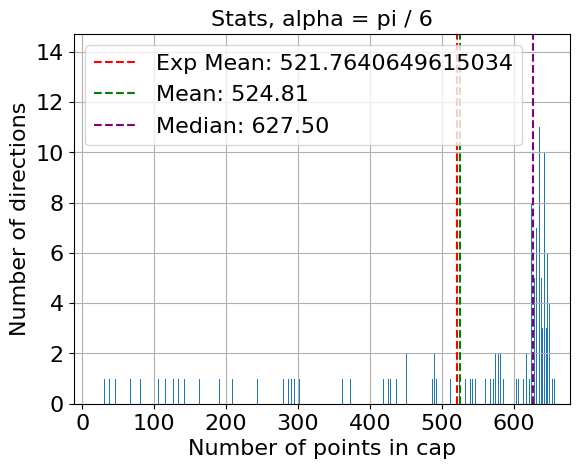

Saving CSV to: PMTSet5_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x    -993.845914    -993.845914   -993.845914
1      vector sum y    -707.522027    -707.522027   -707.522027
2      vector sum z     130.544455     130.544455    130.544455
3   vector sum norm    1226.930713    1226.930713   1226.930713
4           total N    7789.000000    7789.000000   7789.000000
5              mean    1950.599415    1139.435673    524.809942
6            median    2130.000000    1308.500000    627.500000
7          variance  195822.918479  102549.620131  32307.013585
8             stdev     442.518834     320.233696    179.741519
9  normalized stdev       0.226863       0.281046      0.342489
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


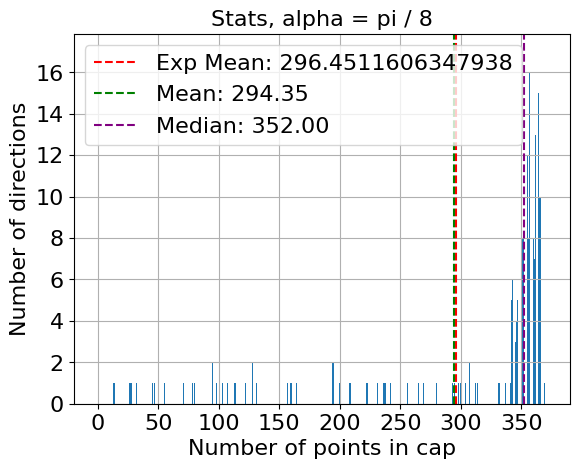

Saving CSV to: PMTSet5_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -993.845914    -993.845914   -993.845914   -993.845914
1      vector sum y    -707.522027    -707.522027   -707.522027   -707.522027
2      vector sum z     130.544455     130.544455    130.544455    130.544455
3   vector sum norm    1226.930713    1226.930713   1226.930713   1226.930713
4           total N    7789.000000    7789.000000   7789.000000   7789.000000
5              mean    1950.599415    1139.435673    524.809942    294.347953
6            median    2130.000000    1308.500000    627.500000    352.000000
7          variance  195822.918479  102549.620131  32307.013585  12148.145010
8             stdev     442.518834     320.233696    179.741519    110.218624
9  normalized stdev       0.226863       0.281046      0.342489      0.374450
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

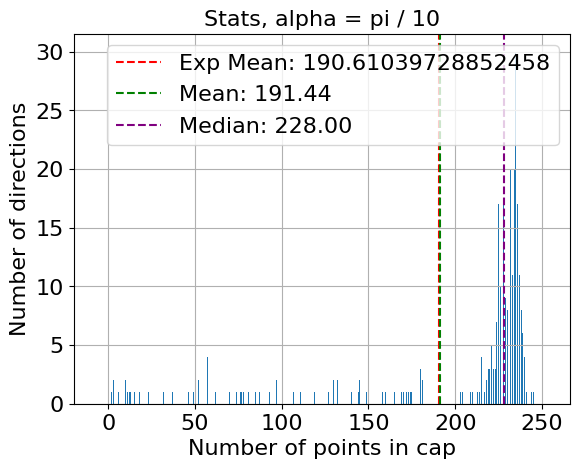

Saving CSV to: PMTSet5_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -993.845914    -993.845914   -993.845914   -993.845914   
1      vector sum y    -707.522027    -707.522027   -707.522027   -707.522027   
2      vector sum z     130.544455     130.544455    130.544455    130.544455   
3   vector sum norm    1226.930713    1226.930713   1226.930713   1226.930713   
4           total N    7789.000000    7789.000000   7789.000000   7789.000000   
5              mean    1950.599415    1139.435673    524.809942    294.347953   
6            median    2130.000000    1308.500000    627.500000    352.000000   
7          variance  195822.918479  102549.620131  32307.013585  12148.145010   
8             stdev     442.518834     320.233696    179.741519    110.218624   
9  normalized stdev       0.226863       0.281046      0.342489      0.374450   

   alpha = pi/10  
0    -993.845914  
1    -707.522027  
2     130.544455  

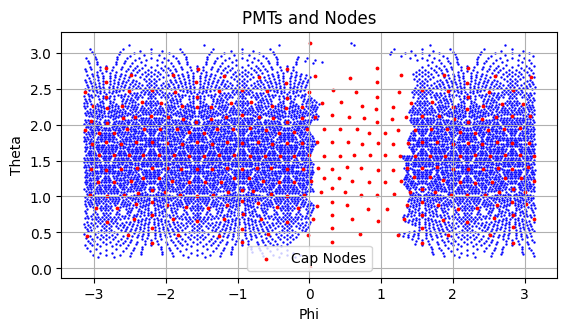

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


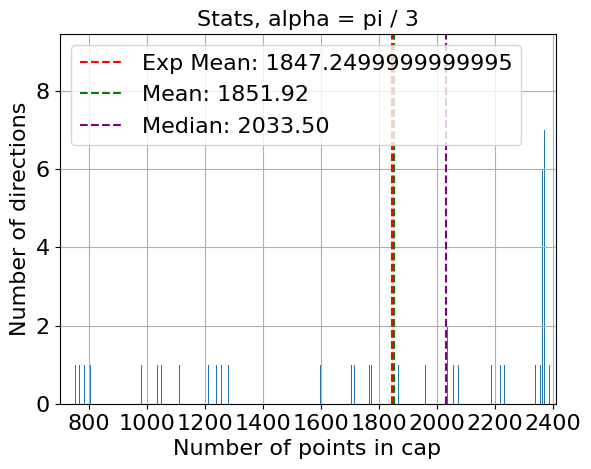

Saving CSV to: PMTSet6_stats.csv
             Metric   alpha = pi/3
0      vector sum x   -1106.708246
1      vector sum y    -938.629125
2      vector sum z     -51.828061
3   vector sum norm    1452.072286
4           total N    7389.000000
5              mean    1851.918129
6            median    2033.500000
7          variance  268875.203823
8             stdev     518.531777
9  normalized stdev       0.279997
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


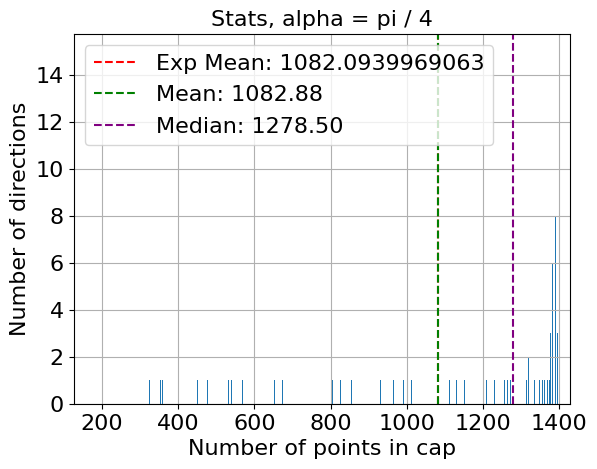

Saving CSV to: PMTSet6_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x   -1106.708246   -1106.708246
1      vector sum y    -938.629125    -938.629125
2      vector sum z     -51.828061     -51.828061
3   vector sum norm    1452.072286    1452.072286
4           total N    7389.000000    7389.000000
5              mean    1851.918129    1082.880117
6            median    2033.500000    1278.500000
7          variance  268875.203823  137157.813113
8             stdev     518.531777     370.348232
9  normalized stdev       0.279997       0.342003
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


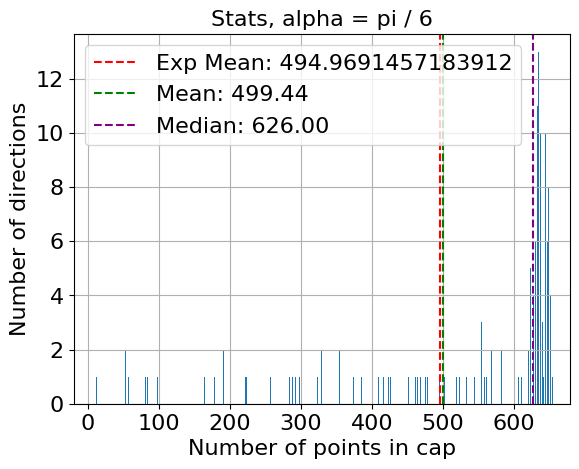

Saving CSV to: PMTSet6_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x   -1106.708246   -1106.708246  -1106.708246
1      vector sum y    -938.629125    -938.629125   -938.629125
2      vector sum z     -51.828061     -51.828061    -51.828061
3   vector sum norm    1452.072286    1452.072286   1452.072286
4           total N    7389.000000    7389.000000   7389.000000
5              mean    1851.918129    1082.880117    499.441520
6            median    2033.500000    1278.500000    626.000000
7          variance  268875.203823  137157.813113  41214.726112
8             stdev     518.531777     370.348232    203.014103
9  normalized stdev       0.279997       0.342003      0.406482
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


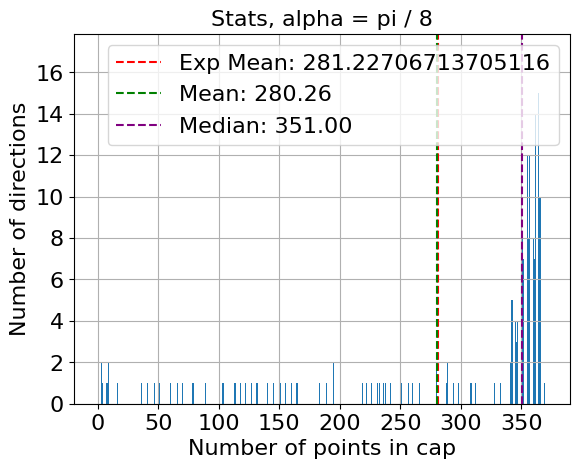

Saving CSV to: PMTSet6_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -1106.708246   -1106.708246  -1106.708246  -1106.708246
1      vector sum y    -938.629125    -938.629125   -938.629125   -938.629125
2      vector sum z     -51.828061     -51.828061    -51.828061    -51.828061
3   vector sum norm    1452.072286    1452.072286   1452.072286   1452.072286
4           total N    7389.000000    7389.000000   7389.000000   7389.000000
5              mean    1851.918129    1082.880117    499.441520    280.257310
6            median    2033.500000    1278.500000    626.000000    351.000000
7          variance  268875.203823  137157.813113  41214.726112  15103.787593
8             stdev     518.531777     370.348232    203.014103    122.897468
9  normalized stdev       0.279997       0.342003      0.406482      0.438517
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

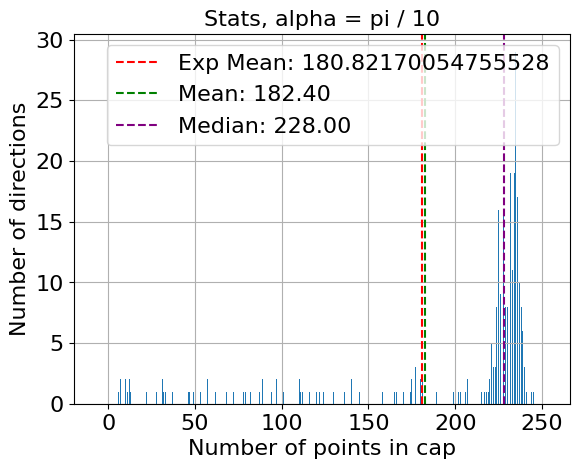

Saving CSV to: PMTSet6_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -1106.708246   -1106.708246  -1106.708246  -1106.708246   
1      vector sum y    -938.629125    -938.629125   -938.629125   -938.629125   
2      vector sum z     -51.828061     -51.828061    -51.828061    -51.828061   
3   vector sum norm    1452.072286    1452.072286   1452.072286   1452.072286   
4           total N    7389.000000    7389.000000   7389.000000   7389.000000   
5              mean    1851.918129    1082.880117    499.441520    280.257310   
6            median    2033.500000    1278.500000    626.000000    351.000000   
7          variance  268875.203823  137157.813113  41214.726112  15103.787593   
8             stdev     518.531777     370.348232    203.014103    122.897468   
9  normalized stdev       0.279997       0.342003      0.406482      0.438517   

   alpha = pi/10  
0   -1106.708246  
1    -938.629125  
2     -51.828061  

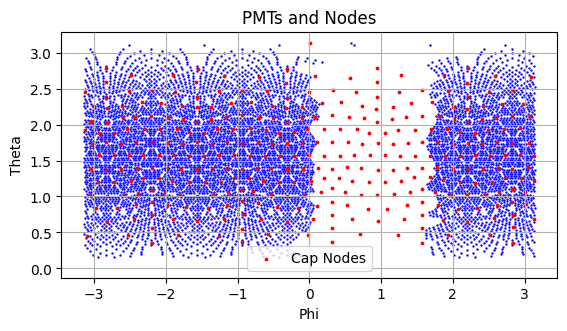

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


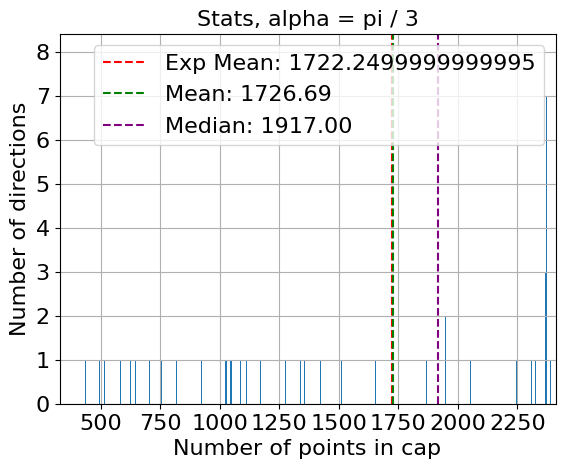

Saving CSV to: PMTSet7_stats.csv
             Metric   alpha = pi/3
0      vector sum x   -1121.568402
1      vector sum y   -1333.122972
2      vector sum z     -49.437331
3   vector sum norm    1742.864477
4           total N    6889.000000
5              mean    1726.687135
6            median    1917.000000
7          variance  373957.788080
8             stdev     611.520881
9  normalized stdev       0.354158
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


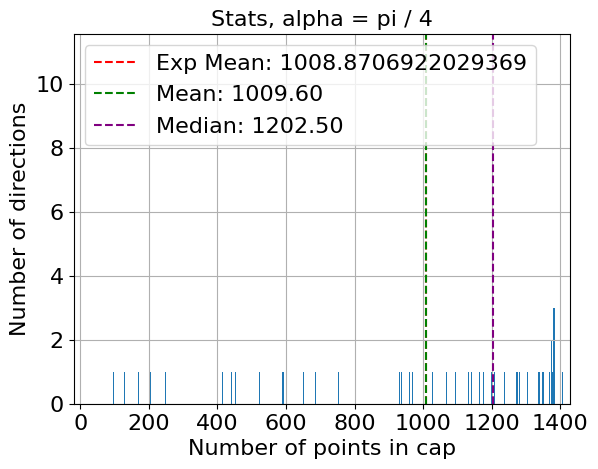

Saving CSV to: PMTSet7_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x   -1121.568402   -1121.568402
1      vector sum y   -1333.122972   -1333.122972
2      vector sum z     -49.437331     -49.437331
3   vector sum norm    1742.864477    1742.864477
4           total N    6889.000000    6889.000000
5              mean    1726.687135    1009.596491
6            median    1917.000000    1202.500000
7          variance  373957.788080  182885.088643
8             stdev     611.520881     427.650662
9  normalized stdev       0.354158       0.423586
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


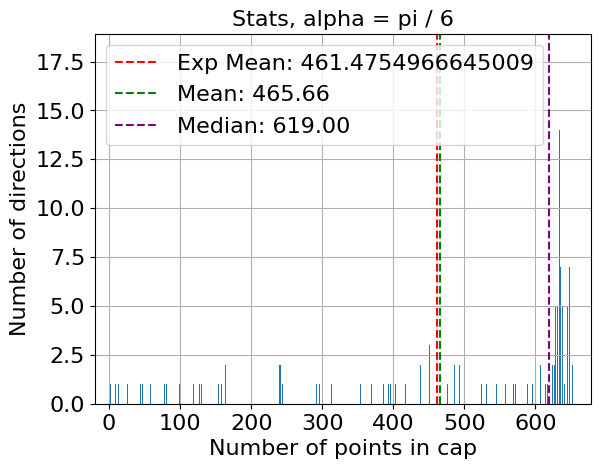

Saving CSV to: PMTSet7_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x   -1121.568402   -1121.568402  -1121.568402
1      vector sum y   -1333.122972   -1333.122972  -1333.122972
2      vector sum z     -49.437331     -49.437331    -49.437331
3   vector sum norm    1742.864477    1742.864477   1742.864477
4           total N    6889.000000    6889.000000   6889.000000
5              mean    1726.687135    1009.596491    465.657895
6            median    1917.000000    1202.500000    619.000000
7          variance  373957.788080  182885.088643  51956.230917
8             stdev     611.520881     427.650662    227.939095
9  normalized stdev       0.354158       0.423586      0.489499
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


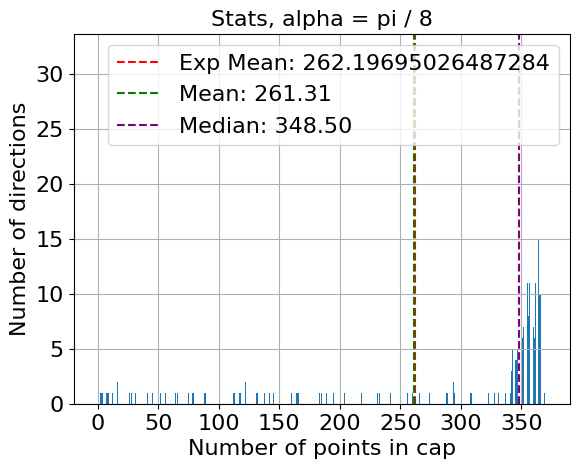

Saving CSV to: PMTSet7_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -1121.568402   -1121.568402  -1121.568402  -1121.568402
1      vector sum y   -1333.122972   -1333.122972  -1333.122972  -1333.122972
2      vector sum z     -49.437331     -49.437331    -49.437331    -49.437331
3   vector sum norm    1742.864477    1742.864477   1742.864477   1742.864477
4           total N    6889.000000    6889.000000   6889.000000   6889.000000
5              mean    1726.687135    1009.596491    465.657895    261.309942
6            median    1917.000000    1202.500000    619.000000    348.500000
7          variance  373957.788080  182885.088643  51956.230917  18550.038439
8             stdev     611.520881     427.650662    227.939095    136.198526
9  normalized stdev       0.354158       0.423586      0.489499      0.521214
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

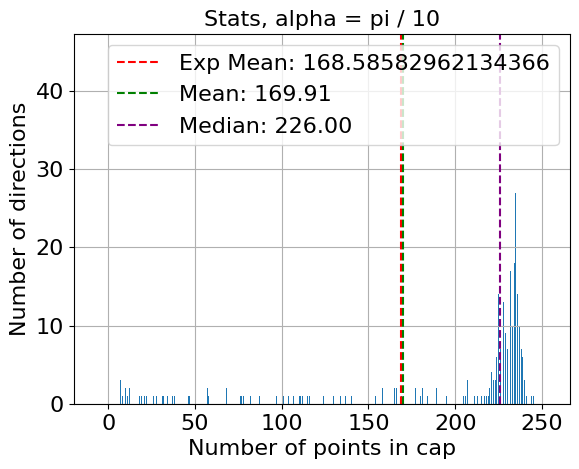

Saving CSV to: PMTSet7_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -1121.568402   -1121.568402  -1121.568402  -1121.568402   
1      vector sum y   -1333.122972   -1333.122972  -1333.122972  -1333.122972   
2      vector sum z     -49.437331     -49.437331    -49.437331    -49.437331   
3   vector sum norm    1742.864477    1742.864477   1742.864477   1742.864477   
4           total N    6889.000000    6889.000000   6889.000000   6889.000000   
5              mean    1726.687135    1009.596491    465.657895    261.309942   
6            median    1917.000000    1202.500000    619.000000    348.500000   
7          variance  373957.788080  182885.088643  51956.230917  18550.038439   
8             stdev     611.520881     427.650662    227.939095    136.198526   
9  normalized stdev       0.354158       0.423586      0.489499      0.521214   

   alpha = pi/10  
0   -1121.568402  
1   -1333.122972  
2     -49.437331  

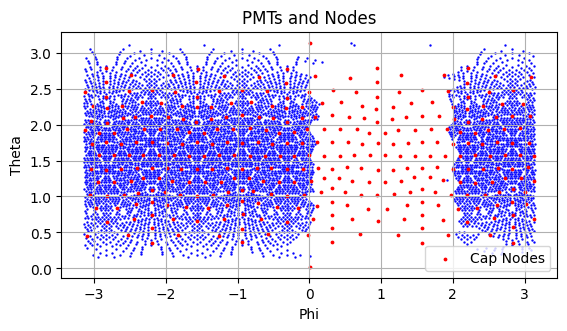

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


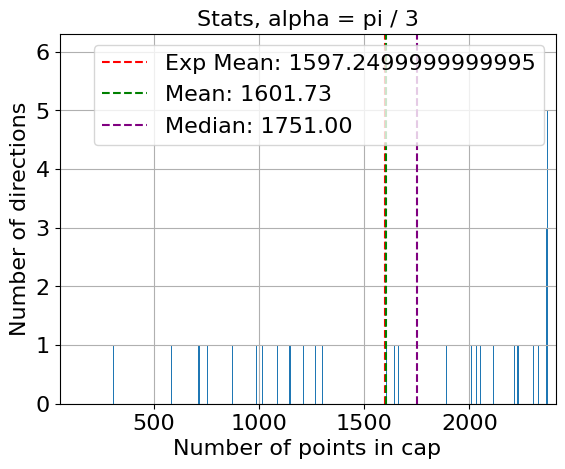

Saving CSV to: PMTSet8_stats.csv
             Metric   alpha = pi/3
0      vector sum x   -1011.358497
1      vector sum y   -1691.885254
2      vector sum z    -107.929691
3   vector sum norm    1974.074604
4           total N    6389.000000
5              mean    1601.725146
6            median    1751.000000
7          variance  464978.602818
8             stdev     681.893395
9  normalized stdev       0.425724
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


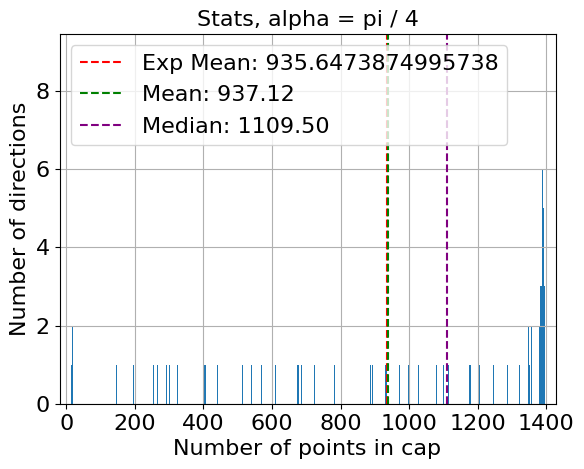

Saving CSV to: PMTSet8_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x   -1011.358497   -1011.358497
1      vector sum y   -1691.885254   -1691.885254
2      vector sum z    -107.929691    -107.929691
3   vector sum norm    1974.074604    1974.074604
4           total N    6389.000000    6389.000000
5              mean    1601.725146     937.119883
6            median    1751.000000    1109.500000
7          variance  464978.602818  219679.432996
8             stdev     681.893395     468.699726
9  normalized stdev       0.425724       0.500149
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


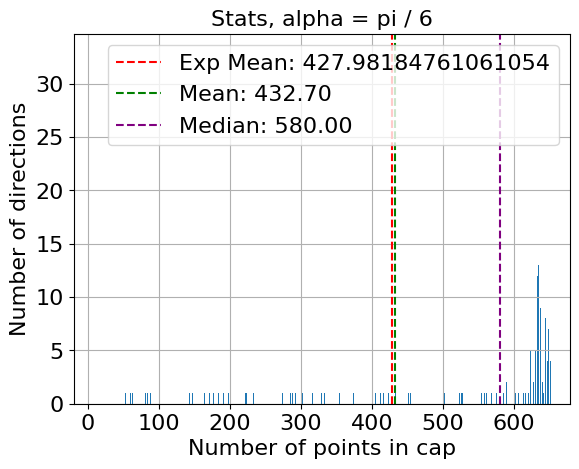

Saving CSV to: PMTSet8_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x   -1011.358497   -1011.358497  -1011.358497
1      vector sum y   -1691.885254   -1691.885254  -1691.885254
2      vector sum z    -107.929691    -107.929691   -107.929691
3   vector sum norm    1974.074604    1974.074604   1974.074604
4           total N    6389.000000    6389.000000   6389.000000
5              mean    1601.725146     937.119883    432.698830
6            median    1751.000000    1109.500000    580.000000
7          variance  464978.602818  219679.432996  60469.882981
8             stdev     681.893395     468.699726    245.906248
9  normalized stdev       0.425724       0.500149      0.568308
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


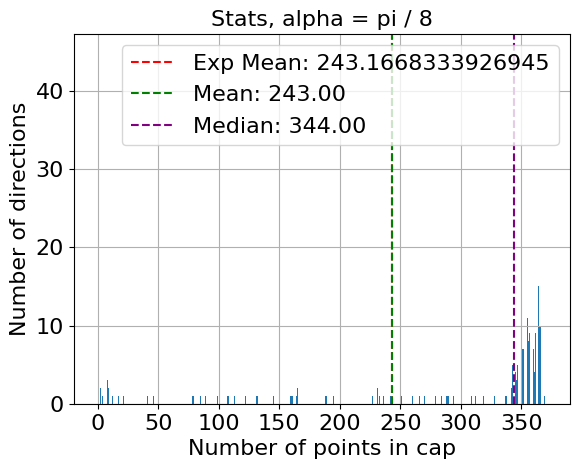

Saving CSV to: PMTSet8_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -1011.358497   -1011.358497  -1011.358497  -1011.358497
1      vector sum y   -1691.885254   -1691.885254  -1691.885254  -1691.885254
2      vector sum z    -107.929691    -107.929691   -107.929691   -107.929691
3   vector sum norm    1974.074604    1974.074604   1974.074604   1974.074604
4           total N    6389.000000    6389.000000   6389.000000   6389.000000
5              mean    1601.725146     937.119883    432.698830    243.000000
6            median    1751.000000    1109.500000    580.000000    344.000000
7          variance  464978.602818  219679.432996  60469.882981  21277.912281
8             stdev     681.893395     468.699726    245.906248    145.869504
9  normalized stdev       0.425724       0.500149      0.568308      0.600286
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

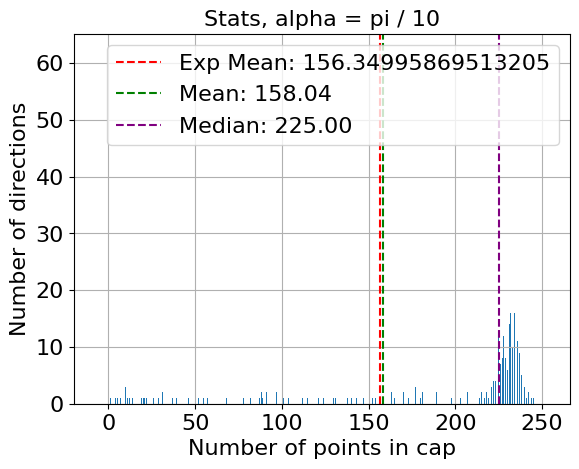

Saving CSV to: PMTSet8_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -1011.358497   -1011.358497  -1011.358497  -1011.358497   
1      vector sum y   -1691.885254   -1691.885254  -1691.885254  -1691.885254   
2      vector sum z    -107.929691    -107.929691   -107.929691   -107.929691   
3   vector sum norm    1974.074604    1974.074604   1974.074604   1974.074604   
4           total N    6389.000000    6389.000000   6389.000000   6389.000000   
5              mean    1601.725146     937.119883    432.698830    243.000000   
6            median    1751.000000    1109.500000    580.000000    344.000000   
7          variance  464978.602818  219679.432996  60469.882981  21277.912281   
8             stdev     681.893395     468.699726    245.906248    145.869504   
9  normalized stdev       0.425724       0.500149      0.568308      0.600286   

   alpha = pi/10  
0   -1011.358497  
1   -1691.885254  
2    -107.929691  

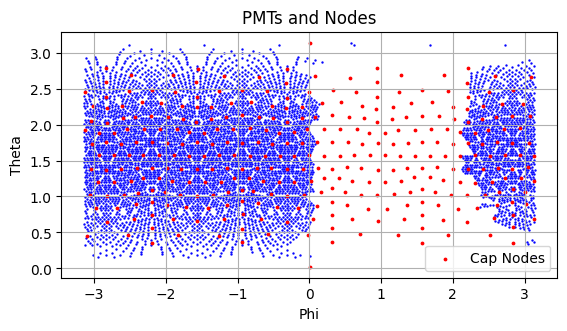

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


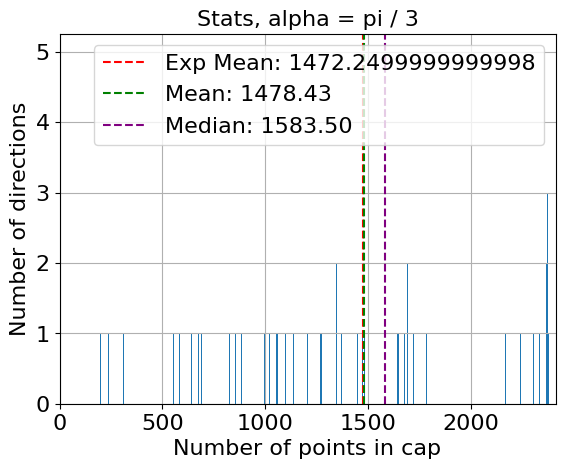

Saving CSV to: PMTSet9_stats.csv
             Metric   alpha = pi/3
0      vector sum x    -791.615354
1      vector sum y   -1948.969381
2      vector sum z    -187.208603
3   vector sum norm    2111.914671
4           total N    5889.000000
5              mean    1478.429825
6            median    1583.500000
7          variance  519799.590105
8             stdev     720.971282
9  normalized stdev       0.487660
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


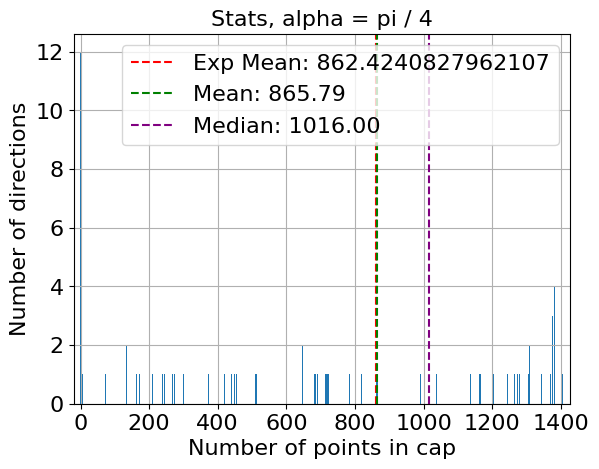

Saving CSV to: PMTSet9_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x    -791.615354    -791.615354
1      vector sum y   -1948.969381   -1948.969381
2      vector sum z    -187.208603    -187.208603
3   vector sum norm    2111.914671    2111.914671
4           total N    5889.000000    5889.000000
5              mean    1478.429825     865.786550
6            median    1583.500000    1016.000000
7          variance  519799.590105  240453.998299
8             stdev     720.971282     490.361090
9  normalized stdev       0.487660       0.566376
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


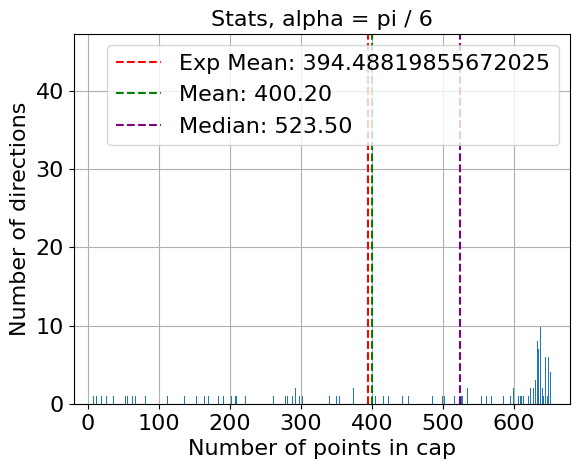

Saving CSV to: PMTSet9_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x    -791.615354    -791.615354   -791.615354
1      vector sum y   -1948.969381   -1948.969381  -1948.969381
2      vector sum z    -187.208603    -187.208603   -187.208603
3   vector sum norm    2111.914671    2111.914671   2111.914671
4           total N    5889.000000    5889.000000   5889.000000
5              mean    1478.429825     865.786550    400.198830
6            median    1583.500000    1016.000000    523.500000
7          variance  519799.590105  240453.998299  64868.884443
8             stdev     720.971282     490.361090    254.693707
9  normalized stdev       0.487660       0.566376      0.636418
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


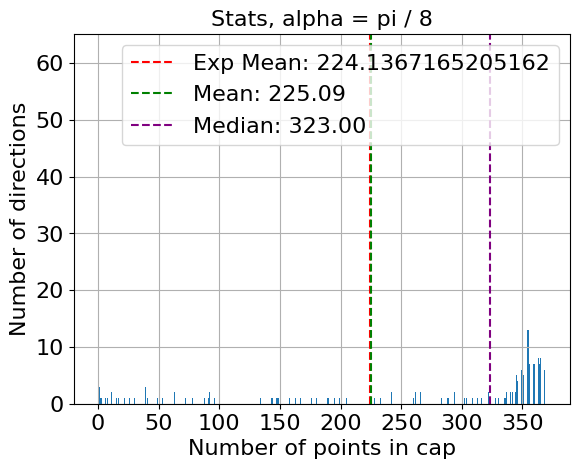

Saving CSV to: PMTSet9_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -791.615354    -791.615354   -791.615354   -791.615354
1      vector sum y   -1948.969381   -1948.969381  -1948.969381  -1948.969381
2      vector sum z    -187.208603    -187.208603   -187.208603   -187.208603
3   vector sum norm    2111.914671    2111.914671   2111.914671   2111.914671
4           total N    5889.000000    5889.000000   5889.000000   5889.000000
5              mean    1478.429825     865.786550    400.198830    225.090643
6            median    1583.500000    1016.000000    523.500000    323.000000
7          variance  519799.590105  240453.998299  64868.884443  22598.368977
8             stdev     720.971282     490.361090    254.693707    150.327539
9  normalized stdev       0.487660       0.566376      0.636418      0.667853
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

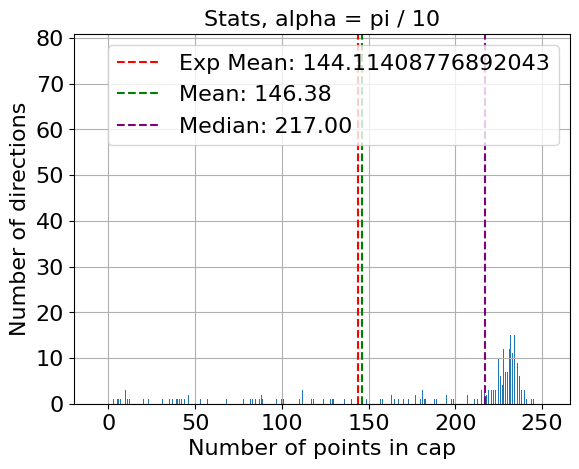

Saving CSV to: PMTSet9_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -791.615354    -791.615354   -791.615354   -791.615354   
1      vector sum y   -1948.969381   -1948.969381  -1948.969381  -1948.969381   
2      vector sum z    -187.208603    -187.208603   -187.208603   -187.208603   
3   vector sum norm    2111.914671    2111.914671   2111.914671   2111.914671   
4           total N    5889.000000    5889.000000   5889.000000   5889.000000   
5              mean    1478.429825     865.786550    400.198830    225.090643   
6            median    1583.500000    1016.000000    523.500000    323.000000   
7          variance  519799.590105  240453.998299  64868.884443  22598.368977   
8             stdev     720.971282     490.361090    254.693707    150.327539   
9  normalized stdev       0.487660       0.566376      0.636418      0.667853   

   alpha = pi/10  
0    -791.615354  
1   -1948.969381  
2    -187.208603  

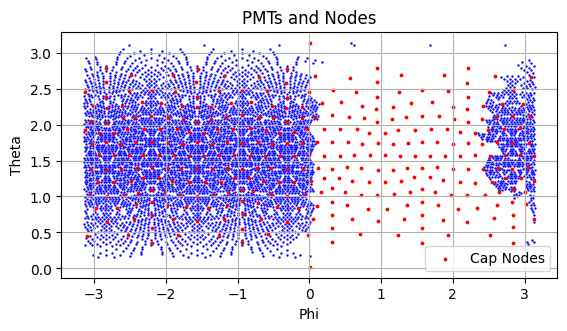

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


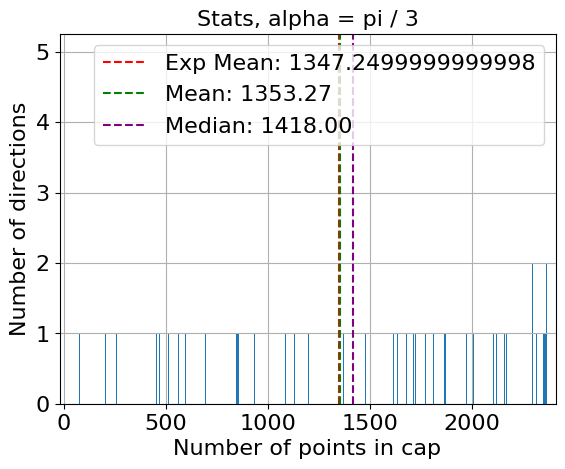

Saving CSV to: PMTSet10_stats.csv
             Metric   alpha = pi/3
0      vector sum x    -481.566326
1      vector sum y   -2186.741149
2      vector sum z    -174.618037
3   vector sum norm    2245.937319
4           total N    5389.000000
5              mean    1353.271930
6            median    1418.000000
7          variance  573519.396814
8             stdev     757.310634
9  normalized stdev       0.559615
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


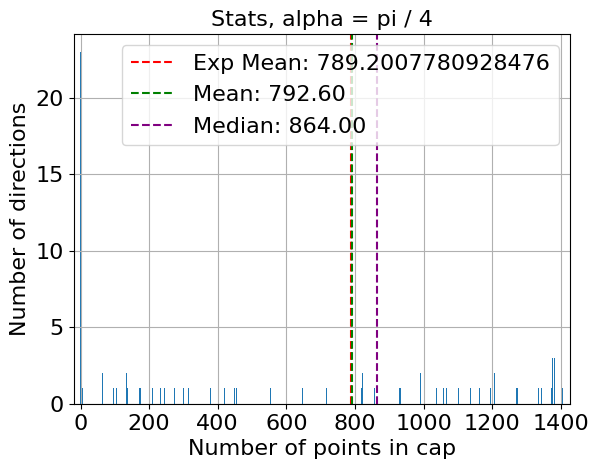

Saving CSV to: PMTSet10_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x    -481.566326    -481.566326
1      vector sum y   -2186.741149   -2186.741149
2      vector sum z    -174.618037    -174.618037
3   vector sum norm    2245.937319    2245.937319
4           total N    5389.000000    5389.000000
5              mean    1353.271930     792.602339
6            median    1418.000000     864.000000
7          variance  573519.396814  260518.836018
8             stdev     757.310634     510.410458
9  normalized stdev       0.559615       0.643968
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


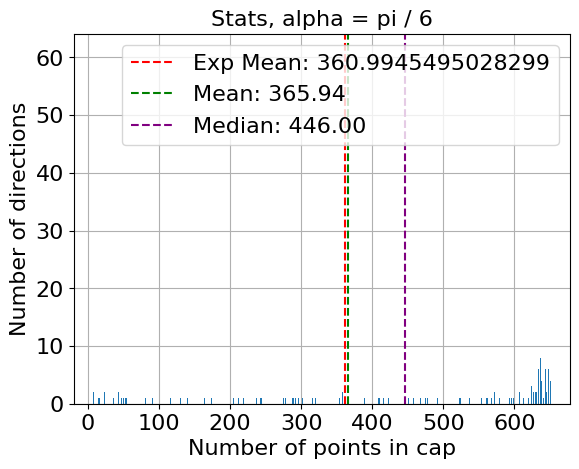

Saving CSV to: PMTSet10_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x    -481.566326    -481.566326   -481.566326
1      vector sum y   -2186.741149   -2186.741149  -2186.741149
2      vector sum z    -174.618037    -174.618037   -174.618037
3   vector sum norm    2245.937319    2245.937319   2245.937319
4           total N    5389.000000    5389.000000   5389.000000
5              mean    1353.271930     792.602339    365.944444
6            median    1418.000000     864.000000    446.000000
7          variance  573519.396814  260518.836018  69287.590481
8             stdev     757.310634     510.410458    263.225361
9  normalized stdev       0.559615       0.643968      0.719304
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


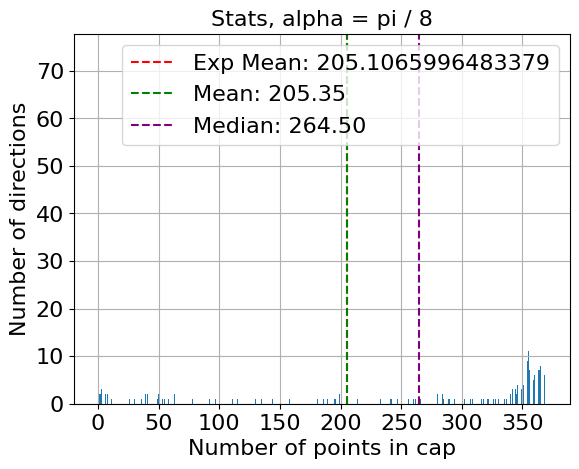

Saving CSV to: PMTSet10_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -481.566326    -481.566326   -481.566326   -481.566326
1      vector sum y   -2186.741149   -2186.741149  -2186.741149  -2186.741149
2      vector sum z    -174.618037    -174.618037   -174.618037   -174.618037
3   vector sum norm    2245.937319    2245.937319   2245.937319   2245.937319
4           total N    5389.000000    5389.000000   5389.000000   5389.000000
5              mean    1353.271930     792.602339    365.944444    205.350877
6            median    1418.000000     864.000000    446.000000    264.500000
7          variance  573519.396814  260518.836018  69287.590481  24053.286242
8             stdev     757.310634     510.410458    263.225361    155.091219
9  normalized stdev       0.559615       0.643968      0.719304      0.755250
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

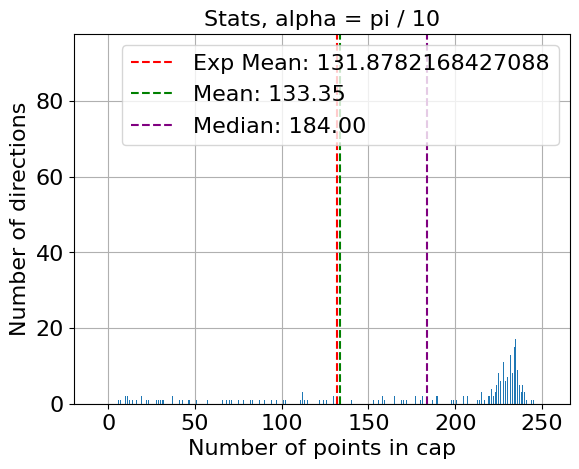

Saving CSV to: PMTSet10_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -481.566326    -481.566326   -481.566326   -481.566326   
1      vector sum y   -2186.741149   -2186.741149  -2186.741149  -2186.741149   
2      vector sum z    -174.618037    -174.618037   -174.618037   -174.618037   
3   vector sum norm    2245.937319    2245.937319   2245.937319   2245.937319   
4           total N    5389.000000    5389.000000   5389.000000   5389.000000   
5              mean    1353.271930     792.602339    365.944444    205.350877   
6            median    1418.000000     864.000000    446.000000    264.500000   
7          variance  573519.396814  260518.836018  69287.590481  24053.286242   
8             stdev     757.310634     510.410458    263.225361    155.091219   
9  normalized stdev       0.559615       0.643968      0.719304      0.755250   

   alpha = pi/10  
0    -481.566326  
1   -2186.741149  
2    -174.618037 

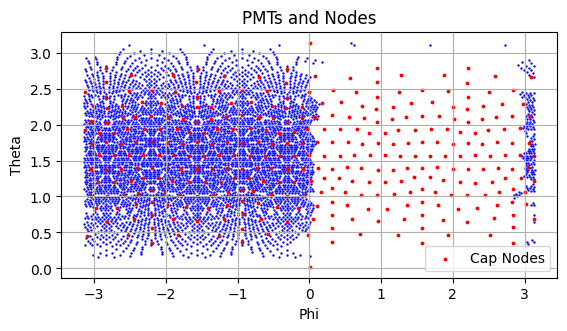

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


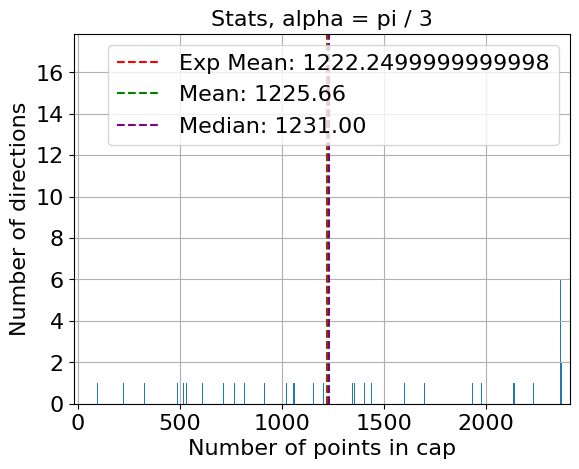

Saving CSV to: PMTSet11_stats.csv
             Metric   alpha = pi/3
0      vector sum x     -77.519059
1      vector sum y   -2350.831531
2      vector sum z     -71.733036
3   vector sum norm    2353.202864
4           total N    4889.000000
5              mean    1225.657895
6            median    1231.000000
7          variance  618075.973607
8             stdev     786.178080
9  normalized stdev       0.641434
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


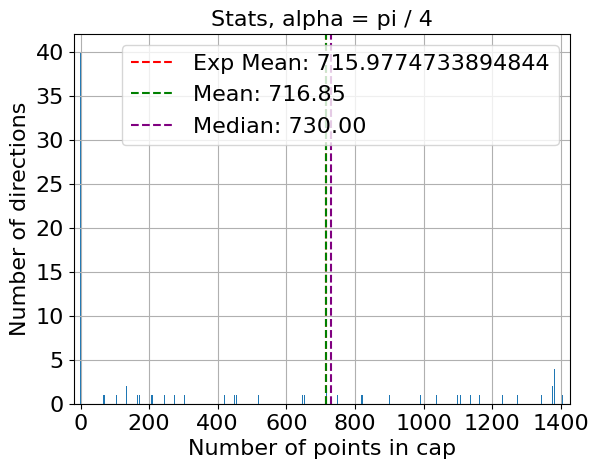

Saving CSV to: PMTSet11_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x     -77.519059     -77.519059
1      vector sum y   -2350.831531   -2350.831531
2      vector sum z     -71.733036     -71.733036
3   vector sum norm    2353.202864    2353.202864
4           total N    4889.000000    4889.000000
5              mean    1225.657895     716.845029
6            median    1231.000000     730.000000
7          variance  618075.973607  277809.709902
8             stdev     786.178080     527.076569
9  normalized stdev       0.641434       0.735273
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


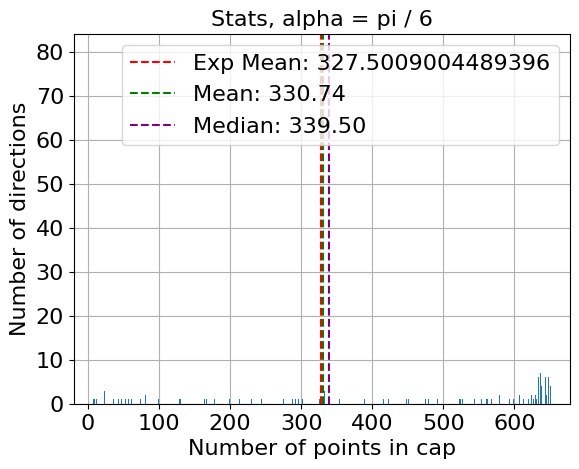

Saving CSV to: PMTSet11_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x     -77.519059     -77.519059    -77.519059
1      vector sum y   -2350.831531   -2350.831531  -2350.831531
2      vector sum z     -71.733036     -71.733036    -71.733036
3   vector sum norm    2353.202864    2353.202864   2353.202864
4           total N    4889.000000    4889.000000   4889.000000
5              mean    1225.657895     716.845029    330.739766
6            median    1231.000000     730.000000    339.500000
7          variance  618075.973607  277809.709902  73400.479062
8             stdev     786.178080     527.076569    270.925228
9  normalized stdev       0.641434       0.735273      0.819149
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


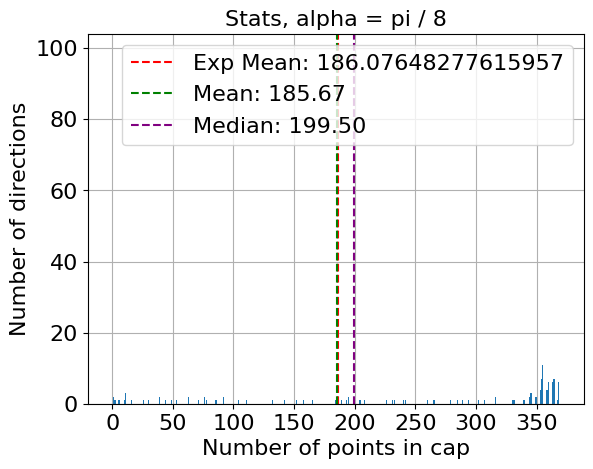

Saving CSV to: PMTSet11_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -77.519059     -77.519059    -77.519059    -77.519059
1      vector sum y   -2350.831531   -2350.831531  -2350.831531  -2350.831531
2      vector sum z     -71.733036     -71.733036    -71.733036    -71.733036
3   vector sum norm    2353.202864    2353.202864   2353.202864   2353.202864
4           total N    4889.000000    4889.000000   4889.000000   4889.000000
5              mean    1225.657895     716.845029    330.739766    185.672515
6            median    1231.000000     730.000000    339.500000    199.500000
7          variance  618075.973607  277809.709902  73400.479062  25374.594508
8             stdev     786.178080     527.076569    270.925228    159.294050
9  normalized stdev       0.641434       0.735273      0.819149      0.857930
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

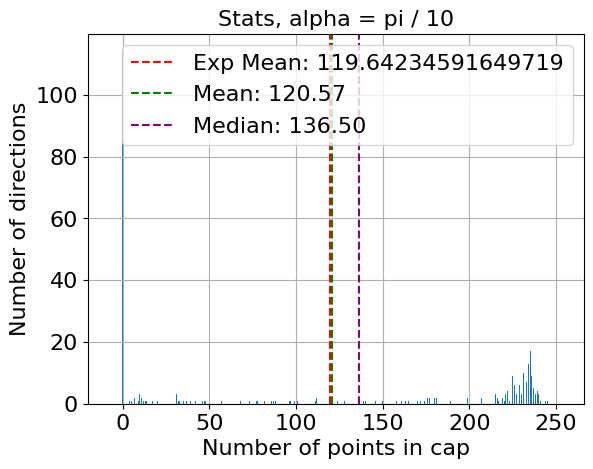

Saving CSV to: PMTSet11_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -77.519059     -77.519059    -77.519059    -77.519059   
1      vector sum y   -2350.831531   -2350.831531  -2350.831531  -2350.831531   
2      vector sum z     -71.733036     -71.733036    -71.733036    -71.733036   
3   vector sum norm    2353.202864    2353.202864   2353.202864   2353.202864   
4           total N    4889.000000    4889.000000   4889.000000   4889.000000   
5              mean    1225.657895     716.845029    330.739766    185.672515   
6            median    1231.000000     730.000000    339.500000    199.500000   
7          variance  618075.973607  277809.709902  73400.479062  25374.594508   
8             stdev     786.178080     527.076569    270.925228    159.294050   
9  normalized stdev       0.641434       0.735273      0.819149      0.857930   

   alpha = pi/10  
0     -77.519059  
1   -2350.831531  
2     -71.733036 

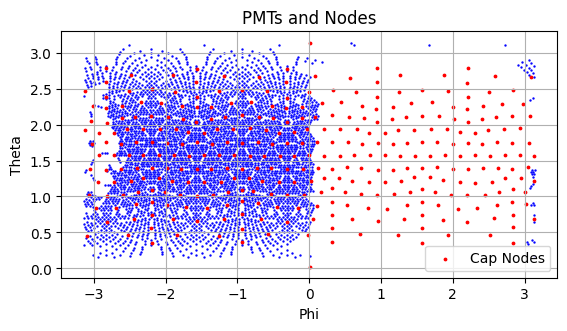

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


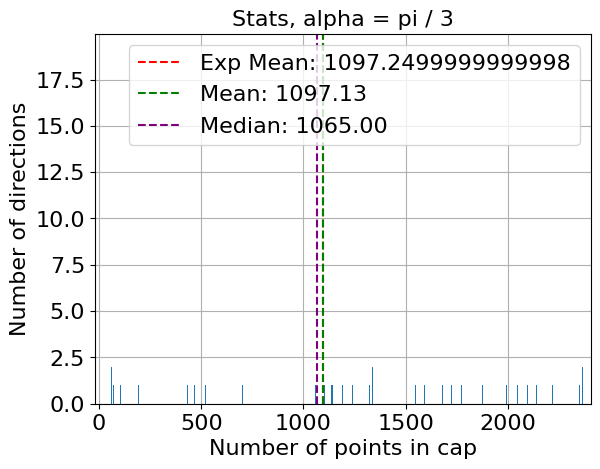

Saving CSV to: PMTSet12_stats.csv
             Metric   alpha = pi/3
0      vector sum x     368.407690
1      vector sum y   -2285.826363
2      vector sum z     -12.887631
3   vector sum norm    2315.360119
4           total N    4389.000000
5              mean    1097.131579
6            median    1065.000000
7          variance  600579.839412
8             stdev     774.970864
9  normalized stdev       0.706361
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


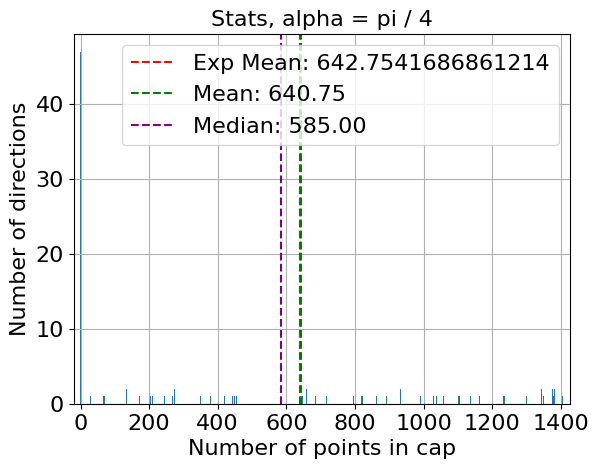

Saving CSV to: PMTSet12_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x     368.407690     368.407690
1      vector sum y   -2285.826363   -2285.826363
2      vector sum z     -12.887631     -12.887631
3   vector sum norm    2315.360119    2315.360119
4           total N    4389.000000    4389.000000
5              mean    1097.131579     640.751462
6            median    1065.000000     585.000000
7          variance  600579.839412  270085.689691
8             stdev     774.970864     519.697691
9  normalized stdev       0.706361       0.811075
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


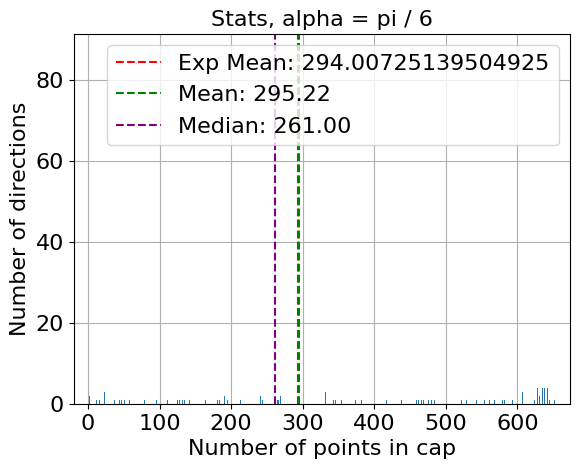

Saving CSV to: PMTSet12_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x     368.407690     368.407690    368.407690
1      vector sum y   -2285.826363   -2285.826363  -2285.826363
2      vector sum z     -12.887631     -12.887631    -12.887631
3   vector sum norm    2315.360119    2315.360119   2315.360119
4           total N    4389.000000    4389.000000   4389.000000
5              mean    1097.131579     640.751462    295.216374
6            median    1065.000000     585.000000    261.000000
7          variance  600579.839412  270085.689691  71423.619849
8             stdev     774.970864     519.697691    267.251978
9  normalized stdev       0.706361       0.811075      0.905275
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


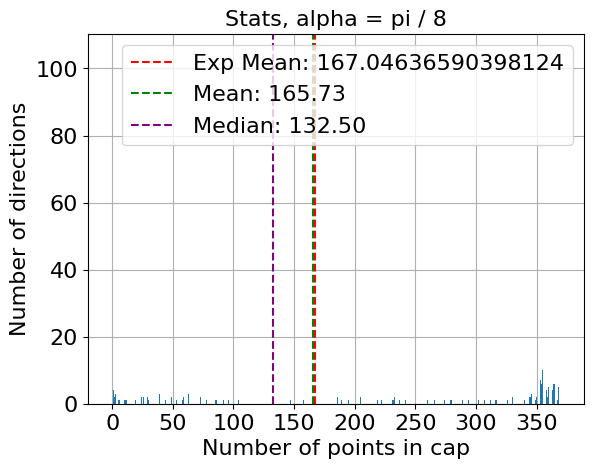

Saving CSV to: PMTSet12_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     368.407690     368.407690    368.407690    368.407690
1      vector sum y   -2285.826363   -2285.826363  -2285.826363  -2285.826363
2      vector sum z     -12.887631     -12.887631    -12.887631    -12.887631
3   vector sum norm    2315.360119    2315.360119   2315.360119   2315.360119
4           total N    4389.000000    4389.000000   4389.000000   4389.000000
5              mean    1097.131579     640.751462    295.216374    165.728070
6            median    1065.000000     585.000000    261.000000    132.500000
7          variance  600579.839412  270085.689691  71423.619849  24724.303247
8             stdev     774.970864     519.697691    267.251978    157.239636
9  normalized stdev       0.706361       0.811075      0.905275      0.948781
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

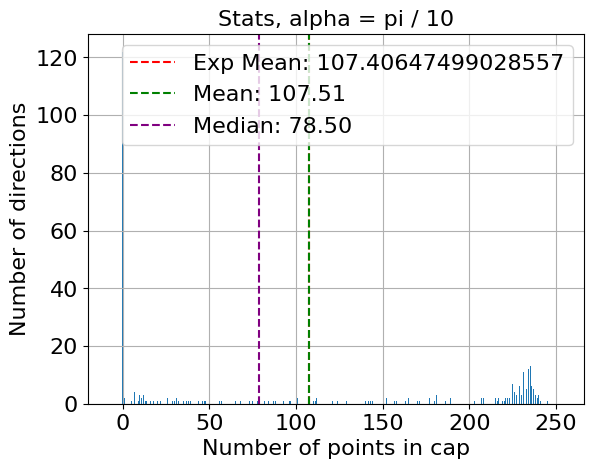

Saving CSV to: PMTSet12_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     368.407690     368.407690    368.407690    368.407690   
1      vector sum y   -2285.826363   -2285.826363  -2285.826363  -2285.826363   
2      vector sum z     -12.887631     -12.887631    -12.887631    -12.887631   
3   vector sum norm    2315.360119    2315.360119   2315.360119   2315.360119   
4           total N    4389.000000    4389.000000   4389.000000   4389.000000   
5              mean    1097.131579     640.751462    295.216374    165.728070   
6            median    1065.000000     585.000000    261.000000    132.500000   
7          variance  600579.839412  270085.689691  71423.619849  24724.303247   
8             stdev     774.970864     519.697691    267.251978    157.239636   
9  normalized stdev       0.706361       0.811075      0.905275      0.948781   

   alpha = pi/10  
0     368.407690  
1   -2285.826363  
2     -12.887631 

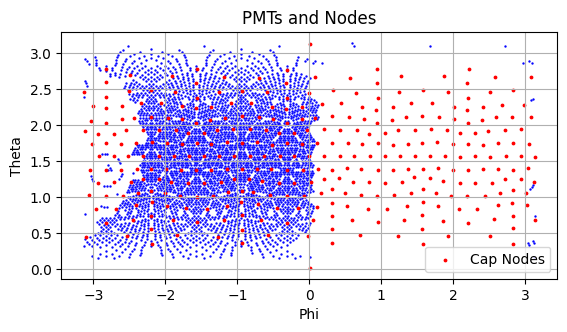

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


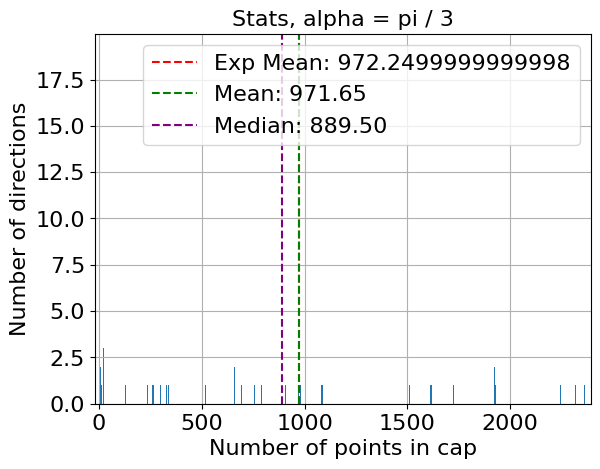

Saving CSV to: PMTSet13_stats.csv
             Metric   alpha = pi/3
0      vector sum x     726.817697
1      vector sum y   -2103.023529
2      vector sum z      44.258754
3   vector sum norm    2225.518090
4           total N    3889.000000
5              mean     971.654971
6            median     889.500000
7          variance  564133.968674
8             stdev     751.088523
9  normalized stdev       0.772999
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


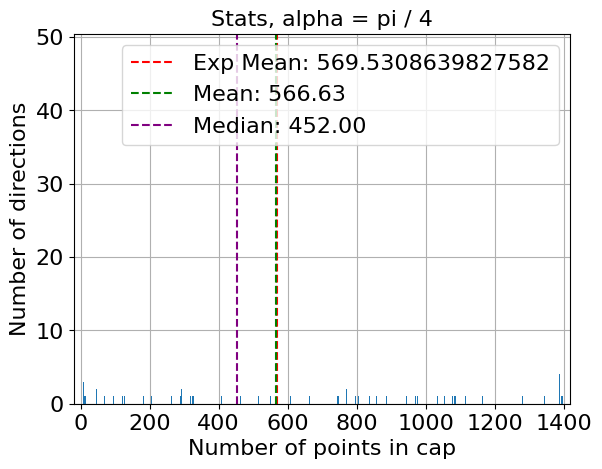

Saving CSV to: PMTSet13_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x     726.817697     726.817697
1      vector sum y   -2103.023529   -2103.023529
2      vector sum z      44.258754      44.258754
3   vector sum norm    2225.518090    2225.518090
4           total N    3889.000000    3889.000000
5              mean     971.654971     566.628655
6            median     889.500000     452.000000
7          variance  564133.968674  257036.011226
8             stdev     751.088523     506.987190
9  normalized stdev       0.772999       0.894743
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


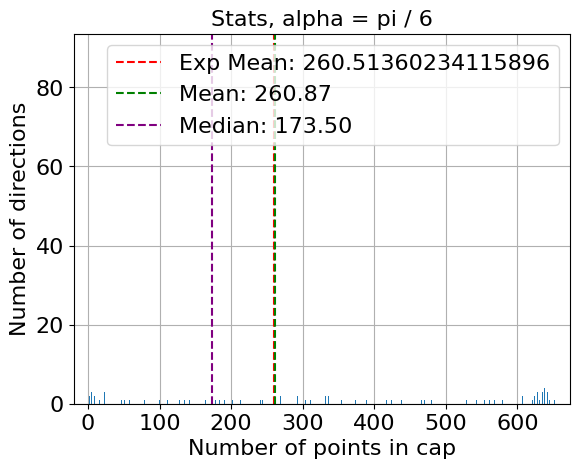

Saving CSV to: PMTSet13_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x     726.817697     726.817697    726.817697
1      vector sum y   -2103.023529   -2103.023529  -2103.023529
2      vector sum z      44.258754      44.258754     44.258754
3   vector sum norm    2225.518090    2225.518090   2225.518090
4           total N    3889.000000    3889.000000   3889.000000
5              mean     971.654971     566.628655    260.871345
6            median     889.500000     452.000000    173.500000
7          variance  564133.968674  257036.011226  68771.597483
8             stdev     751.088523     506.987190    262.243394
9  normalized stdev       0.772999       0.894743      1.005259
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


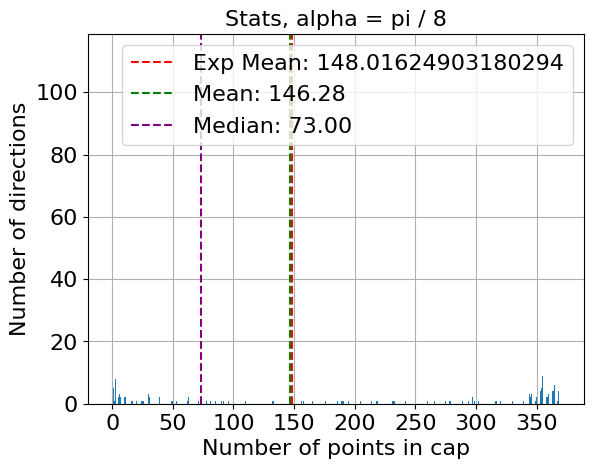

Saving CSV to: PMTSet13_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     726.817697     726.817697    726.817697    726.817697
1      vector sum y   -2103.023529   -2103.023529  -2103.023529  -2103.023529
2      vector sum z      44.258754      44.258754     44.258754     44.258754
3   vector sum norm    2225.518090    2225.518090   2225.518090   2225.518090
4           total N    3889.000000    3889.000000   3889.000000   3889.000000
5              mean     971.654971     566.628655    260.871345    146.280702
6            median     889.500000     452.000000    173.500000     73.000000
7          variance  564133.968674  257036.011226  68771.597483  23975.301323
8             stdev     751.088523     506.987190    262.243394    154.839599
9  normalized stdev       0.772999       0.894743      1.005259      1.058510
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

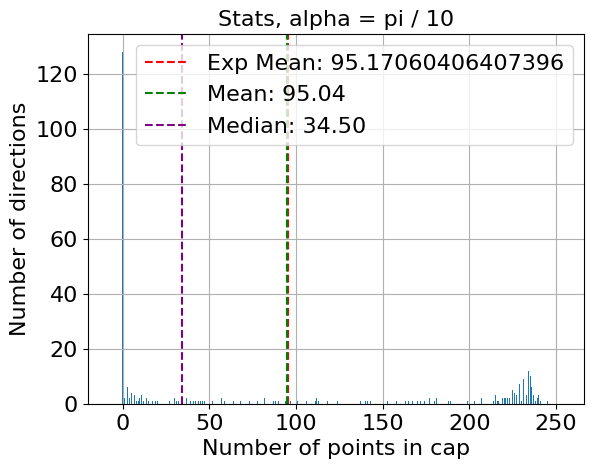

Saving CSV to: PMTSet13_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     726.817697     726.817697    726.817697    726.817697   
1      vector sum y   -2103.023529   -2103.023529  -2103.023529  -2103.023529   
2      vector sum z      44.258754      44.258754     44.258754     44.258754   
3   vector sum norm    2225.518090    2225.518090   2225.518090   2225.518090   
4           total N    3889.000000    3889.000000   3889.000000   3889.000000   
5              mean     971.654971     566.628655    260.871345    146.280702   
6            median     889.500000     452.000000    173.500000     73.000000   
7          variance  564133.968674  257036.011226  68771.597483  23975.301323   
8             stdev     751.088523     506.987190    262.243394    154.839599   
9  normalized stdev       0.772999       0.894743      1.005259      1.058510   

   alpha = pi/10  
0     726.817697  
1   -2103.023529  
2      44.258754 

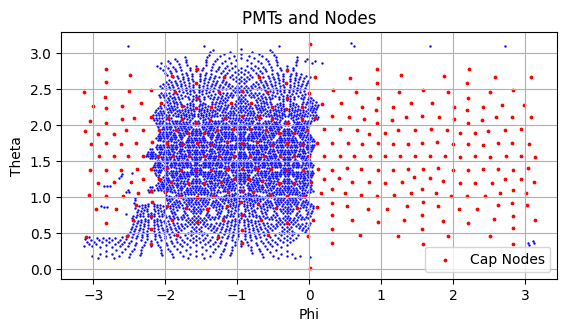

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


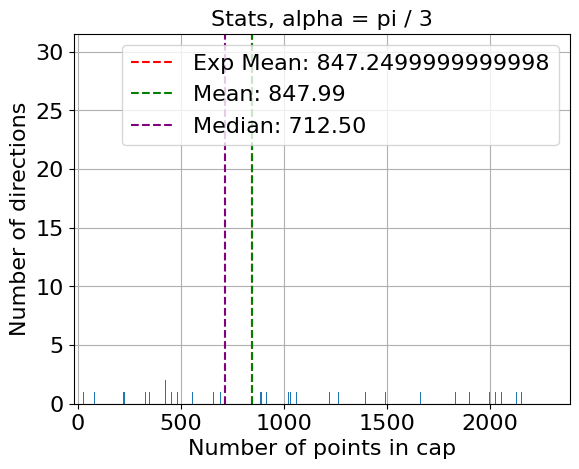

Saving CSV to: PMTSet14_stats.csv
             Metric   alpha = pi/3
0      vector sum x     979.401174
1      vector sum y   -1863.609880
2      vector sum z     105.506158
3   vector sum norm    2107.937379
4           total N    3389.000000
5              mean     847.988304
6            median     712.500000
7          variance  517208.836121
8             stdev     719.172327
9  normalized stdev       0.848092
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


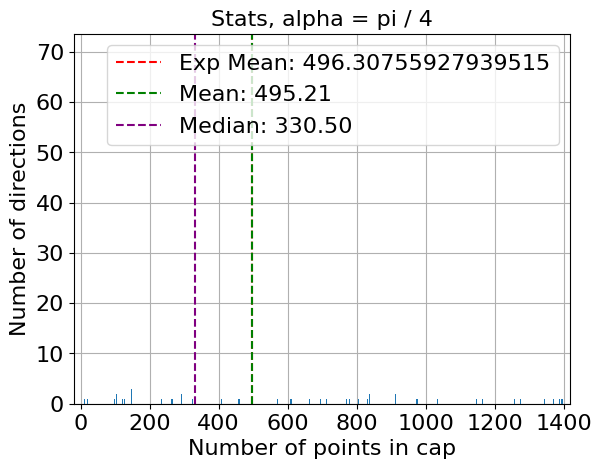

Saving CSV to: PMTSet14_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x     979.401174     979.401174
1      vector sum y   -1863.609880   -1863.609880
2      vector sum z     105.506158     105.506158
3   vector sum norm    2107.937379    2107.937379
4           total N    3389.000000    3389.000000
5              mean     847.988304     495.213450
6            median     712.500000     330.500000
7          variance  517208.836121  238646.898883
8             stdev     719.172327     488.514994
9  normalized stdev       0.848092       0.986474
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


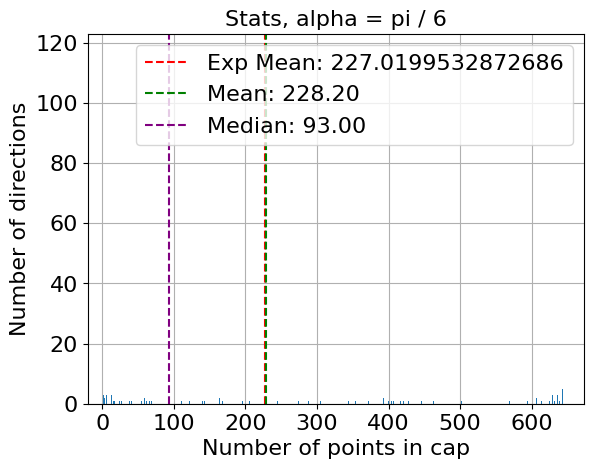

Saving CSV to: PMTSet14_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x     979.401174     979.401174    979.401174
1      vector sum y   -1863.609880   -1863.609880  -1863.609880
2      vector sum z     105.506158     105.506158    105.506158
3   vector sum norm    2107.937379    2107.937379   2107.937379
4           total N    3389.000000    3389.000000   3389.000000
5              mean     847.988304     495.213450    228.195906
6            median     712.500000     330.500000     93.000000
7          variance  517208.836121  238646.898883  64430.754018
8             stdev     719.172327     488.514994    253.832137
9  normalized stdev       0.848092       0.986474      1.112343
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


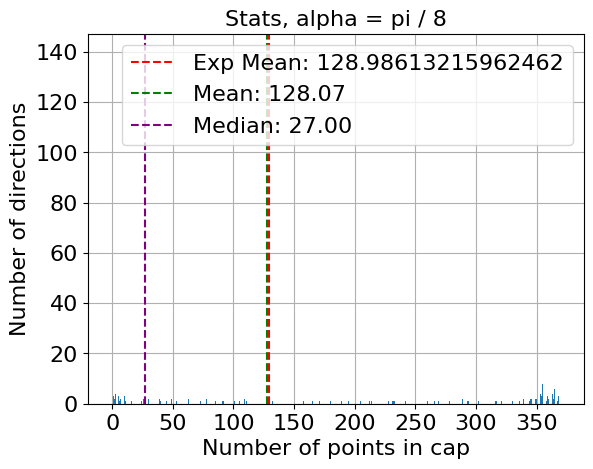

Saving CSV to: PMTSet14_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     979.401174     979.401174    979.401174    979.401174
1      vector sum y   -1863.609880   -1863.609880  -1863.609880  -1863.609880
2      vector sum z     105.506158     105.506158    105.506158    105.506158
3   vector sum norm    2107.937379    2107.937379   2107.937379   2107.937379
4           total N    3389.000000    3389.000000   3389.000000   3389.000000
5              mean     847.988304     495.213450    228.195906    128.070175
6            median     712.500000     330.500000     93.000000     27.000000
7          variance  517208.836121  238646.898883  64430.754018  22554.854725
8             stdev     719.172327     488.514994    253.832137    150.182738
9  normalized stdev       0.848092       0.986474      1.112343      1.172660
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

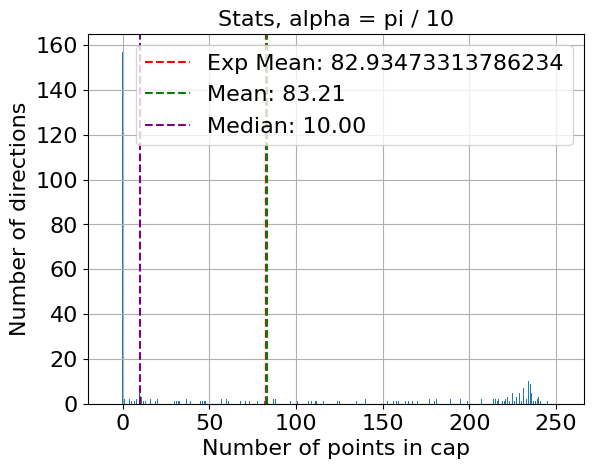

Saving CSV to: PMTSet14_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     979.401174     979.401174    979.401174    979.401174   
1      vector sum y   -1863.609880   -1863.609880  -1863.609880  -1863.609880   
2      vector sum z     105.506158     105.506158    105.506158    105.506158   
3   vector sum norm    2107.937379    2107.937379   2107.937379   2107.937379   
4           total N    3389.000000    3389.000000   3389.000000   3389.000000   
5              mean     847.988304     495.213450    228.195906    128.070175   
6            median     712.500000     330.500000     93.000000     27.000000   
7          variance  517208.836121  238646.898883  64430.754018  22554.854725   
8             stdev     719.172327     488.514994    253.832137    150.182738   
9  normalized stdev       0.848092       0.986474      1.112343      1.172660   

   alpha = pi/10  
0     979.401174  
1   -1863.609880  
2     105.506158 

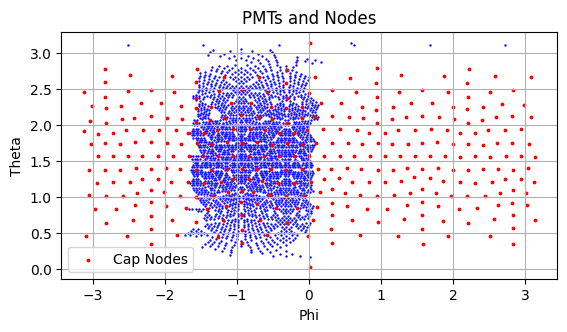

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


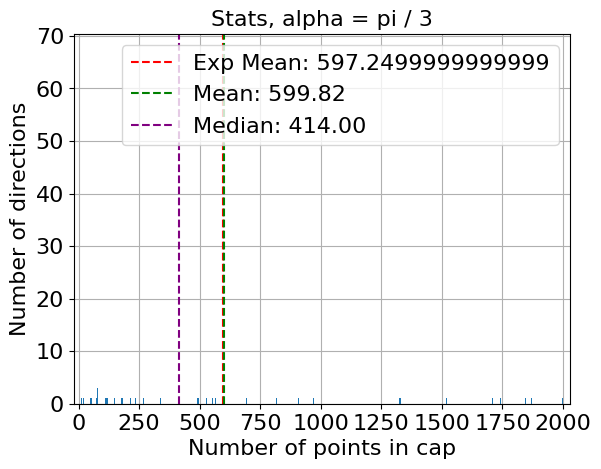

Saving CSV to: PMTSet15_stats.csv
             Metric   alpha = pi/3
0      vector sum x    1224.030342
1      vector sum y   -1193.754291
2      vector sum z     -35.748476
3   vector sum norm    1710.139626
4           total N    2389.000000
5              mean     599.818713
6            median     414.000000
7          variance  360997.347252
8             stdev     600.830548
9  normalized stdev       1.001687
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


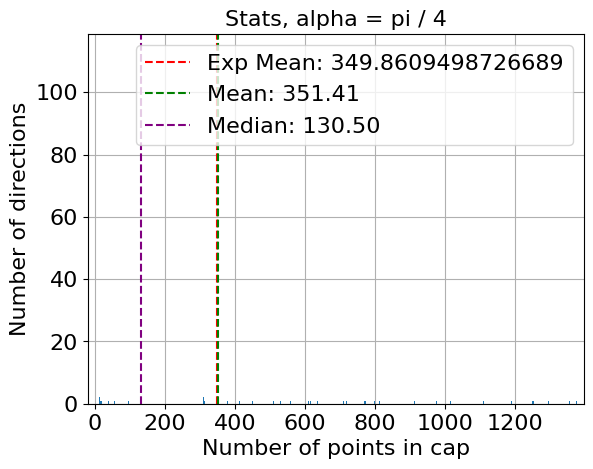

Saving CSV to: PMTSet15_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x    1224.030342    1224.030342
1      vector sum y   -1193.754291   -1193.754291
2      vector sum z     -35.748476     -35.748476
3   vector sum norm    1710.139626    1710.139626
4           total N    2389.000000    2389.000000
5              mean     599.818713     351.406433
6            median     414.000000     130.500000
7          variance  360997.347252  176793.902064
8             stdev     600.830548     420.468670
9  normalized stdev       1.001687       1.196531
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


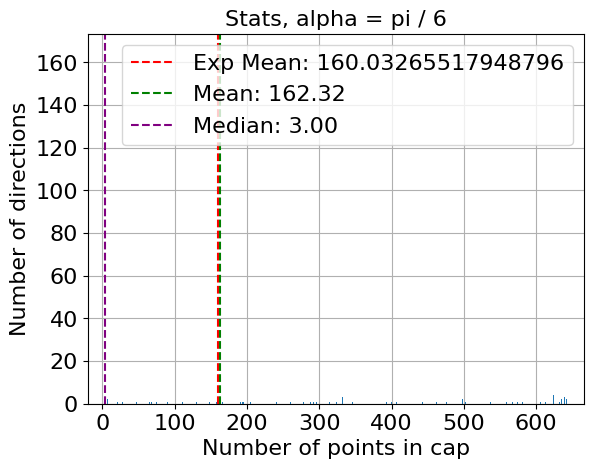

Saving CSV to: PMTSet15_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x    1224.030342    1224.030342   1224.030342
1      vector sum y   -1193.754291   -1193.754291  -1193.754291
2      vector sum z     -35.748476     -35.748476    -35.748476
3   vector sum norm    1710.139626    1710.139626   1710.139626
4           total N    2389.000000    2389.000000   2389.000000
5              mean     599.818713     351.406433    162.315789
6            median     414.000000     130.500000      3.000000
7          variance  360997.347252  176793.902064  50131.286242
8             stdev     600.830548     420.468670    223.900170
9  normalized stdev       1.001687       1.196531      1.379411
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


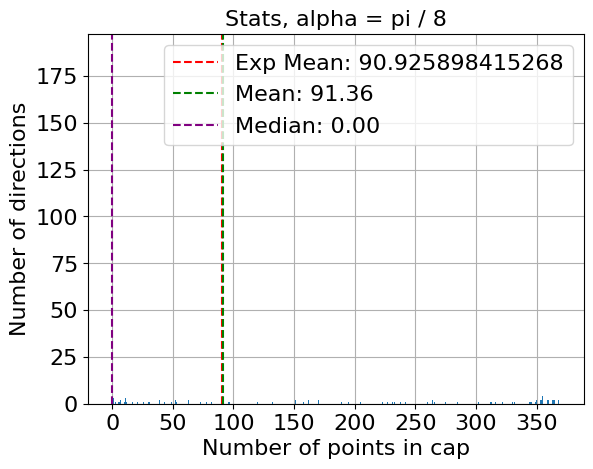

Saving CSV to: PMTSet15_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    1224.030342    1224.030342   1224.030342   1224.030342
1      vector sum y   -1193.754291   -1193.754291  -1193.754291  -1193.754291
2      vector sum z     -35.748476     -35.748476    -35.748476    -35.748476
3   vector sum norm    1710.139626    1710.139626   1710.139626   1710.139626
4           total N    2389.000000    2389.000000   2389.000000   2389.000000
5              mean     599.818713     351.406433    162.315789     91.362573
6            median     414.000000     130.500000      3.000000      0.000000
7          variance  360997.347252  176793.902064  50131.286242  17962.043979
8             stdev     600.830548     420.468670    223.900170    134.022550
9  normalized stdev       1.001687       1.196531      1.379411      1.466931
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; no

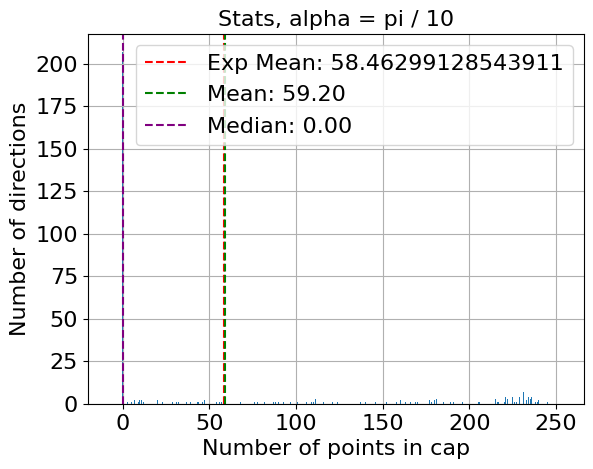

Saving CSV to: PMTSet15_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    1224.030342    1224.030342   1224.030342   1224.030342   
1      vector sum y   -1193.754291   -1193.754291  -1193.754291  -1193.754291   
2      vector sum z     -35.748476     -35.748476    -35.748476    -35.748476   
3   vector sum norm    1710.139626    1710.139626   1710.139626   1710.139626   
4           total N    2389.000000    2389.000000   2389.000000   2389.000000   
5              mean     599.818713     351.406433    162.315789     91.362573   
6            median     414.000000     130.500000      3.000000      0.000000   
7          variance  360997.347252  176793.902064  50131.286242  17962.043979   
8             stdev     600.830548     420.468670    223.900170    134.022550   
9  normalized stdev       1.001687       1.196531      1.379411      1.466931   

   alpha = pi/10  
0    1224.030342  
1   -1193.754291  
2     -35.748476 

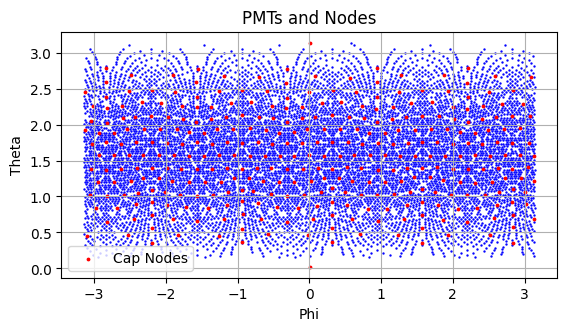

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


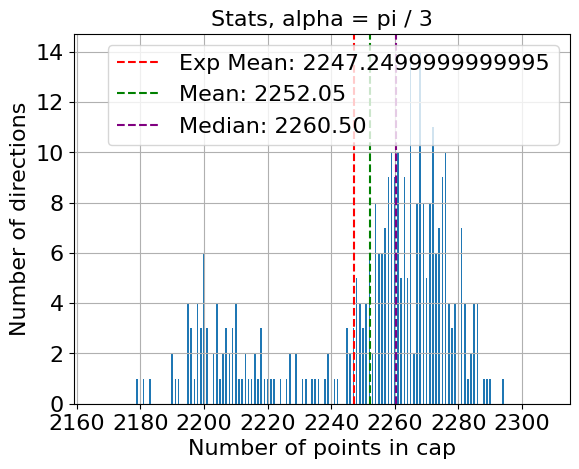

Saving CSV to: PMTSet16_stats.csv
             Metric  alpha = pi/3
0      vector sum x     -7.834066
1      vector sum y    -18.180175
2      vector sum z    -55.773744
3   vector sum norm     59.182783
4           total N   8989.000000
5              mean   2252.052632
6            median   2260.500000
7          variance    724.207756
8             stdev     26.911108
9  normalized stdev      0.011950
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


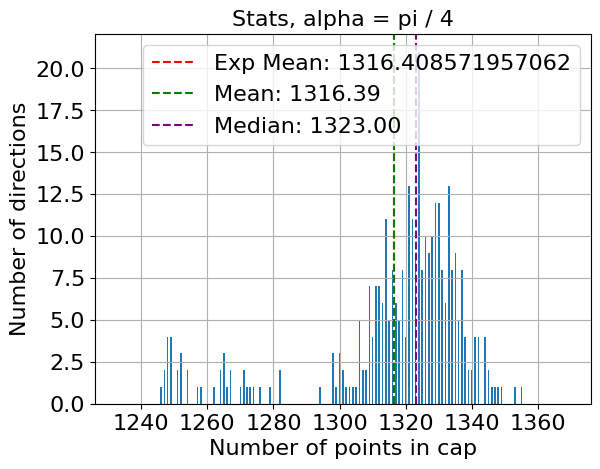

Saving CSV to: PMTSet16_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     -7.834066     -7.834066
1      vector sum y    -18.180175    -18.180175
2      vector sum z    -55.773744    -55.773744
3   vector sum norm     59.182783     59.182783
4           total N   8989.000000   8989.000000
5              mean   2252.052632   1316.388889
6            median   2260.500000   1323.000000
7          variance    724.207756    551.956953
8             stdev     26.911108     23.493764
9  normalized stdev      0.011950      0.017847
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


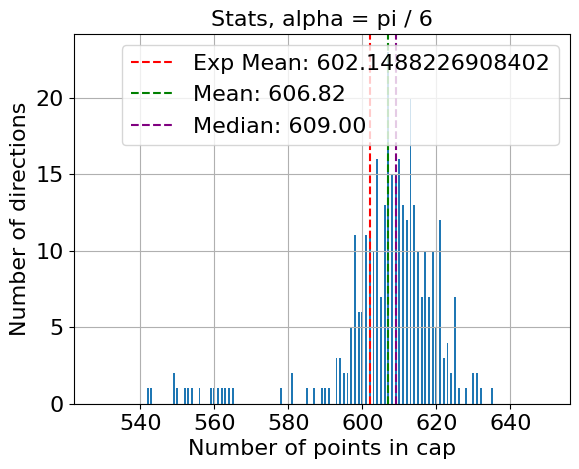

Saving CSV to: PMTSet16_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     -7.834066     -7.834066     -7.834066
1      vector sum y    -18.180175    -18.180175    -18.180175
2      vector sum z    -55.773744    -55.773744    -55.773744
3   vector sum norm     59.182783     59.182783     59.182783
4           total N   8989.000000   8989.000000   8989.000000
5              mean   2252.052632   1316.388889    606.821637
6            median   2260.500000   1323.000000    609.000000
7          variance    724.207756    551.956953    208.298596
8             stdev     26.911108     23.493764     14.432553
9  normalized stdev      0.011950      0.017847      0.023784
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


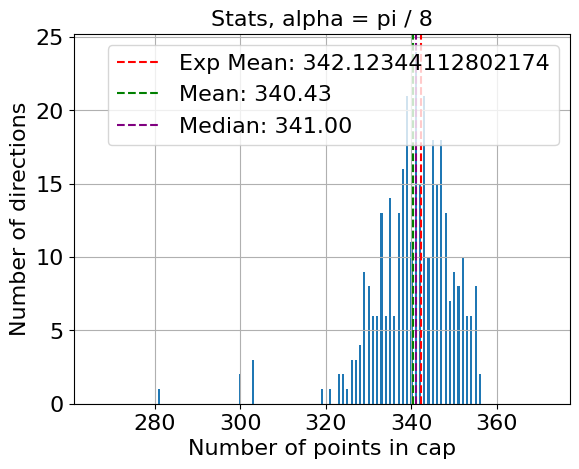

Saving CSV to: PMTSet16_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -7.834066     -7.834066     -7.834066     -7.834066
1      vector sum y    -18.180175    -18.180175    -18.180175    -18.180175
2      vector sum z    -55.773744    -55.773744    -55.773744    -55.773744
3   vector sum norm     59.182783     59.182783     59.182783     59.182783
4           total N   8989.000000   8989.000000   8989.000000   8989.000000
5              mean   2252.052632   1316.388889    606.821637    340.432749
6            median   2260.500000   1323.000000    609.000000    341.000000
7          variance    724.207756    551.956953    208.298596     88.555419
8             stdev     26.911108     23.493764     14.432553      9.410389
9  normalized stdev      0.011950      0.017847      0.023784      0.027642
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

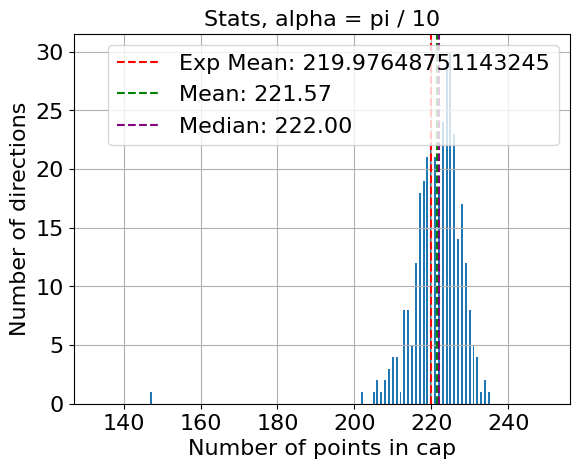

Saving CSV to: PMTSet16_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -7.834066     -7.834066     -7.834066     -7.834066   
1      vector sum y    -18.180175    -18.180175    -18.180175    -18.180175   
2      vector sum z    -55.773744    -55.773744    -55.773744    -55.773744   
3   vector sum norm     59.182783     59.182783     59.182783     59.182783   
4           total N   8989.000000   8989.000000   8989.000000   8989.000000   
5              mean   2252.052632   1316.388889    606.821637    340.432749   
6            median   2260.500000   1323.000000    609.000000    341.000000   
7          variance    724.207756    551.956953    208.298596     88.555419   
8             stdev     26.911108     23.493764     14.432553      9.410389   
9  normalized stdev      0.011950      0.017847      0.023784      0.027642   

   alpha = pi/10  
0      -7.834066  
1     -18.180175  
2     -55.773744  
3      59.182783  
4

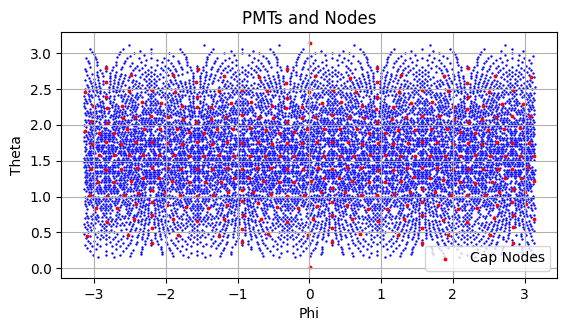

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


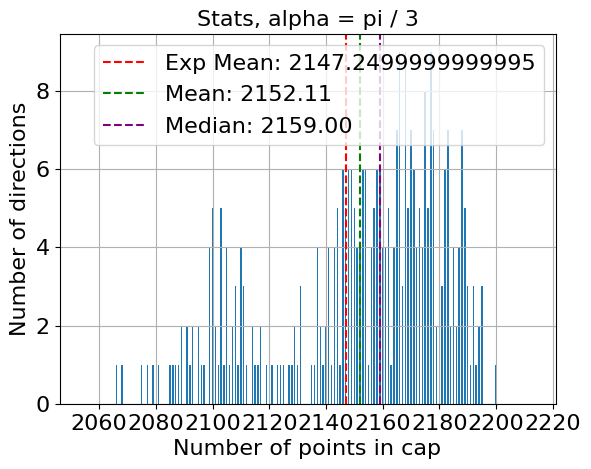

Saving CSV to: PMTSet17_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -19.642617
1      vector sum y     21.899784
2      vector sum z    -61.934133
3   vector sum norm     68.565806
4           total N   8589.000000
5              mean   2152.108187
6            median   2159.000000
7          variance    901.856717
8             stdev     30.030929
9  normalized stdev      0.013954
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


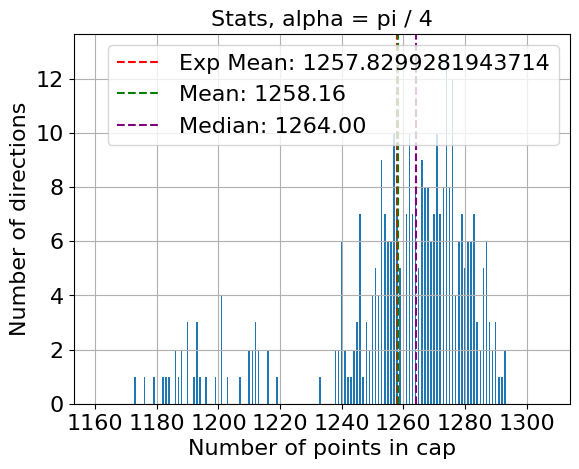

Saving CSV to: PMTSet17_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -19.642617    -19.642617
1      vector sum y     21.899784     21.899784
2      vector sum z    -61.934133    -61.934133
3   vector sum norm     68.565806     68.565806
4           total N   8589.000000   8589.000000
5              mean   2152.108187   1258.163743
6            median   2159.000000   1264.000000
7          variance    901.856717    664.961492
8             stdev     30.030929     25.786847
9  normalized stdev      0.013954      0.020496
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


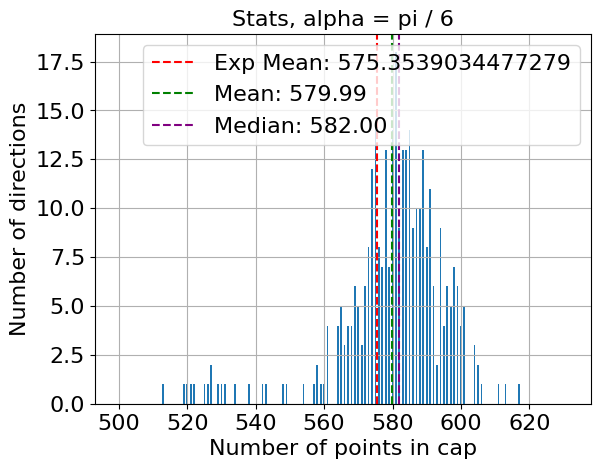

Saving CSV to: PMTSet17_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -19.642617    -19.642617    -19.642617
1      vector sum y     21.899784     21.899784     21.899784
2      vector sum z    -61.934133    -61.934133    -61.934133
3   vector sum norm     68.565806     68.565806     68.565806
4           total N   8589.000000   8589.000000   8589.000000
5              mean   2152.108187   1258.163743    579.988304
6            median   2159.000000   1264.000000    582.000000
7          variance    901.856717    664.961492    250.420916
8             stdev     30.030929     25.786847     15.824693
9  normalized stdev      0.013954      0.020496      0.027285
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


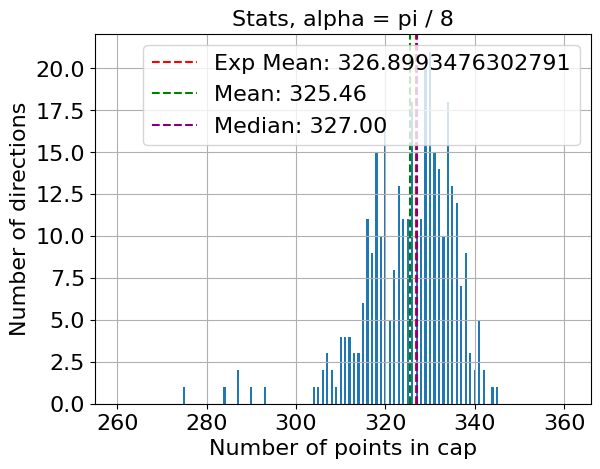

Saving CSV to: PMTSet17_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -19.642617    -19.642617    -19.642617    -19.642617
1      vector sum y     21.899784     21.899784     21.899784     21.899784
2      vector sum z    -61.934133    -61.934133    -61.934133    -61.934133
3   vector sum norm     68.565806     68.565806     68.565806     68.565806
4           total N   8589.000000   8589.000000   8589.000000   8589.000000
5              mean   2152.108187   1258.163743    579.988304    325.461988
6            median   2159.000000   1264.000000    582.000000    327.000000
7          variance    901.856717    664.961492    250.420916     96.008789
8             stdev     30.030929     25.786847     15.824693      9.798407
9  normalized stdev      0.013954      0.020496      0.027285      0.030106
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

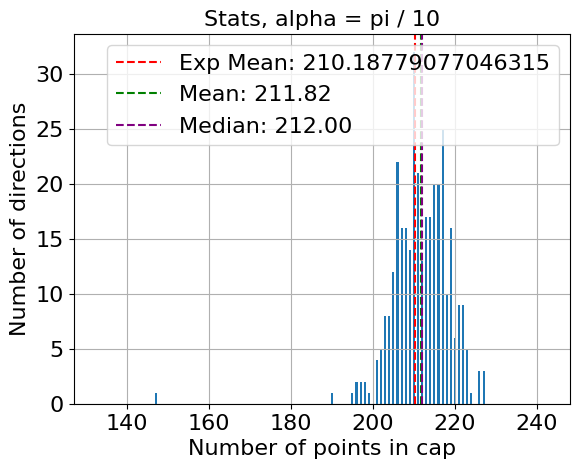

Saving CSV to: PMTSet17_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -19.642617    -19.642617    -19.642617    -19.642617   
1      vector sum y     21.899784     21.899784     21.899784     21.899784   
2      vector sum z    -61.934133    -61.934133    -61.934133    -61.934133   
3   vector sum norm     68.565806     68.565806     68.565806     68.565806   
4           total N   8589.000000   8589.000000   8589.000000   8589.000000   
5              mean   2152.108187   1258.163743    579.988304    325.461988   
6            median   2159.000000   1264.000000    582.000000    327.000000   
7          variance    901.856717    664.961492    250.420916     96.008789   
8             stdev     30.030929     25.786847     15.824693      9.798407   
9  normalized stdev      0.013954      0.020496      0.027285      0.030106   

   alpha = pi/10  
0     -19.642617  
1      21.899784  
2     -61.934133  
3      68.565806  
4

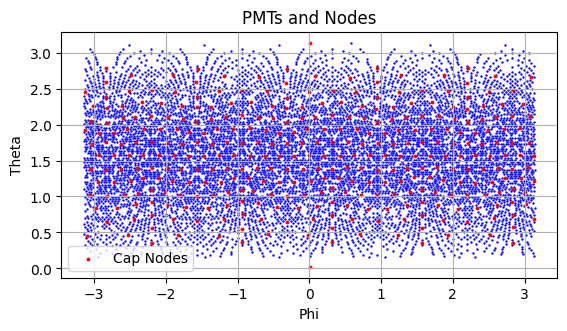

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


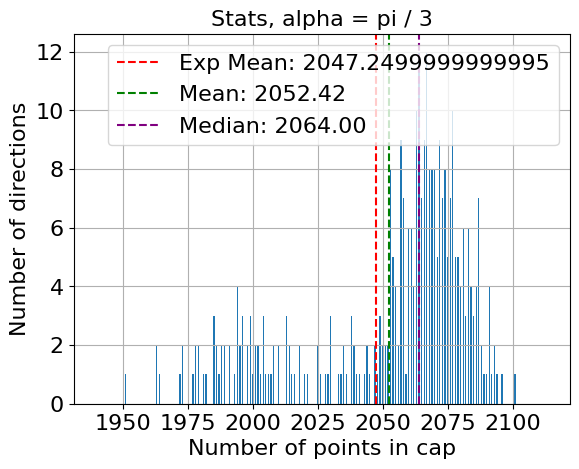

Saving CSV to: PMTSet18_stats.csv
             Metric  alpha = pi/3
0      vector sum x     -9.977834
1      vector sum y    -16.516265
2      vector sum z    -74.439679
3   vector sum norm     76.900000
4           total N   8189.000000
5              mean   2052.421053
6            median   2064.000000
7          variance   1036.588797
8             stdev     32.196099
9  normalized stdev      0.015687
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


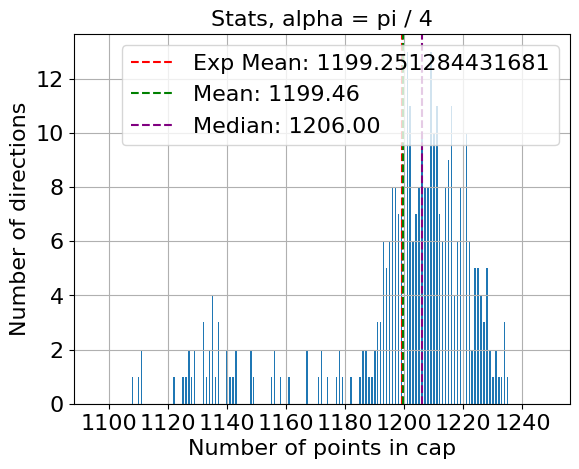

Saving CSV to: PMTSet18_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     -9.977834     -9.977834
1      vector sum y    -16.516265    -16.516265
2      vector sum z    -74.439679    -74.439679
3   vector sum norm     76.900000     76.900000
4           total N   8189.000000   8189.000000
5              mean   2052.421053   1199.456140
6            median   2064.000000   1206.000000
7          variance   1036.588797    705.704217
8             stdev     32.196099     26.565094
9  normalized stdev      0.015687      0.022148
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


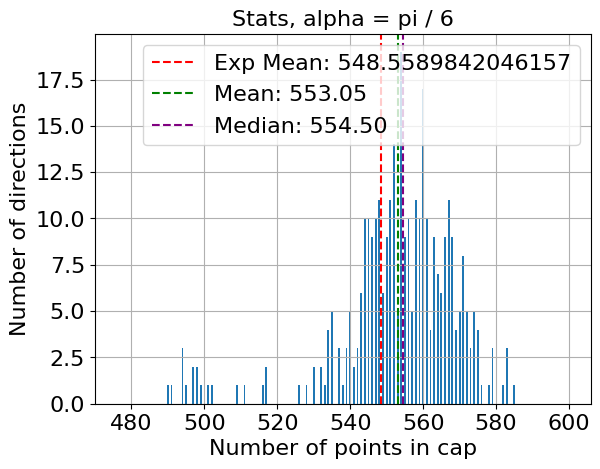

Saving CSV to: PMTSet18_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     -9.977834     -9.977834     -9.977834
1      vector sum y    -16.516265    -16.516265    -16.516265
2      vector sum z    -74.439679    -74.439679    -74.439679
3   vector sum norm     76.900000     76.900000     76.900000
4           total N   8189.000000   8189.000000   8189.000000
5              mean   2052.421053   1199.456140    553.052632
6            median   2064.000000   1206.000000    554.500000
7          variance   1036.588797    705.704217    274.687288
8             stdev     32.196099     26.565094     16.573693
9  normalized stdev      0.015687      0.022148      0.029968
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


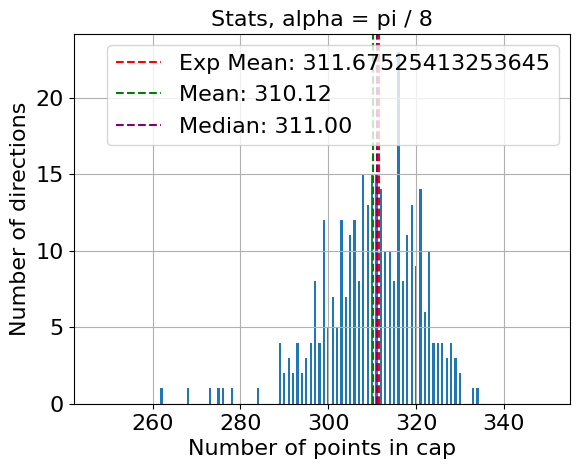

Saving CSV to: PMTSet18_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -9.977834     -9.977834     -9.977834     -9.977834
1      vector sum y    -16.516265    -16.516265    -16.516265    -16.516265
2      vector sum z    -74.439679    -74.439679    -74.439679    -74.439679
3   vector sum norm     76.900000     76.900000     76.900000     76.900000
4           total N   8189.000000   8189.000000   8189.000000   8189.000000
5              mean   2052.421053   1199.456140    553.052632    310.116959
6            median   2064.000000   1206.000000    554.500000    311.000000
7          variance   1036.588797    705.704217    274.687288    115.962929
8             stdev     32.196099     26.565094     16.573693     10.768608
9  normalized stdev      0.015687      0.022148      0.029968      0.034724
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

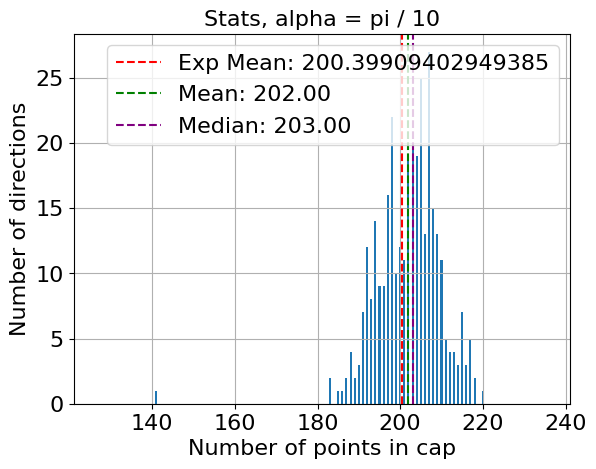

Saving CSV to: PMTSet18_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -9.977834     -9.977834     -9.977834     -9.977834   
1      vector sum y    -16.516265    -16.516265    -16.516265    -16.516265   
2      vector sum z    -74.439679    -74.439679    -74.439679    -74.439679   
3   vector sum norm     76.900000     76.900000     76.900000     76.900000   
4           total N   8189.000000   8189.000000   8189.000000   8189.000000   
5              mean   2052.421053   1199.456140    553.052632    310.116959   
6            median   2064.000000   1206.000000    554.500000    311.000000   
7          variance   1036.588797    705.704217    274.687288    115.962929   
8             stdev     32.196099     26.565094     16.573693     10.768608   
9  normalized stdev      0.015687      0.022148      0.029968      0.034724   

   alpha = pi/10  
0      -9.977834  
1     -16.516265  
2     -74.439679  
3      76.900000  
4

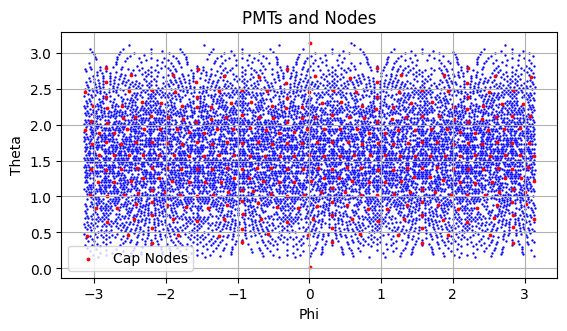

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


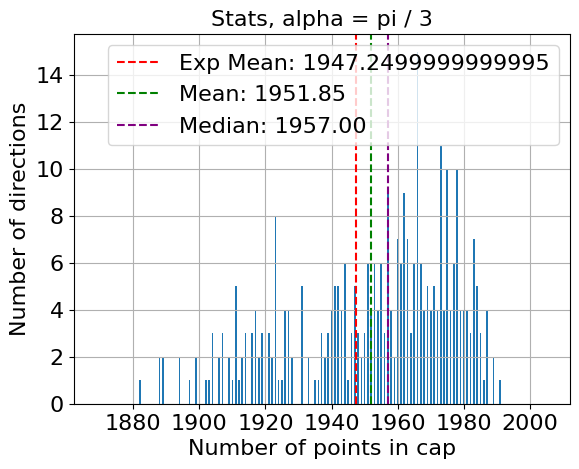

Saving CSV to: PMTSet19_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -20.600340
1      vector sum y     -3.774164
2      vector sum z    -33.231587
3   vector sum norm     39.280488
4           total N   7789.000000
5              mean   1951.853801
6            median   1957.000000
7          variance    603.908450
8             stdev     24.574549
9  normalized stdev      0.012590
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


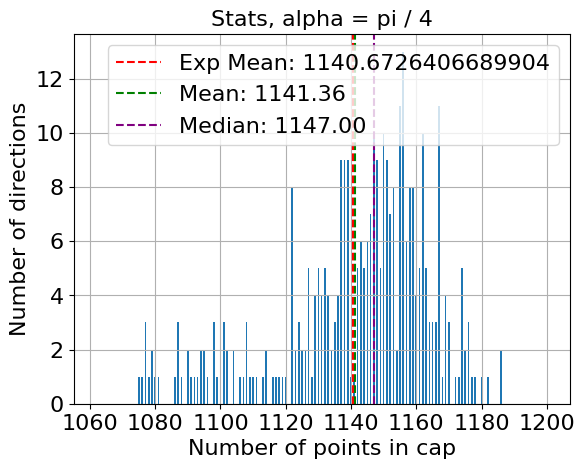

Saving CSV to: PMTSet19_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -20.600340    -20.600340
1      vector sum y     -3.774164     -3.774164
2      vector sum z    -33.231587    -33.231587
3   vector sum norm     39.280488     39.280488
4           total N   7789.000000   7789.000000
5              mean   1951.853801   1141.362573
6            median   1957.000000   1147.000000
7          variance    603.908450    558.856845
8             stdev     24.574549     23.640153
9  normalized stdev      0.012590      0.020712
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


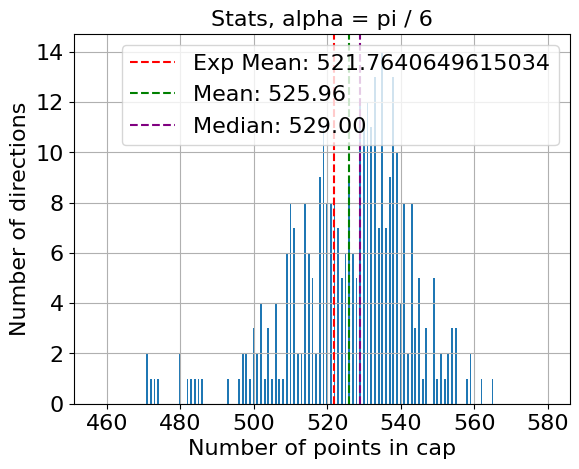

Saving CSV to: PMTSet19_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -20.600340    -20.600340    -20.600340
1      vector sum y     -3.774164     -3.774164     -3.774164
2      vector sum z    -33.231587    -33.231587    -33.231587
3   vector sum norm     39.280488     39.280488     39.280488
4           total N   7789.000000   7789.000000   7789.000000
5              mean   1951.853801   1141.362573    525.964912
6            median   1957.000000   1147.000000    529.000000
7          variance    603.908450    558.856845    263.823330
8             stdev     24.574549     23.640153     16.242639
9  normalized stdev      0.012590      0.020712      0.030882
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


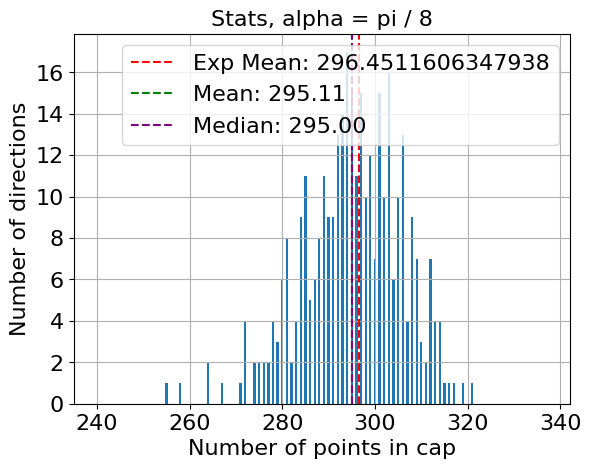

Saving CSV to: PMTSet19_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -20.600340    -20.600340    -20.600340    -20.600340
1      vector sum y     -3.774164     -3.774164     -3.774164     -3.774164
2      vector sum z    -33.231587    -33.231587    -33.231587    -33.231587
3   vector sum norm     39.280488     39.280488     39.280488     39.280488
4           total N   7789.000000   7789.000000   7789.000000   7789.000000
5              mean   1951.853801   1141.362573    525.964912    295.114035
6            median   1957.000000   1147.000000    529.000000    295.000000
7          variance    603.908450    558.856845    263.823330    114.422669
8             stdev     24.574549     23.640153     16.242639     10.696853
9  normalized stdev      0.012590      0.020712      0.030882      0.036247
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

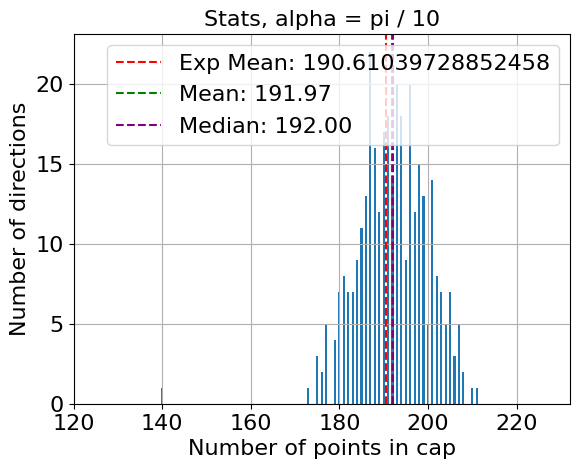

Saving CSV to: PMTSet19_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -20.600340    -20.600340    -20.600340    -20.600340   
1      vector sum y     -3.774164     -3.774164     -3.774164     -3.774164   
2      vector sum z    -33.231587    -33.231587    -33.231587    -33.231587   
3   vector sum norm     39.280488     39.280488     39.280488     39.280488   
4           total N   7789.000000   7789.000000   7789.000000   7789.000000   
5              mean   1951.853801   1141.362573    525.964912    295.114035   
6            median   1957.000000   1147.000000    529.000000    295.000000   
7          variance    603.908450    558.856845    263.823330    114.422669   
8             stdev     24.574549     23.640153     16.242639     10.696853   
9  normalized stdev      0.012590      0.020712      0.030882      0.036247   

   alpha = pi/10  
0     -20.600340  
1      -3.774164  
2     -33.231587  
3      39.280488  
4

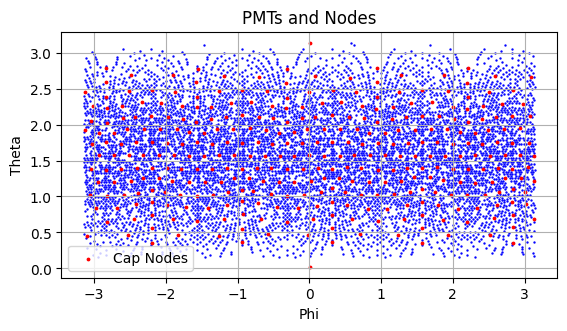

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


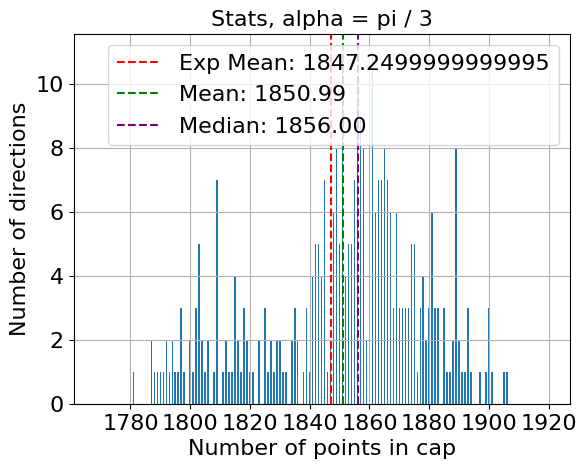

Saving CSV to: PMTSet20_stats.csv
             Metric  alpha = pi/3
0      vector sum x     14.999874
1      vector sum y    -25.302836
2      vector sum z    -54.802505
3   vector sum norm     62.197623
4           total N   7389.000000
5              mean   1850.991228
6            median   1856.000000
7          variance    727.780625
8             stdev     26.977410
9  normalized stdev      0.014575
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


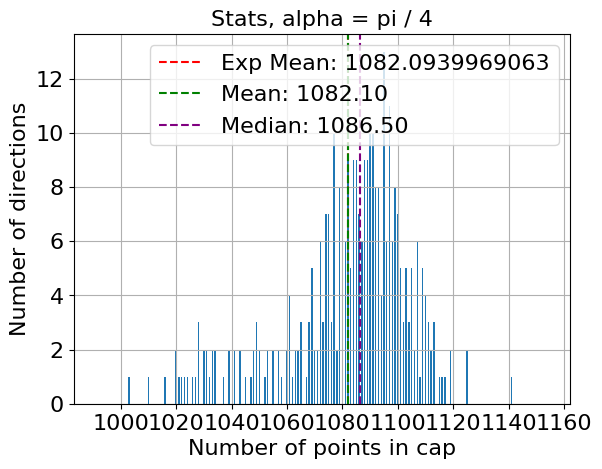

Saving CSV to: PMTSet20_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     14.999874     14.999874
1      vector sum y    -25.302836    -25.302836
2      vector sum z    -54.802505    -54.802505
3   vector sum norm     62.197623     62.197623
4           total N   7389.000000   7389.000000
5              mean   1850.991228   1082.102339
6            median   1856.000000   1086.500000
7          variance    727.780625    507.507071
8             stdev     26.977410     22.527918
9  normalized stdev      0.014575      0.020819
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


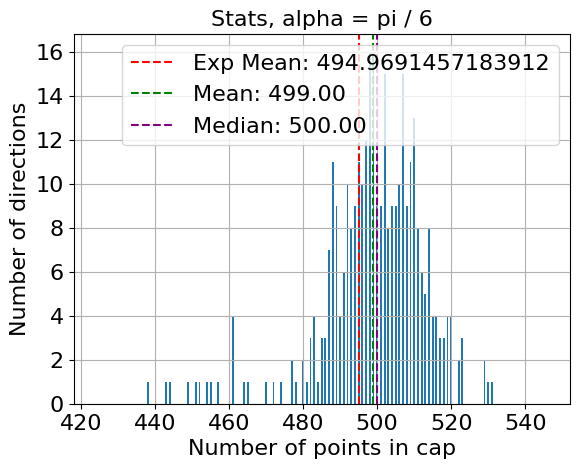

Saving CSV to: PMTSet20_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     14.999874     14.999874     14.999874
1      vector sum y    -25.302836    -25.302836    -25.302836
2      vector sum z    -54.802505    -54.802505    -54.802505
3   vector sum norm     62.197623     62.197623     62.197623
4           total N   7389.000000   7389.000000   7389.000000
5              mean   1850.991228   1082.102339    499.002924
6            median   1856.000000   1086.500000    500.000000
7          variance    727.780625    507.507071    201.002915
8             stdev     26.977410     22.527918     14.177550
9  normalized stdev      0.014575      0.020819      0.028412
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


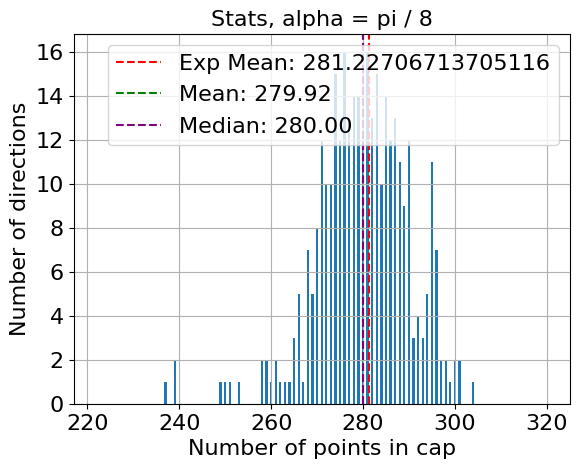

Saving CSV to: PMTSet20_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     14.999874     14.999874     14.999874     14.999874
1      vector sum y    -25.302836    -25.302836    -25.302836    -25.302836
2      vector sum z    -54.802505    -54.802505    -54.802505    -54.802505
3   vector sum norm     62.197623     62.197623     62.197623     62.197623
4           total N   7389.000000   7389.000000   7389.000000   7389.000000
5              mean   1850.991228   1082.102339    499.002924    279.923977
6            median   1856.000000   1086.500000    500.000000    280.000000
7          variance    727.780625    507.507071    201.002915    102.502992
8             stdev     26.977410     22.527918     14.177550     10.124376
9  normalized stdev      0.014575      0.020819      0.028412      0.036168
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

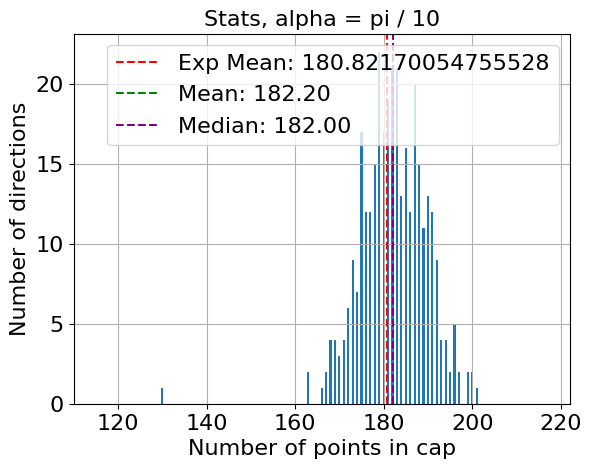

Saving CSV to: PMTSet20_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     14.999874     14.999874     14.999874     14.999874   
1      vector sum y    -25.302836    -25.302836    -25.302836    -25.302836   
2      vector sum z    -54.802505    -54.802505    -54.802505    -54.802505   
3   vector sum norm     62.197623     62.197623     62.197623     62.197623   
4           total N   7389.000000   7389.000000   7389.000000   7389.000000   
5              mean   1850.991228   1082.102339    499.002924    279.923977   
6            median   1856.000000   1086.500000    500.000000    280.000000   
7          variance    727.780625    507.507071    201.002915    102.502992   
8             stdev     26.977410     22.527918     14.177550     10.124376   
9  normalized stdev      0.014575      0.020819      0.028412      0.036168   

   alpha = pi/10  
0      14.999874  
1     -25.302836  
2     -54.802505  
3      62.197623  
4

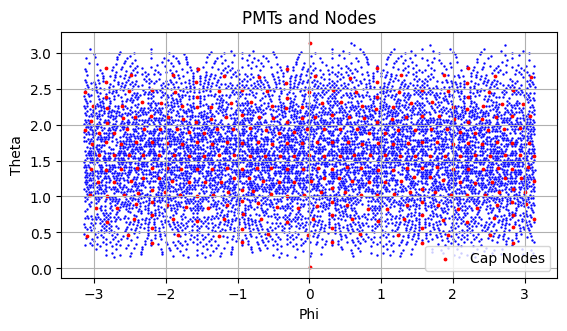

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


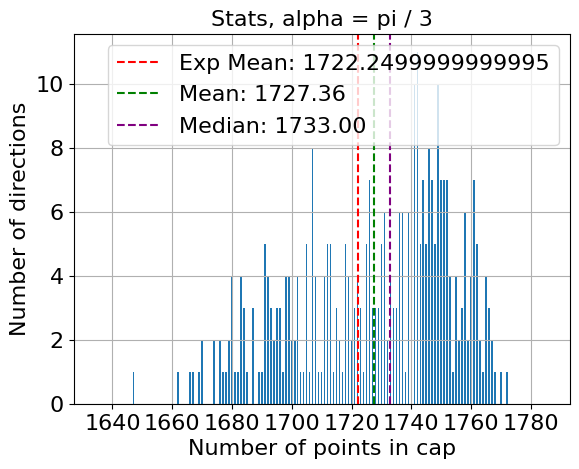

Saving CSV to: PMTSet21_stats.csv
             Metric  alpha = pi/3
0      vector sum x      3.261880
1      vector sum y     11.443528
2      vector sum z    -12.188307
3   vector sum norm     17.033761
4           total N   6889.000000
5              mean   1727.356725
6            median   1733.000000
7          variance    676.311344
8             stdev     26.005987
9  normalized stdev      0.015055
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


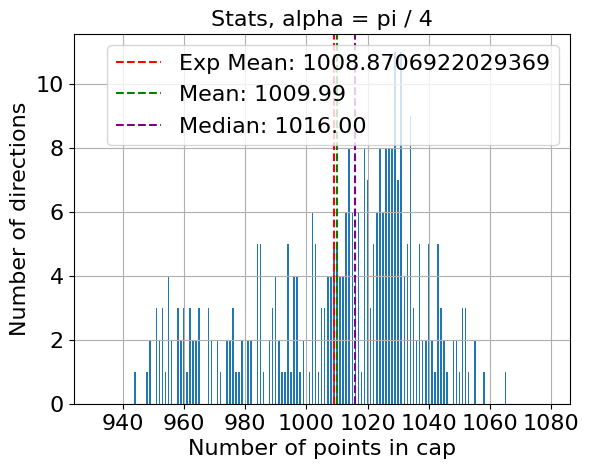

Saving CSV to: PMTSet21_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x      3.261880      3.261880
1      vector sum y     11.443528     11.443528
2      vector sum z    -12.188307    -12.188307
3   vector sum norm     17.033761     17.033761
4           total N   6889.000000   6889.000000
5              mean   1727.356725   1009.985380
6            median   1733.000000   1016.000000
7          variance    676.311344    727.996862
8             stdev     26.005987     26.981417
9  normalized stdev      0.015055      0.026715
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


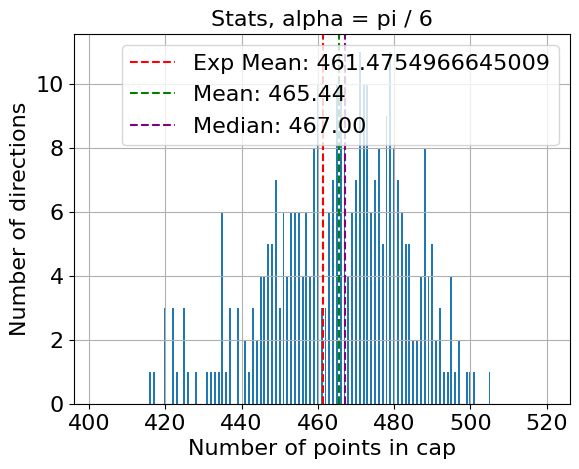

Saving CSV to: PMTSet21_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x      3.261880      3.261880      3.261880
1      vector sum y     11.443528     11.443528     11.443528
2      vector sum z    -12.188307    -12.188307    -12.188307
3   vector sum norm     17.033761     17.033761     17.033761
4           total N   6889.000000   6889.000000   6889.000000
5              mean   1727.356725   1009.985380    465.435673
6            median   1733.000000   1016.000000    467.000000
7          variance    676.311344    727.996862    310.684458
8             stdev     26.005987     26.981417     17.626243
9  normalized stdev      0.015055      0.026715      0.037870
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


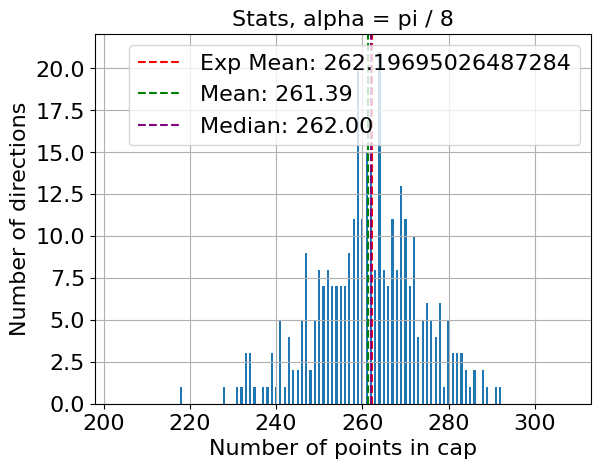

Saving CSV to: PMTSet21_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x      3.261880      3.261880      3.261880      3.261880
1      vector sum y     11.443528     11.443528     11.443528     11.443528
2      vector sum z    -12.188307    -12.188307    -12.188307    -12.188307
3   vector sum norm     17.033761     17.033761     17.033761     17.033761
4           total N   6889.000000   6889.000000   6889.000000   6889.000000
5              mean   1727.356725   1009.985380    465.435673    261.385965
6            median   1733.000000   1016.000000    467.000000    262.000000
7          variance    676.311344    727.996862    310.684458    146.003078
8             stdev     26.005987     26.981417     17.626243     12.083173
9  normalized stdev      0.015055      0.026715      0.037870      0.046227
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

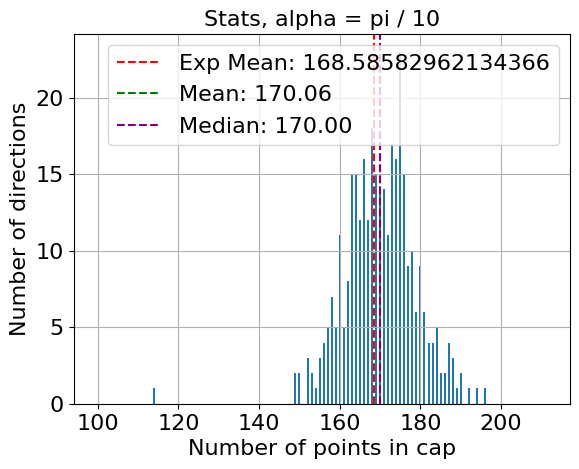

Saving CSV to: PMTSet21_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x      3.261880      3.261880      3.261880      3.261880   
1      vector sum y     11.443528     11.443528     11.443528     11.443528   
2      vector sum z    -12.188307    -12.188307    -12.188307    -12.188307   
3   vector sum norm     17.033761     17.033761     17.033761     17.033761   
4           total N   6889.000000   6889.000000   6889.000000   6889.000000   
5              mean   1727.356725   1009.985380    465.435673    261.385965   
6            median   1733.000000   1016.000000    467.000000    262.000000   
7          variance    676.311344    727.996862    310.684458    146.003078   
8             stdev     26.005987     26.981417     17.626243     12.083173   
9  normalized stdev      0.015055      0.026715      0.037870      0.046227   

   alpha = pi/10  
0       3.261880  
1      11.443528  
2     -12.188307  
3      17.033761  
4

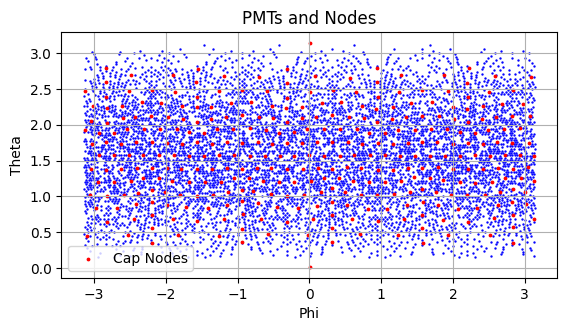

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


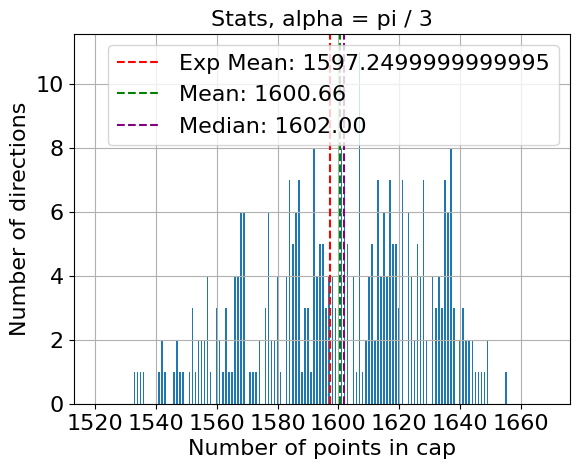

Saving CSV to: PMTSet22_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -35.725916
1      vector sum y     -1.090531
2      vector sum z    -55.817219
3   vector sum norm     66.280407
4           total N   6389.000000
5              mean   1600.660819
6            median   1602.000000
7          variance    741.376184
8             stdev     27.228224
9  normalized stdev      0.017011
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


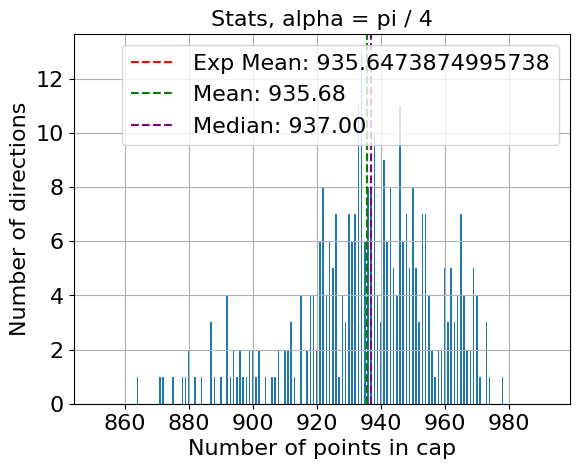

Saving CSV to: PMTSet22_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -35.725916    -35.725916
1      vector sum y     -1.090531     -1.090531
2      vector sum z    -55.817219    -55.817219
3   vector sum norm     66.280407     66.280407
4           total N   6389.000000   6389.000000
5              mean   1600.660819    935.675439
6            median   1602.000000    937.000000
7          variance    741.376184    473.646122
8             stdev     27.228224     21.763412
9  normalized stdev      0.017011      0.023260
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


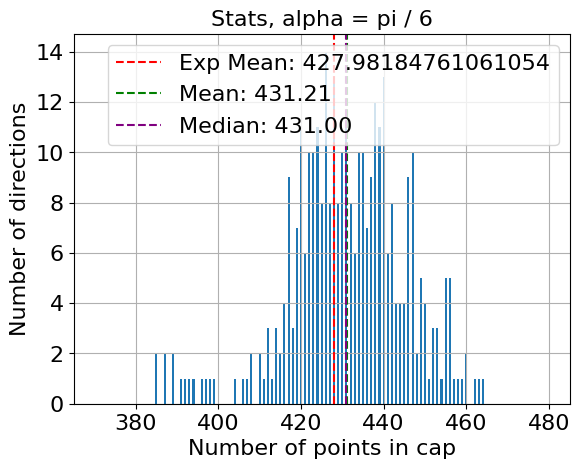

Saving CSV to: PMTSet22_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -35.725916    -35.725916    -35.725916
1      vector sum y     -1.090531     -1.090531     -1.090531
2      vector sum z    -55.817219    -55.817219    -55.817219
3   vector sum norm     66.280407     66.280407     66.280407
4           total N   6389.000000   6389.000000   6389.000000
5              mean   1600.660819    935.675439    431.213450
6            median   1602.000000    937.000000    431.000000
7          variance    741.376184    473.646122    203.904731
8             stdev     27.228224     21.763412     14.279521
9  normalized stdev      0.017011      0.023260      0.033115
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


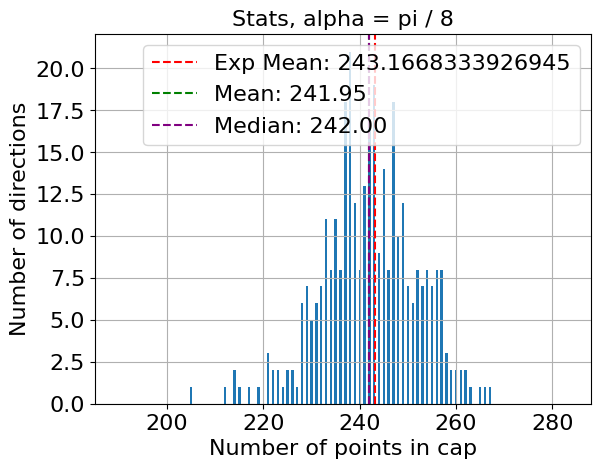

Saving CSV to: PMTSet22_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -35.725916    -35.725916    -35.725916    -35.725916
1      vector sum y     -1.090531     -1.090531     -1.090531     -1.090531
2      vector sum z    -55.817219    -55.817219    -55.817219    -55.817219
3   vector sum norm     66.280407     66.280407     66.280407     66.280407
4           total N   6389.000000   6389.000000   6389.000000   6389.000000
5              mean   1600.660819    935.675439    431.213450    241.953216
6            median   1602.000000    937.000000    431.000000    242.000000
7          variance    741.376184    473.646122    203.904731     98.114770
8             stdev     27.228224     21.763412     14.279521      9.905290
9  normalized stdev      0.017011      0.023260      0.033115      0.040939
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

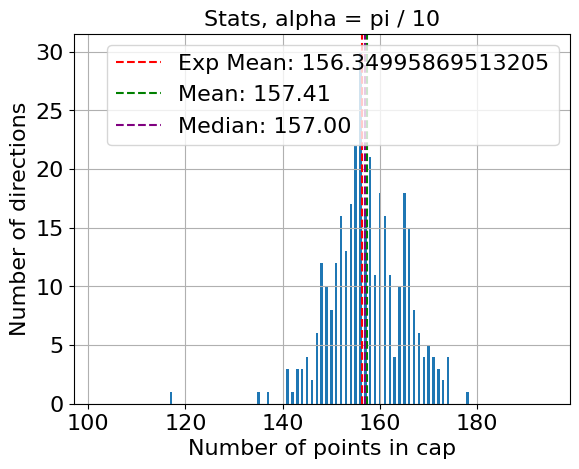

Saving CSV to: PMTSet22_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -35.725916    -35.725916    -35.725916    -35.725916   
1      vector sum y     -1.090531     -1.090531     -1.090531     -1.090531   
2      vector sum z    -55.817219    -55.817219    -55.817219    -55.817219   
3   vector sum norm     66.280407     66.280407     66.280407     66.280407   
4           total N   6389.000000   6389.000000   6389.000000   6389.000000   
5              mean   1600.660819    935.675439    431.213450    241.953216   
6            median   1602.000000    937.000000    431.000000    242.000000   
7          variance    741.376184    473.646122    203.904731     98.114770   
8             stdev     27.228224     21.763412     14.279521      9.905290   
9  normalized stdev      0.017011      0.023260      0.033115      0.040939   

   alpha = pi/10  
0     -35.725916  
1      -1.090531  
2     -55.817219  
3      66.280407  
4

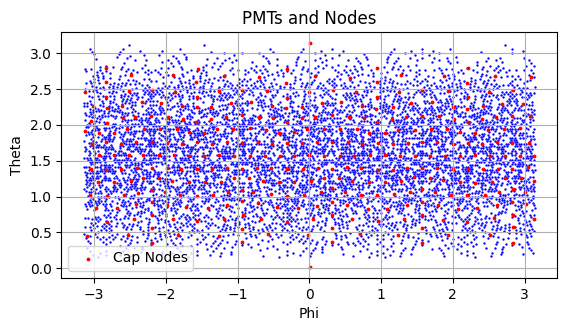

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


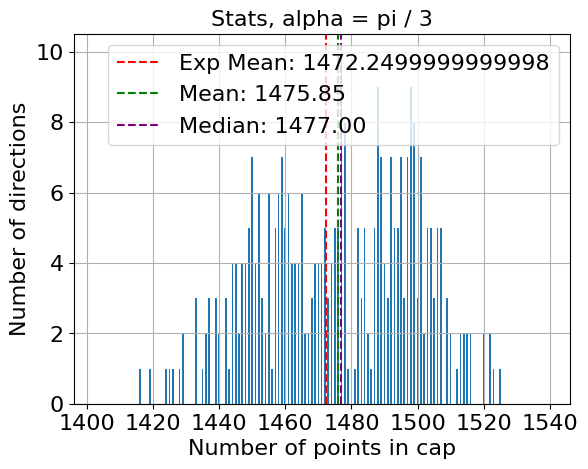

Saving CSV to: PMTSet23_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -17.290219
1      vector sum y     21.734739
2      vector sum z    -27.514377
3   vector sum norm     39.094648
4           total N   5889.000000
5              mean   1475.845029
6            median   1477.000000
7          variance    527.084171
8             stdev     22.958314
9  normalized stdev      0.015556
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


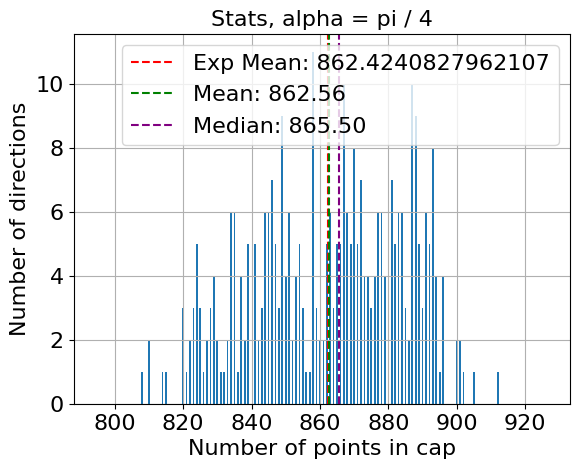

Saving CSV to: PMTSet23_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -17.290219    -17.290219
1      vector sum y     21.734739     21.734739
2      vector sum z    -27.514377    -27.514377
3   vector sum norm     39.094648     39.094648
4           total N   5889.000000   5889.000000
5              mean   1475.845029    862.555556
6            median   1477.000000    865.500000
7          variance    527.084171    489.094867
8             stdev     22.958314     22.115489
9  normalized stdev      0.015556      0.025639
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


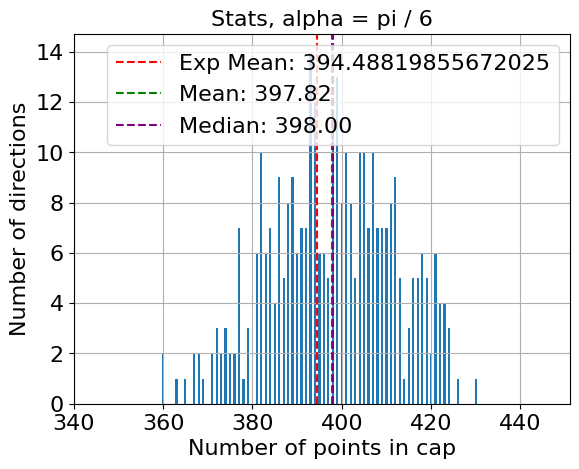

Saving CSV to: PMTSet23_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -17.290219    -17.290219    -17.290219
1      vector sum y     21.734739     21.734739     21.734739
2      vector sum z    -27.514377    -27.514377    -27.514377
3   vector sum norm     39.094648     39.094648     39.094648
4           total N   5889.000000   5889.000000   5889.000000
5              mean   1475.845029    862.555556    397.824561
6            median   1477.000000    865.500000    398.000000
7          variance    527.084171    489.094867    195.226531
8             stdev     22.958314     22.115489     13.972349
9  normalized stdev      0.015556      0.025639      0.035122
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


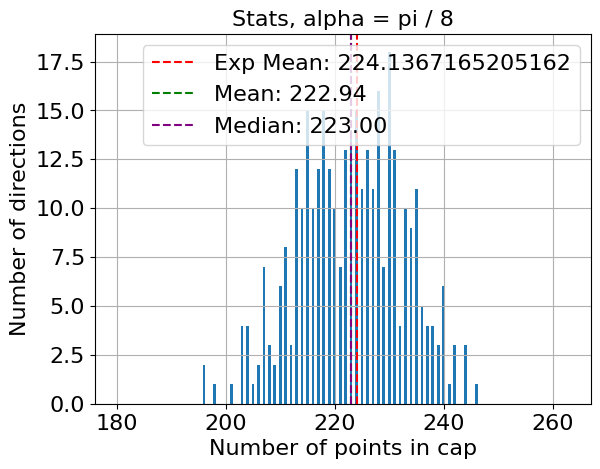

Saving CSV to: PMTSet23_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -17.290219    -17.290219    -17.290219    -17.290219
1      vector sum y     21.734739     21.734739     21.734739     21.734739
2      vector sum z    -27.514377    -27.514377    -27.514377    -27.514377
3   vector sum norm     39.094648     39.094648     39.094648     39.094648
4           total N   5889.000000   5889.000000   5889.000000   5889.000000
5              mean   1475.845029    862.555556    397.824561    222.935673
6            median   1477.000000    865.500000    398.000000    223.000000
7          variance    527.084171    489.094867    195.226531     92.089429
8             stdev     22.958314     22.115489     13.972349      9.596324
9  normalized stdev      0.015556      0.025639      0.035122      0.043045
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

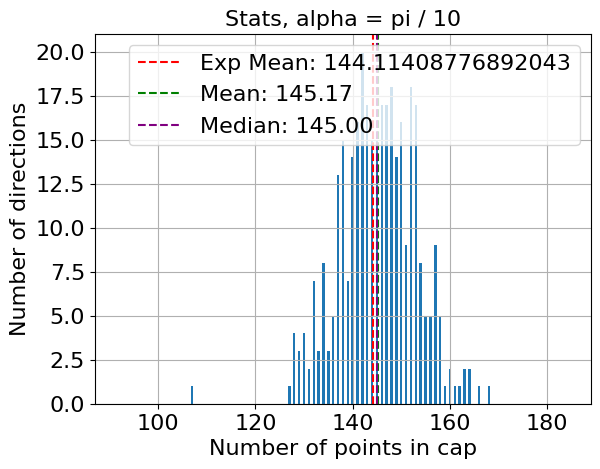

Saving CSV to: PMTSet23_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -17.290219    -17.290219    -17.290219    -17.290219   
1      vector sum y     21.734739     21.734739     21.734739     21.734739   
2      vector sum z    -27.514377    -27.514377    -27.514377    -27.514377   
3   vector sum norm     39.094648     39.094648     39.094648     39.094648   
4           total N   5889.000000   5889.000000   5889.000000   5889.000000   
5              mean   1475.845029    862.555556    397.824561    222.935673   
6            median   1477.000000    865.500000    398.000000    223.000000   
7          variance    527.084171    489.094867    195.226531     92.089429   
8             stdev     22.958314     22.115489     13.972349      9.596324   
9  normalized stdev      0.015556      0.025639      0.035122      0.043045   

   alpha = pi/10  
0     -17.290219  
1      21.734739  
2     -27.514377  
3      39.094648  
4

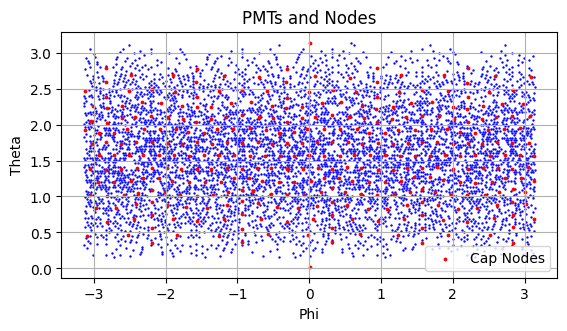

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


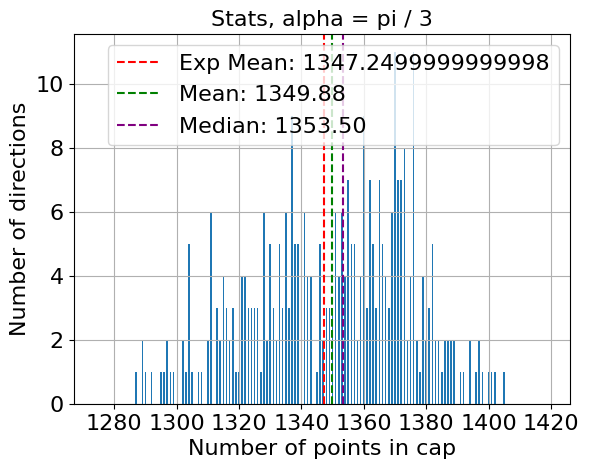

Saving CSV to: PMTSet24_stats.csv
             Metric  alpha = pi/3
0      vector sum x     10.701882
1      vector sum y    -40.649338
2      vector sum z    -52.440129
3   vector sum norm     67.207634
4           total N   5389.000000
5              mean   1349.883041
6            median   1353.500000
7          variance    645.670531
8             stdev     25.410048
9  normalized stdev      0.018824
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


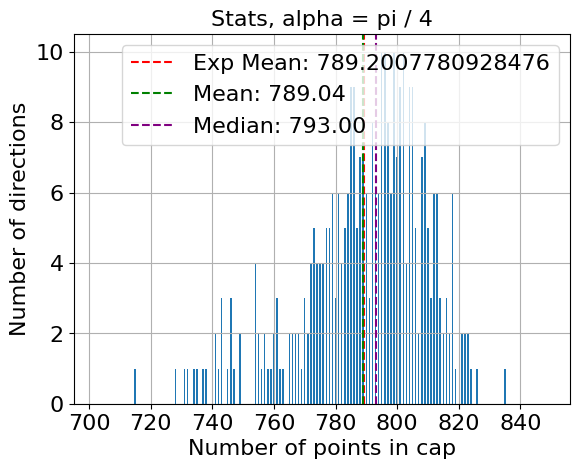

Saving CSV to: PMTSet24_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     10.701882     10.701882
1      vector sum y    -40.649338    -40.649338
2      vector sum z    -52.440129    -52.440129
3   vector sum norm     67.207634     67.207634
4           total N   5389.000000   5389.000000
5              mean   1349.883041    789.043860
6            median   1353.500000    793.000000
7          variance    645.670531    420.609187
8             stdev     25.410048     20.508759
9  normalized stdev      0.018824      0.025992
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


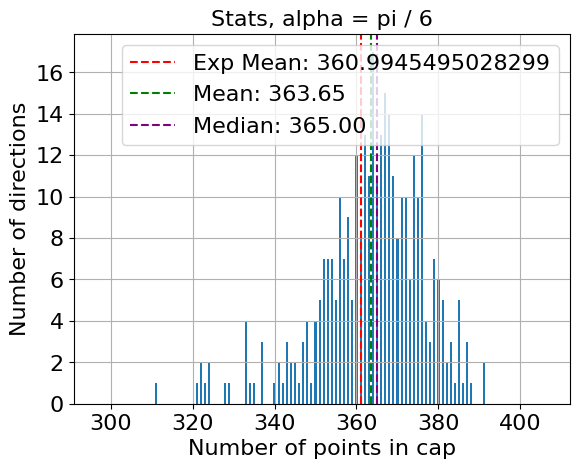

Saving CSV to: PMTSet24_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     10.701882     10.701882     10.701882
1      vector sum y    -40.649338    -40.649338    -40.649338
2      vector sum z    -52.440129    -52.440129    -52.440129
3   vector sum norm     67.207634     67.207634     67.207634
4           total N   5389.000000   5389.000000   5389.000000
5              mean   1349.883041    789.043860    363.646199
6            median   1353.500000    793.000000    365.000000
7          variance    645.670531    420.609187    170.632135
8             stdev     25.410048     20.508759     13.062624
9  normalized stdev      0.018824      0.025992      0.035921
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


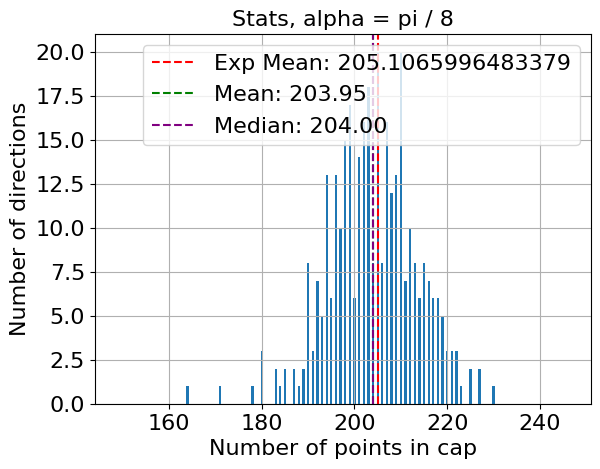

Saving CSV to: PMTSet24_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     10.701882     10.701882     10.701882     10.701882
1      vector sum y    -40.649338    -40.649338    -40.649338    -40.649338
2      vector sum z    -52.440129    -52.440129    -52.440129    -52.440129
3   vector sum norm     67.207634     67.207634     67.207634     67.207634
4           total N   5389.000000   5389.000000   5389.000000   5389.000000
5              mean   1349.883041    789.043860    363.646199    203.950292
6            median   1353.500000    793.000000    365.000000    204.000000
7          variance    645.670531    420.609187    170.632135     90.596944
8             stdev     25.410048     20.508759     13.062624      9.518243
9  normalized stdev      0.018824      0.025992      0.035921      0.046669
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

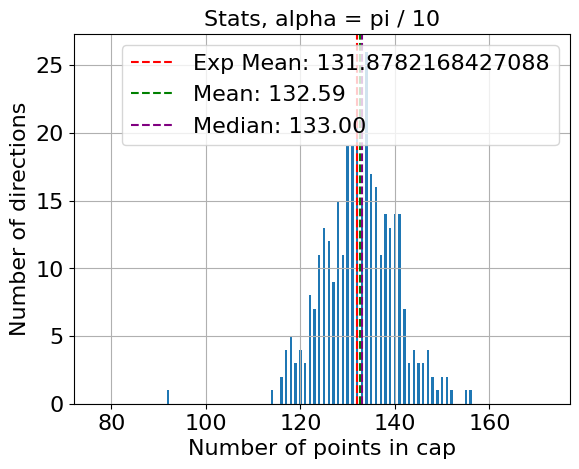

Saving CSV to: PMTSet24_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     10.701882     10.701882     10.701882     10.701882   
1      vector sum y    -40.649338    -40.649338    -40.649338    -40.649338   
2      vector sum z    -52.440129    -52.440129    -52.440129    -52.440129   
3   vector sum norm     67.207634     67.207634     67.207634     67.207634   
4           total N   5389.000000   5389.000000   5389.000000   5389.000000   
5              mean   1349.883041    789.043860    363.646199    203.950292   
6            median   1353.500000    793.000000    365.000000    204.000000   
7          variance    645.670531    420.609187    170.632135     90.596944   
8             stdev     25.410048     20.508759     13.062624      9.518243   
9  normalized stdev      0.018824      0.025992      0.035921      0.046669   

   alpha = pi/10  
0      10.701882  
1     -40.649338  
2     -52.440129  
3      67.207634  
4

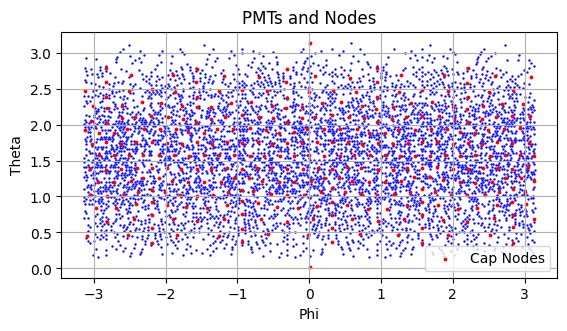

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


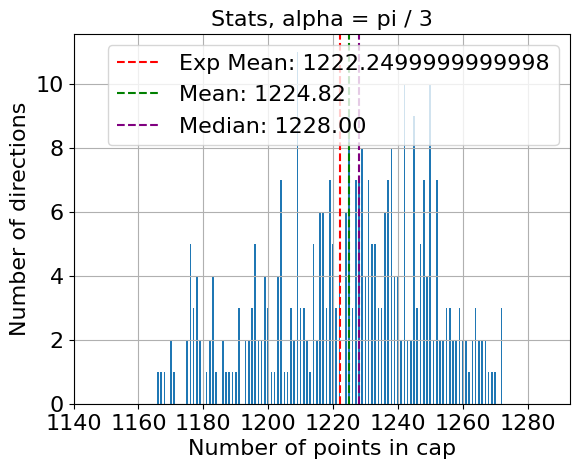

Saving CSV to: PMTSet25_stats.csv
             Metric  alpha = pi/3
0      vector sum x     -1.994732
1      vector sum y     57.243025
2      vector sum z     24.284470
3   vector sum norm     62.213168
4           total N   4889.000000
5              mean   1224.821637
6            median   1228.000000
7          variance    615.316140
8             stdev     24.805567
9  normalized stdev      0.020252
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


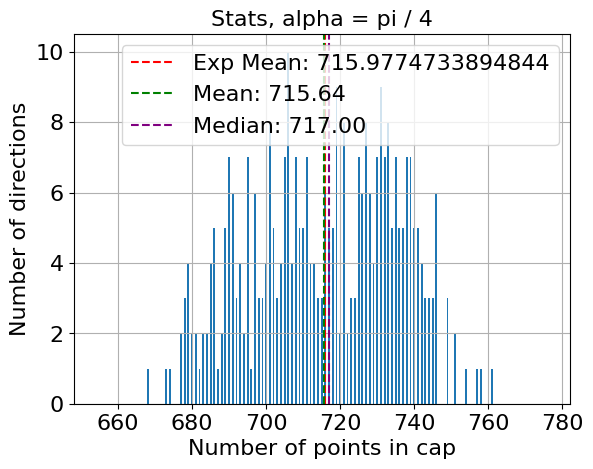

Saving CSV to: PMTSet25_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     -1.994732     -1.994732
1      vector sum y     57.243025     57.243025
2      vector sum z     24.284470     24.284470
3   vector sum norm     62.213168     62.213168
4           total N   4889.000000   4889.000000
5              mean   1224.821637    715.637427
6            median   1228.000000    717.000000
7          variance    615.316140    390.997196
8             stdev     24.805567     19.773649
9  normalized stdev      0.020252      0.027631
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


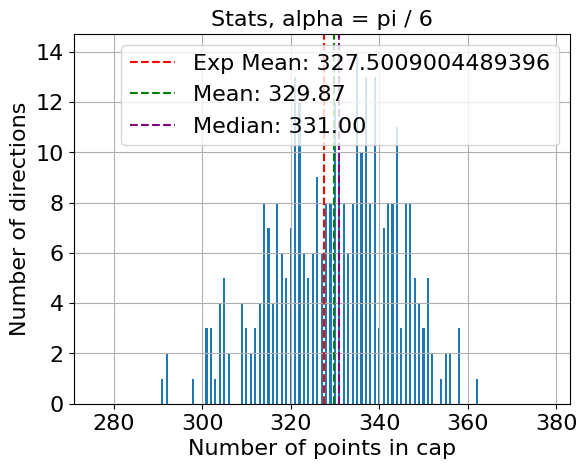

Saving CSV to: PMTSet25_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     -1.994732     -1.994732     -1.994732
1      vector sum y     57.243025     57.243025     57.243025
2      vector sum z     24.284470     24.284470     24.284470
3   vector sum norm     62.213168     62.213168     62.213168
4           total N   4889.000000   4889.000000   4889.000000
5              mean   1224.821637    715.637427    329.871345
6            median   1228.000000    717.000000    331.000000
7          variance    615.316140    390.997196    182.474676
8             stdev     24.805567     19.773649     13.508319
9  normalized stdev      0.020252      0.027631      0.040950
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


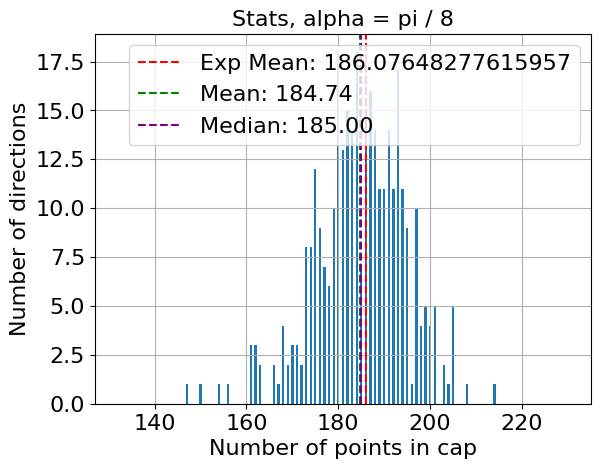

Saving CSV to: PMTSet25_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -1.994732     -1.994732     -1.994732     -1.994732
1      vector sum y     57.243025     57.243025     57.243025     57.243025
2      vector sum z     24.284470     24.284470     24.284470     24.284470
3   vector sum norm     62.213168     62.213168     62.213168     62.213168
4           total N   4889.000000   4889.000000   4889.000000   4889.000000
5              mean   1224.821637    715.637427    329.871345    184.739766
6            median   1228.000000    717.000000    331.000000    185.000000
7          variance    615.316140    390.997196    182.474676     97.712980
8             stdev     24.805567     19.773649     13.508319      9.884988
9  normalized stdev      0.020252      0.027631      0.040950      0.053508
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

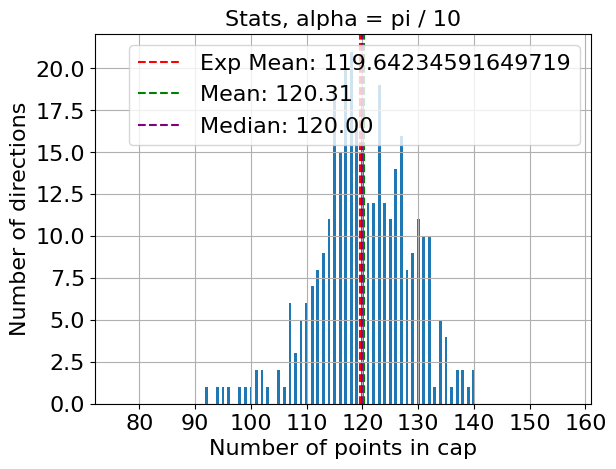

Saving CSV to: PMTSet25_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -1.994732     -1.994732     -1.994732     -1.994732   
1      vector sum y     57.243025     57.243025     57.243025     57.243025   
2      vector sum z     24.284470     24.284470     24.284470     24.284470   
3   vector sum norm     62.213168     62.213168     62.213168     62.213168   
4           total N   4889.000000   4889.000000   4889.000000   4889.000000   
5              mean   1224.821637    715.637427    329.871345    184.739766   
6            median   1228.000000    717.000000    331.000000    185.000000   
7          variance    615.316140    390.997196    182.474676     97.712980   
8             stdev     24.805567     19.773649     13.508319      9.884988   
9  normalized stdev      0.020252      0.027631      0.040950      0.053508   

   alpha = pi/10  
0      -1.994732  
1      57.243025  
2      24.284470  
3      62.213168  
4

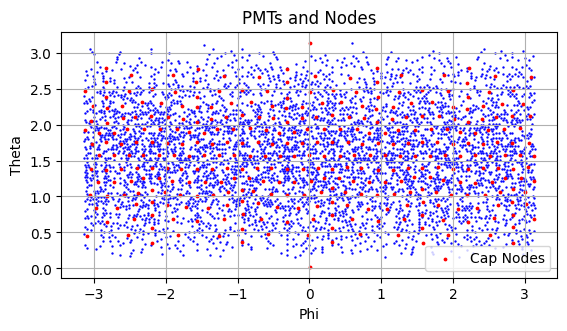

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


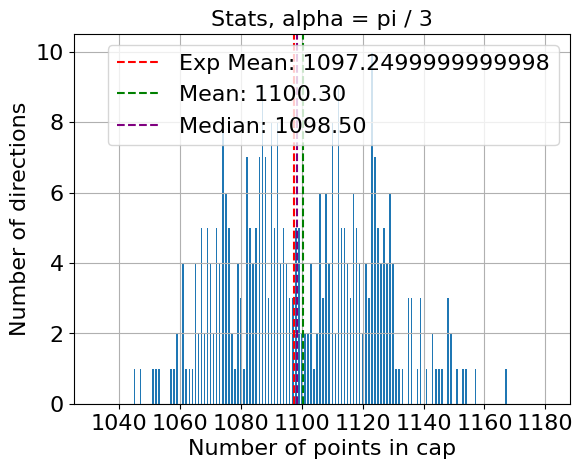

Saving CSV to: PMTSet26_stats.csv
             Metric  alpha = pi/3
0      vector sum x     39.112863
1      vector sum y    -28.517891
2      vector sum z    -11.723031
3   vector sum norm     49.804775
4           total N   4389.000000
5              mean   1100.304094
6            median   1098.500000
7          variance    564.679457
8             stdev     23.762985
9  normalized stdev      0.021597
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


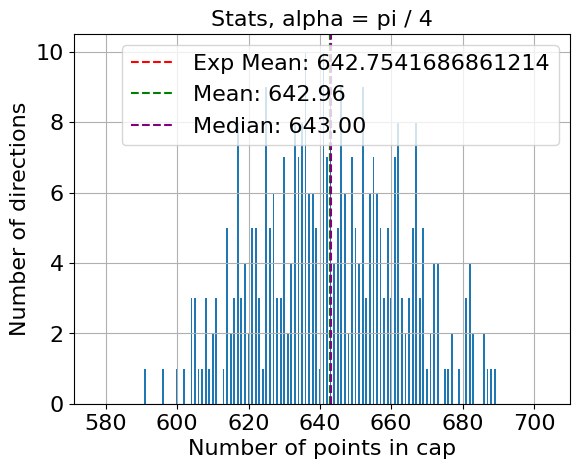

Saving CSV to: PMTSet26_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     39.112863     39.112863
1      vector sum y    -28.517891    -28.517891
2      vector sum z    -11.723031    -11.723031
3   vector sum norm     49.804775     49.804775
4           total N   4389.000000   4389.000000
5              mean   1100.304094    642.956140
6            median   1098.500000    643.000000
7          variance    564.679457    397.410357
8             stdev     23.762985     19.935154
9  normalized stdev      0.021597      0.031005
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


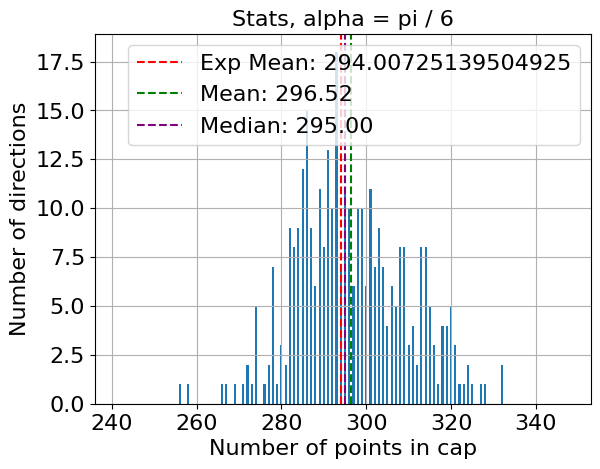

Saving CSV to: PMTSet26_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     39.112863     39.112863     39.112863
1      vector sum y    -28.517891    -28.517891    -28.517891
2      vector sum z    -11.723031    -11.723031    -11.723031
3   vector sum norm     49.804775     49.804775     49.804775
4           total N   4389.000000   4389.000000   4389.000000
5              mean   1100.304094    642.956140    296.520468
6            median   1098.500000    643.000000    295.000000
7          variance    564.679457    397.410357    170.360692
8             stdev     23.762985     19.935154     13.052229
9  normalized stdev      0.021597      0.031005      0.044018
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


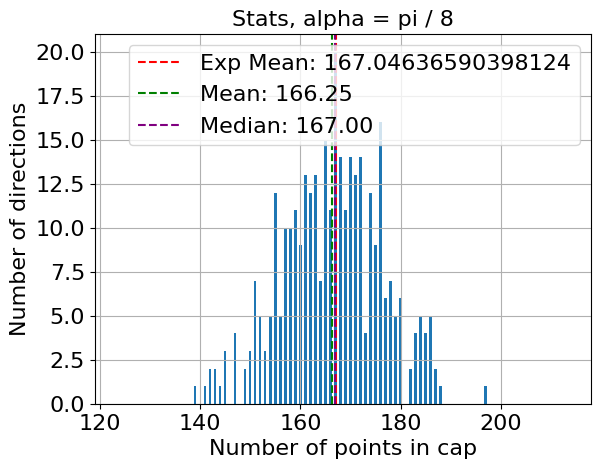

Saving CSV to: PMTSet26_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     39.112863     39.112863     39.112863     39.112863
1      vector sum y    -28.517891    -28.517891    -28.517891    -28.517891
2      vector sum z    -11.723031    -11.723031    -11.723031    -11.723031
3   vector sum norm     49.804775     49.804775     49.804775     49.804775
4           total N   4389.000000   4389.000000   4389.000000   4389.000000
5              mean   1100.304094    642.956140    296.520468    166.245614
6            median   1098.500000    643.000000    295.000000    167.000000
7          variance    564.679457    397.410357    170.360692     99.998153
8             stdev     23.762985     19.935154     13.052229      9.999908
9  normalized stdev      0.021597      0.031005      0.044018      0.060151
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

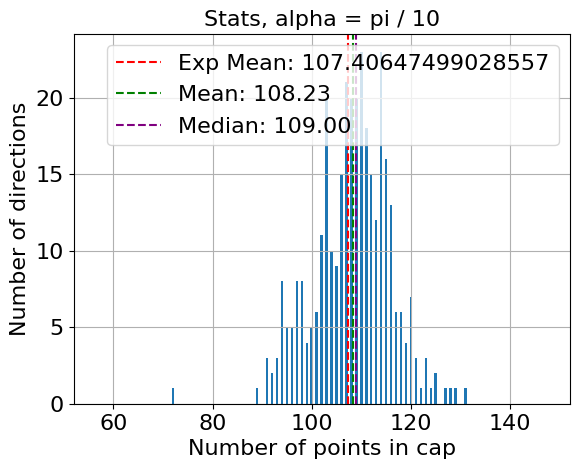

Saving CSV to: PMTSet26_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     39.112863     39.112863     39.112863     39.112863   
1      vector sum y    -28.517891    -28.517891    -28.517891    -28.517891   
2      vector sum z    -11.723031    -11.723031    -11.723031    -11.723031   
3   vector sum norm     49.804775     49.804775     49.804775     49.804775   
4           total N   4389.000000   4389.000000   4389.000000   4389.000000   
5              mean   1100.304094    642.956140    296.520468    166.245614   
6            median   1098.500000    643.000000    295.000000    167.000000   
7          variance    564.679457    397.410357    170.360692     99.998153   
8             stdev     23.762985     19.935154     13.052229      9.999908   
9  normalized stdev      0.021597      0.031005      0.044018      0.060151   

   alpha = pi/10  
0      39.112863  
1     -28.517891  
2     -11.723031  
3      49.804775  
4

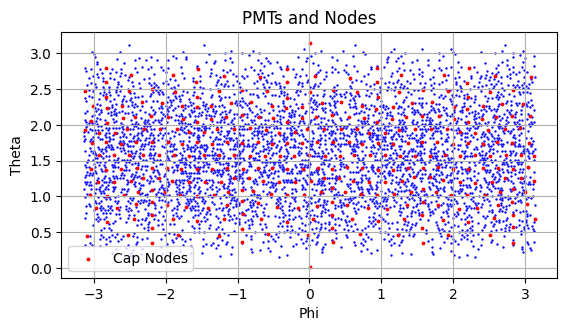

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


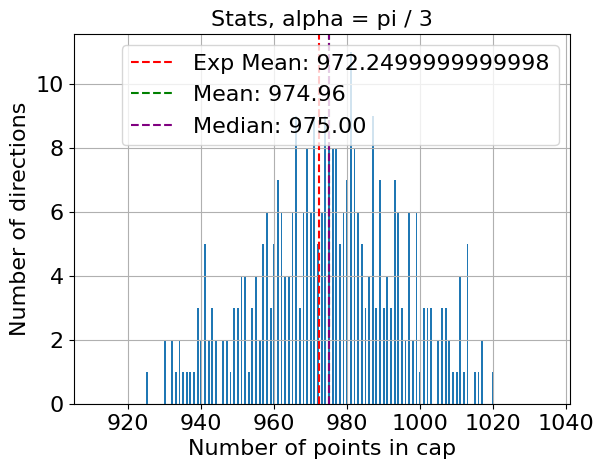

Saving CSV to: PMTSet27_stats.csv
             Metric  alpha = pi/3
0      vector sum x     10.295816
1      vector sum y    -14.835214
2      vector sum z    -16.021609
3   vector sum norm     24.140823
4           total N   3889.000000
5              mean    974.964912
6            median    975.000000
7          variance    388.016313
8             stdev     19.698130
9  normalized stdev      0.020204
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


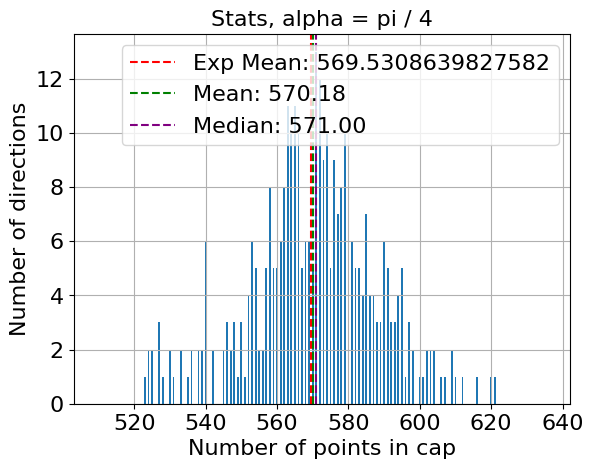

Saving CSV to: PMTSet27_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     10.295816     10.295816
1      vector sum y    -14.835214    -14.835214
2      vector sum z    -16.021609    -16.021609
3   vector sum norm     24.140823     24.140823
4           total N   3889.000000   3889.000000
5              mean    974.964912    570.178363
6            median    975.000000    571.000000
7          variance    388.016313    327.099766
8             stdev     19.698130     18.085900
9  normalized stdev      0.020204      0.031720
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


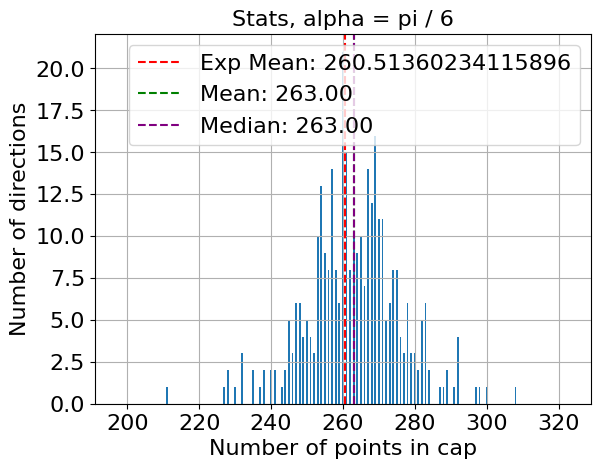

Saving CSV to: PMTSet27_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     10.295816     10.295816     10.295816
1      vector sum y    -14.835214    -14.835214    -14.835214
2      vector sum z    -16.021609    -16.021609    -16.021609
3   vector sum norm     24.140823     24.140823     24.140823
4           total N   3889.000000   3889.000000   3889.000000
5              mean    974.964912    570.178363    263.002924
6            median    975.000000    571.000000    263.000000
7          variance    388.016313    327.099766    167.026307
8             stdev     19.698130     18.085900     12.923866
9  normalized stdev      0.020204      0.031720      0.049140
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


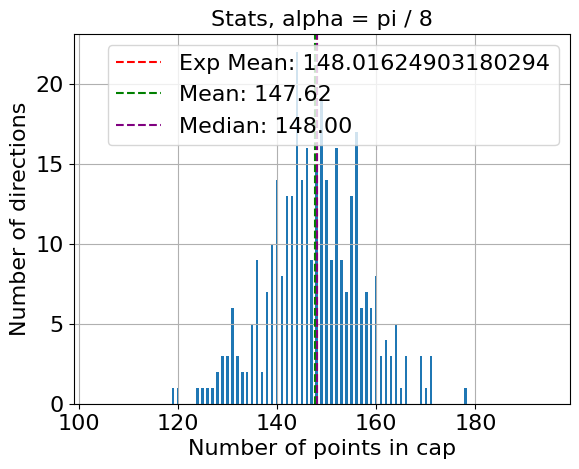

Saving CSV to: PMTSet27_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     10.295816     10.295816     10.295816     10.295816
1      vector sum y    -14.835214    -14.835214    -14.835214    -14.835214
2      vector sum z    -16.021609    -16.021609    -16.021609    -16.021609
3   vector sum norm     24.140823     24.140823     24.140823     24.140823
4           total N   3889.000000   3889.000000   3889.000000   3889.000000
5              mean    974.964912    570.178363    263.002924    147.619883
6            median    975.000000    571.000000    263.000000    148.000000
7          variance    388.016313    327.099766    167.026307     90.083581
8             stdev     19.698130     18.085900     12.923866      9.491237
9  normalized stdev      0.020204      0.031720      0.049140      0.064295
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

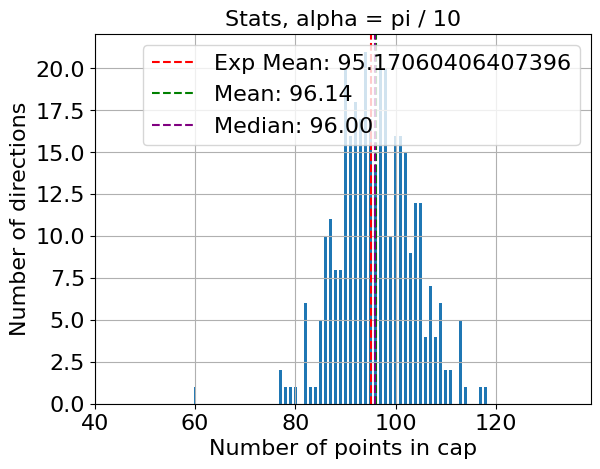

Saving CSV to: PMTSet27_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     10.295816     10.295816     10.295816     10.295816   
1      vector sum y    -14.835214    -14.835214    -14.835214    -14.835214   
2      vector sum z    -16.021609    -16.021609    -16.021609    -16.021609   
3   vector sum norm     24.140823     24.140823     24.140823     24.140823   
4           total N   3889.000000   3889.000000   3889.000000   3889.000000   
5              mean    974.964912    570.178363    263.002924    147.619883   
6            median    975.000000    571.000000    263.000000    148.000000   
7          variance    388.016313    327.099766    167.026307     90.083581   
8             stdev     19.698130     18.085900     12.923866      9.491237   
9  normalized stdev      0.020204      0.031720      0.049140      0.064295   

   alpha = pi/10  
0      10.295816  
1     -14.835214  
2     -16.021609  
3      24.140823  
4

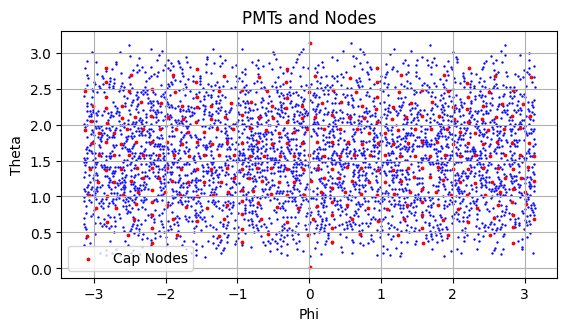

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


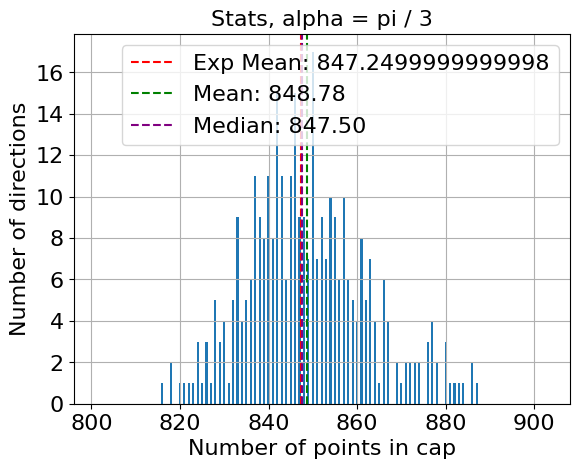

Saving CSV to: PMTSet28_stats.csv
             Metric  alpha = pi/3
0      vector sum x     -7.522984
1      vector sum y      3.779596
2      vector sum z      7.664945
3   vector sum norm     11.385606
4           total N   3389.000000
5              mean    848.783626
6            median    847.500000
7          variance    186.783592
8             stdev     13.666879
9  normalized stdev      0.016102
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


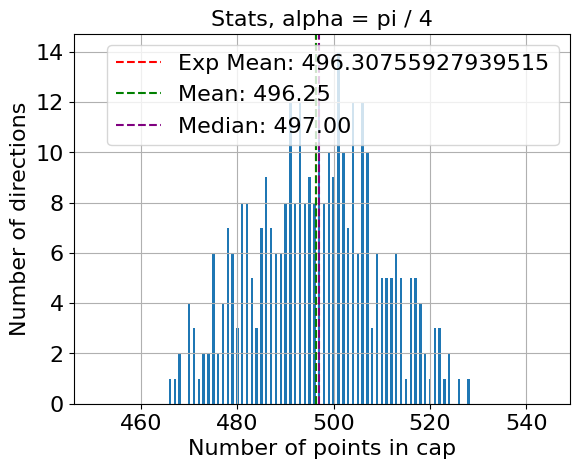

Saving CSV to: PMTSet28_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     -7.522984     -7.522984
1      vector sum y      3.779596      3.779596
2      vector sum z      7.664945      7.664945
3   vector sum norm     11.385606     11.385606
4           total N   3389.000000   3389.000000
5              mean    848.783626    496.245614
6            median    847.500000    497.000000
7          variance    186.783592    169.799323
8             stdev     13.666879     13.030707
9  normalized stdev      0.016102      0.026259
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


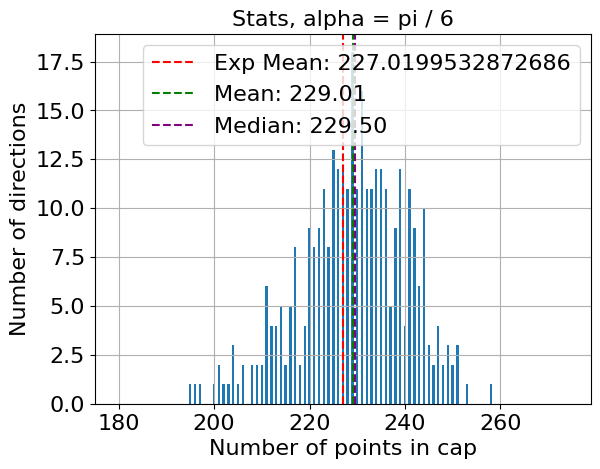

Saving CSV to: PMTSet28_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     -7.522984     -7.522984     -7.522984
1      vector sum y      3.779596      3.779596      3.779596
2      vector sum z      7.664945      7.664945      7.664945
3   vector sum norm     11.385606     11.385606     11.385606
4           total N   3389.000000   3389.000000   3389.000000
5              mean    848.783626    496.245614    229.014620
6            median    847.500000    497.000000    229.500000
7          variance    186.783592    169.799323    126.107973
8             stdev     13.666879     13.030707     11.229781
9  normalized stdev      0.016102      0.026259      0.049035
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


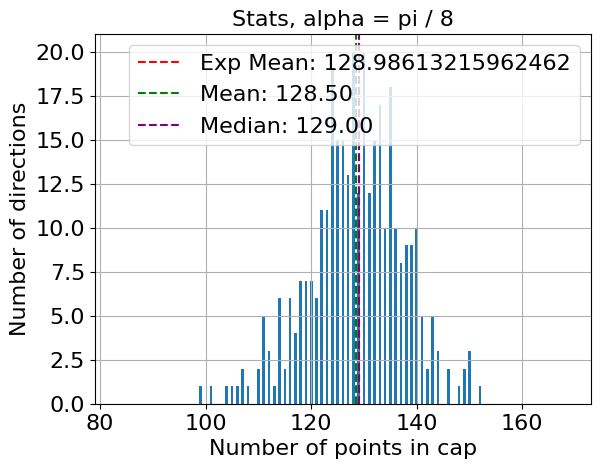

Saving CSV to: PMTSet28_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -7.522984     -7.522984     -7.522984     -7.522984
1      vector sum y      3.779596      3.779596      3.779596      3.779596
2      vector sum z      7.664945      7.664945      7.664945      7.664945
3   vector sum norm     11.385606     11.385606     11.385606     11.385606
4           total N   3389.000000   3389.000000   3389.000000   3389.000000
5              mean    848.783626    496.245614    229.014620    128.500000
6            median    847.500000    497.000000    229.500000    129.000000
7          variance    186.783592    169.799323    126.107973     80.138889
8             stdev     13.666879     13.030707     11.229781      8.952033
9  normalized stdev      0.016102      0.026259      0.049035      0.069666
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

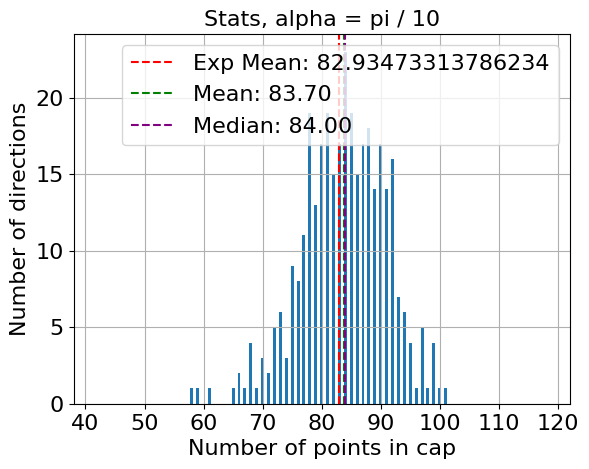

Saving CSV to: PMTSet28_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -7.522984     -7.522984     -7.522984     -7.522984   
1      vector sum y      3.779596      3.779596      3.779596      3.779596   
2      vector sum z      7.664945      7.664945      7.664945      7.664945   
3   vector sum norm     11.385606     11.385606     11.385606     11.385606   
4           total N   3389.000000   3389.000000   3389.000000   3389.000000   
5              mean    848.783626    496.245614    229.014620    128.500000   
6            median    847.500000    497.000000    229.500000    129.000000   
7          variance    186.783592    169.799323    126.107973     80.138889   
8             stdev     13.666879     13.030707     11.229781      8.952033   
9  normalized stdev      0.016102      0.026259      0.049035      0.069666   

   alpha = pi/10  
0      -7.522984  
1       3.779596  
2       7.664945  
3      11.385606  
4

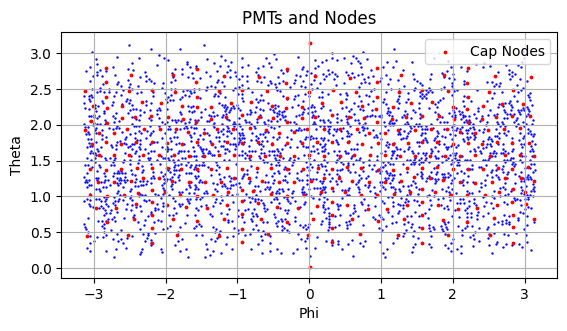

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


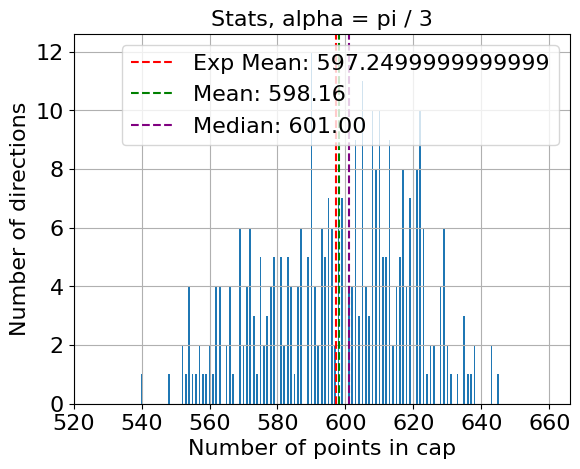

Saving CSV to: PMTSet29_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -41.014791
1      vector sum y    -18.375528
2      vector sum z    -26.957242
3   vector sum norm     52.407690
4           total N   2389.000000
5              mean    598.157895
6            median    601.000000
7          variance    448.027701
8             stdev     21.166665
9  normalized stdev      0.035386
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


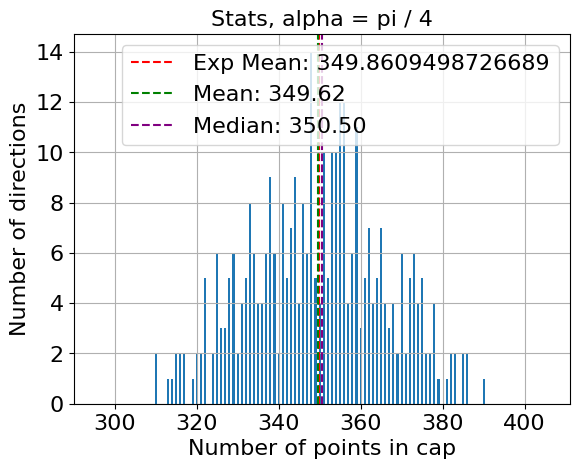

Saving CSV to: PMTSet29_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -41.014791    -41.014791
1      vector sum y    -18.375528    -18.375528
2      vector sum z    -26.957242    -26.957242
3   vector sum norm     52.407690     52.407690
4           total N   2389.000000   2389.000000
5              mean    598.157895    349.619883
6            median    601.000000    350.500000
7          variance    448.027701    273.884751
8             stdev     21.166665     16.549464
9  normalized stdev      0.035386      0.047336
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


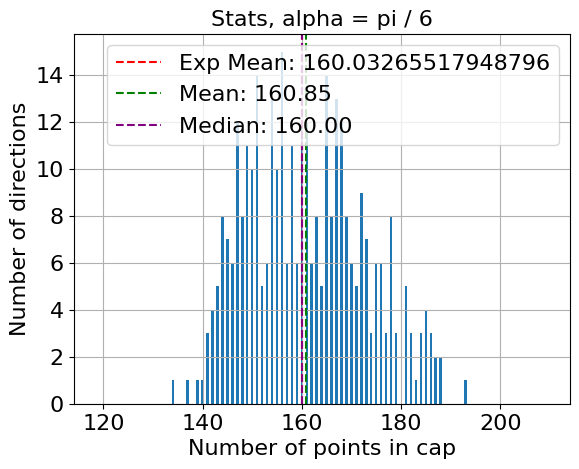

Saving CSV to: PMTSet29_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -41.014791    -41.014791    -41.014791
1      vector sum y    -18.375528    -18.375528    -18.375528
2      vector sum z    -26.957242    -26.957242    -26.957242
3   vector sum norm     52.407690     52.407690     52.407690
4           total N   2389.000000   2389.000000   2389.000000
5              mean    598.157895    349.619883    160.847953
6            median    601.000000    350.500000    160.000000
7          variance    448.027701    273.884751    140.000274
8             stdev     21.166665     16.549464     11.832171
9  normalized stdev      0.035386      0.047336      0.073561
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


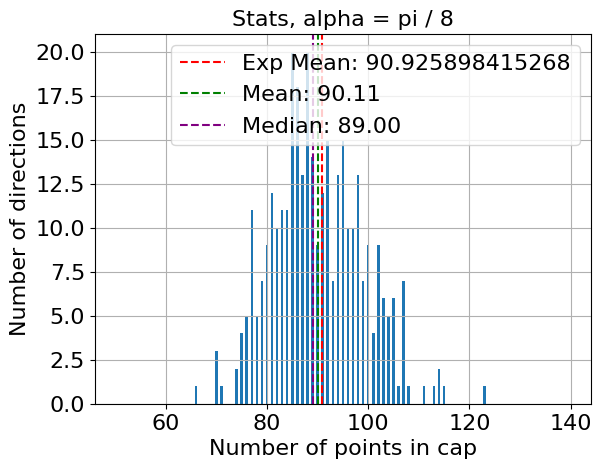

Saving CSV to: PMTSet29_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -41.014791    -41.014791    -41.014791    -41.014791
1      vector sum y    -18.375528    -18.375528    -18.375528    -18.375528
2      vector sum z    -26.957242    -26.957242    -26.957242    -26.957242
3   vector sum norm     52.407690     52.407690     52.407690     52.407690
4           total N   2389.000000   2389.000000   2389.000000   2389.000000
5              mean    598.157895    349.619883    160.847953     90.114035
6            median    601.000000    350.500000    160.000000     89.000000
7          variance    448.027701    273.884751    140.000274     81.364189
8             stdev     21.166665     16.549464     11.832171      9.020210
9  normalized stdev      0.035386      0.047336      0.073561      0.100098
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating histogram

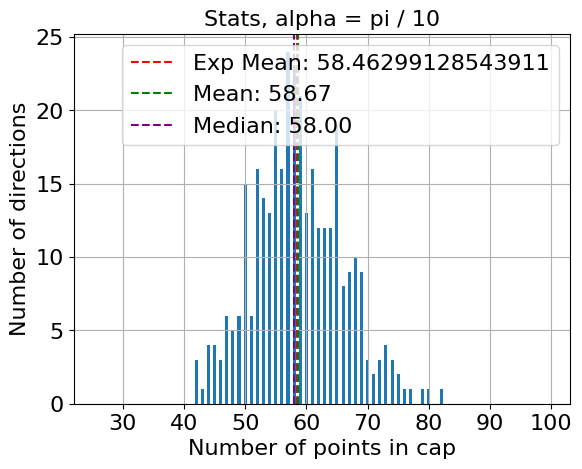

Saving CSV to: PMTSet29_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -41.014791    -41.014791    -41.014791    -41.014791   
1      vector sum y    -18.375528    -18.375528    -18.375528    -18.375528   
2      vector sum z    -26.957242    -26.957242    -26.957242    -26.957242   
3   vector sum norm     52.407690     52.407690     52.407690     52.407690   
4           total N   2389.000000   2389.000000   2389.000000   2389.000000   
5              mean    598.157895    349.619883    160.847953     90.114035   
6            median    601.000000    350.500000    160.000000     89.000000   
7          variance    448.027701    273.884751    140.000274     81.364189   
8             stdev     21.166665     16.549464     11.832171      9.020210   
9  normalized stdev      0.035386      0.047336      0.073561      0.100098   

   alpha = pi/10  
0     -41.014791  
1     -18.375528  
2     -26.957242  
3      52.407690  
4

In [16]:
for i in set_numbers:
    print(f"Now working on PMT set {i}")
    indices_file = f'PMTSet{i}_indices.txt'
    active_pos_cart, active_pos_sph = get_active_positions(indices_file, all_pos_cart, all_pos_sph)
    compute_config_stats(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, f"PMTSet{i}")
    print("Finished computing stats for PMT set " + str(i))
    print("--------------------------------------")

print("Finished computing stats for all custom PMT sets")
print('Computing stats for real run configurations')

S

In [21]:
# So far, we only computed stats for the made up PMT configurations;
# I think we get one file with stats for each config
# So we can add the ones from real runs easily; maybe we don't need to reformat

# plot for sets 1-15

# Define the statistics to be plotted


# Define metrics to plot
metrics = ["vector sum norm", "total N", "mean", "median", "normalized stdev", "stdev"]

# Define alpha values from the headers
alpha_labels = ["alpha = pi/3", "alpha = pi/4", "alpha = pi/6", "alpha = pi/8", "alpha = pi/10"]

# Initialize data storage
data = {metric: {alpha: [] for alpha in alpha_labels} for metric in metrics}
pmt_sets = []

# Loop through files
for i in range(1, 16):
    filename = f"PMTSet{i}_stats.csv"
    try:
        df = pd.read_csv(filename)
        pmt_sets.append(i)
        for metric in metrics:
            for alpha in alpha_labels:
                value = df.loc[df.iloc[:, 0] == metric, alpha].values
                data[metric][alpha].append(value[0] if len(value) > 0 else None)
    except FileNotFoundError:
        print(f"File not found: {filename}, skipping...")

# Plot each metric
for metric in metrics:
    plt.figure(figsize=(8, 6))
    for alpha in alpha_labels:
        plt.plot(pmt_sets, data[metric][alpha], marker='o', label=alpha)
    plt.xlabel("PMT Set")
    plt.ylabel(metric)
    plt.title(metric + " vs PMT Set")
    plt.legend()
    plt.grid(True)
    plt.savefig(f"{metric.replace(' ', '_')}.pdf")
    plt.close()

print("Plots saved as PDFs.")


Plots saved as PDFs.


In [26]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Define metrics to plot
metrics = ["vector sum norm", "total N", "mean", "median", "normalized stdev", "stdev"]

# Define alpha values from the headers
alpha_labels = ["alpha = pi/3", "alpha = pi/4", "alpha = pi/6", "alpha = pi/8", "alpha = pi/10"]

# Function to process PMT sets and return data
def process_pmt_sets(pmt_set_numbers):
    data = {metric: {alpha: [] for alpha in alpha_labels} for metric in metrics}
    for alpha in alpha_labels:
        for metric in metrics:
            data[metric][alpha] = [None] * len(pmt_set_numbers)

    for idx, i in enumerate(pmt_set_numbers):
        filename = f"PMTSet{i}_stats.csv"
        try:
            df = pd.read_csv(filename)
            for metric in metrics:
                for alpha in alpha_labels:
                    value = df.loc[df.iloc[:, 0] == metric, alpha].values
                    data[metric][alpha][idx] = value[0] if len(value) > 0 else None
        except FileNotFoundError:
            print(f"File not found: {filename}, skipping...")

    return pmt_set_numbers, data

# PMT sets for the first set of plots
pmt_set_numbers_1 = list(range(1, 16))
pmt_sets_1, data_1 = process_pmt_sets(pmt_set_numbers_1)

# PMT sets for the second set of plots
pmt_set_numbers_2 = [1, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
pmt_sets_2, data_2 = process_pmt_sets(pmt_set_numbers_2)

# Save each metric in a separate PDF file with combined plots
for metric in metrics:
    with PdfPages(f"{metric.replace(' ', '_')}_combined.pdf") as pdf:
        fig, axes = plt.subplots(2, 1, figsize=(8, 12))

        # First plot
        for alpha in alpha_labels:
            axes[0].plot(pmt_sets_1, data_1[metric][alpha], marker='o', label=alpha)
        axes[0].set_xlabel("PMT Set")
        axes[0].set_ylabel(metric)
        axes[0].set_title(metric + " vs PMT Set (First Set)")
        axes[0].legend()
        axes[0].grid(True)

        # Second plot with evenly spaced x-axis
        x_positions = range(len(pmt_sets_2))  # Ensure equal spacing
        for alpha in alpha_labels:
            axes[1].plot(x_positions, data_2[metric][alpha], marker='o', label=alpha)
        axes[1].set_xticks(x_positions)
        axes[1].set_xticklabels(pmt_sets_2)  # Label with actual PMT set numbers
        axes[1].set_xlabel("PMT Set")
        axes[1].set_ylabel(metric)
        axes[1].set_title(metric + " vs PMT Set (Second Set, Evenly Spaced)")
        axes[1].legend()
        axes[1].grid(True)

        pdf.savefig(fig)
        plt.close(fig)

# Save each metric in a separate PDF file with individual second-set plots
for metric in metrics:
    with PdfPages(f"{metric.replace(' ', '_')}_second_set.pdf") as pdf:
        fig, ax = plt.subplots(figsize=(8, 6))

        x_positions = range(len(pmt_sets_2))  # Ensure equal spacing
        for alpha in alpha_labels:
            ax.plot(x_positions, data_2[metric][alpha], marker='o', label=alpha)
        ax.set_xticks(x_positions)
        ax.set_xticklabels(pmt_sets_2)  # Label with actual PMT set numbers
        ax.set_xlabel("PMT Set")
        ax.set_ylabel(metric)
        ax.set_title(metric + " vs PMT Set (Second Set, Evenly Spaced)")
        ax.legend()
        ax.grid(True)

        pdf.savefig(fig)
        plt.close(fig)

print("Separate combined and individual second-set plots saved as PDFs for each metric.")


Separate combined and individual second-set plots saved as PDFs for each metric.


Working on run 309434
Active positions for run 309434: [[ 1.        0.161679  3.02576 ]
 [ 1.        0.466782  3.02578 ]
 [ 1.        0.746229  3.01564 ]
 ...
 [ 1.       -0.714795  1.43196 ]
 [ 1.       -0.769422  1.40361 ]
 [ 1.       -0.75031   1.43331 ]]
Position of first PMT in sphericals is : [1.       0.161679 3.02576 ]
Position of first PMT in cartesians is : [ 0.11406653  0.01860455 -0.9932989 ]
Coordinates extracted for run 309434
Computing metrics for run 309434
 
 


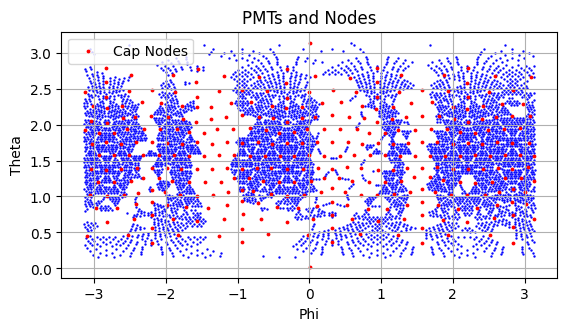

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


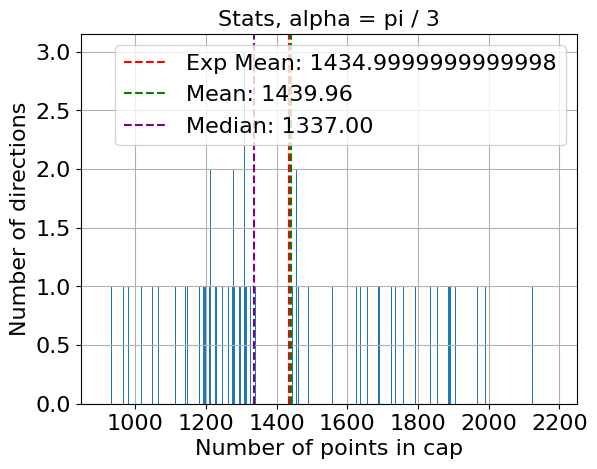

Saving CSV to: Run309434PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x   -764.829899
1      vector sum y     81.949135
2      vector sum z   -130.078128
3   vector sum norm    780.128678
4           total N   5740.000000
5              mean   1439.959064
6            median   1337.000000
7          variance  90217.793646
8             stdev    300.362770
9  normalized stdev      0.208591
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


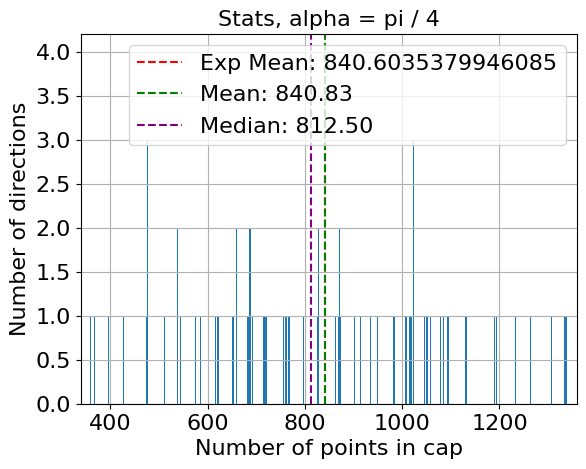

Saving CSV to: Run309434PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x   -764.829899   -764.829899
1      vector sum y     81.949135     81.949135
2      vector sum z   -130.078128   -130.078128
3   vector sum norm    780.128678    780.128678
4           total N   5740.000000   5740.000000
5              mean   1439.959064    840.830409
6            median   1337.000000    812.500000
7          variance  90217.793646  51612.374748
8             stdev    300.362770    227.183571
9  normalized stdev      0.208591      0.270190
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


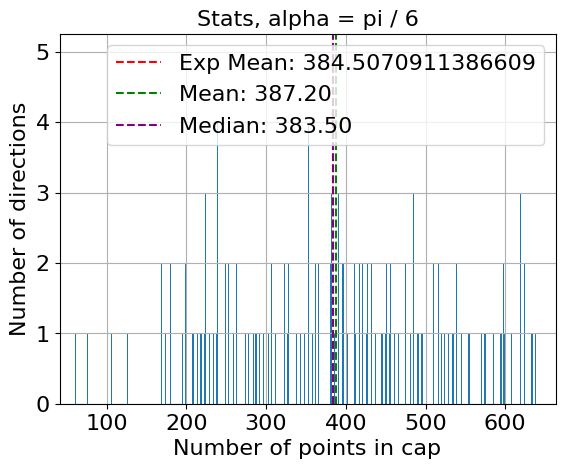

Saving CSV to: Run309434PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x   -764.829899   -764.829899   -764.829899
1      vector sum y     81.949135     81.949135     81.949135
2      vector sum z   -130.078128   -130.078128   -130.078128
3   vector sum norm    780.128678    780.128678    780.128678
4           total N   5740.000000   5740.000000   5740.000000
5              mean   1439.959064    840.830409    387.204678
6            median   1337.000000    812.500000    383.500000
7          variance  90217.793646  51612.374748  18932.905475
8             stdev    300.362770    227.183571    137.596895
9  normalized stdev      0.208591      0.270190      0.355360
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


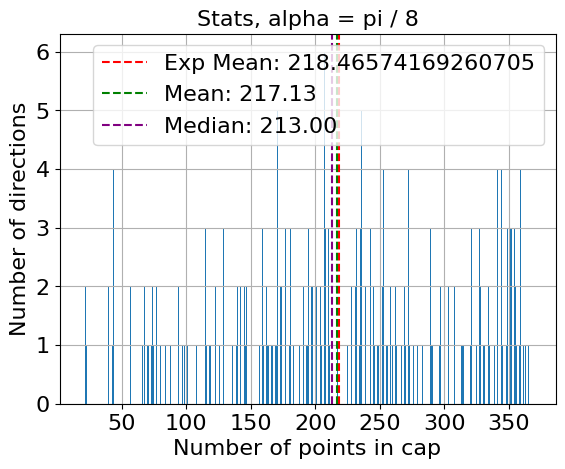

Saving CSV to: Run309434PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -764.829899   -764.829899   -764.829899   -764.829899
1      vector sum y     81.949135     81.949135     81.949135     81.949135
2      vector sum z   -130.078128   -130.078128   -130.078128   -130.078128
3   vector sum norm    780.128678    780.128678    780.128678    780.128678
4           total N   5740.000000   5740.000000   5740.000000   5740.000000
5              mean   1439.959064    840.830409    387.204678    217.128655
6            median   1337.000000    812.500000    383.500000    213.000000
7          variance  90217.793646  51612.374748  18932.905475   8300.410348
8             stdev    300.362770    227.183571    137.596895     91.106588
9  normalized stdev      0.208591      0.270190      0.355360      0.419597
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

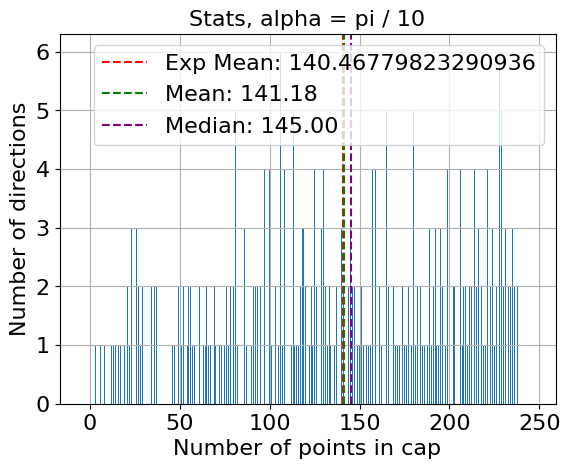

Saving CSV to: Run309434PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -764.829899   -764.829899   -764.829899   -764.829899   
1      vector sum y     81.949135     81.949135     81.949135     81.949135   
2      vector sum z   -130.078128   -130.078128   -130.078128   -130.078128   
3   vector sum norm    780.128678    780.128678    780.128678    780.128678   
4           total N   5740.000000   5740.000000   5740.000000   5740.000000   
5              mean   1439.959064    840.830409    387.204678    217.128655   
6            median   1337.000000    812.500000    383.500000    213.000000   
7          variance  90217.793646  51612.374748  18932.905475   8300.410348   
8             stdev    300.362770    227.183571    137.596895     91.106588   
9  normalized stdev      0.208591      0.270190      0.355360      0.419597   

   alpha = pi/10  
0    -764.829899  
1      81.949135  
2    -130.078128  
3     780.

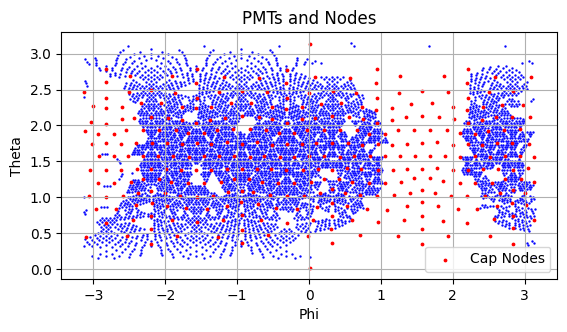

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


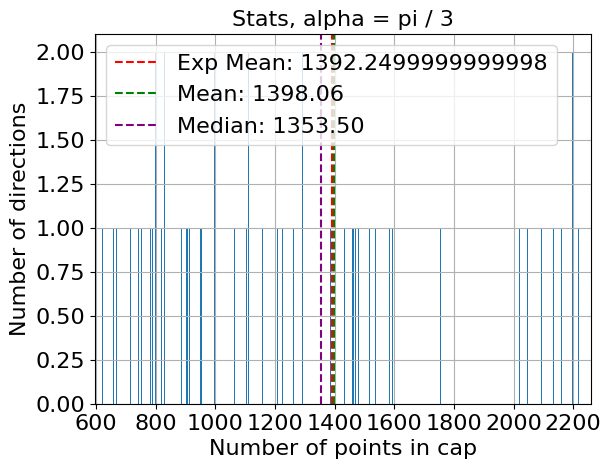

Saving CSV to: Run302640PMTConfig_stats.csv
             Metric   alpha = pi/3
0      vector sum x     737.416472
1      vector sum y   -1203.415321
2      vector sum z    -144.307427
3   vector sum norm    1418.737510
4           total N    5569.000000
5              mean    1398.058480
6            median    1353.500000
7          variance  236337.043364
8             stdev     486.145085
9  normalized stdev       0.347729
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


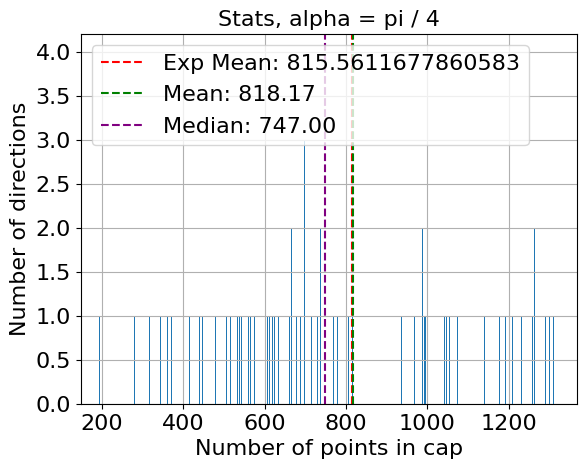

Saving CSV to: Run302640PMTConfig_stats.csv
             Metric   alpha = pi/3   alpha = pi/4
0      vector sum x     737.416472     737.416472
1      vector sum y   -1203.415321   -1203.415321
2      vector sum z    -144.307427    -144.307427
3   vector sum norm    1418.737510    1418.737510
4           total N    5569.000000    5569.000000
5              mean    1398.058480     818.166667
6            median    1353.500000     747.000000
7          variance  236337.043364  116893.904971
8             stdev     486.145085     341.897507
9  normalized stdev       0.347729       0.417882
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


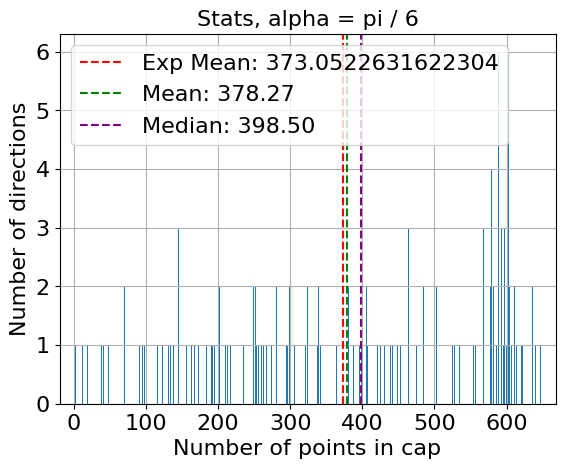

Saving CSV to: Run302640PMTConfig_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6
0      vector sum x     737.416472     737.416472    737.416472
1      vector sum y   -1203.415321   -1203.415321  -1203.415321
2      vector sum z    -144.307427    -144.307427   -144.307427
3   vector sum norm    1418.737510    1418.737510   1418.737510
4           total N    5569.000000    5569.000000   5569.000000
5              mean    1398.058480     818.166667    378.274854
6            median    1353.500000     747.000000    398.500000
7          variance  236337.043364  116893.904971  37727.649602
8             stdev     486.145085     341.897507    194.236067
9  normalized stdev       0.347729       0.417882      0.513479
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


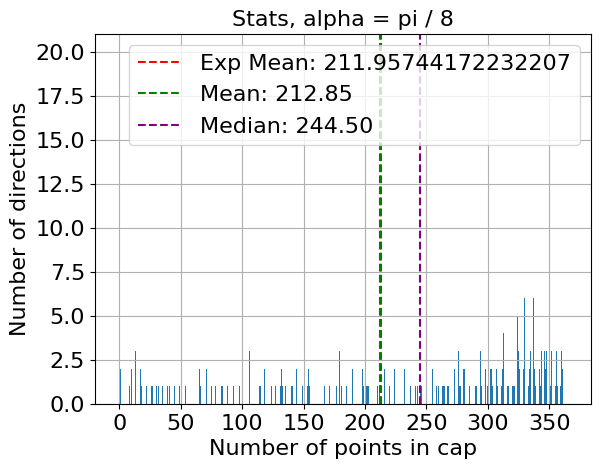

Saving CSV to: Run302640PMTConfig_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     737.416472     737.416472    737.416472    737.416472
1      vector sum y   -1203.415321   -1203.415321  -1203.415321  -1203.415321
2      vector sum z    -144.307427    -144.307427   -144.307427   -144.307427
3   vector sum norm    1418.737510    1418.737510   1418.737510   1418.737510
4           total N    5569.000000    5569.000000   5569.000000   5569.000000
5              mean    1398.058480     818.166667    378.274854    212.853801
6            median    1353.500000     747.000000    398.500000    244.500000
7          variance  236337.043364  116893.904971  37727.649602  14642.826579
8             stdev     486.145085     341.897507    194.236067    121.007548
9  normalized stdev       0.347729       0.417882      0.513479      0.568501
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts co

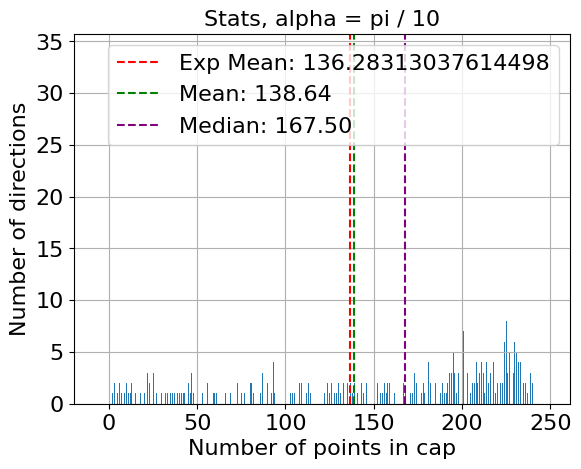

Saving CSV to: Run302640PMTConfig_stats.csv
             Metric   alpha = pi/3   alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     737.416472     737.416472    737.416472    737.416472   
1      vector sum y   -1203.415321   -1203.415321  -1203.415321  -1203.415321   
2      vector sum z    -144.307427    -144.307427   -144.307427   -144.307427   
3   vector sum norm    1418.737510    1418.737510   1418.737510   1418.737510   
4           total N    5569.000000    5569.000000   5569.000000   5569.000000   
5              mean    1398.058480     818.166667    378.274854    212.853801   
6            median    1353.500000     747.000000    398.500000    244.500000   
7          variance  236337.043364  116893.904971  37727.649602  14642.826579   
8             stdev     486.145085     341.897507    194.236067    121.007548   
9  normalized stdev       0.347729       0.417882      0.513479      0.568501   

   alpha = pi/10  
0     737.416472  
1   -1203.415321  
2    -1

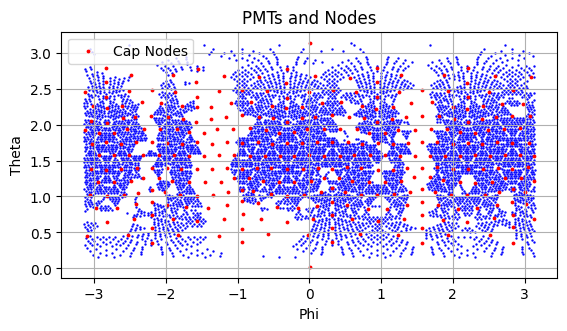

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


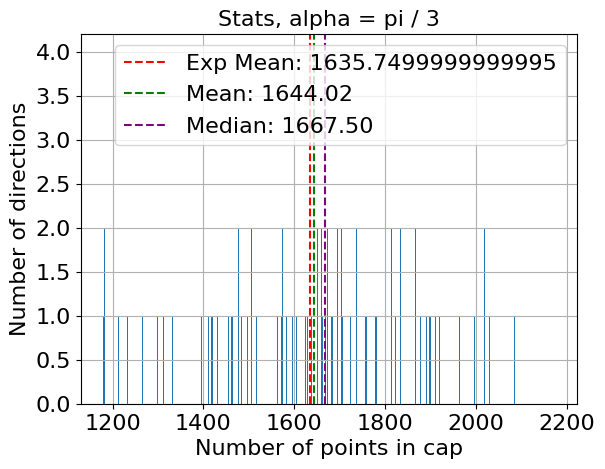

Saving CSV to: Run309504PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x   -129.584175
1      vector sum y    396.964400
2      vector sum z   -166.217829
3   vector sum norm    449.445392
4           total N   6543.000000
5              mean   1644.020468
6            median   1667.500000
7          variance  48844.967417
8             stdev    221.008976
9  normalized stdev      0.134432
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


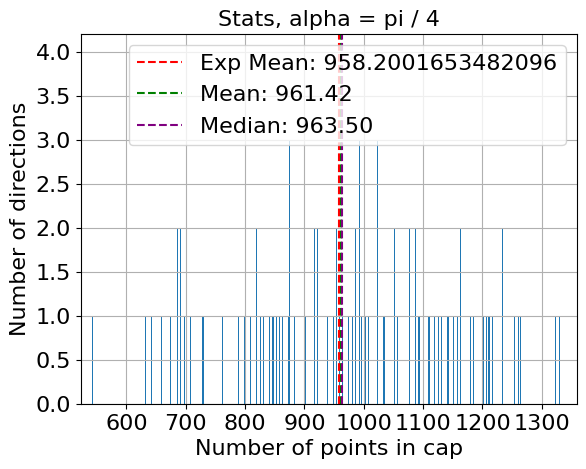

Saving CSV to: Run309504PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x   -129.584175   -129.584175
1      vector sum y    396.964400    396.964400
2      vector sum z   -166.217829   -166.217829
3   vector sum norm    449.445392    449.445392
4           total N   6543.000000   6543.000000
5              mean   1644.020468    961.418129
6            median   1667.500000    963.500000
7          variance  48844.967417  34330.243297
8             stdev    221.008976    185.284223
9  normalized stdev      0.134432      0.192720
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


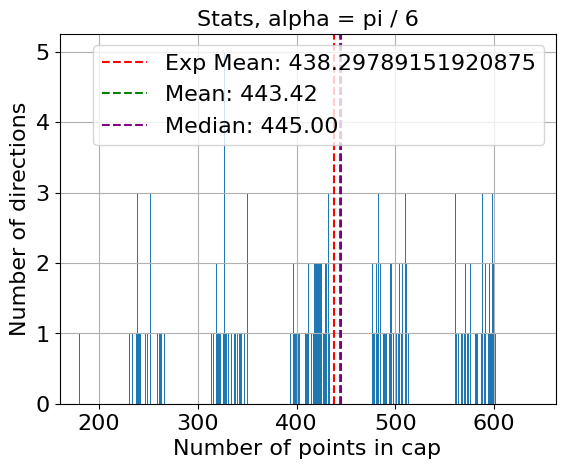

Saving CSV to: Run309504PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x   -129.584175   -129.584175   -129.584175
1      vector sum y    396.964400    396.964400    396.964400
2      vector sum z   -166.217829   -166.217829   -166.217829
3   vector sum norm    449.445392    449.445392    449.445392
4           total N   6543.000000   6543.000000   6543.000000
5              mean   1644.020468    961.418129    443.423977
6            median   1667.500000    963.500000    445.000000
7          variance  48844.967417  34330.243297  13892.735449
8             stdev    221.008976    185.284223    117.867449
9  normalized stdev      0.134432      0.192720      0.265812
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


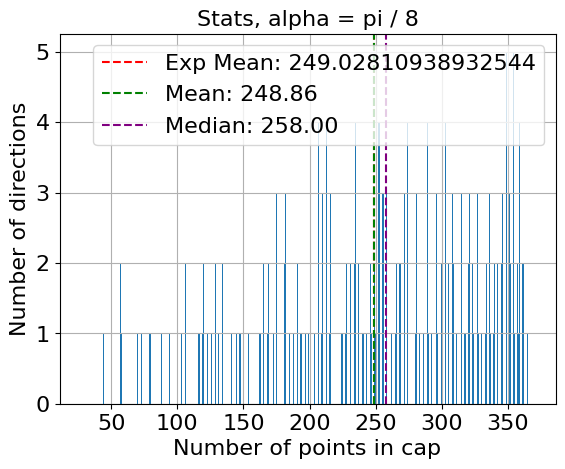

Saving CSV to: Run309504PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -129.584175   -129.584175   -129.584175   -129.584175
1      vector sum y    396.964400    396.964400    396.964400    396.964400
2      vector sum z   -166.217829   -166.217829   -166.217829   -166.217829
3   vector sum norm    449.445392    449.445392    449.445392    449.445392
4           total N   6543.000000   6543.000000   6543.000000   6543.000000
5              mean   1644.020468    961.418129    443.423977    248.859649
6            median   1667.500000    963.500000    445.000000    258.000000
7          variance  48844.967417  34330.243297  13892.735449   6347.991998
8             stdev    221.008976    185.284223    117.867449     79.674287
9  normalized stdev      0.134432      0.192720      0.265812      0.320158
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

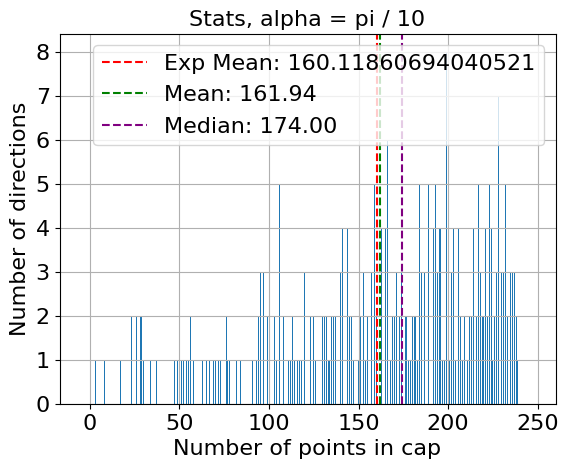

Saving CSV to: Run309504PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -129.584175   -129.584175   -129.584175   -129.584175   
1      vector sum y    396.964400    396.964400    396.964400    396.964400   
2      vector sum z   -166.217829   -166.217829   -166.217829   -166.217829   
3   vector sum norm    449.445392    449.445392    449.445392    449.445392   
4           total N   6543.000000   6543.000000   6543.000000   6543.000000   
5              mean   1644.020468    961.418129    443.423977    248.859649   
6            median   1667.500000    963.500000    445.000000    258.000000   
7          variance  48844.967417  34330.243297  13892.735449   6347.991998   
8             stdev    221.008976    185.284223    117.867449     79.674287   
9  normalized stdev      0.134432      0.192720      0.265812      0.320158   

   alpha = pi/10  
0    -129.584175  
1     396.964400  
2    -166.217829  
3     449.

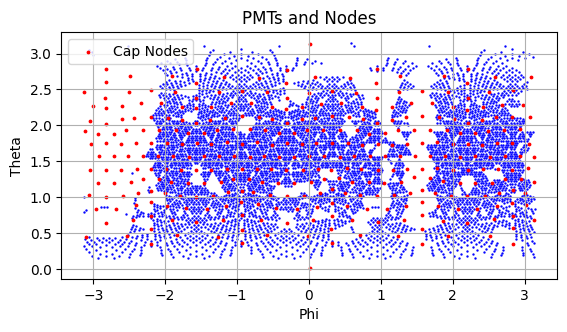

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


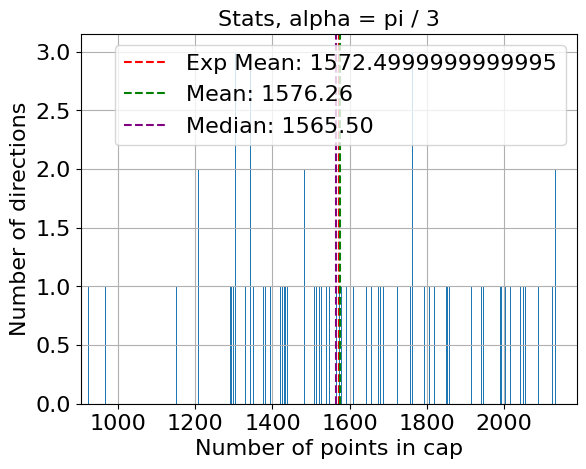

Saving CSV to: Run302159PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    722.176421
1      vector sum y   -139.991324
2      vector sum z    183.602634
3   vector sum norm    758.186178
4           total N   6290.000000
5              mean   1576.257310
6            median   1565.500000
7          variance  90222.694026
8             stdev    300.370927
9  normalized stdev      0.190560
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


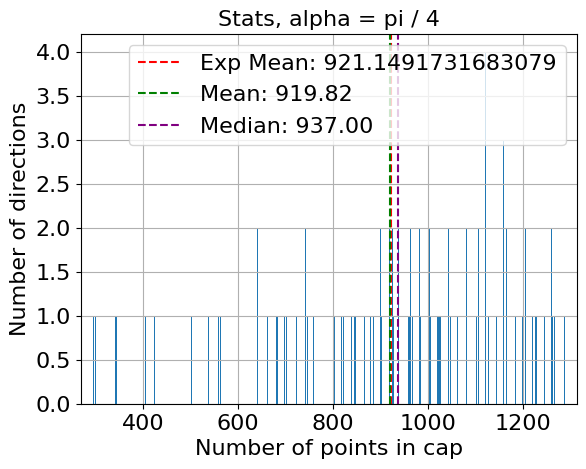

Saving CSV to: Run302159PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    722.176421    722.176421
1      vector sum y   -139.991324   -139.991324
2      vector sum z    183.602634    183.602634
3   vector sum norm    758.186178    758.186178
4           total N   6290.000000   6290.000000
5              mean   1576.257310    919.821637
6            median   1565.500000    937.000000
7          variance  90222.694026  57297.357076
8             stdev    300.370927    239.368664
9  normalized stdev      0.190560      0.260234
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


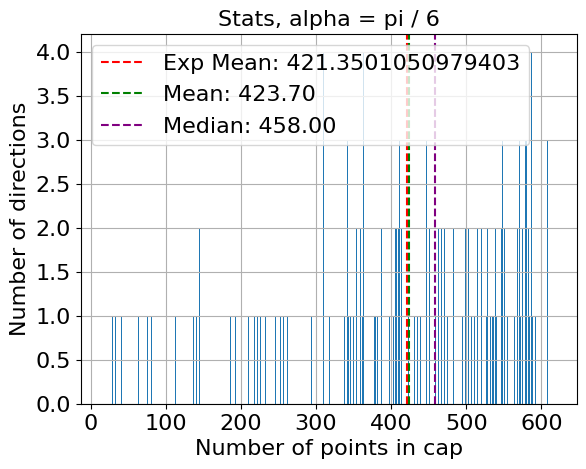

Saving CSV to: Run302159PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    722.176421    722.176421    722.176421
1      vector sum y   -139.991324   -139.991324   -139.991324
2      vector sum z    183.602634    183.602634    183.602634
3   vector sum norm    758.186178    758.186178    758.186178
4           total N   6290.000000   6290.000000   6290.000000
5              mean   1576.257310    919.821637    423.701754
6            median   1565.500000    937.000000    458.000000
7          variance  90222.694026  57297.357076  22484.846722
8             stdev    300.370927    239.368664    149.949481
9  normalized stdev      0.190560      0.260234      0.353903
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


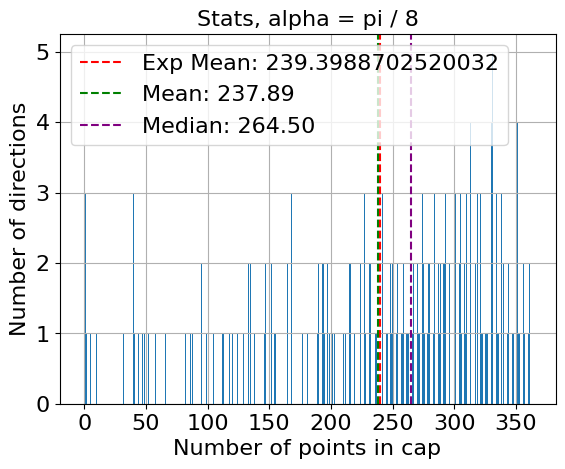

Saving CSV to: Run302159PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    722.176421    722.176421    722.176421    722.176421
1      vector sum y   -139.991324   -139.991324   -139.991324   -139.991324
2      vector sum z    183.602634    183.602634    183.602634    183.602634
3   vector sum norm    758.186178    758.186178    758.186178    758.186178
4           total N   6290.000000   6290.000000   6290.000000   6290.000000
5              mean   1576.257310    919.821637    423.701754    237.885965
6            median   1565.500000    937.000000    458.000000    264.500000
7          variance  90222.694026  57297.357076  22484.846722   9423.171207
8             stdev    300.370927    239.368664    149.949481     97.073020
9  normalized stdev      0.190560      0.260234      0.353903      0.408065
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

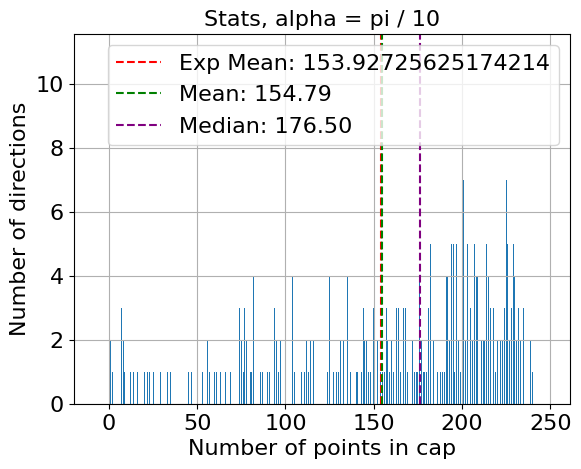

Saving CSV to: Run302159PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    722.176421    722.176421    722.176421    722.176421   
1      vector sum y   -139.991324   -139.991324   -139.991324   -139.991324   
2      vector sum z    183.602634    183.602634    183.602634    183.602634   
3   vector sum norm    758.186178    758.186178    758.186178    758.186178   
4           total N   6290.000000   6290.000000   6290.000000   6290.000000   
5              mean   1576.257310    919.821637    423.701754    237.885965   
6            median   1565.500000    937.000000    458.000000    264.500000   
7          variance  90222.694026  57297.357076  22484.846722   9423.171207   
8             stdev    300.370927    239.368664    149.949481     97.073020   
9  normalized stdev      0.190560      0.260234      0.353903      0.408065   

   alpha = pi/10  
0     722.176421  
1    -139.991324  
2     183.602634  
3     758.

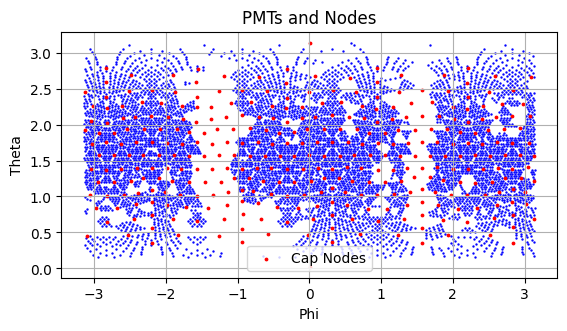

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


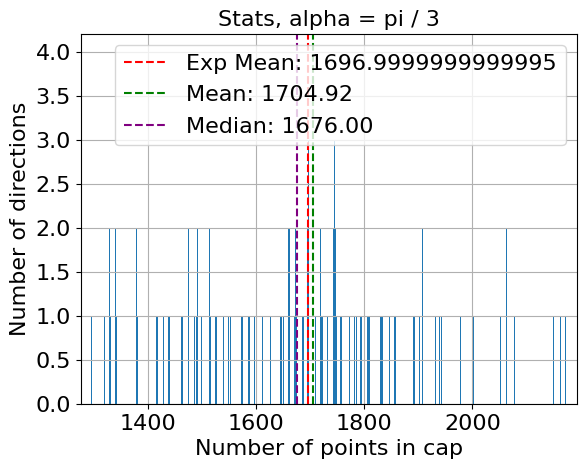

Saving CSV to: Run355216PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x   -196.469044
1      vector sum y    162.759853
2      vector sum z   -242.275020
3   vector sum norm    351.835246
4           total N   6788.000000
5              mean   1704.923977
6            median   1676.000000
7          variance  40332.614103
8             stdev    200.829814
9  normalized stdev      0.117794
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


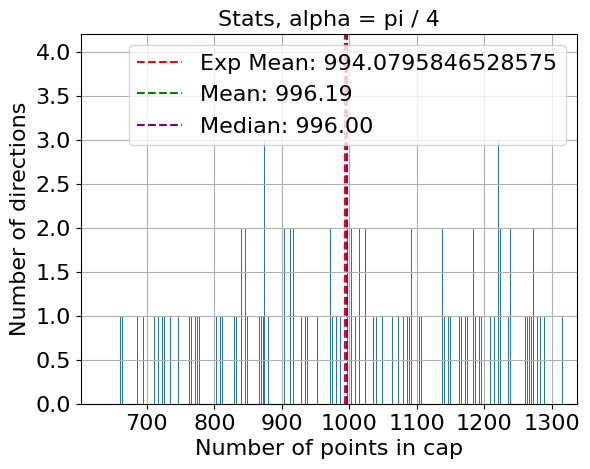

Saving CSV to: Run355216PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x   -196.469044   -196.469044
1      vector sum y    162.759853    162.759853
2      vector sum z   -242.275020   -242.275020
3   vector sum norm    351.835246    351.835246
4           total N   6788.000000   6788.000000
5              mean   1704.923977    996.187135
6            median   1676.000000    996.000000
7          variance  40332.614103  31081.204747
8             stdev    200.829814    176.298624
9  normalized stdev      0.117794      0.176973
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


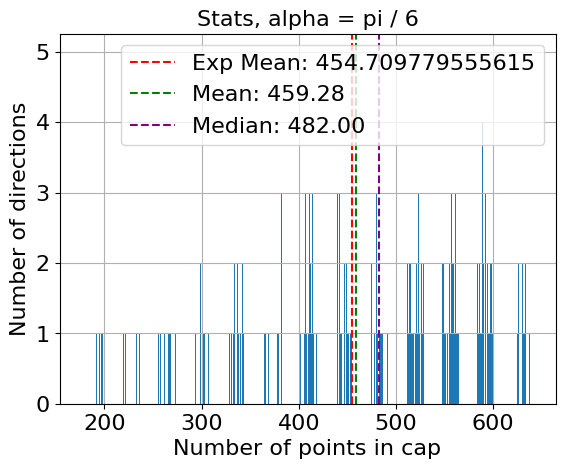

Saving CSV to: Run355216PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x   -196.469044   -196.469044   -196.469044
1      vector sum y    162.759853    162.759853    162.759853
2      vector sum z   -242.275020   -242.275020   -242.275020
3   vector sum norm    351.835246    351.835246    351.835246
4           total N   6788.000000   6788.000000   6788.000000
5              mean   1704.923977    996.187135    459.280702
6            median   1676.000000    996.000000    482.000000
7          variance  40332.614103  31081.204747  13925.558633
8             stdev    200.829814    176.298624    118.006604
9  normalized stdev      0.117794      0.176973      0.256938
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


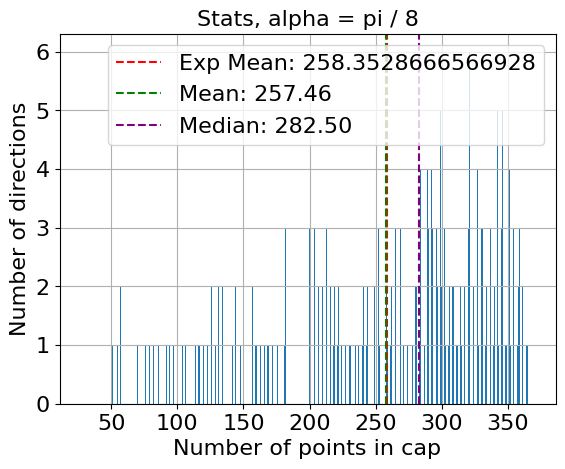

Saving CSV to: Run355216PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x   -196.469044   -196.469044   -196.469044   -196.469044
1      vector sum y    162.759853    162.759853    162.759853    162.759853
2      vector sum z   -242.275020   -242.275020   -242.275020   -242.275020
3   vector sum norm    351.835246    351.835246    351.835246    351.835246
4           total N   6788.000000   6788.000000   6788.000000   6788.000000
5              mean   1704.923977    996.187135    459.280702    257.459064
6            median   1676.000000    996.000000    482.000000    282.500000
7          variance  40332.614103  31081.204747  13925.558633   6405.002710
8             stdev    200.829814    176.298624    118.006604     80.031261
9  normalized stdev      0.117794      0.176973      0.256938      0.310850
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

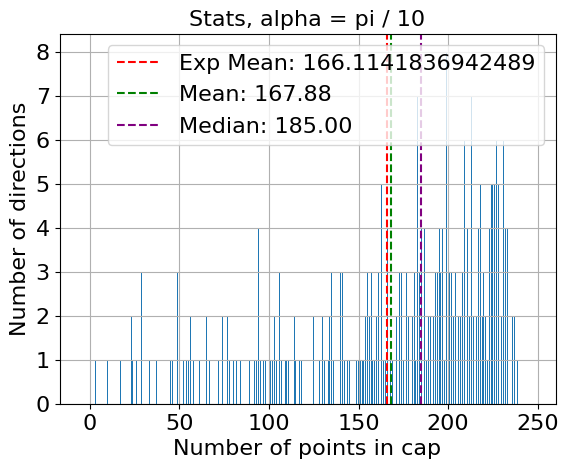

Saving CSV to: Run355216PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x   -196.469044   -196.469044   -196.469044   -196.469044   
1      vector sum y    162.759853    162.759853    162.759853    162.759853   
2      vector sum z   -242.275020   -242.275020   -242.275020   -242.275020   
3   vector sum norm    351.835246    351.835246    351.835246    351.835246   
4           total N   6788.000000   6788.000000   6788.000000   6788.000000   
5              mean   1704.923977    996.187135    459.280702    257.459064   
6            median   1676.000000    996.000000    482.000000    282.500000   
7          variance  40332.614103  31081.204747  13925.558633   6405.002710   
8             stdev    200.829814    176.298624    118.006604     80.031261   
9  normalized stdev      0.117794      0.176973      0.256938      0.310850   

   alpha = pi/10  
0    -196.469044  
1     162.759853  
2    -242.275020  
3     351.

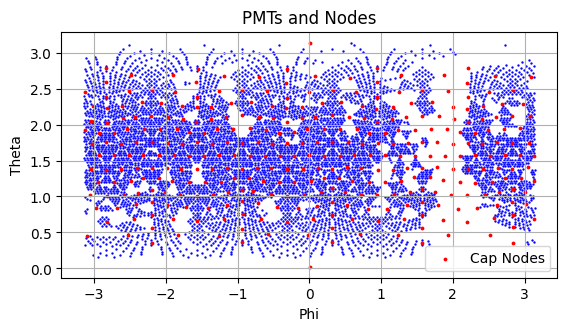

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


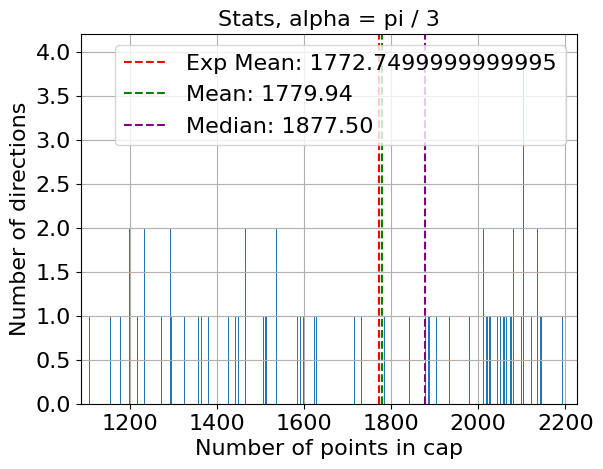

Saving CSV to: Run356009PMTConfig_stats.csv
             Metric   alpha = pi/3
0      vector sum x     287.954938
1      vector sum y    -831.118173
2      vector sum z    -125.797945
3   vector sum norm     888.538456
4           total N    7091.000000
5              mean    1779.944444
6            median    1877.500000
7          variance  103603.859487
8             stdev     321.875534
9  normalized stdev       0.180835
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


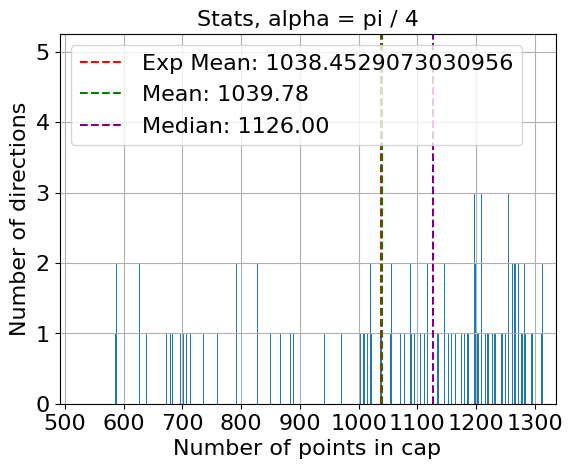

Saving CSV to: Run356009PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4
0      vector sum x     287.954938    287.954938
1      vector sum y    -831.118173   -831.118173
2      vector sum z    -125.797945   -125.797945
3   vector sum norm     888.538456    888.538456
4           total N    7091.000000   7091.000000
5              mean    1779.944444   1039.783626
6            median    1877.500000   1126.000000
7          variance  103603.859487  53497.228036
8             stdev     321.875534    231.294678
9  normalized stdev       0.180835      0.222445
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


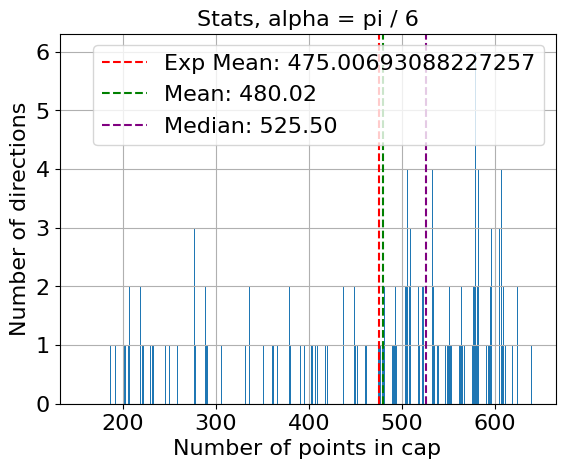

Saving CSV to: Run356009PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     287.954938    287.954938    287.954938
1      vector sum y    -831.118173   -831.118173   -831.118173
2      vector sum z    -125.797945   -125.797945   -125.797945
3   vector sum norm     888.538456    888.538456    888.538456
4           total N    7091.000000   7091.000000   7091.000000
5              mean    1779.944444   1039.783626    480.023392
6            median    1877.500000   1126.000000    525.500000
7          variance  103603.859487  53497.228036  16335.525769
8             stdev     321.875534    231.294678    127.810507
9  normalized stdev       0.180835      0.222445      0.266259
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


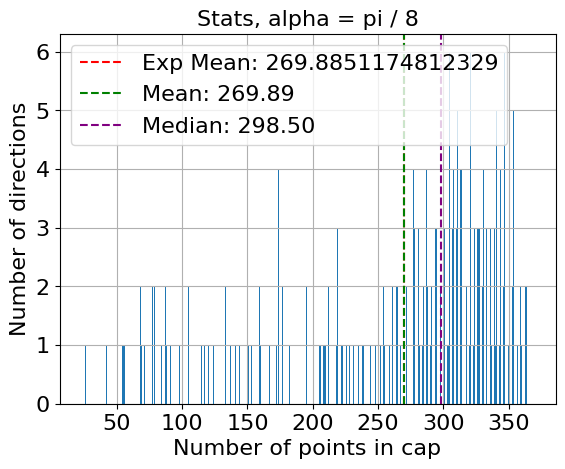

Saving CSV to: Run356009PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     287.954938    287.954938    287.954938    287.954938
1      vector sum y    -831.118173   -831.118173   -831.118173   -831.118173
2      vector sum z    -125.797945   -125.797945   -125.797945   -125.797945
3   vector sum norm     888.538456    888.538456    888.538456    888.538456
4           total N    7091.000000   7091.000000   7091.000000   7091.000000
5              mean    1779.944444   1039.783626    480.023392    269.894737
6            median    1877.500000   1126.000000    525.500000    298.500000
7          variance  103603.859487  53497.228036  16335.525769   6238.831025
8             stdev     321.875534    231.294678    127.810507     78.986271
9  normalized stdev       0.180835      0.222445      0.266259      0.292656
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

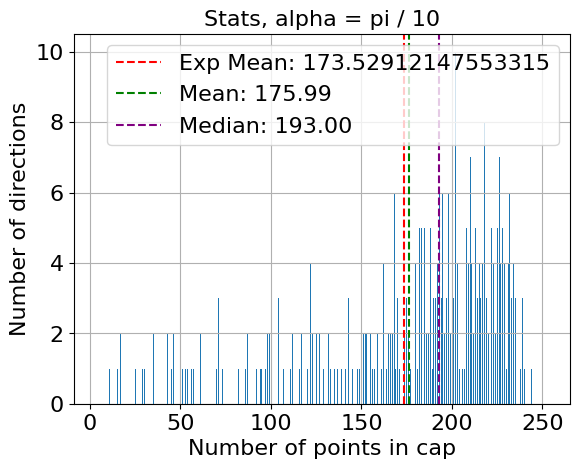

Saving CSV to: Run356009PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     287.954938    287.954938    287.954938    287.954938   
1      vector sum y    -831.118173   -831.118173   -831.118173   -831.118173   
2      vector sum z    -125.797945   -125.797945   -125.797945   -125.797945   
3   vector sum norm     888.538456    888.538456    888.538456    888.538456   
4           total N    7091.000000   7091.000000   7091.000000   7091.000000   
5              mean    1779.944444   1039.783626    480.023392    269.894737   
6            median    1877.500000   1126.000000    525.500000    298.500000   
7          variance  103603.859487  53497.228036  16335.525769   6238.831025   
8             stdev     321.875534    231.294678    127.810507     78.986271   
9  normalized stdev       0.180835      0.222445      0.266259      0.292656   

   alpha = pi/10  
0     287.954938  
1    -831.118173  
2    -125.797945  

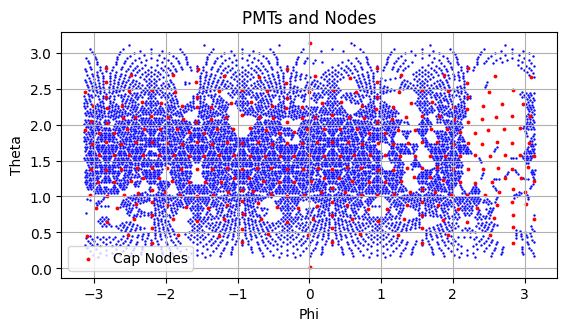

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


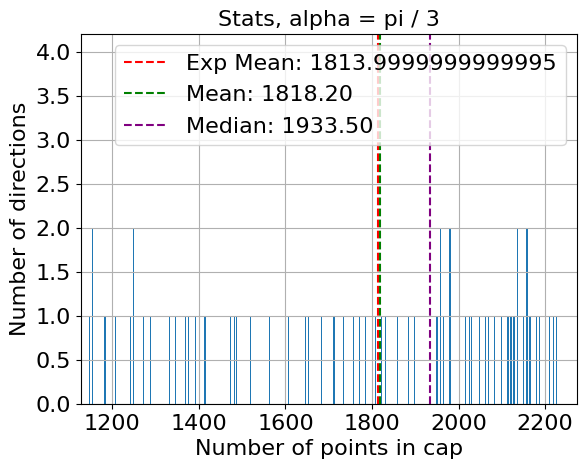

Saving CSV to: Run351884PMTConfig_stats.csv
             Metric   alpha = pi/3
0      vector sum x     736.206601
1      vector sum y    -539.519240
2      vector sum z     -24.013078
3   vector sum norm     913.048628
4           total N    7256.000000
5              mean    1818.204678
6            median    1933.500000
7          variance  104771.905475
8             stdev     323.684886
9  normalized stdev       0.178024
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


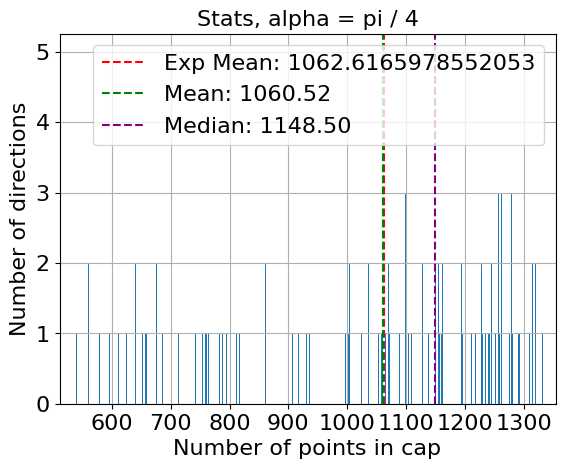

Saving CSV to: Run351884PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4
0      vector sum x     736.206601    736.206601
1      vector sum y    -539.519240   -539.519240
2      vector sum z     -24.013078    -24.013078
3   vector sum norm     913.048628    913.048628
4           total N    7256.000000   7256.000000
5              mean    1818.204678   1060.517544
6            median    1933.500000   1148.500000
7          variance  104771.905475  52739.413435
8             stdev     323.684886    229.650633
9  normalized stdev       0.178024      0.216546
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


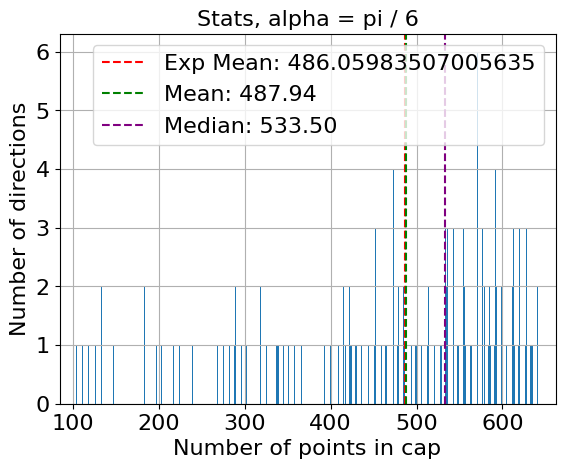

Saving CSV to: Run351884PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     736.206601    736.206601    736.206601
1      vector sum y    -539.519240   -539.519240   -539.519240
2      vector sum z     -24.013078    -24.013078    -24.013078
3   vector sum norm     913.048628    913.048628    913.048628
4           total N    7256.000000   7256.000000   7256.000000
5              mean    1818.204678   1060.517544    487.938596
6            median    1933.500000   1148.500000    533.500000
7          variance  104771.905475  52739.413435  16632.806171
8             stdev     323.684886    229.650633    128.968237
9  normalized stdev       0.178024      0.216546      0.264312
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


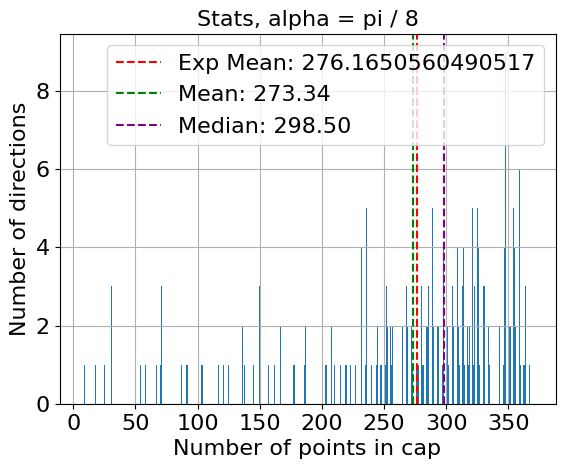

Saving CSV to: Run351884PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     736.206601    736.206601    736.206601    736.206601
1      vector sum y    -539.519240   -539.519240   -539.519240   -539.519240
2      vector sum z     -24.013078    -24.013078    -24.013078    -24.013078
3   vector sum norm     913.048628    913.048628    913.048628    913.048628
4           total N    7256.000000   7256.000000   7256.000000   7256.000000
5              mean    1818.204678   1060.517544    487.938596    273.342105
6            median    1933.500000   1148.500000    533.500000    298.500000
7          variance  104771.905475  52739.413435  16632.806171   6709.131502
8             stdev     323.684886    229.650633    128.968237     81.909288
9  normalized stdev       0.178024      0.216546      0.264312      0.299659
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

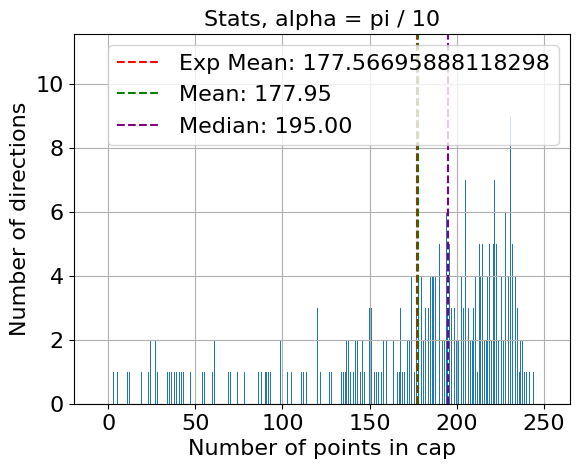

Saving CSV to: Run351884PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     736.206601    736.206601    736.206601    736.206601   
1      vector sum y    -539.519240   -539.519240   -539.519240   -539.519240   
2      vector sum z     -24.013078    -24.013078    -24.013078    -24.013078   
3   vector sum norm     913.048628    913.048628    913.048628    913.048628   
4           total N    7256.000000   7256.000000   7256.000000   7256.000000   
5              mean    1818.204678   1060.517544    487.938596    273.342105   
6            median    1933.500000   1148.500000    533.500000    298.500000   
7          variance  104771.905475  52739.413435  16632.806171   6709.131502   
8             stdev     323.684886    229.650633    128.968237     81.909288   
9  normalized stdev       0.178024      0.216546      0.264312      0.299659   

   alpha = pi/10  
0     736.206601  
1    -539.519240  
2     -24.013078  

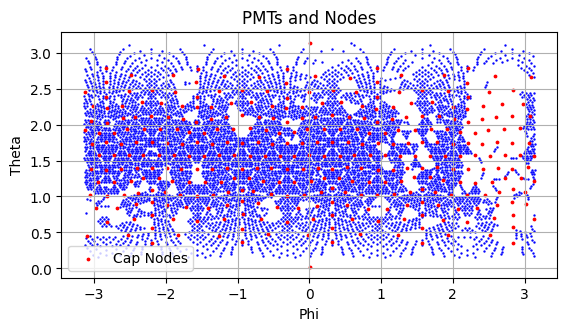

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


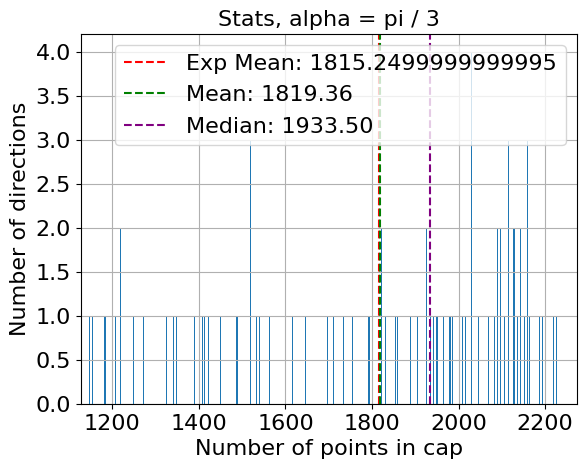

Saving CSV to: Run351847PMTConfig_stats.csv
             Metric   alpha = pi/3
0      vector sum x     736.647250
1      vector sum y    -544.138237
2      vector sum z     -27.501096
3   vector sum norm     916.237906
4           total N    7261.000000
5              mean    1819.362573
6            median    1933.500000
7          variance  105358.482576
8             stdev     324.589714
9  normalized stdev       0.178408
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


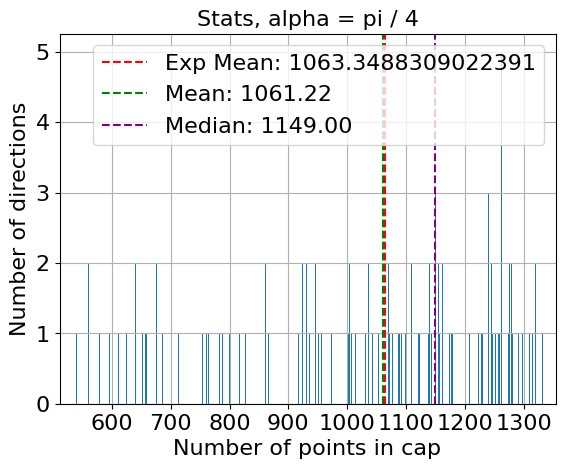

Saving CSV to: Run351847PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4
0      vector sum x     736.647250    736.647250
1      vector sum y    -544.138237   -544.138237
2      vector sum z     -27.501096    -27.501096
3   vector sum norm     916.237906    916.237906
4           total N    7261.000000   7261.000000
5              mean    1819.362573   1061.219298
6            median    1933.500000   1149.000000
7          variance  105358.482576  52952.621499
8             stdev     324.589714    230.114366
9  normalized stdev       0.178408      0.216840
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


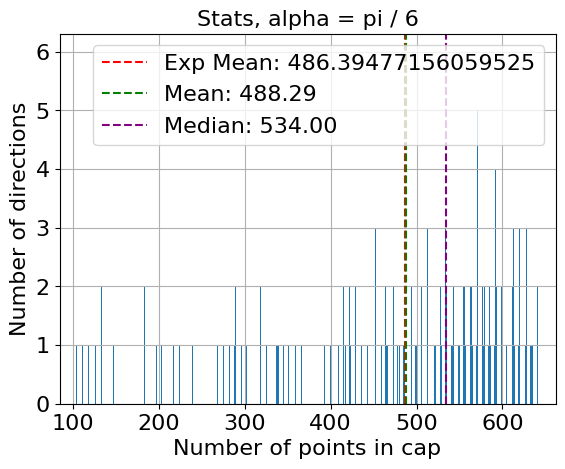

Saving CSV to: Run351847PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     736.647250    736.647250    736.647250
1      vector sum y    -544.138237   -544.138237   -544.138237
2      vector sum z     -27.501096    -27.501096    -27.501096
3   vector sum norm     916.237906    916.237906    916.237906
4           total N    7261.000000   7261.000000   7261.000000
5              mean    1819.362573   1061.219298    488.289474
6            median    1933.500000   1149.000000    534.000000
7          variance  105358.482576  52952.621499  16670.340182
8             stdev     324.589714    230.114366    129.113672
9  normalized stdev       0.178408      0.216840      0.264420
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


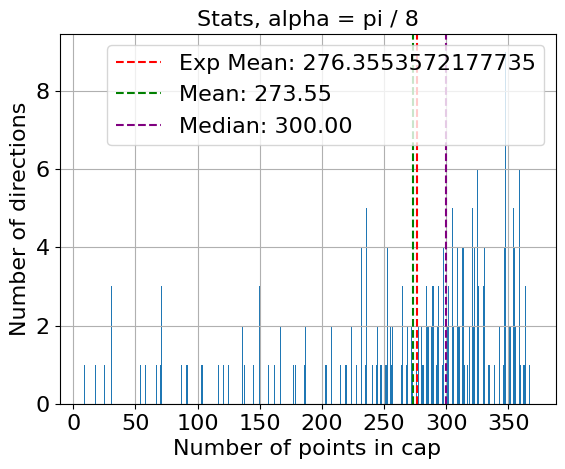

Saving CSV to: Run351847PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     736.647250    736.647250    736.647250    736.647250
1      vector sum y    -544.138237   -544.138237   -544.138237   -544.138237
2      vector sum z     -27.501096    -27.501096    -27.501096    -27.501096
3   vector sum norm     916.237906    916.237906    916.237906    916.237906
4           total N    7261.000000   7261.000000   7261.000000   7261.000000
5              mean    1819.362573   1061.219298    488.289474    273.552632
6            median    1933.500000   1149.000000    534.000000    300.000000
7          variance  105358.482576  52952.621499  16670.340182   6719.229686
8             stdev     324.589714    230.114366    129.113672     81.970908
9  normalized stdev       0.178408      0.216840      0.264420      0.299653
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

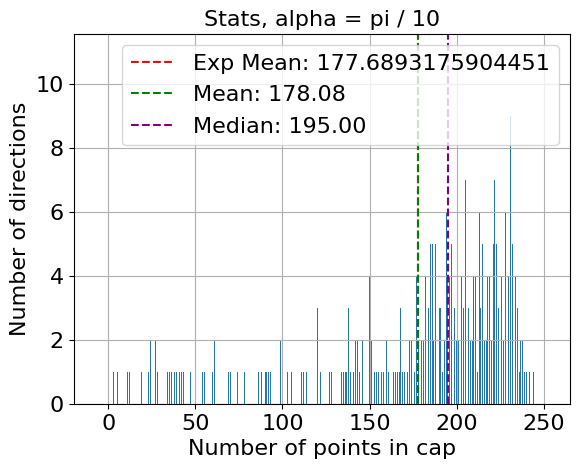

Saving CSV to: Run351847PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     736.647250    736.647250    736.647250    736.647250   
1      vector sum y    -544.138237   -544.138237   -544.138237   -544.138237   
2      vector sum z     -27.501096    -27.501096    -27.501096    -27.501096   
3   vector sum norm     916.237906    916.237906    916.237906    916.237906   
4           total N    7261.000000   7261.000000   7261.000000   7261.000000   
5              mean    1819.362573   1061.219298    488.289474    273.552632   
6            median    1933.500000   1149.000000    534.000000    300.000000   
7          variance  105358.482576  52952.621499  16670.340182   6719.229686   
8             stdev     324.589714    230.114366    129.113672     81.970908   
9  normalized stdev       0.178408      0.216840      0.264420      0.299653   

   alpha = pi/10  
0     736.647250  
1    -544.138237  
2     -27.501096  

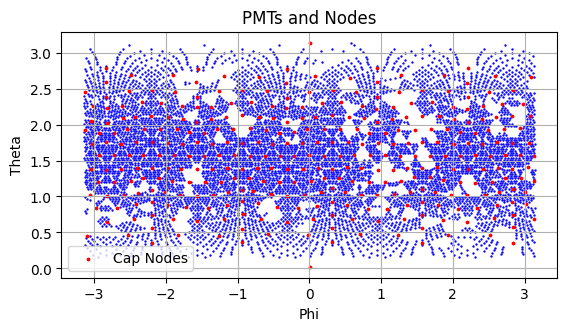

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


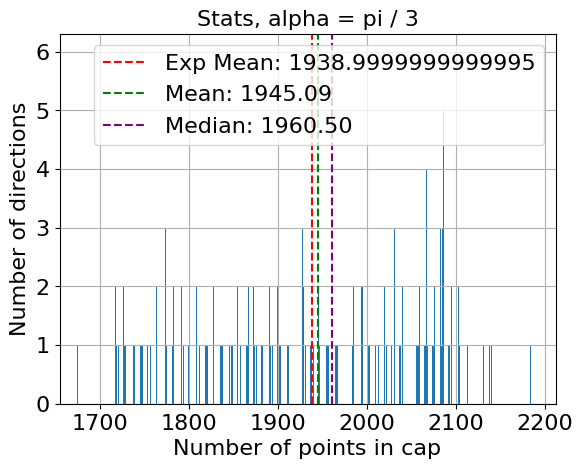

Saving CSV to: Run358123PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -15.341635
1      vector sum y   -335.871535
2      vector sum z    -21.248331
3   vector sum norm    336.892483
4           total N   7756.000000
5              mean   1945.087719
6            median   1960.500000
7          variance  17354.243767
8             stdev    131.735507
9  normalized stdev      0.067727
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


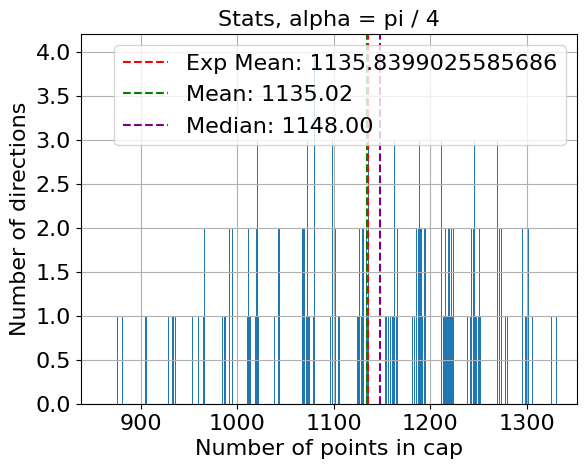

Saving CSV to: Run358123PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -15.341635    -15.341635
1      vector sum y   -335.871535   -335.871535
2      vector sum z    -21.248331    -21.248331
3   vector sum norm    336.892483    336.892483
4           total N   7756.000000   7756.000000
5              mean   1945.087719   1135.017544
6            median   1960.500000   1148.000000
7          variance  17354.243767  10730.034780
8             stdev    131.735507    103.585881
9  normalized stdev      0.067727      0.091264
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


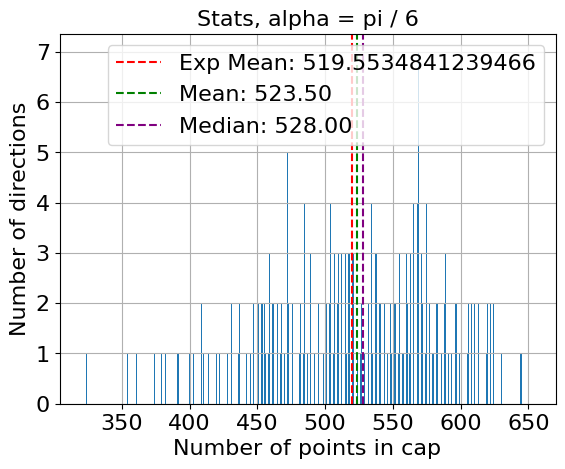

Saving CSV to: Run358123PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -15.341635    -15.341635    -15.341635
1      vector sum y   -335.871535   -335.871535   -335.871535
2      vector sum z    -21.248331    -21.248331    -21.248331
3   vector sum norm    336.892483    336.892483    336.892483
4           total N   7756.000000   7756.000000   7756.000000
5              mean   1945.087719   1135.017544    523.502924
6            median   1960.500000   1148.000000    528.000000
7          variance  17354.243767  10730.034780   4176.671044
8             stdev    131.735507    103.585881     64.627170
9  normalized stdev      0.067727      0.091264      0.123451
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


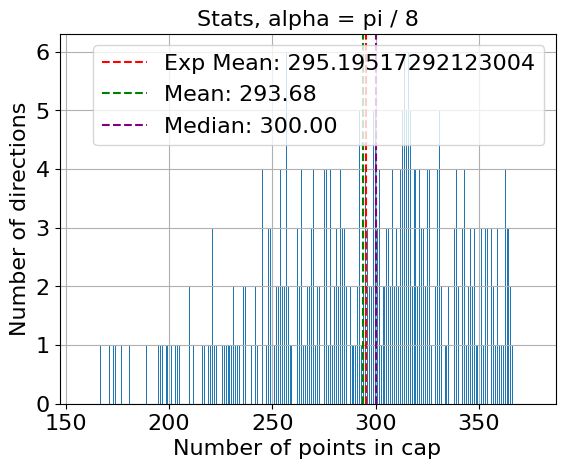

Saving CSV to: Run358123PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -15.341635    -15.341635    -15.341635    -15.341635
1      vector sum y   -335.871535   -335.871535   -335.871535   -335.871535
2      vector sum z    -21.248331    -21.248331    -21.248331    -21.248331
3   vector sum norm    336.892483    336.892483    336.892483    336.892483
4           total N   7756.000000   7756.000000   7756.000000   7756.000000
5              mean   1945.087719   1135.017544    523.502924    293.678363
6            median   1960.500000   1148.000000    528.000000    300.000000
7          variance  17354.243767  10730.034780   4176.671044   1940.621696
8             stdev    131.735507    103.585881     64.627170     44.052488
9  normalized stdev      0.067727      0.091264      0.123451      0.150002
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

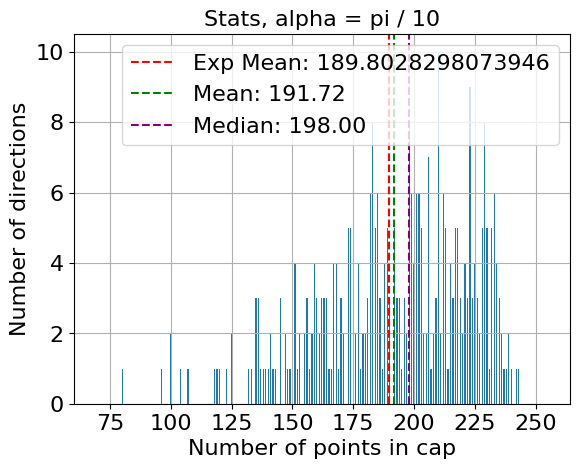

Saving CSV to: Run358123PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -15.341635    -15.341635    -15.341635    -15.341635   
1      vector sum y   -335.871535   -335.871535   -335.871535   -335.871535   
2      vector sum z    -21.248331    -21.248331    -21.248331    -21.248331   
3   vector sum norm    336.892483    336.892483    336.892483    336.892483   
4           total N   7756.000000   7756.000000   7756.000000   7756.000000   
5              mean   1945.087719   1135.017544    523.502924    293.678363   
6            median   1960.500000   1148.000000    528.000000    300.000000   
7          variance  17354.243767  10730.034780   4176.671044   1940.621696   
8             stdev    131.735507    103.585881     64.627170     44.052488   
9  normalized stdev      0.067727      0.091264      0.123451      0.150002   

   alpha = pi/10  
0     -15.341635  
1    -335.871535  
2     -21.248331  
3     336.

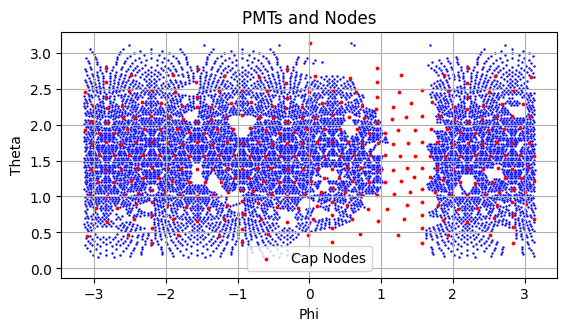

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


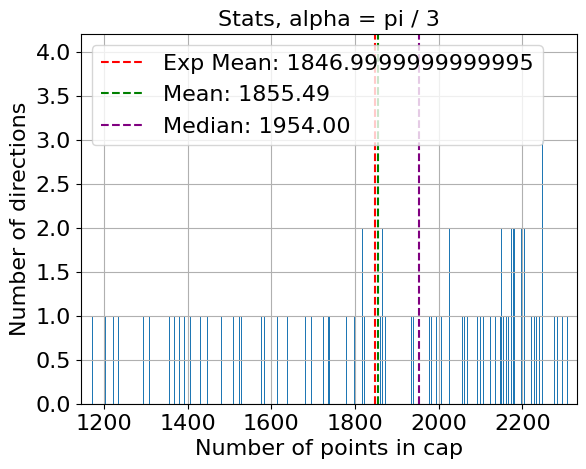

Saving CSV to: Run303334PMTConfig_stats.csv
             Metric   alpha = pi/3
0      vector sum x    -384.551855
1      vector sum y    -850.965372
2      vector sum z    -179.998729
3   vector sum norm     951.010902
4           total N    7388.000000
5              mean    1855.488304
6            median    1954.000000
7          variance  119041.021793
8             stdev     345.023219
9  normalized stdev       0.185947
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


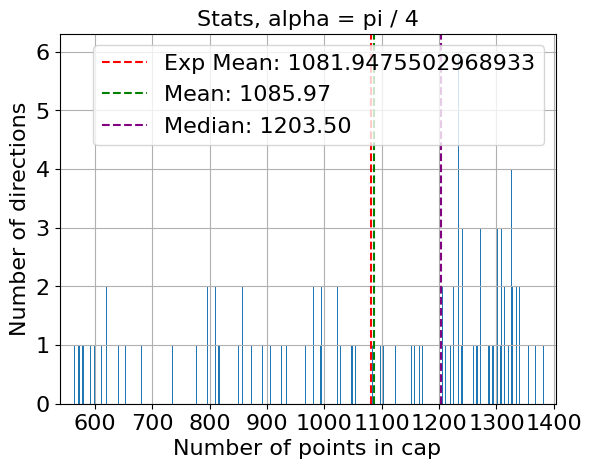

Saving CSV to: Run303334PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4
0      vector sum x    -384.551855   -384.551855
1      vector sum y    -850.965372   -850.965372
2      vector sum z    -179.998729   -179.998729
3   vector sum norm     951.010902    951.010902
4           total N    7388.000000   7388.000000
5              mean    1855.488304   1085.973684
6            median    1954.000000   1203.500000
7          variance  119041.021793  62481.224454
8             stdev     345.023219    249.962446
9  normalized stdev       0.185947      0.230174
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


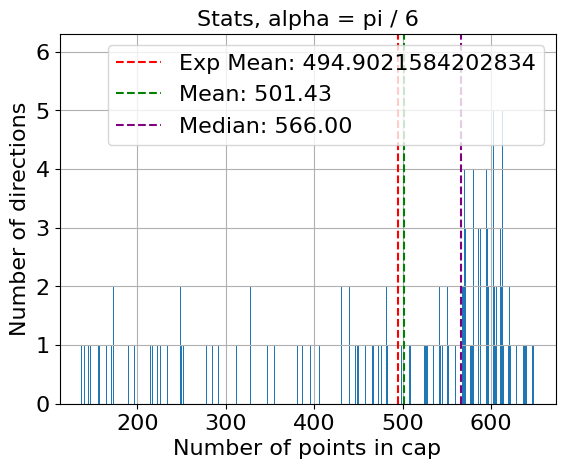

Saving CSV to: Run303334PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -384.551855   -384.551855   -384.551855
1      vector sum y    -850.965372   -850.965372   -850.965372
2      vector sum z    -179.998729   -179.998729   -179.998729
3   vector sum norm     951.010902    951.010902    951.010902
4           total N    7388.000000   7388.000000   7388.000000
5              mean    1855.488304   1085.973684    501.429825
6            median    1954.000000   1203.500000    566.000000
7          variance  119041.021793  62481.224454  20365.730456
8             stdev     345.023219    249.962446    142.708551
9  normalized stdev       0.185947      0.230174      0.284603
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


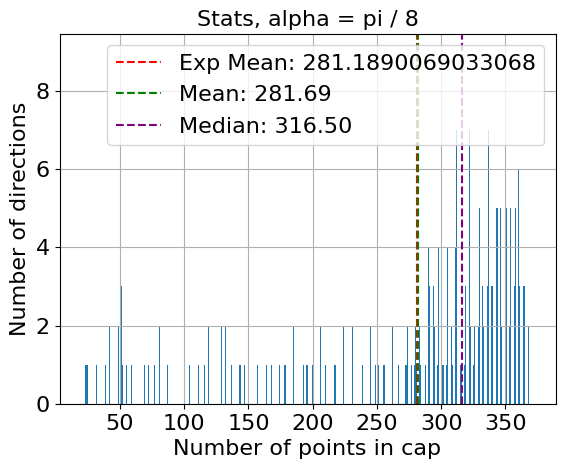

Saving CSV to: Run303334PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -384.551855   -384.551855   -384.551855   -384.551855
1      vector sum y    -850.965372   -850.965372   -850.965372   -850.965372
2      vector sum z    -179.998729   -179.998729   -179.998729   -179.998729
3   vector sum norm     951.010902    951.010902    951.010902    951.010902
4           total N    7388.000000   7388.000000   7388.000000   7388.000000
5              mean    1855.488304   1085.973684    501.429825    281.692982
6            median    1954.000000   1203.500000    566.000000    316.500000
7          variance  119041.021793  62481.224454  20365.730456   8110.031471
8             stdev     345.023219    249.962446    142.708551     90.055713
9  normalized stdev       0.185947      0.230174      0.284603      0.319695
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now

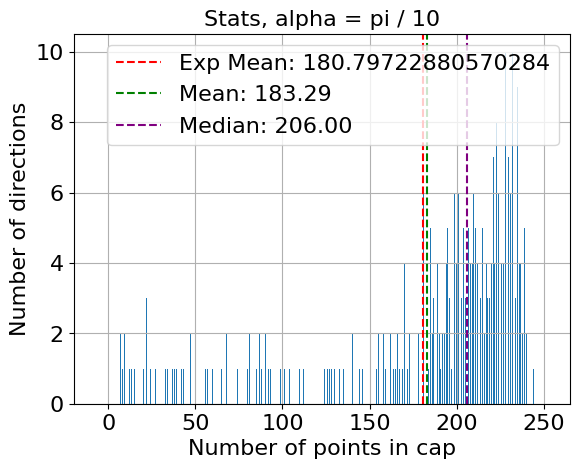

Saving CSV to: Run303334PMTConfig_stats.csv
             Metric   alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -384.551855   -384.551855   -384.551855   -384.551855   
1      vector sum y    -850.965372   -850.965372   -850.965372   -850.965372   
2      vector sum z    -179.998729   -179.998729   -179.998729   -179.998729   
3   vector sum norm     951.010902    951.010902    951.010902    951.010902   
4           total N    7388.000000   7388.000000   7388.000000   7388.000000   
5              mean    1855.488304   1085.973684    501.429825    281.692982   
6            median    1954.000000   1203.500000    566.000000    316.500000   
7          variance  119041.021793  62481.224454  20365.730456   8110.031471   
8             stdev     345.023219    249.962446    142.708551     90.055713   
9  normalized stdev       0.185947      0.230174      0.284603      0.319695   

   alpha = pi/10  
0    -384.551855  
1    -850.965372  
2    -179.998729  

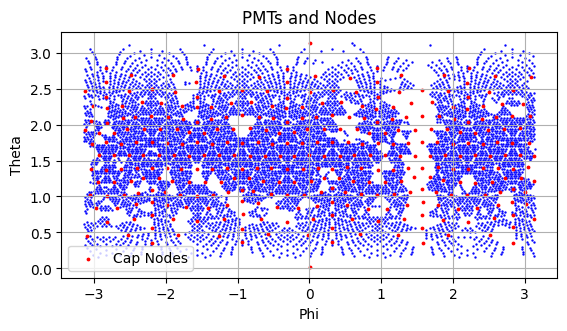

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


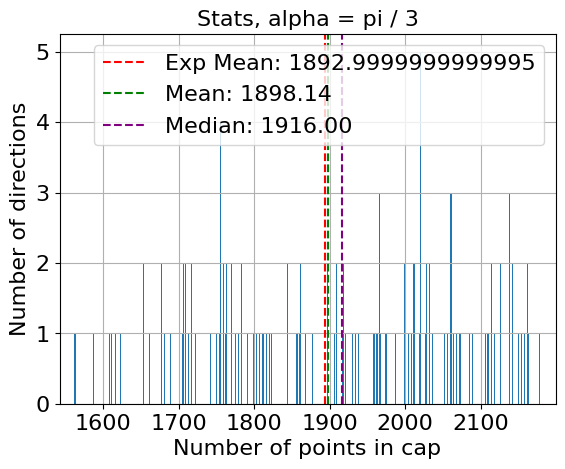

Saving CSV to: Run311222PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x     58.408537
1      vector sum y   -392.916461
2      vector sum z   -147.253015
3   vector sum norm    423.648856
4           total N   7572.000000
5              mean   1898.140351
6            median   1916.000000
7          variance  25250.418898
8             stdev    158.903804
9  normalized stdev      0.083716
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


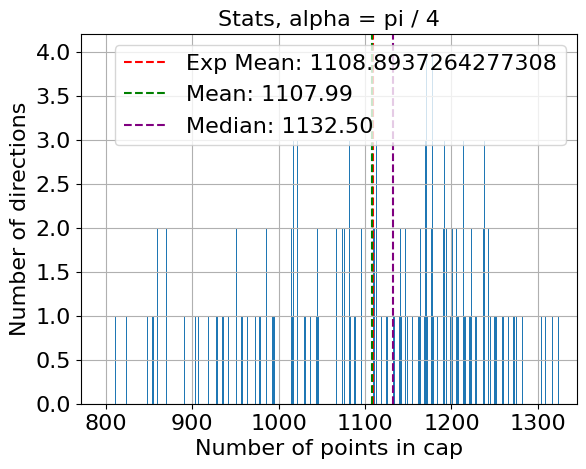

Saving CSV to: Run311222PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     58.408537     58.408537
1      vector sum y   -392.916461   -392.916461
2      vector sum z   -147.253015   -147.253015
3   vector sum norm    423.648856    423.648856
4           total N   7572.000000   7572.000000
5              mean   1898.140351   1107.994152
6            median   1916.000000   1132.500000
7          variance  25250.418898  14491.999966
8             stdev    158.903804    120.382723
9  normalized stdev      0.083716      0.108649
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


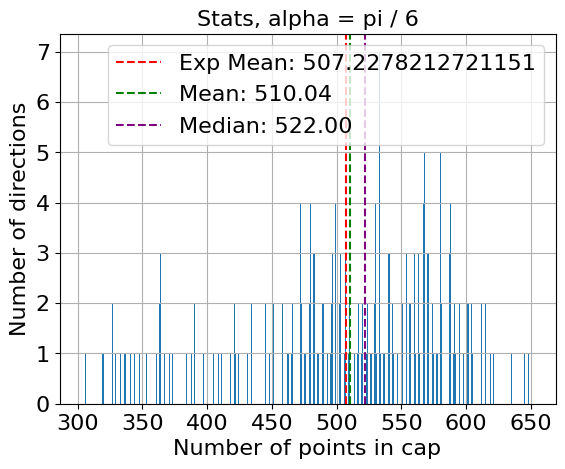

Saving CSV to: Run311222PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     58.408537     58.408537     58.408537
1      vector sum y   -392.916461   -392.916461   -392.916461
2      vector sum z   -147.253015   -147.253015   -147.253015
3   vector sum norm    423.648856    423.648856    423.648856
4           total N   7572.000000   7572.000000   7572.000000
5              mean   1898.140351   1107.994152    510.038012
6            median   1916.000000   1132.500000    522.000000
7          variance  25250.418898  14491.999966   5688.679842
8             stdev    158.903804    120.382723     75.423338
9  normalized stdev      0.083716      0.108649      0.147878
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


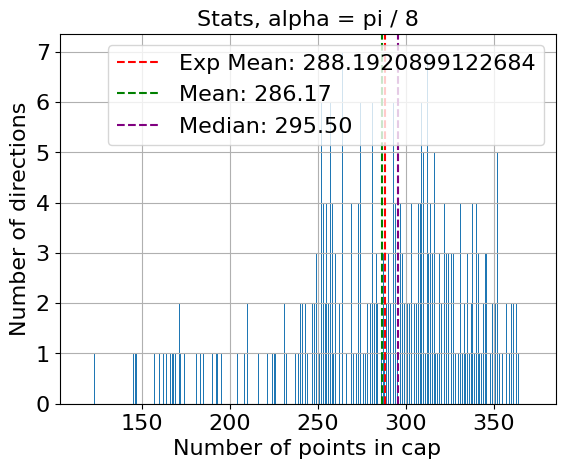

Saving CSV to: Run311222PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     58.408537     58.408537     58.408537     58.408537
1      vector sum y   -392.916461   -392.916461   -392.916461   -392.916461
2      vector sum z   -147.253015   -147.253015   -147.253015   -147.253015
3   vector sum norm    423.648856    423.648856    423.648856    423.648856
4           total N   7572.000000   7572.000000   7572.000000   7572.000000
5              mean   1898.140351   1107.994152    510.038012    286.166667
6            median   1916.000000   1132.500000    522.000000    295.500000
7          variance  25250.418898  14491.999966   5688.679842   2609.021930
8             stdev    158.903804    120.382723     75.423338     51.078586
9  normalized stdev      0.083716      0.108649      0.147878      0.178492
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

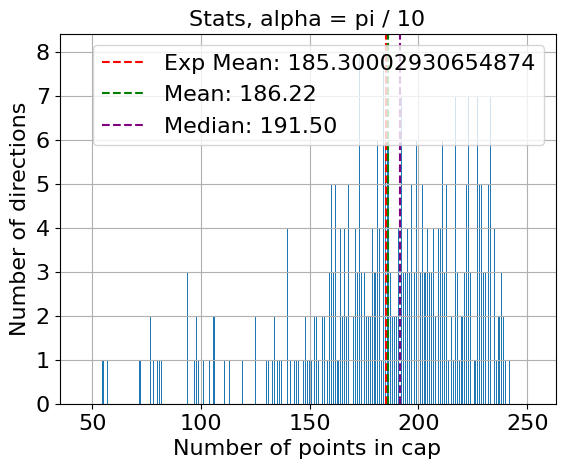

Saving CSV to: Run311222PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     58.408537     58.408537     58.408537     58.408537   
1      vector sum y   -392.916461   -392.916461   -392.916461   -392.916461   
2      vector sum z   -147.253015   -147.253015   -147.253015   -147.253015   
3   vector sum norm    423.648856    423.648856    423.648856    423.648856   
4           total N   7572.000000   7572.000000   7572.000000   7572.000000   
5              mean   1898.140351   1107.994152    510.038012    286.166667   
6            median   1916.000000   1132.500000    522.000000    295.500000   
7          variance  25250.418898  14491.999966   5688.679842   2609.021930   
8             stdev    158.903804    120.382723     75.423338     51.078586   
9  normalized stdev      0.083716      0.108649      0.147878      0.178492   

   alpha = pi/10  
0      58.408537  
1    -392.916461  
2    -147.253015  
3     423.

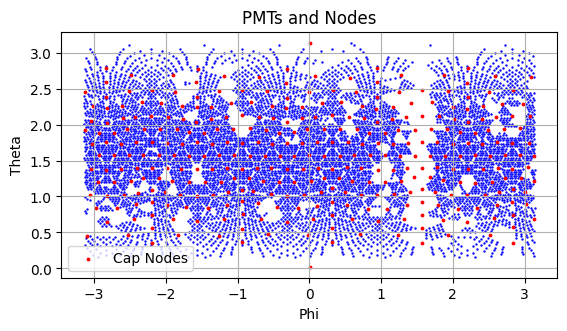

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


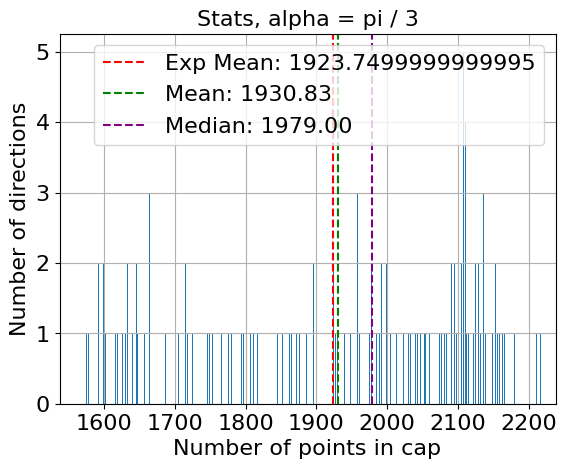

Saving CSV to: Run355145PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x     23.460018
1      vector sum y   -471.551180
2      vector sum z    -46.987843
3   vector sum norm    474.466801
4           total N   7695.000000
5              mean   1930.833333
6            median   1979.000000
7          variance  32959.600877
8             stdev    181.547792
9  normalized stdev      0.094026
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


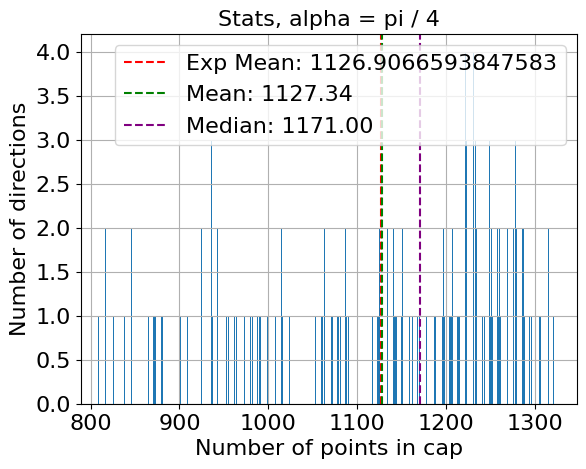

Saving CSV to: Run355145PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     23.460018     23.460018
1      vector sum y   -471.551180   -471.551180
2      vector sum z    -46.987843    -46.987843
3   vector sum norm    474.466801    474.466801
4           total N   7695.000000   7695.000000
5              mean   1930.833333   1127.339181
6            median   1979.000000   1171.000000
7          variance  32959.600877  18870.387880
8             stdev    181.547792    137.369530
9  normalized stdev      0.094026      0.121853
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


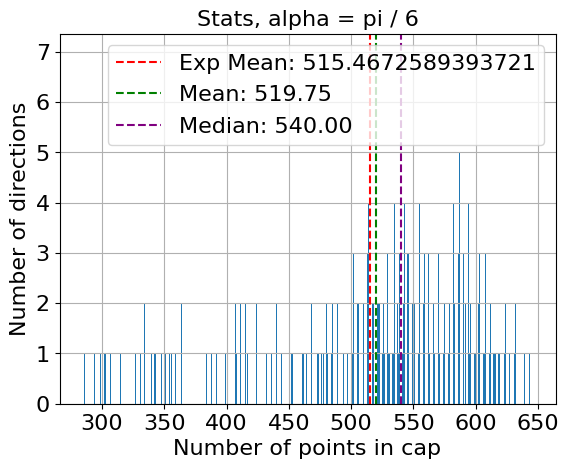

Saving CSV to: Run355145PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     23.460018     23.460018     23.460018
1      vector sum y   -471.551180   -471.551180   -471.551180
2      vector sum z    -46.987843    -46.987843    -46.987843
3   vector sum norm    474.466801    474.466801    474.466801
4           total N   7695.000000   7695.000000   7695.000000
5              mean   1930.833333   1127.339181    519.748538
6            median   1979.000000   1171.000000    540.000000
7          variance  32959.600877  18870.387880   6971.188229
8             stdev    181.547792    137.369530     83.493642
9  normalized stdev      0.094026      0.121853      0.160642
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


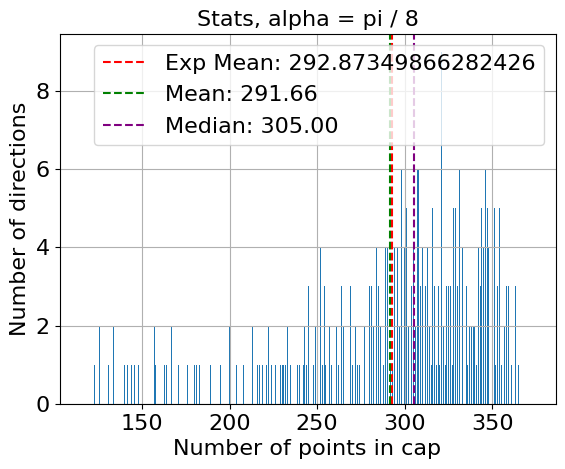

Saving CSV to: Run355145PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     23.460018     23.460018     23.460018     23.460018
1      vector sum y   -471.551180   -471.551180   -471.551180   -471.551180
2      vector sum z    -46.987843    -46.987843    -46.987843    -46.987843
3   vector sum norm    474.466801    474.466801    474.466801    474.466801
4           total N   7695.000000   7695.000000   7695.000000   7695.000000
5              mean   1930.833333   1127.339181    519.748538    291.657895
6            median   1979.000000   1171.000000    540.000000    305.000000
7          variance  32959.600877  18870.387880   6971.188229   3108.043783
8             stdev    181.547792    137.369530     83.493642     55.749832
9  normalized stdev      0.094026      0.121853      0.160642      0.191148
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

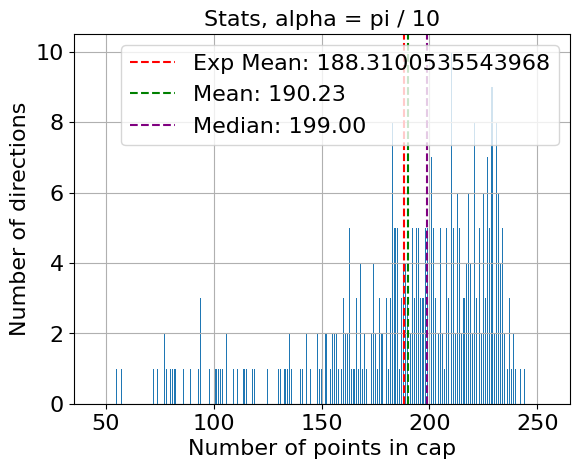

Saving CSV to: Run355145PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     23.460018     23.460018     23.460018     23.460018   
1      vector sum y   -471.551180   -471.551180   -471.551180   -471.551180   
2      vector sum z    -46.987843    -46.987843    -46.987843    -46.987843   
3   vector sum norm    474.466801    474.466801    474.466801    474.466801   
4           total N   7695.000000   7695.000000   7695.000000   7695.000000   
5              mean   1930.833333   1127.339181    519.748538    291.657895   
6            median   1979.000000   1171.000000    540.000000    305.000000   
7          variance  32959.600877  18870.387880   6971.188229   3108.043783   
8             stdev    181.547792    137.369530     83.493642     55.749832   
9  normalized stdev      0.094026      0.121853      0.160642      0.191148   

   alpha = pi/10  
0      23.460018  
1    -471.551180  
2     -46.987843  
3     474.

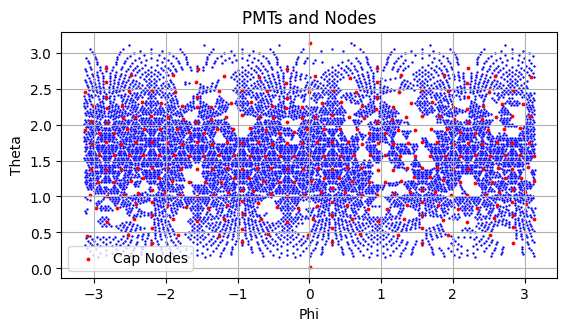

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


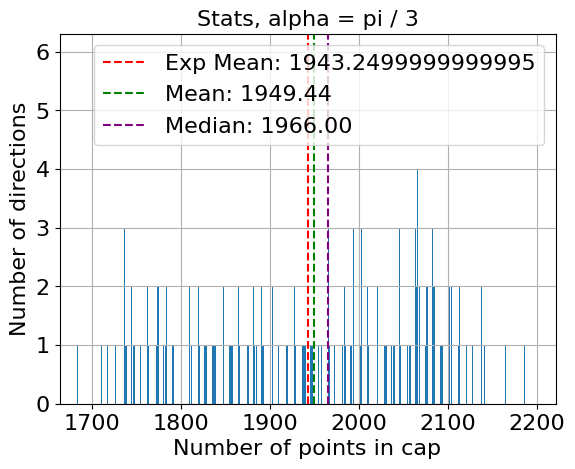

Saving CSV to: Run358230PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x     -4.775882
1      vector sum y   -327.310679
2      vector sum z    -15.605965
3   vector sum norm    327.717310
4           total N   7773.000000
5              mean   1949.441520
6            median   1966.000000
7          variance  16794.468802
8             stdev    129.593475
9  normalized stdev      0.066477
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


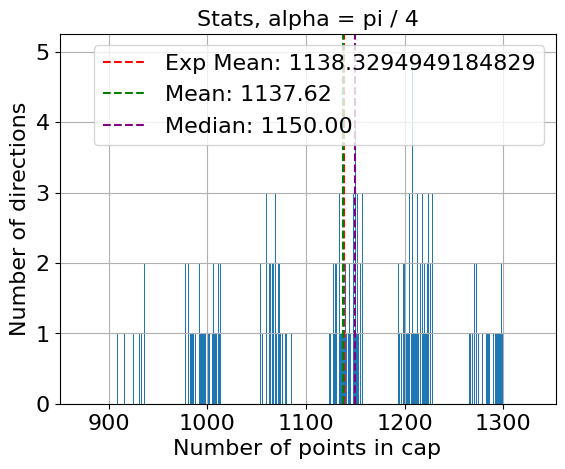

Saving CSV to: Run358230PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x     -4.775882     -4.775882
1      vector sum y   -327.310679   -327.310679
2      vector sum z    -15.605965    -15.605965
3   vector sum norm    327.717310    327.717310
4           total N   7773.000000   7773.000000
5              mean   1949.441520   1137.619883
6            median   1966.000000   1150.000000
7          variance  16794.468802  10503.405219
8             stdev    129.593475    102.486122
9  normalized stdev      0.066477      0.090088
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


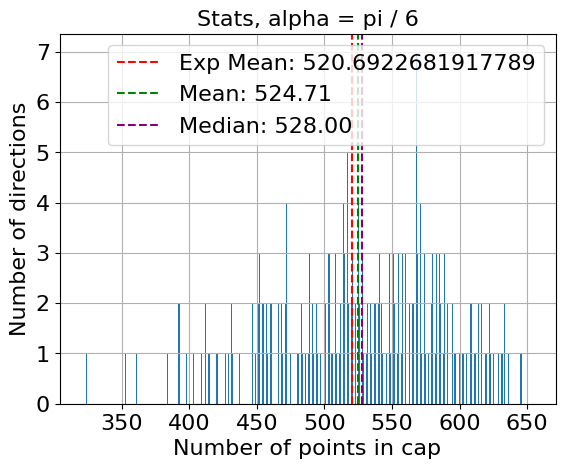

Saving CSV to: Run358230PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x     -4.775882     -4.775882     -4.775882
1      vector sum y   -327.310679   -327.310679   -327.310679
2      vector sum z    -15.605965    -15.605965    -15.605965
3   vector sum norm    327.717310    327.717310    327.717310
4           total N   7773.000000   7773.000000   7773.000000
5              mean   1949.441520   1137.619883    524.710526
6            median   1966.000000   1150.000000    528.000000
7          variance  16794.468802  10503.405219   4147.889889
8             stdev    129.593475    102.486122     64.404114
9  normalized stdev      0.066477      0.090088      0.122742
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


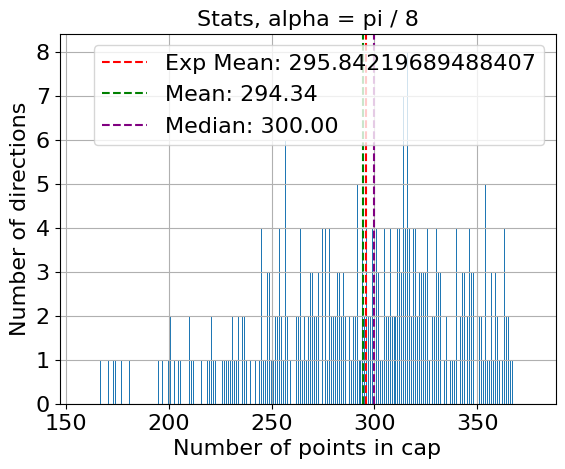

Saving CSV to: Run358230PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x     -4.775882     -4.775882     -4.775882     -4.775882
1      vector sum y   -327.310679   -327.310679   -327.310679   -327.310679
2      vector sum z    -15.605965    -15.605965    -15.605965    -15.605965
3   vector sum norm    327.717310    327.717310    327.717310    327.717310
4           total N   7773.000000   7773.000000   7773.000000   7773.000000
5              mean   1949.441520   1137.619883    524.710526    294.339181
6            median   1966.000000   1150.000000    528.000000    300.000000
7          variance  16794.468802  10503.405219   4147.889889   1926.569167
8             stdev    129.593475    102.486122     64.404114     43.892701
9  normalized stdev      0.066477      0.090088      0.122742      0.149123
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

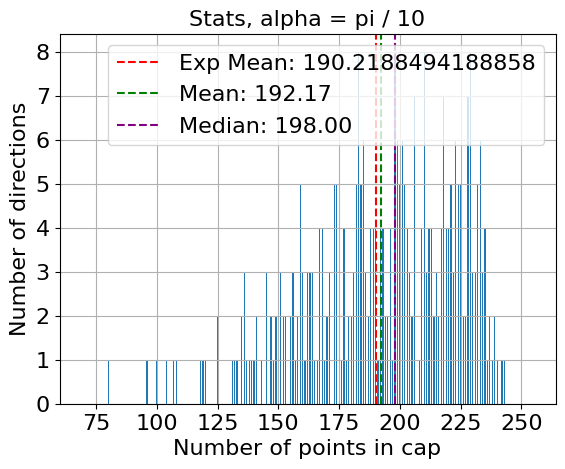

Saving CSV to: Run358230PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x     -4.775882     -4.775882     -4.775882     -4.775882   
1      vector sum y   -327.310679   -327.310679   -327.310679   -327.310679   
2      vector sum z    -15.605965    -15.605965    -15.605965    -15.605965   
3   vector sum norm    327.717310    327.717310    327.717310    327.717310   
4           total N   7773.000000   7773.000000   7773.000000   7773.000000   
5              mean   1949.441520   1137.619883    524.710526    294.339181   
6            median   1966.000000   1150.000000    528.000000    300.000000   
7          variance  16794.468802  10503.405219   4147.889889   1926.569167   
8             stdev    129.593475    102.486122     64.404114     43.892701   
9  normalized stdev      0.066477      0.090088      0.122742      0.149123   

   alpha = pi/10  
0      -4.775882  
1    -327.310679  
2     -15.605965  
3     327.

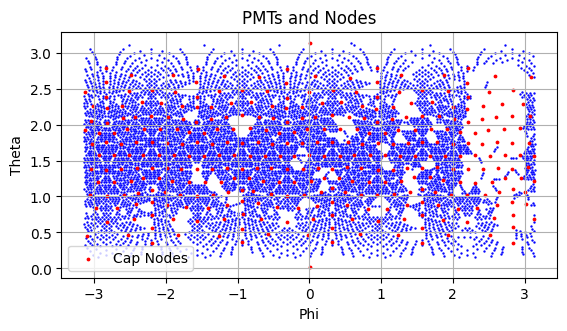

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


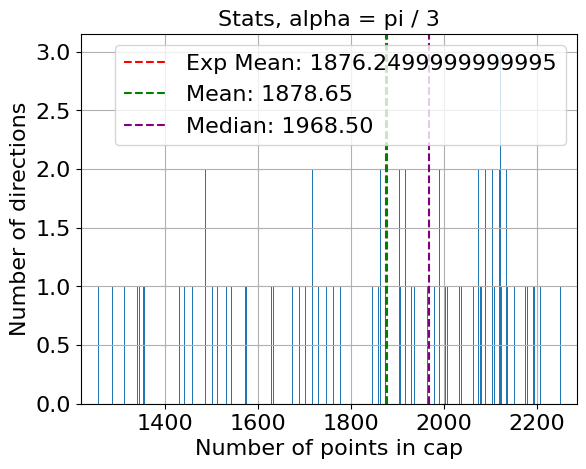

Saving CSV to: Run304616PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    517.848498
1      vector sum y   -560.695146
2      vector sum z    -60.634095
3   vector sum norm    765.651753
4           total N   7505.000000
5              mean   1878.649123
6            median   1968.500000
7          variance  77644.397353
8             stdev    278.647443
9  normalized stdev      0.148323
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


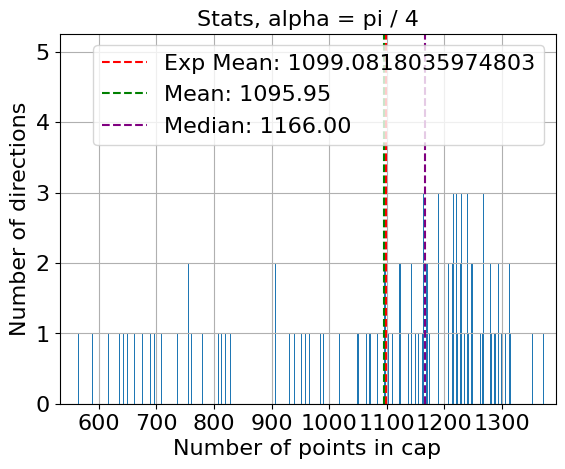

Saving CSV to: Run304616PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    517.848498    517.848498
1      vector sum y   -560.695146   -560.695146
2      vector sum z    -60.634095    -60.634095
3   vector sum norm    765.651753    765.651753
4           total N   7505.000000   7505.000000
5              mean   1878.649123   1095.947368
6            median   1968.500000   1166.000000
7          variance  77644.397353  41608.944598
8             stdev    278.647443    203.982707
9  normalized stdev      0.148323      0.186125
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


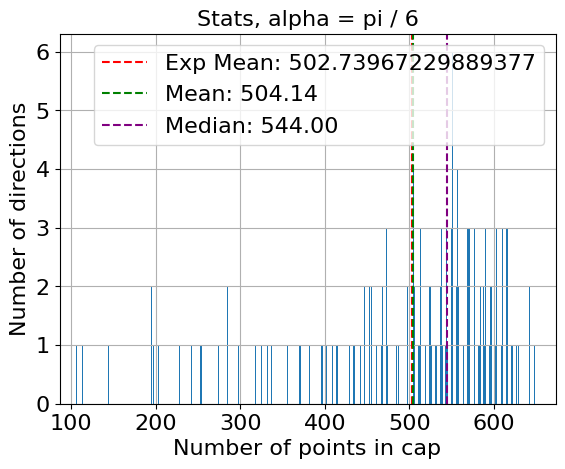

Saving CSV to: Run304616PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    517.848498    517.848498    517.848498
1      vector sum y   -560.695146   -560.695146   -560.695146
2      vector sum z    -60.634095    -60.634095    -60.634095
3   vector sum norm    765.651753    765.651753    765.651753
4           total N   7505.000000   7505.000000   7505.000000
5              mean   1878.649123   1095.947368    504.143275
6            median   1968.500000   1166.000000    544.000000
7          variance  77644.397353  41608.944598  14096.228010
8             stdev    278.647443    203.982707    118.727537
9  normalized stdev      0.148323      0.186125      0.235504
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


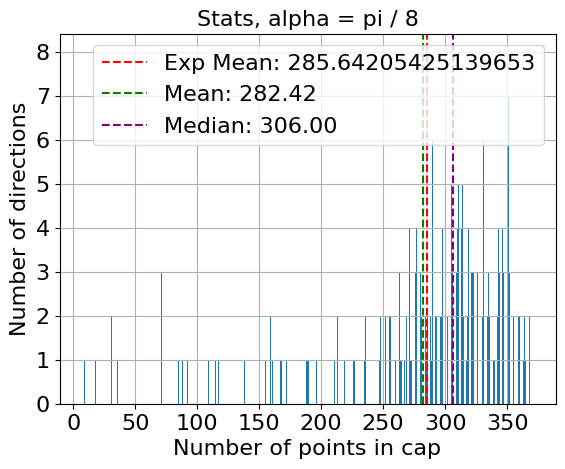

Saving CSV to: Run304616PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    517.848498    517.848498    517.848498    517.848498
1      vector sum y   -560.695146   -560.695146   -560.695146   -560.695146
2      vector sum z    -60.634095    -60.634095    -60.634095    -60.634095
3   vector sum norm    765.651753    765.651753    765.651753    765.651753
4           total N   7505.000000   7505.000000   7505.000000   7505.000000
5              mean   1878.649123   1095.947368    504.143275    282.418129
6            median   1968.500000   1166.000000    544.000000    306.000000
7          variance  77644.397353  41608.944598  14096.228010   5813.266689
8             stdev    278.647443    203.982707    118.727537     76.244781
9  normalized stdev      0.148323      0.186125      0.235504      0.269971
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

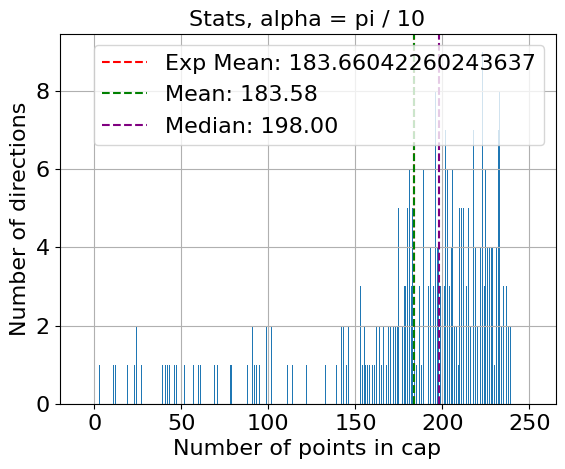

Saving CSV to: Run304616PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    517.848498    517.848498    517.848498    517.848498   
1      vector sum y   -560.695146   -560.695146   -560.695146   -560.695146   
2      vector sum z    -60.634095    -60.634095    -60.634095    -60.634095   
3   vector sum norm    765.651753    765.651753    765.651753    765.651753   
4           total N   7505.000000   7505.000000   7505.000000   7505.000000   
5              mean   1878.649123   1095.947368    504.143275    282.418129   
6            median   1968.500000   1166.000000    544.000000    306.000000   
7          variance  77644.397353  41608.944598  14096.228010   5813.266689   
8             stdev    278.647443    203.982707    118.727537     76.244781   
9  normalized stdev      0.148323      0.186125      0.235504      0.269971   

   alpha = pi/10  
0     517.848498  
1    -560.695146  
2     -60.634095  
3     765.

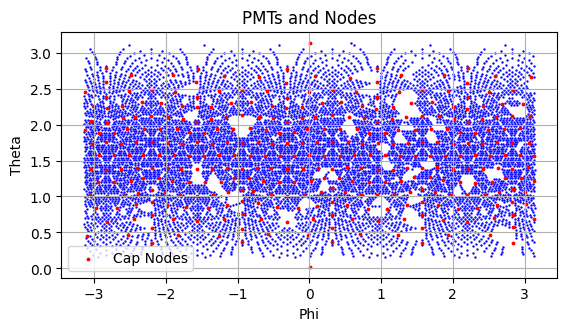

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


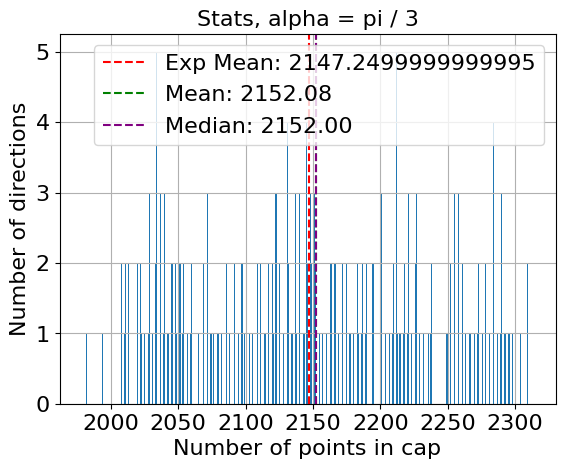

Saving CSV to: Run302948PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -97.366621
1      vector sum y   -156.384930
2      vector sum z   -119.454305
3   vector sum norm    219.558275
4           total N   8589.000000
5              mean   2152.081871
6            median   2152.000000
7          variance   6816.268151
8             stdev     82.560694
9  normalized stdev      0.038363
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


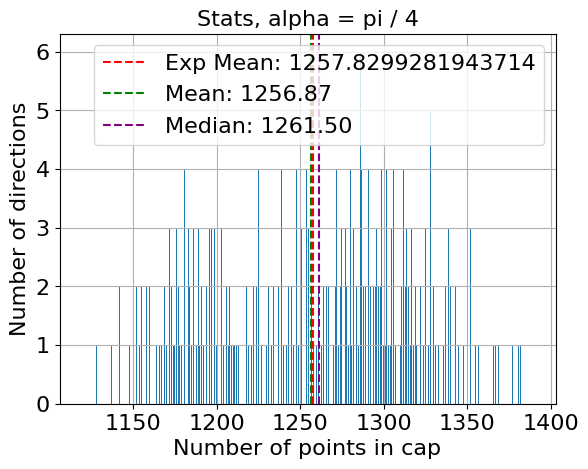

Saving CSV to: Run302948PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -97.366621    -97.366621
1      vector sum y   -156.384930   -156.384930
2      vector sum z   -119.454305   -119.454305
3   vector sum norm    219.558275    219.558275
4           total N   8589.000000   8589.000000
5              mean   2152.081871   1256.865497
6            median   2152.000000   1261.500000
7          variance   6816.268151   3786.192435
8             stdev     82.560694     61.532044
9  normalized stdev      0.038363      0.048957
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


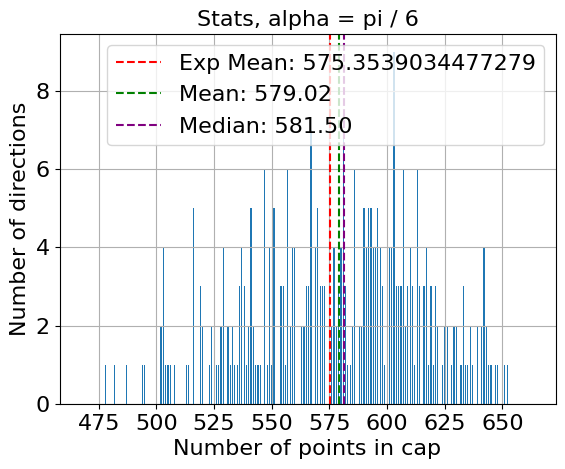

Saving CSV to: Run302948PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -97.366621    -97.366621    -97.366621
1      vector sum y   -156.384930   -156.384930   -156.384930
2      vector sum z   -119.454305   -119.454305   -119.454305
3   vector sum norm    219.558275    219.558275    219.558275
4           total N   8589.000000   8589.000000   8589.000000
5              mean   2152.081871   1256.865497    579.020468
6            median   2152.000000   1261.500000    581.500000
7          variance   6816.268151   3786.192435   1389.160400
8             stdev     82.560694     61.532044     37.271442
9  normalized stdev      0.038363      0.048957      0.064370
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


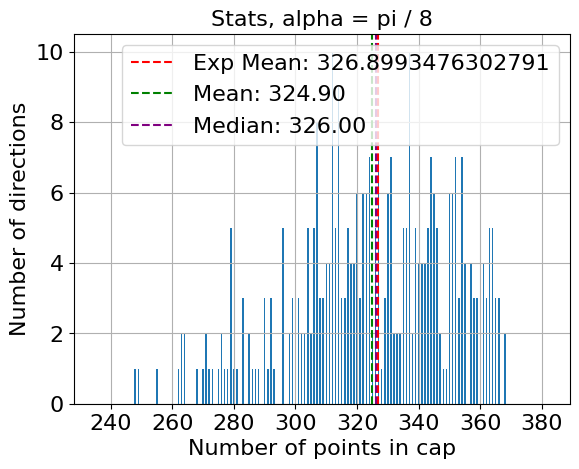

Saving CSV to: Run302948PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -97.366621    -97.366621    -97.366621    -97.366621
1      vector sum y   -156.384930   -156.384930   -156.384930   -156.384930
2      vector sum z   -119.454305   -119.454305   -119.454305   -119.454305
3   vector sum norm    219.558275    219.558275    219.558275    219.558275
4           total N   8589.000000   8589.000000   8589.000000   8589.000000
5              mean   2152.081871   1256.865497    579.020468    324.903509
6            median   2152.000000   1261.500000    581.500000    326.000000
7          variance   6816.268151   3786.192435   1389.160400    666.765543
8             stdev     82.560694     61.532044     37.271442     25.821804
9  normalized stdev      0.038363      0.048957      0.064370      0.079475
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

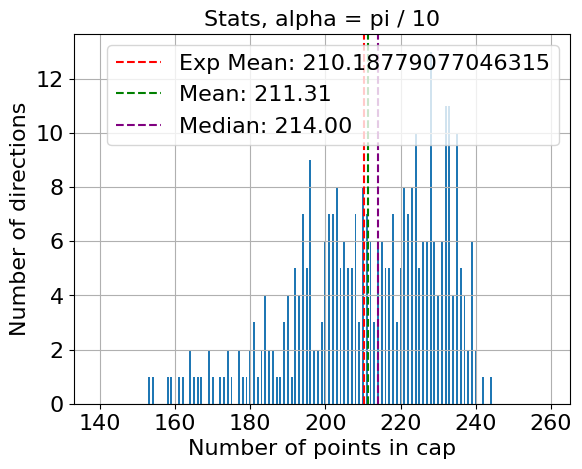

Saving CSV to: Run302948PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -97.366621    -97.366621    -97.366621    -97.366621   
1      vector sum y   -156.384930   -156.384930   -156.384930   -156.384930   
2      vector sum z   -119.454305   -119.454305   -119.454305   -119.454305   
3   vector sum norm    219.558275    219.558275    219.558275    219.558275   
4           total N   8589.000000   8589.000000   8589.000000   8589.000000   
5              mean   2152.081871   1256.865497    579.020468    324.903509   
6            median   2152.000000   1261.500000    581.500000    326.000000   
7          variance   6816.268151   3786.192435   1389.160400    666.765543   
8             stdev     82.560694     61.532044     37.271442     25.821804   
9  normalized stdev      0.038363      0.048957      0.064370      0.079475   

   alpha = pi/10  
0     -97.366621  
1    -156.384930  
2    -119.454305  
3     219.

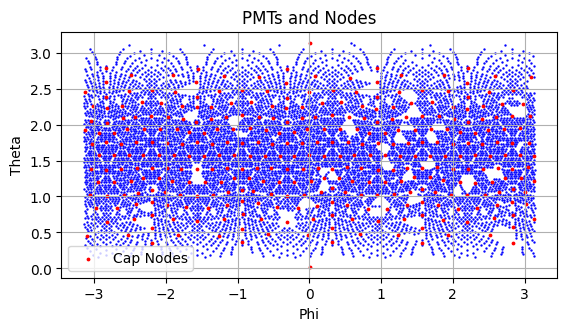

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


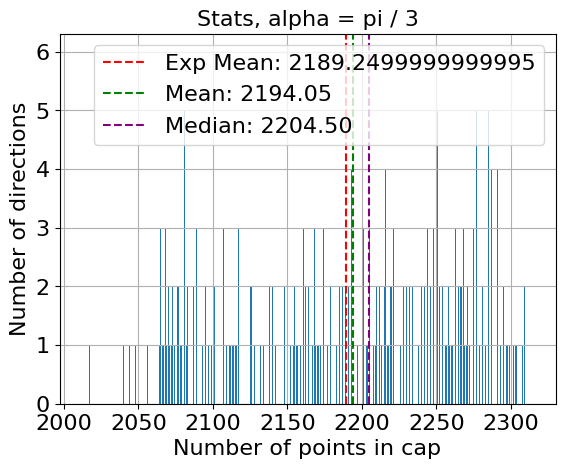

Saving CSV to: Run300515PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -47.621157
1      vector sum y   -182.141218
2      vector sum z   -107.365627
3   vector sum norm    216.726961
4           total N   8757.000000
5              mean   2194.049708
6            median   2204.500000
7          variance   5932.690512
8             stdev     77.023961
9  normalized stdev      0.035106
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


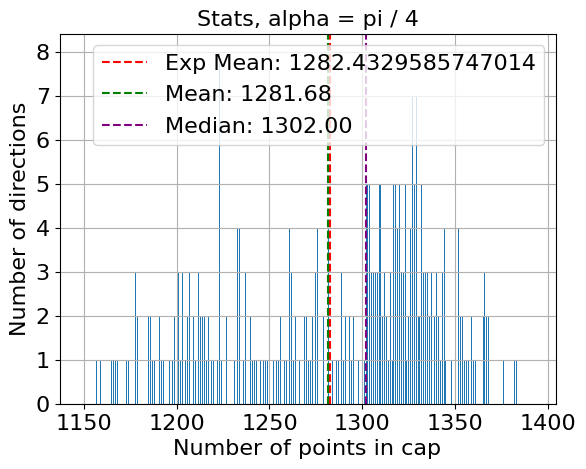

Saving CSV to: Run300515PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -47.621157    -47.621157
1      vector sum y   -182.141218   -182.141218
2      vector sum z   -107.365627   -107.365627
3   vector sum norm    216.726961    216.726961
4           total N   8757.000000   8757.000000
5              mean   2194.049708   1281.678363
6            median   2204.500000   1302.000000
7          variance   5932.690512   3034.826374
8             stdev     77.023961     55.089258
9  normalized stdev      0.035106      0.042982
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


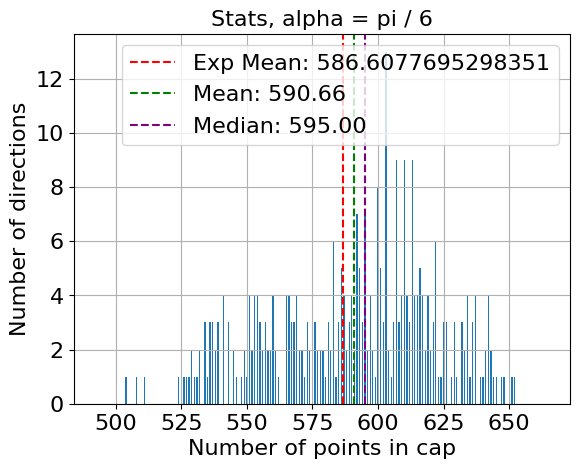

Saving CSV to: Run300515PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -47.621157    -47.621157    -47.621157
1      vector sum y   -182.141218   -182.141218   -182.141218
2      vector sum z   -107.365627   -107.365627   -107.365627
3   vector sum norm    216.726961    216.726961    216.726961
4           total N   8757.000000   8757.000000   8757.000000
5              mean   2194.049708   1281.678363    590.657895
6            median   2204.500000   1302.000000    595.000000
7          variance   5932.690512   3034.826374   1014.809865
8             stdev     77.023961     55.089258     31.856080
9  normalized stdev      0.035106      0.042982      0.053933
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


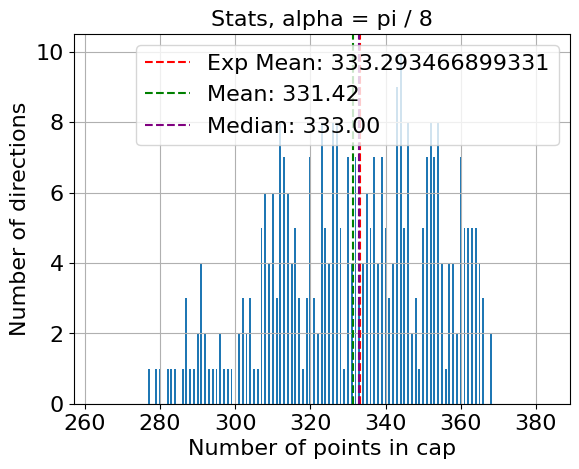

Saving CSV to: Run300515PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -47.621157    -47.621157    -47.621157    -47.621157
1      vector sum y   -182.141218   -182.141218   -182.141218   -182.141218
2      vector sum z   -107.365627   -107.365627   -107.365627   -107.365627
3   vector sum norm    216.726961    216.726961    216.726961    216.726961
4           total N   8757.000000   8757.000000   8757.000000   8757.000000
5              mean   2194.049708   1281.678363    590.657895    331.415205
6            median   2204.500000   1302.000000    595.000000    333.000000
7          variance   5932.690512   3034.826374   1014.809865    455.219418
8             stdev     77.023961     55.089258     31.856080     21.335872
9  normalized stdev      0.035106      0.042982      0.053933      0.064378
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

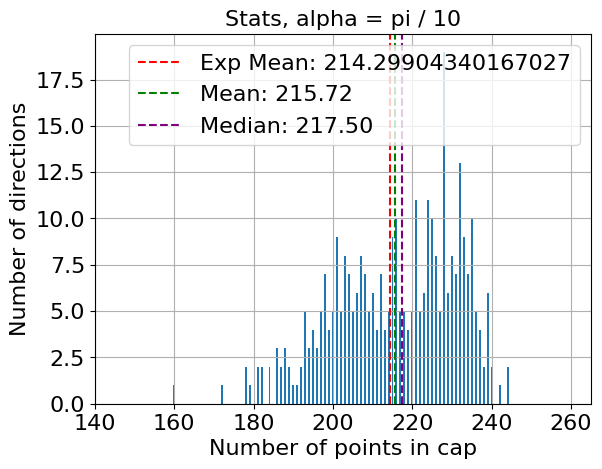

Saving CSV to: Run300515PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -47.621157    -47.621157    -47.621157    -47.621157   
1      vector sum y   -182.141218   -182.141218   -182.141218   -182.141218   
2      vector sum z   -107.365627   -107.365627   -107.365627   -107.365627   
3   vector sum norm    216.726961    216.726961    216.726961    216.726961   
4           total N   8757.000000   8757.000000   8757.000000   8757.000000   
5              mean   2194.049708   1281.678363    590.657895    331.415205   
6            median   2204.500000   1302.000000    595.000000    333.000000   
7          variance   5932.690512   3034.826374   1014.809865    455.219418   
8             stdev     77.023961     55.089258     31.856080     21.335872   
9  normalized stdev      0.035106      0.042982      0.053933      0.064378   

   alpha = pi/10  
0     -47.621157  
1    -182.141218  
2    -107.365627  
3     216.

FileNotFoundError: 300091_phi_theta.csv not found.

In [20]:
# now want to make plots for real runs

run_set = [309434, 302640, 309504,302159, 355216, 356009, 351884, 351847,
           358123, 303334, 311222, 355145, 358230, 304616, 302948,300515]

for run in run_set:
    print(f'Working on run {str(run)}')
    active_pos_cart, active_pos_sph = get_active_positions_runs(run_number = run)
    print(f'Coordinates extracted for run {str(run)}')
    print(f'Computing metrics for run {str(run)}')
    print(' ')
    print(' ')
    compute_config_stats(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, f"Run{run}PMTConfig")
    print("Finished computing stats for Run " + str(run))
    print("--------------------------------------")

print("Finished computing stats for all real-run PMT configs")



Working on run 300091
Active positions for run 300091: [[ 1.         0.0474785  2.40917  ]
 [ 1.         0.0813629  2.38263  ]
 [ 1.         0.113415   2.35551  ]
 ...
 [ 1.        -0.714795   1.43196  ]
 [ 1.        -0.769422   1.40361  ]
 [ 1.        -0.75031    1.43331  ]]
Position of first PMT in sphericals is : [1.        0.0474785 2.40917  ]
Position of first PMT in cartesians is : [ 0.66791945  0.03173566 -0.74355662]
Coordinates extracted for run 300091
Computing metrics for run 300091
 
 


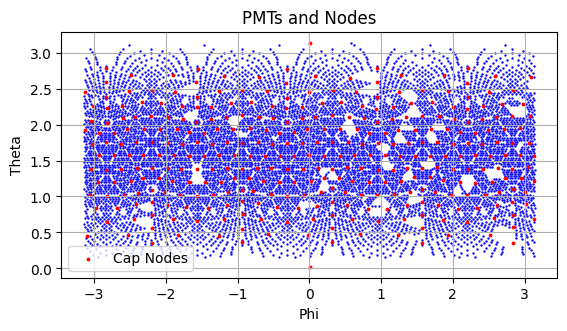

Now looping over alpha values
for alpha = pi / 3
Computing cap counts for alpha = pi / 3
Cap counts computed; now generating histogram and calculating stats ... 


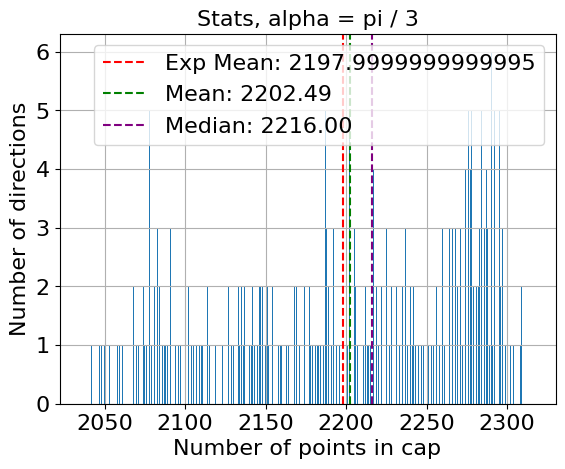

Saving CSV to: Run300091PMTConfig_stats.csv
             Metric  alpha = pi/3
0      vector sum x    -26.998663
1      vector sum y   -187.326682
2      vector sum z    -82.742922
3   vector sum norm    206.558962
4           total N   8792.000000
5              mean   2202.485380
6            median   2216.000000
7          variance   5635.050956
8             stdev     75.066976
9  normalized stdev      0.034083
CSV saved successfully.
for alpha = pi / 4
Computing cap counts for alpha = pi / 4
Cap counts computed; now generating histogram and calculating stats ... 


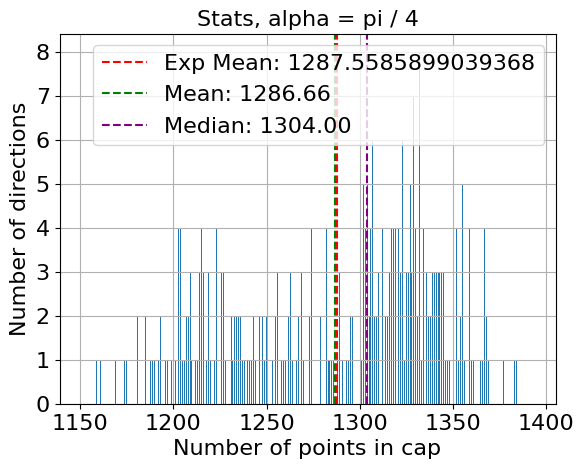

Saving CSV to: Run300091PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4
0      vector sum x    -26.998663    -26.998663
1      vector sum y   -187.326682   -187.326682
2      vector sum z    -82.742922    -82.742922
3   vector sum norm    206.558962    206.558962
4           total N   8792.000000   8792.000000
5              mean   2202.485380   1286.657895
6            median   2216.000000   1304.000000
7          variance   5635.050956   2950.184134
8             stdev     75.066976     54.315598
9  normalized stdev      0.034083      0.042214
CSV saved successfully.
for alpha = pi / 6
Computing cap counts for alpha = pi / 6
Cap counts computed; now generating histogram and calculating stats ... 


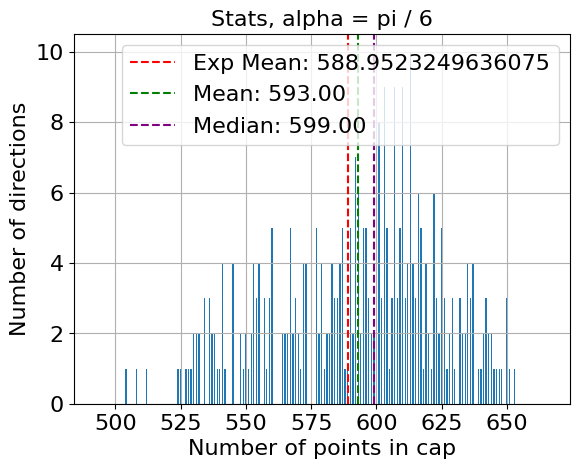

Saving CSV to: Run300091PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6
0      vector sum x    -26.998663    -26.998663    -26.998663
1      vector sum y   -187.326682   -187.326682   -187.326682
2      vector sum z    -82.742922    -82.742922    -82.742922
3   vector sum norm    206.558962    206.558962    206.558962
4           total N   8792.000000   8792.000000   8792.000000
5              mean   2202.485380   1286.657895    592.997076
6            median   2216.000000   1304.000000    599.000000
7          variance   5635.050956   2950.184134    990.529231
8             stdev     75.066976     54.315598     31.472674
9  normalized stdev      0.034083      0.042214      0.053074
CSV saved successfully.
for alpha = pi / 8
Computing cap counts for alpha = pi / 8
Cap counts computed; now generating histogram and calculating stats ... 


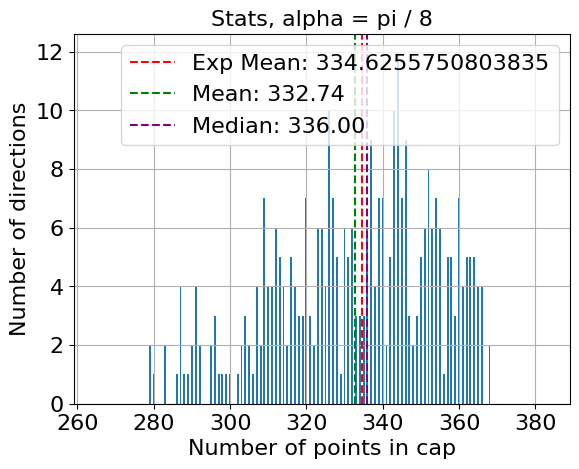

Saving CSV to: Run300091PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8
0      vector sum x    -26.998663    -26.998663    -26.998663    -26.998663
1      vector sum y   -187.326682   -187.326682   -187.326682   -187.326682
2      vector sum z    -82.742922    -82.742922    -82.742922    -82.742922
3   vector sum norm    206.558962    206.558962    206.558962    206.558962
4           total N   8792.000000   8792.000000   8792.000000   8792.000000
5              mean   2202.485380   1286.657895    592.997076    332.736842
6            median   2216.000000   1304.000000    599.000000    336.000000
7          variance   5635.050956   2950.184134    990.529231    445.872268
8             stdev     75.066976     54.315598     31.472674     21.115688
9  normalized stdev      0.034083      0.042214      0.053074      0.063461
CSV saved successfully.
for alpha = pi / 10
Computing cap counts for alpha = pi / 10
Cap counts computed; now generating

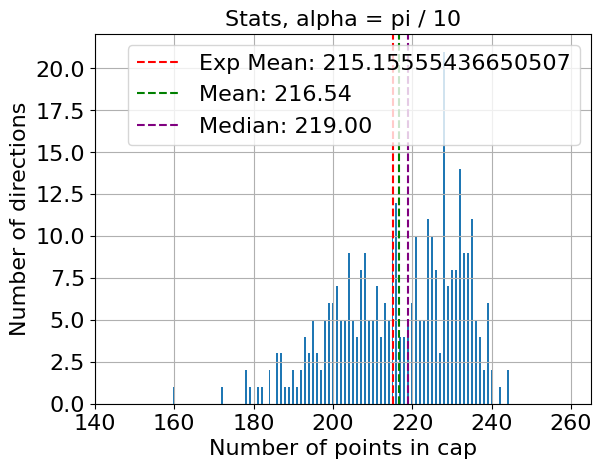

Saving CSV to: Run300091PMTConfig_stats.csv
             Metric  alpha = pi/3  alpha = pi/4  alpha = pi/6  alpha = pi/8  \
0      vector sum x    -26.998663    -26.998663    -26.998663    -26.998663   
1      vector sum y   -187.326682   -187.326682   -187.326682   -187.326682   
2      vector sum z    -82.742922    -82.742922    -82.742922    -82.742922   
3   vector sum norm    206.558962    206.558962    206.558962    206.558962   
4           total N   8792.000000   8792.000000   8792.000000   8792.000000   
5              mean   2202.485380   1286.657895    592.997076    332.736842   
6            median   2216.000000   1304.000000    599.000000    336.000000   
7          variance   5635.050956   2950.184134    990.529231    445.872268   
8             stdev     75.066976     54.315598     31.472674     21.115688   
9  normalized stdev      0.034083      0.042214      0.053074      0.063461   

   alpha = pi/10  
0     -26.998663  
1    -187.326682  
2     -82.742922  
3     206.

In [21]:
# I was missing the file for 300091
# generate file and run just for that

run_set = [300091]

for run in run_set:
    print(f'Working on run {str(run)}')
    active_pos_cart, active_pos_sph = get_active_positions_runs(run_number = run)
    print(f'Coordinates extracted for run {str(run)}')
    print(f'Computing metrics for run {str(run)}')
    print(' ')
    print(' ')
    compute_config_stats(active_pos_cart, active_pos_sph, nodes_pos_cart, nodes_pos_sph, f"Run{run}PMTConfig")
    print("Finished computing stats for Run " + str(run))
    print("--------------------------------------")

print("Finished computing stats for all real-run PMT configs")

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define run order (labels) and metrics
run_set = [309434, 302640, 309504, 302159, 355216, 356009, 351884, 351847,
           358123, 303334, 311222, 355145, 358230, 304616, 302948, 300515,
           300091]
run_set_reversed = run_set[::-1]  # Reverse order

metrics = ["vector sum norm", "total N", "mean", "median", "normalized stdev", "stdev"]
alpha_labels = ["alpha = pi/3", "alpha = pi/4", "alpha = pi/6", "alpha = pi/8", "alpha = pi/10"]

# Initialize data storage
data = {metric: {alpha: [] for alpha in alpha_labels} for metric in metrics}

# Load data from files
for run in run_set:
    filename = f"Run{run}PMTConfig_stats.csv"
    try:
        df = pd.read_csv(filename)
        for metric in metrics:
            for alpha in alpha_labels:
                value = df.loc[df.iloc[:, 0] == metric, alpha].values
                data[metric][alpha].append(value[0] if len(value) > 0 else None)
    except FileNotFoundError:
        print(f"File not found: {filename}, skipping...")
        for metric in metrics:
            for alpha in alpha_labels:
                data[metric][alpha].append(None)  # Keep data length consistent

# Reverse data for correct plotting order
for metric in metrics:
    for alpha in alpha_labels:
        data[metric][alpha].reverse()  # Reverse order for plotting

# Generate plots
for metric in metrics:
    plt.figure(figsize=(8, 6))

    # Use equally spaced positions for x-axis ticks
    x_positions = np.arange(len(run_set_reversed))

    for alpha in alpha_labels:
        plt.plot(x_positions, data[metric][alpha], marker='o', label=alpha)

    plt.xlabel("Run Number")
    plt.ylabel(metric)
    plt.title(f"{metric} vs Run Number")
    plt.xticks(x_positions, run_set_reversed, rotation=45)  # Custom labels, reversed order
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Save the figure
    plt.savefig(f"{metric.replace(' ', '_')}.pdf")
    plt.close()

print("Plots saved as PDFs.")


Plots saved as PDFs.


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define run order (labels) and metrics
run_set = [309434, 302640, 309504, 302159, 355216, 356009, 351884, 351847,
           358123, 303334, 311222, 355145, 358230, 304616, 302948, 300515,
           300091]
run_set_reversed = run_set[::-1]  # Reverse order

metrics = ["vector sum norm", "total N", "mean", "median", "normalized stdev", "stdev"]
alpha_labels = ["alpha = pi/3", "alpha = pi/4", "alpha = pi/6", "alpha = pi/8", "alpha = pi/10"]

# Initialize data storage
data = {metric: {alpha: [] for alpha in alpha_labels} for metric in metrics}

# Load data from files
for run in run_set:
    filename = f"Run{run}PMTConfig_stats.csv"
    try:
        df = pd.read_csv(filename)
        for metric in metrics:
            for alpha in alpha_labels:
                value = df.loc[df.iloc[:, 0] == metric, alpha].values
                data[metric][alpha].append(value[0] if len(value) > 0 else None)
    except FileNotFoundError:
        print(f"File not found: {filename}, skipping...")
        for metric in metrics:
            for alpha in alpha_labels:
                data[metric][alpha].append(None)  # Keep data length consistent

# Reverse data for correct plotting order
for metric in metrics:
    for alpha in alpha_labels:
        data[metric][alpha].reverse()  # Reverse order for plotting

# Generate plots
for metric in metrics:
    plt.figure(figsize=(10, 7))

    # Use equally spaced positions for x-axis ticks
    x_positions = np.arange(len(run_set_reversed))

    for alpha in alpha_labels:
        plt.plot(x_positions, data[metric][alpha], marker='o', label=alpha)

    plt.xlabel("Run Number", fontsize=16)
    plt.ylabel(metric, fontsize=16)
    plt.title(f"{metric} vs Run Number", fontsize=18)
    plt.xticks(x_positions, run_set_reversed, rotation=45, fontsize=14)  # Custom labels, reversed order
    plt.yticks(fontsize=14)

    if metric not in ["vector sum norm", "total N"]:  # Remove legend for these plots
        plt.legend(fontsize=14)

    plt.grid(True)
    plt.tight_layout()

    # Save the figure
    plt.savefig(f"{metric.replace(' ', '_')}_run.pdf")
    plt.close()

print("Plots saved as PDFs.")


Plots saved as PDFs.


Plots saved as PDFs.


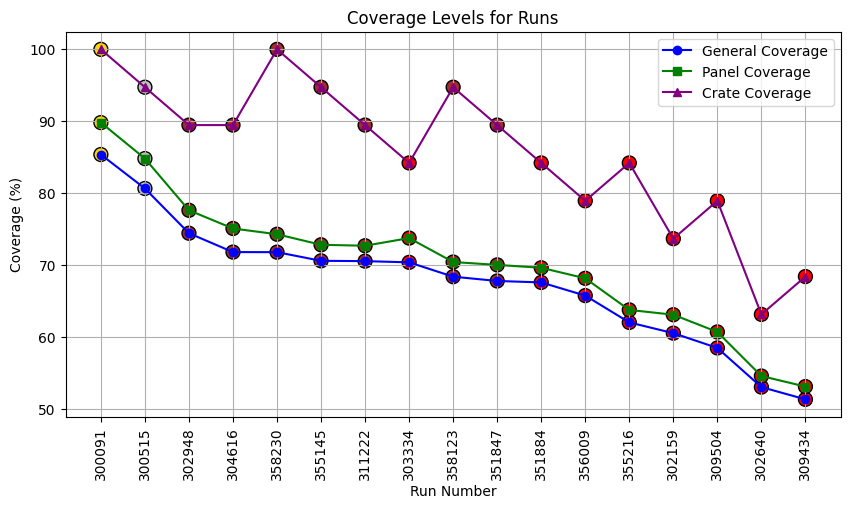

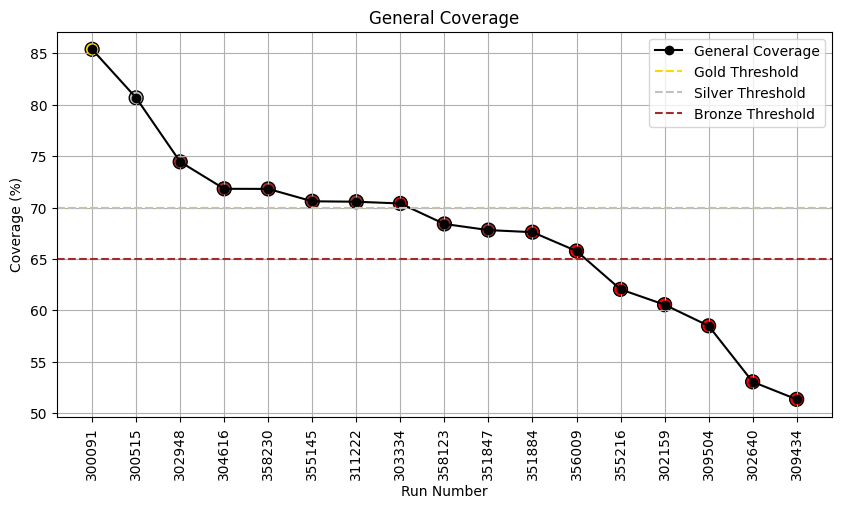

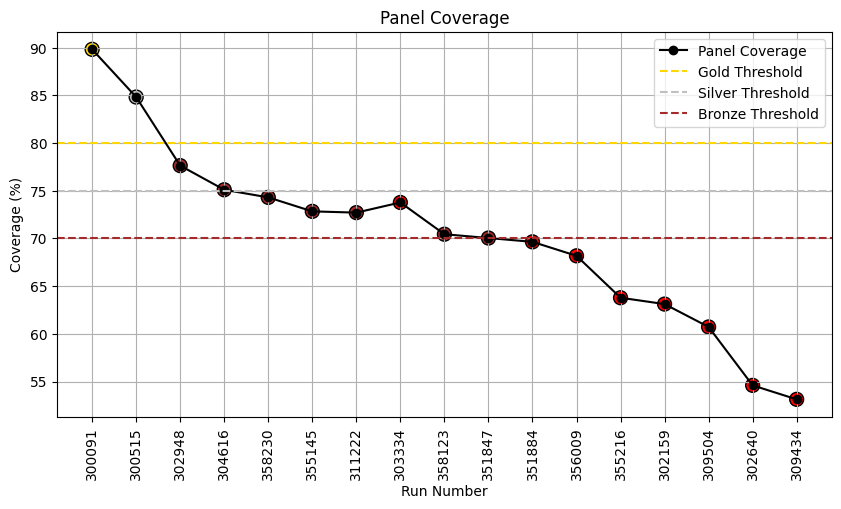

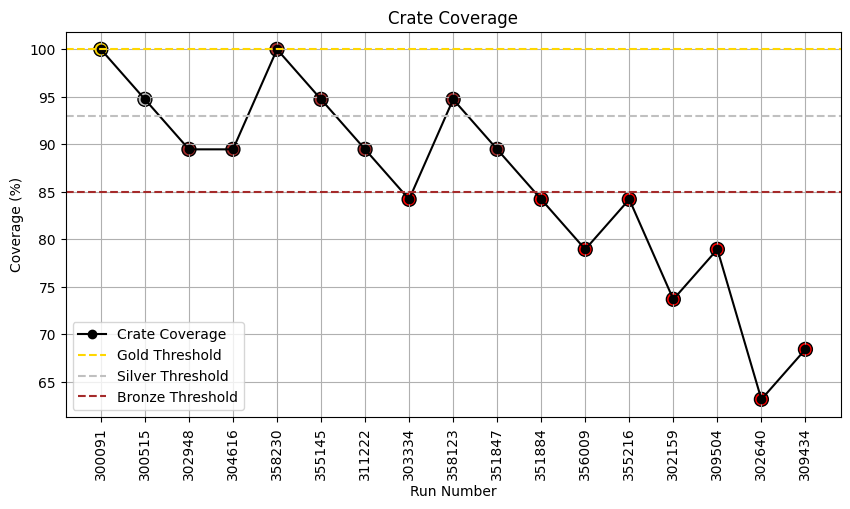

In [5]:
# plot real run metrics from dqhl output


import matplotlib.pyplot as plt
import numpy as np

# Run numbers in the given order
runs = [300091, 300515, 302948, 304616, 358230, 355145, 311222, 303334, 358123, 351847,
        351884, 356009, 355216, 302159, 309504, 302640, 309434]

general_coverage = [85.3781, 80.6603, 74.4409, 71.8211, 71.8104, 70.6070, 70.5644, 70.3940,
                     68.4026, 67.8062, 67.6038, 65.7721, 62.0447, 60.5537, 58.4984, 53.0564, 51.3525]

panel_coverage = [89.8202, 84.8202, 77.6298, 75.0999, 74.3009, 72.8362, 72.7031, 73.7683,
                   70.4394, 70.0399, 69.6405, 68.1758, 63.7816, 63.1158, 60.7190, 54.5939, 53.1291]

crate_coverage = [100, 94.7368, 89.4737, 89.4737, 100, 94.7368, 89.4736, 84.2105,
                   94.7368, 89.4737, 84.2105, 78.9474, 84.2105, 73.6841, 78.9474, 63.1579, 68.4211]

# Determine colors based on passing criteria
colors = []
for g, p, c in zip(general_coverage, panel_coverage, crate_coverage):
    if c >= 100 and p >= 80 and g >= 70:
        colors.append("gold")
    elif c >= 93 and p >= 75 and g >= 70:
        colors.append("silver")
    elif c >= 85 and p >= 70 and g >= 65:
        colors.append("brown")
    else:
        colors.append("red")

# Create an equally spaced range for x values (indices for runs)
x_vals = np.arange(len(runs))

# Combined scatter plot
plt.figure(figsize=(10, 5))

# Plot each coverage type as a line, using x_vals for equally spaced points
plt.plot(x_vals, general_coverage, marker='o', linestyle='-', label='General Coverage', color='blue')
plt.plot(x_vals, panel_coverage, marker='s', linestyle='-', label='Panel Coverage', color='green')
plt.plot(x_vals, crate_coverage, marker='^', linestyle='-', label='Crate Coverage', color='purple')

# Scatter points for each coverage, using x_vals for equally spaced points
plt.scatter(x_vals, general_coverage, color=colors, edgecolors='black', s=100)
plt.scatter(x_vals, panel_coverage, color=colors, edgecolors='black', s=100)
plt.scatter(x_vals, crate_coverage, color=colors, edgecolors='black', s=100)

# Set x-axis labels as run numbers
plt.xticks(x_vals, runs, rotation=90)

plt.xlabel("Run Number")
plt.ylabel("Coverage (%)")
plt.legend()
plt.title("Coverage Levels for Runs")
plt.grid()
plt.savefig("coverage_overview.pdf")

# Individual coverage plots with threshold lines
def plot_coverage(y_values, title, filename, threshold_lines, color):
    plt.figure(figsize=(10, 5))
    plt.plot(x_vals, y_values, marker='o', linestyle='-', color='black', label=title)
    plt.scatter(x_vals, y_values, color=colors, edgecolors='black', s=100)
    for level, y in threshold_lines.items():
        plt.axhline(y, color=color[level], linestyle='--', label=f'{level} Threshold')
    plt.xticks(x_vals, runs, rotation=90)
    plt.xlabel("Run Number")
    plt.ylabel("Coverage (%)")
    plt.legend()
    plt.title(title)
    plt.grid()
    plt.savefig(filename)

# Threshold values
general_thresholds = {"Gold": 70, "Silver": 70, "Bronze": 65}
panel_thresholds = {"Gold": 80, "Silver": 75, "Bronze": 70}
crate_thresholds = {"Gold": 100, "Silver": 93, "Bronze": 85}
threshold_colors = {"Gold": "gold", "Silver": "silver", "Bronze": "brown"}

# Generate individual plots
plot_coverage(general_coverage, "General Coverage", "general_coverage.pdf", general_thresholds, threshold_colors)
plot_coverage(panel_coverage, "Panel Coverage", "panel_coverage.pdf", panel_thresholds, threshold_colors)
plot_coverage(crate_coverage, "Crate Coverage", "crate_coverage.pdf", crate_thresholds, threshold_colors)

print("Plots saved as PDFs.")


Plots saved as PDFs.


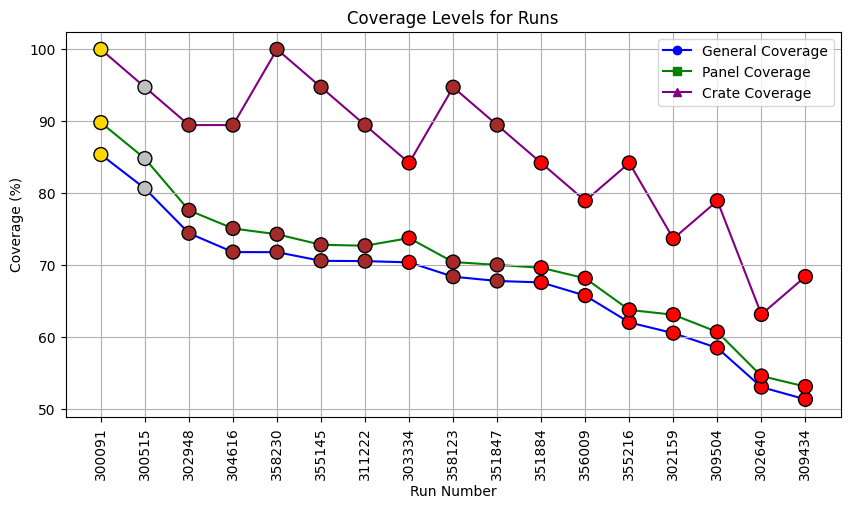

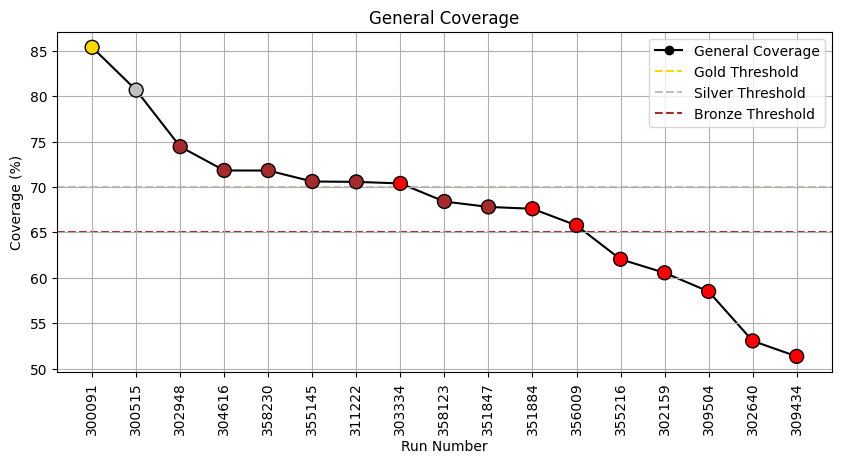

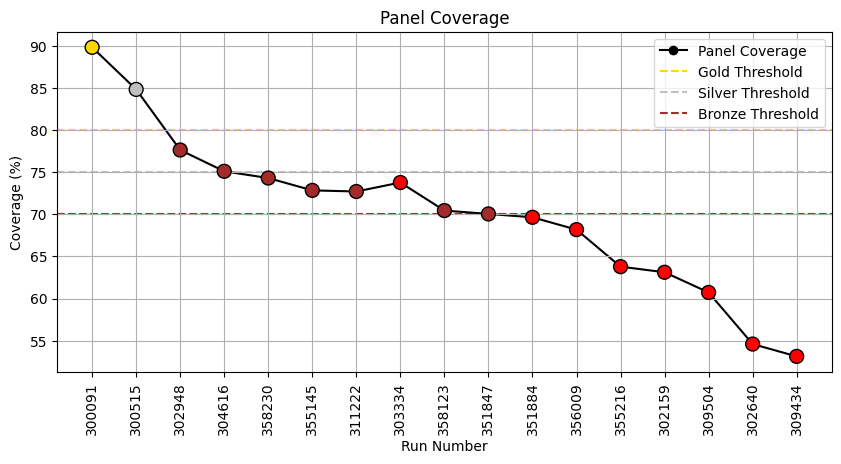

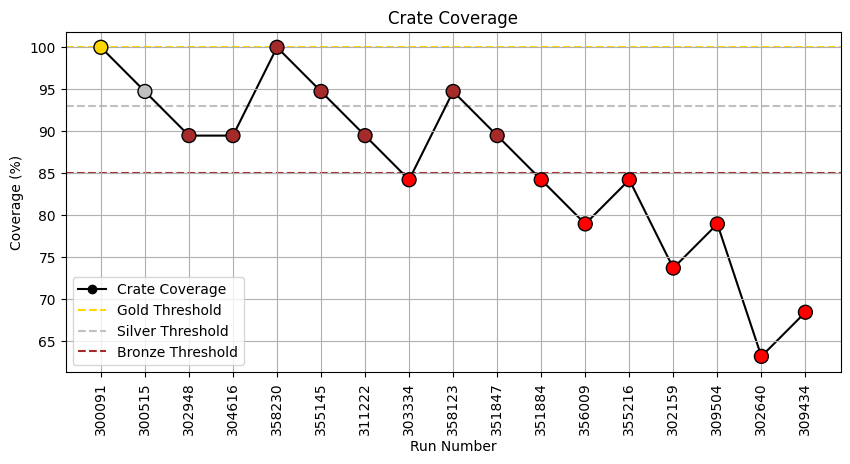

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Run numbers in the given order
runs = [300091, 300515, 302948, 304616, 358230, 355145, 311222, 303334, 358123, 351847,
        351884, 356009, 355216, 302159, 309504, 302640, 309434]

general_coverage = [85.3781, 80.6603, 74.4409, 71.8211, 71.8104, 70.6070, 70.5644, 70.3940,
                     68.4026, 67.8062, 67.6038, 65.7721, 62.0447, 60.5537, 58.4984, 53.0564, 51.3525]

panel_coverage = [89.8202, 84.8202, 77.6298, 75.0999, 74.3009, 72.8362, 72.7031, 73.7683,
                   70.4394, 70.0399, 69.6405, 68.1758, 63.7816, 63.1158, 60.7190, 54.5939, 53.1291]

crate_coverage = [100, 94.7368, 89.4737, 89.4737, 100, 94.7368, 89.4736, 84.2105,
                   94.7368, 89.4737, 84.2105, 78.9474, 84.2105, 73.6841, 78.9474, 63.1579, 68.4211]

# Determine colors based on passing criteria
colors = []
for g, p, c in zip(general_coverage, panel_coverage, crate_coverage):
    if c >= 100 and p >= 80 and g >= 70:
        colors.append("gold")
    elif c >= 93 and p >= 75 and g >= 70:
        colors.append("silver")
    elif c >= 85 and p >= 70 and g >= 65:
        colors.append("brown")
    else:
        colors.append("red")

# Create an equally spaced range for x values (indices for runs)
x_vals = np.arange(len(runs))

# Combined scatter plot
plt.figure(figsize=(10, 5))

# Plot each coverage type as a line, using x_vals for equally spaced points
plt.plot(x_vals, general_coverage, marker='o', linestyle='-', label='General Coverage', color='blue', zorder=1)
plt.plot(x_vals, panel_coverage, marker='s', linestyle='-', label='Panel Coverage', color='green', zorder=1)
plt.plot(x_vals, crate_coverage, marker='^', linestyle='-', label='Crate Coverage', color='purple', zorder=1)

# Scatter points for each coverage, using x_vals for equally spaced points
plt.scatter(x_vals, general_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, panel_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, crate_coverage, color=colors, edgecolors='black', s=100, zorder=2)

# Set x-axis labels as run numbers
plt.xticks(x_vals, runs, rotation=90)

plt.xlabel("Run Number")
plt.ylabel("Coverage (%)")
plt.legend()
plt.title("Coverage Levels for Runs")
plt.grid()
plt.savefig("coverage_overview.pdf")

# Individual coverage plots with threshold lines
def plot_coverage(y_values, title, filename, threshold_lines, color):
    plt.figure(figsize=(10, 5))
    plt.plot(x_vals, y_values, marker='o', linestyle='-', color='black', label=title, zorder=1)
    plt.scatter(x_vals, y_values, color=colors, edgecolors='black', s=100, zorder=2)
    for level, y in threshold_lines.items():
        plt.axhline(y, color=color[level], linestyle='--', label=f'{level} Threshold', zorder=0)
    plt.xticks(x_vals, runs, rotation=90)
    plt.xlabel("Run Number")
    plt.ylabel("Coverage (%)")
    plt.legend()
    plt.title(title)
    plt.grid()
    plt.subplots_adjust(bottom=0.2)  # Adjust space for labels
    plt.savefig(filename, bbox_inches="tight")  # Ensure full labels are saved


# Threshold values
general_thresholds = {"Gold": 70, "Silver": 70, "Bronze": 65}
panel_thresholds = {"Gold": 80, "Silver": 75, "Bronze": 70}
crate_thresholds = {"Gold": 100, "Silver": 93, "Bronze": 85}
threshold_colors = {"Gold": "gold", "Silver": "silver", "Bronze": "brown"}

# Generate individual plots
plot_coverage(general_coverage, "General Coverage", "general_coverage.pdf", general_thresholds, threshold_colors)
plot_coverage(panel_coverage, "Panel Coverage", "panel_coverage.pdf", panel_thresholds, threshold_colors)
plot_coverage(crate_coverage, "Crate Coverage", "crate_coverage.pdf", crate_thresholds, threshold_colors)

print("Plots saved as PDFs.")


/home/claramariadima/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


Plots saved as PDFs.


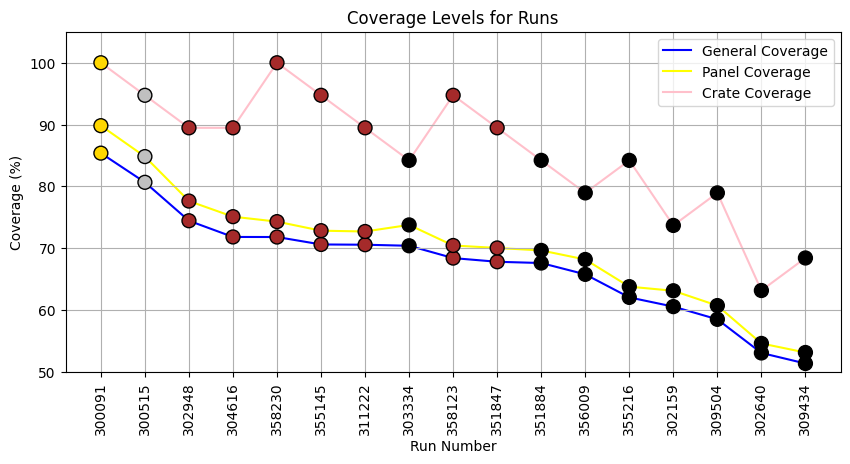

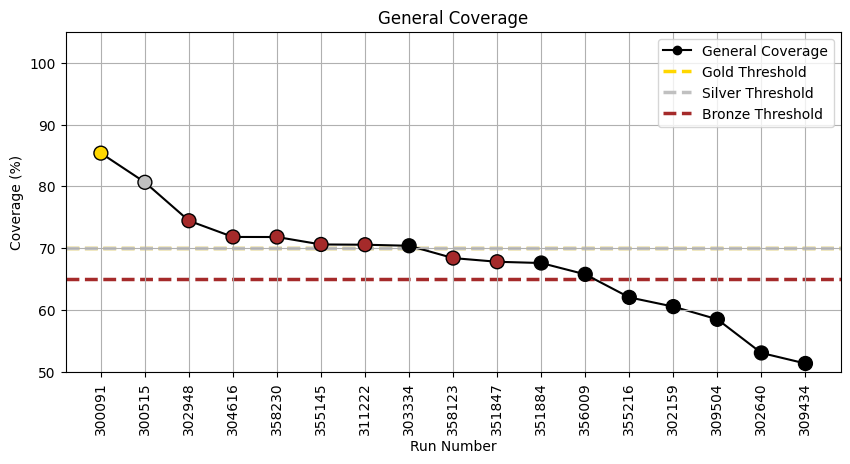

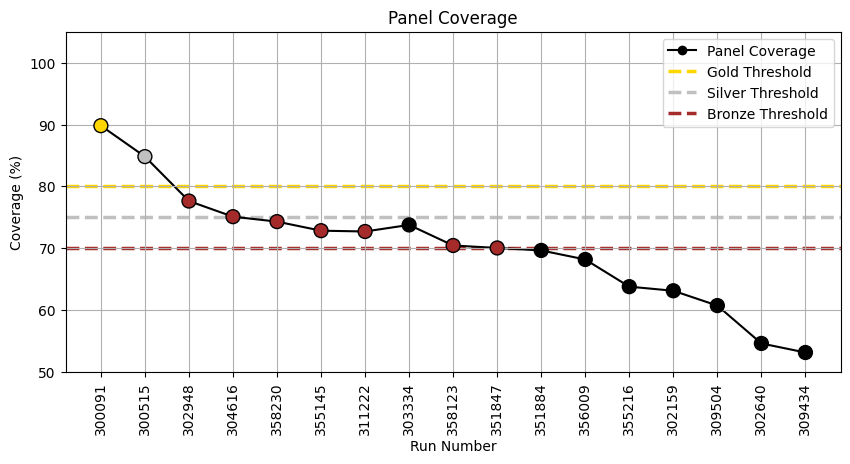

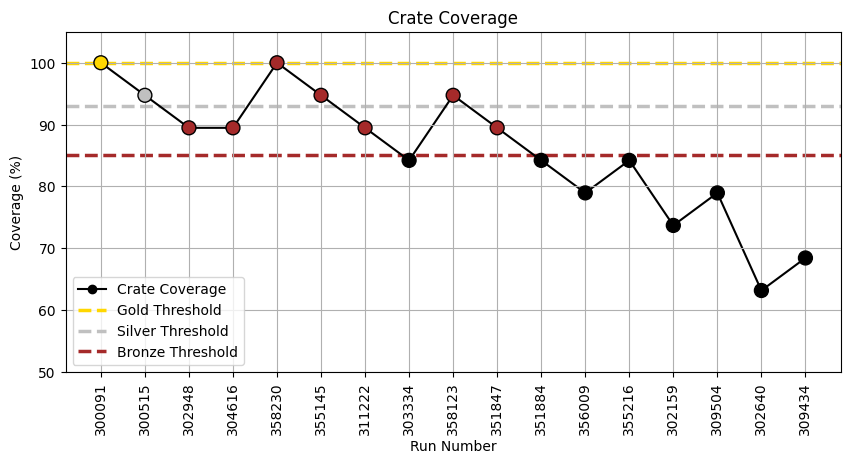

In [1]:
import matplotlib.pyplot as plt
import numpy as np

# Run numbers in the given order
runs = [300091, 300515, 302948, 304616, 358230, 355145, 311222, 303334, 358123, 351847,
        351884, 356009, 355216, 302159, 309504, 302640, 309434]

general_coverage = [85.3781, 80.6603, 74.4409, 71.8211, 71.8104, 70.6070, 70.5644, 70.3940,
                     68.4026, 67.8062, 67.6038, 65.7721, 62.0447, 60.5537, 58.4984, 53.0564, 51.3525]

panel_coverage = [89.8202, 84.8202, 77.6298, 75.0999, 74.3009, 72.8362, 72.7031, 73.7683,
                   70.4394, 70.0399, 69.6405, 68.1758, 63.7816, 63.1158, 60.7190, 54.5939, 53.1291]

crate_coverage = [100, 94.7368, 89.4737, 89.4737, 100, 94.7368, 89.4736, 84.2105,
                   94.7368, 89.4737, 84.2105, 78.9474, 84.2105, 73.6841, 78.9474, 63.1579, 68.4211]

# Determine colors based on passing criteria
colors = []
for g, p, c in zip(general_coverage, panel_coverage, crate_coverage):
    if c >= 100 and p >= 80 and g >= 70:
        colors.append("gold")
    elif c >= 93 and p >= 75 and g >= 70:
        colors.append("silver")
    elif c >= 85 and p >= 70 and g >= 65:
        colors.append("brown")
    else:
        colors.append("black")

# Create an equally spaced range for x values (indices for runs)
x_vals = np.arange(len(runs))

# Combined scatter plot
plt.figure(figsize=(10, 5))

# Plot each coverage type as a line, using x_vals for equally spaced points
plt.plot(x_vals, general_coverage, linestyle='-', label='General Coverage', color='blue', zorder=1)
plt.plot(x_vals, panel_coverage, linestyle='-', label='Panel Coverage', color='lightgreen', zorder=1)
plt.plot(x_vals, crate_coverage, linestyle='-', label='Crate Coverage', color='red', zorder=1)

# Scatter points for each coverage, using x_vals for equally spaced points
plt.scatter(x_vals, general_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, panel_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, crate_coverage, color=colors, edgecolors='black', s=100, zorder=2)

# Ensure y-axis goes from 0 to 100
plt.ylim(50, 105)

# Set x-axis labels as run numbers
plt.xticks(x_vals, runs, rotation=90)

plt.xlabel("Run Number")
plt.ylabel("Coverage (%)")
plt.legend()
plt.title("Coverage Levels for Runs")
plt.grid()
plt.subplots_adjust(bottom=0.2)  # Adjust space for labels
plt.savefig("coverage_overview.pdf", bbox_inches="tight")  # Ensure full labels are saved

# Individual coverage plots with threshold lines
def plot_coverage(y_values, title, filename, threshold_lines, color):
    plt.figure(figsize=(10, 5))
    plt.plot(x_vals, y_values, marker='o', linestyle='-', color='black', label=title, zorder=1)
    plt.scatter(x_vals, y_values, color=colors, edgecolors='black', s=100, zorder=2)

    # Make threshold lines more pronounced
    for level, y in threshold_lines.items():
        plt.axhline(y, color=color[level], linestyle='--', linewidth=2.5, label=f'{level} Threshold', zorder=0)

    plt.ylim(50, 105)  # Ensure y-axis range is always 0-100
    plt.xticks(x_vals, runs, rotation=90)
    plt.xlabel("Run Number")
    plt.ylabel("Coverage (%)")
    plt.legend()
    plt.title(title)
    plt.grid()
    plt.subplots_adjust(bottom=0.2)  # Adjust space for labels
    plt.savefig(filename, bbox_inches="tight")  # Ensure full labels are saved


# Threshold values
general_thresholds = {"Gold": 70, "Silver": 70, "Bronze": 65}
panel_thresholds = {"Gold": 80, "Silver": 75, "Bronze": 70}
crate_thresholds = {"Gold": 100, "Silver": 93, "Bronze": 85}
threshold_colors = {"Gold": "gold", "Silver": "silver", "Bronze": "brown"}

# Generate individual plots
plot_coverage(general_coverage, "General Coverage", "general_coverage.pdf", general_thresholds, threshold_colors)
plot_coverage(panel_coverage, "Panel Coverage", "panel_coverage.pdf", panel_thresholds, threshold_colors)
plot_coverage(crate_coverage, "Crate Coverage", "crate_coverage.pdf", crate_thresholds, threshold_colors)

print("Plots saved as PDFs.")


Plots saved as PDFs.


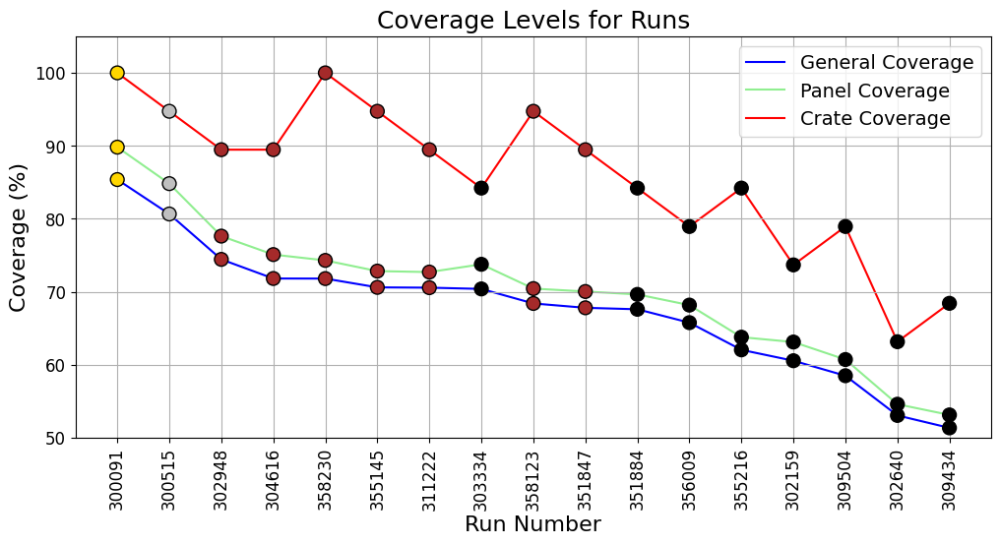

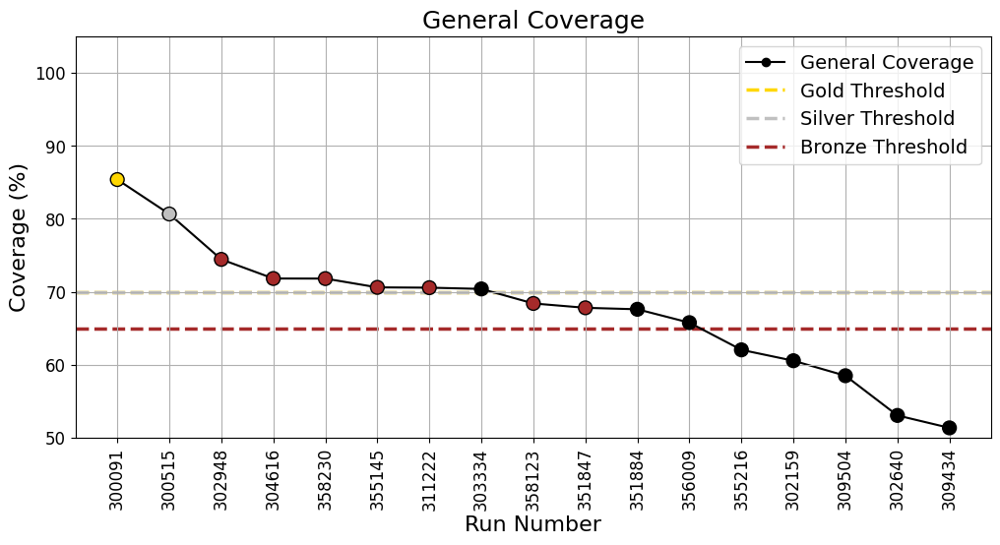

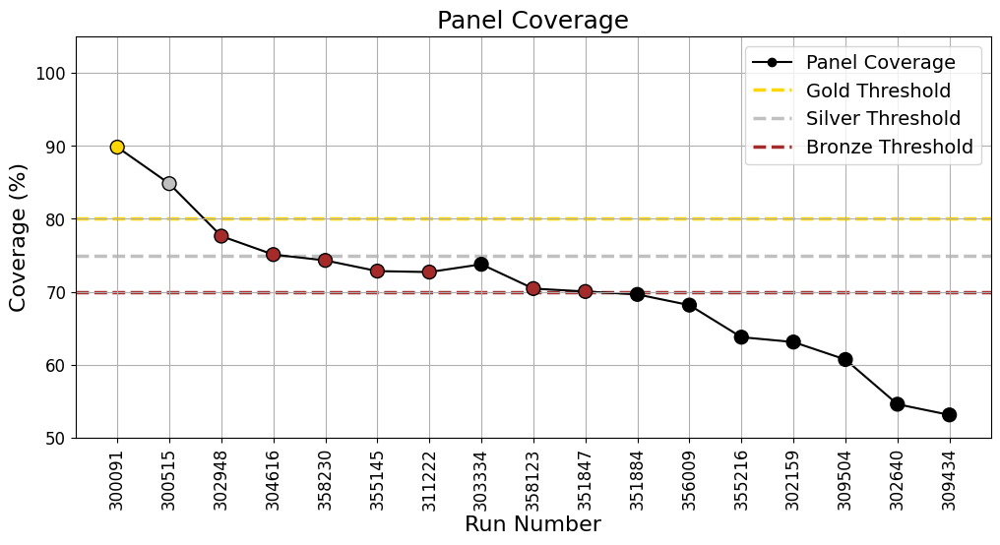

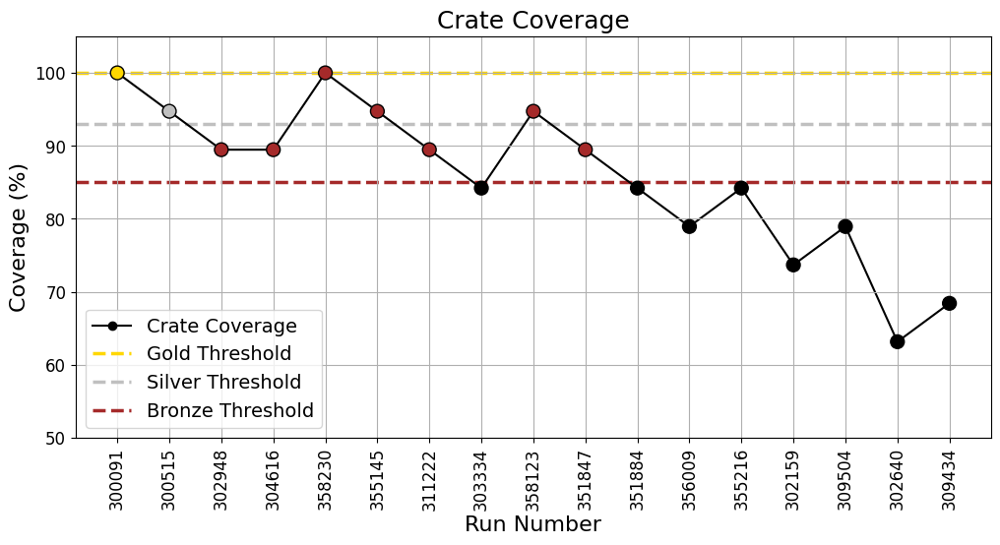

In [3]:
import matplotlib.pyplot as plt
import numpy as np

# Run numbers in the given order
runs = [300091, 300515, 302948, 304616, 358230, 355145, 311222, 303334, 358123, 351847,
        351884, 356009, 355216, 302159, 309504, 302640, 309434]

general_coverage = [85.3781, 80.6603, 74.4409, 71.8211, 71.8104, 70.6070, 70.5644, 70.3940,
                     68.4026, 67.8062, 67.6038, 65.7721, 62.0447, 60.5537, 58.4984, 53.0564, 51.3525]

panel_coverage = [89.8202, 84.8202, 77.6298, 75.0999, 74.3009, 72.8362, 72.7031, 73.7683,
                   70.4394, 70.0399, 69.6405, 68.1758, 63.7816, 63.1158, 60.7190, 54.5939, 53.1291]

crate_coverage = [100, 94.7368, 89.4737, 89.4737, 100, 94.7368, 89.4736, 84.2105,
                   94.7368, 89.4737, 84.2105, 78.9474, 84.2105, 73.6841, 78.9474, 63.1579, 68.4211]

# Determine colors based on passing criteria
colors = []
for g, p, c in zip(general_coverage, panel_coverage, crate_coverage):
    if c >= 100 and p >= 80 and g >= 70:
        colors.append("gold")
    elif c >= 93 and p >= 75 and g >= 70:
        colors.append("silver")
    elif c >= 85 and p >= 70 and g >= 65:
        colors.append("brown")
    else:
        colors.append("black")

# Create an equally spaced range for x values (indices for runs)
x_vals = np.arange(len(runs))

# Set font size for all elements
plt.rcParams.update({'font.size': 14})  # Change font size globally

# Combined scatter plot
plt.figure(figsize=(12, 6))

# Plot each coverage type as a line, using x_vals for equally spaced points
plt.plot(x_vals, general_coverage, linestyle='-', label='General Coverage', color='blue', zorder=1)
plt.plot(x_vals, panel_coverage, linestyle='-', label='Panel Coverage', color='lightgreen', zorder=1)
plt.plot(x_vals, crate_coverage, linestyle='-', label='Crate Coverage', color='red', zorder=1)

# Scatter points for each coverage, using x_vals for equally spaced points
plt.scatter(x_vals, general_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, panel_coverage, color=colors, edgecolors='black', s=100, zorder=2)
plt.scatter(x_vals, crate_coverage, color=colors, edgecolors='black', s=100, zorder=2)

# Ensure y-axis goes from 50 to 105
plt.ylim(50, 105)

# Set x-axis labels as run numbers
plt.xticks(x_vals, runs, rotation=90, fontsize=12)
plt.yticks(fontsize=12)

plt.xlabel("Run Number", fontsize=16)
plt.ylabel("Coverage (%)", fontsize=16)
plt.title("Coverage Levels for Runs", fontsize=18)
plt.legend(fontsize=14)
plt.grid()
plt.subplots_adjust(bottom=0.2)  # Adjust space for labels
plt.savefig("coverage_overview.pdf", bbox_inches="tight")  # Ensure full labels are saved

# Individual coverage plots with threshold lines
def plot_coverage(y_values, title, filename, threshold_lines, color):
    plt.figure(figsize=(12, 6))
    plt.plot(x_vals, y_values, marker='o', linestyle='-', color='black', label=title, zorder=1)
    plt.scatter(x_vals, y_values, color=colors, edgecolors='black', s=100, zorder=2)

    # Make threshold lines more pronounced
    for level, y in threshold_lines.items():
        plt.axhline(y, color=color[level], linestyle='--', linewidth=2.5, label=f'{level} Threshold', zorder=0)

    plt.ylim(50, 105)
    plt.xticks(x_vals, runs, rotation=90, fontsize=12)
    plt.yticks(fontsize=12)

    plt.xlabel("Run Number", fontsize=16)
    plt.ylabel("Coverage (%)", fontsize=16)
    plt.title(title, fontsize=18)
    plt.legend(fontsize=14)
    plt.grid()
    plt.subplots_adjust(bottom=0.2)
    plt.savefig(filename, bbox_inches="tight")

# Threshold values
general_thresholds = {"Gold": 70, "Silver": 70, "Bronze": 65}
panel_thresholds = {"Gold": 80, "Silver": 75, "Bronze": 70}
crate_thresholds = {"Gold": 100, "Silver": 93, "Bronze": 85}
threshold_colors = {"Gold": "gold", "Silver": "silver", "Bronze": "brown"}

# Generate individual plots
plot_coverage(general_coverage, "General Coverage", "general_coverage.pdf", general_thresholds, threshold_colors)
plot_coverage(panel_coverage, "Panel Coverage", "panel_coverage.pdf", panel_thresholds, threshold_colors)
plot_coverage(crate_coverage, "Crate Coverage", "crate_coverage.pdf", crate_thresholds, threshold_colors)

print("Plots saved as PDFs.")


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Define metrics to plot
metrics = ["vector sum norm", "total N", "mean", "median", "normalized stdev", "stdev"]

# Define alpha values from the headers
alpha_labels = ["alpha = pi/3", "alpha = pi/4", "alpha = pi/6", "alpha = pi/8", "alpha = pi/10"]

# Function to process PMT sets and return data
def process_pmt_sets(pmt_set_numbers):
    data = {metric: {alpha: [] for alpha in alpha_labels} for metric in metrics}
    for alpha in alpha_labels:
        for metric in metrics:
            data[metric][alpha] = [None] * len(pmt_set_numbers)

    for idx, i in enumerate(pmt_set_numbers):
        filename = f"PMTSet{i}_stats.csv"
        try:
            df = pd.read_csv(filename)
            for metric in metrics:
                for alpha in alpha_labels:
                    value = df.loc[df.iloc[:, 0] == metric, alpha].values
                    data[metric][alpha][idx] = value[0] if len(value) > 0 else None
        except FileNotFoundError:
            print(f"File not found: {filename}, skipping...")

    return pmt_set_numbers, data

# PMT sets for the first set of plots
pmt_set_numbers_1 = list(range(1, 16))
pmt_sets_1, data_1 = process_pmt_sets(pmt_set_numbers_1)

# PMT sets for the second set of plots
pmt_set_numbers_2 = [1, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
pmt_sets_2, data_2 = process_pmt_sets(pmt_set_numbers_2)

# Save each metric in a separate PDF file with combined plots
for metric in metrics:
    with PdfPages(f"{metric.replace(' ', '_')}_combined.pdf") as pdf:
        fig, axes = plt.subplots(2, 1, figsize=(10, 14))

        # First plot
        for alpha in alpha_labels:
            axes[0].plot(pmt_sets_1, data_1[metric][alpha], marker='o', label=alpha)
        axes[0].set_xlabel("PMT Set", fontsize=16)
        axes[0].set_ylabel(metric, fontsize=16)
        axes[0].set_title(f"{metric} vs PMT Set (First Set)", fontsize=18)
        axes[0].tick_params(axis='both', labelsize=14)
        axes[0].grid(True)
        if metric not in ["vector sum norm", "total N"]:  # Remove legend for these
            axes[0].legend(fontsize=14)

        # Second plot with evenly spaced x-axis
        x_positions = range(len(pmt_sets_2))  # Ensure equal spacing
        for alpha in alpha_labels:
            axes[1].plot(x_positions, data_2[metric][alpha], marker='o', label=alpha)
        axes[1].set_xticks(x_positions)
        axes[1].set_xticklabels(pmt_sets_2, fontsize=14)  # Label with actual PMT set numbers
        axes[1].set_xlabel("PMT Set", fontsize=16)
        axes[1].set_ylabel(metric, fontsize=16)
        axes[1].set_title(f"{metric} vs PMT Set (Second Set, Evenly Spaced)", fontsize=18)
        axes[1].tick_params(axis='both', labelsize=14)
        axes[1].grid(True)
        if metric not in ["vector sum norm", "total N"]:
            axes[1].legend(fontsize=14)

        pdf.savefig(fig)
        plt.close(fig)

# Save each metric in a separate PDF file with individual second-set plots
for metric in metrics:
    with PdfPages(f"{metric.replace(' ', '_')}_second_set.pdf") as pdf:
        fig, ax = plt.subplots(figsize=(10, 7))

        x_positions = range(len(pmt_sets_2))  # Ensure equal spacing
        for alpha in alpha_labels:
            ax.plot(x_positions, data_2[metric][alpha], marker='o', label=alpha)
        ax.set_xticks(x_positions)
        ax.set_xticklabels(pmt_sets_2, fontsize=14)  # Label with actual PMT set numbers
        ax.set_xlabel("PMT Set", fontsize=16)
        ax.set_ylabel(metric, fontsize=16)
        ax.set_title(f"{metric} vs PMT Set (Second Set, Evenly Spaced)", fontsize=18)
        ax.tick_params(axis='both', labelsize=14)
        ax.grid(True)
        if metric not in ["vector sum norm", "total N"]:
            ax.legend(fontsize=14)

        pdf.savefig(fig)
        plt.close(fig)

print("Separate combined and individual second-set plots saved as PDFs for each metric.")


Separate combined and individual second-set plots saved as PDFs for each metric.
